# Final Project

### By Alex Habegger

## Topic A

Design a new CNN model by yourself for the task in the HW7. Your model should be different to
the YourNet and LeNet. Maximum number of layers (convolution and fully-connected) of your
proposed model should be 10. You need to implement your proposed model and achieve better
classification accuracy comparing to what you got in the HW7. Explain what you modified to
improve the performance (you can start with modifying the YourNet based on what you learnt
in Chapter 5 and Chapter 6). Evaluate the performance with detailed discussion.

### Approaches Taken

**Non-Contribution Changes in FinalNet**

* Modify the starting learning rate

* Modify the batch size

**Contribution Changes in FinalNet**

* Added Dropout Layers

* Added Batch Normalization Layers

* Changed Optimizer to Adam

* Different CNN Architecture

* Added Learning Rate Scheduler


## Table of Contents

### Steps Taken
1.   [Grab Dataset](#scrollTo=eh0SCzOBgFhe)
2.   [Start with YourNet](#scrollTo=rWl0M5hKVN6Q)
3.   [Modify Architecture](#scrollTo=bxXE09c1W8nT)
4.   [Add Learning Rate Scheduler and New Optimizer](#scrollTo=kFxhvkR8YGQR)
5.   [Optimize Hyperparameters](#scrollTo=Bs9DPgYGZlwj)
6.   [Change the Learning Rate Scheduler](#scrollTo=HqVr3h9LaATP)

### Models Accuracy 


*   (YN-7) YourNet HW7 Best Model with Optimized Hyperparameters -> [61%](#scrollTo=t6mKC5E9fzHN)
*   (FN-22) FinalNet Trial 22 with Optimized Hyperparameters -> [71%](#scrollTo=Kr460mknD-KY)
*   (FN-Alpha) FinalNet Best Model with Optimized Hyperparameters and New Learning Rate Scheduler -> [81%](#scrollTo=xUs5EkSujpxS)





# Step 1 Grab Dataset


In [ ]:
# Import Dependencies 
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision 
import torchvision.transforms as transforms
import time

# Preparing for Data
print('==> Preparing data..')

#  Training Data Augmentation
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# Testing Data Preparation
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# Create Training and Testing Sets  
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=False)

==> Preparing data..


100%|██████████| 170498071/170498071 [00:13<00:00, 12441836.25it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


# Step 2 Start with YourNet

Importing the Best Model from HW7 (YN-7)

In [ ]:
'''
(YN-7) YourNet HW7 Best Model with Optimized Hyperparameters = 61%
'''


# Import and Prepares Plotting Functionality
import matplotlib.pyplot as plt
%matplotlib inline
loss_list = []
accuracy_list = []

# Define the class for YourNet
class YourNet(nn.Module):
    def __init__(self):
        super(YourNet, self).__init__() 

        self.feature_extractor = nn.Sequential(  
            # Conv1          
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=11, stride=1, padding=5),
            nn.ReLU(),
            # Conv2          
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=7, stride=1, padding=3),
            nn.ReLU(),
            # Conv3        
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            # Conv4      
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
            # Max Pooling 1
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv5
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
            # Max Pooling 2
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv6
            nn.Conv2d(in_channels=16, out_channels=160, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
        )

        self.classifier = nn.Sequential(
            # FC Layer1
            nn.Linear(in_features=160, out_features=160),
            nn.ReLU(),
            # FC Layer2
            nn.Linear(in_features=160, out_features=10),
        )
        
    def forward(self, x):  
        x = self.feature_extractor(x)
        x = torch.flatten(x, 1)
        
        # Pass Data to FC Layer
        logits = self.classifier(x)
        
        # SoftMax Ouput 
        out = F.softmax(logits, dim=1)
        return out


def train(model, device, train_loader, optimizer, epoch):
    # Set the Model into Training Mode 
    model.train()
    count = 0
    
    # Define Loss Function 
    loss_Fn=nn.CrossEntropyLoss()
  
    # For Each Batch 
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        # Make Prediction
        Predict=model(data)

        # Calculate Loss
        loss=loss_Fn(Predict,target)

        # Optimize Parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


def test( model, device, test_loader):
  # Set the Model into Evaluation Mode
    model.eval()
    test_loss = 0
    correct = 0

    # Calcuate Accuracy and Loss for Test Set Predictions
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            # Sum Up Batch Loss
            test_loss += F.nll_loss(output, target, reduction='sum').item() 
            # Get the Index of the Max Log-Probability
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    # Print Accuracy and Loss for Epoch
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    # Record Accuracy and Loss for Epoch
    loss_list.append(test_loss)
    accuracy_list.append(100. * correct / len(test_loader.dataset))
    
    if (len(loss_list) % 5 == 0): 
      # Create Figure
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

      # Plot Loss
      ax1.plot(loss_list, 'r-o')
      ax1.set_title('Loss List')
      ax1.set_xlabel('Epochs')
      ax1.set_ylabel('Loss')
      ax1.set_xlim([0, 100])

      # Plot Accuracy
      ax2.plot(accuracy_list, 'b-o')
      ax2.set_title('Accuracy List')
      ax2.set_xlabel('Epochs')
      ax2.set_ylabel('Accuracy')
      ax2.set_xlim([0, 100])
      ax2.set_ylim([0, 100])

      # Display Plot
      plt.show()


time0 = time.time()

# Define Hyperparameters
batch_size = 32
epochs = 100
lr = 0.0021206421108366574
weight_decay = 5e-4
momentum = 0.85

# Training Settings
no_cuda = False
save_model = True
use_cuda = not no_cuda and torch.cuda.is_available()
torch.manual_seed(100)
device = torch.device("cuda" if use_cuda else "cpu")

# Create Training and Testing Set Loaders
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False)

# Define YourNet Model
model = YourNet().to(device)

# Initialize the Optimizer
optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay, momentum=momentum)

# Cycle Through Testing and Training for each Epoch
for epoch in range(1, epochs + 1):
    train( model, device, train_loader, optimizer, epoch)
    test( model, device, test_loader)

# Save Model
if (save_model):
    torch.save(model.state_dict(),"cifar_YourNet.pt")

# Print Results
time1 = time.time() 
print ('Traning and Testing total excution time is: %s seconds ' % (time1-time0))

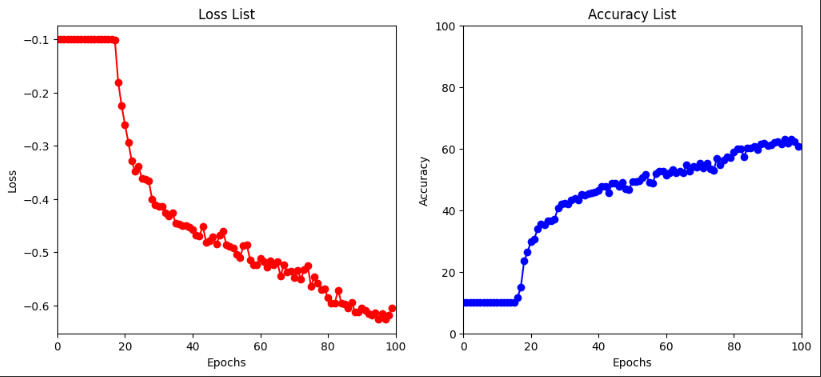

## Results of YourNet

The final results of YourNet with the hyperparameters of 100 epochs, 32 batch size, the learning rate of 0.0021206421108366574, and an SGD optimizer with a weight_decay of 5e-4 and a momentum of 0.85 is an accuracy of 61%. The YourNet model with these hyperparameters is the best model from HW7. This project aims to create a new modified model with more accuracy. So lots of changes need to be made to the model. Let's start with modifying the architecture.

For line-by-line result of code see HW7.


# Step 3 Modify Architecture

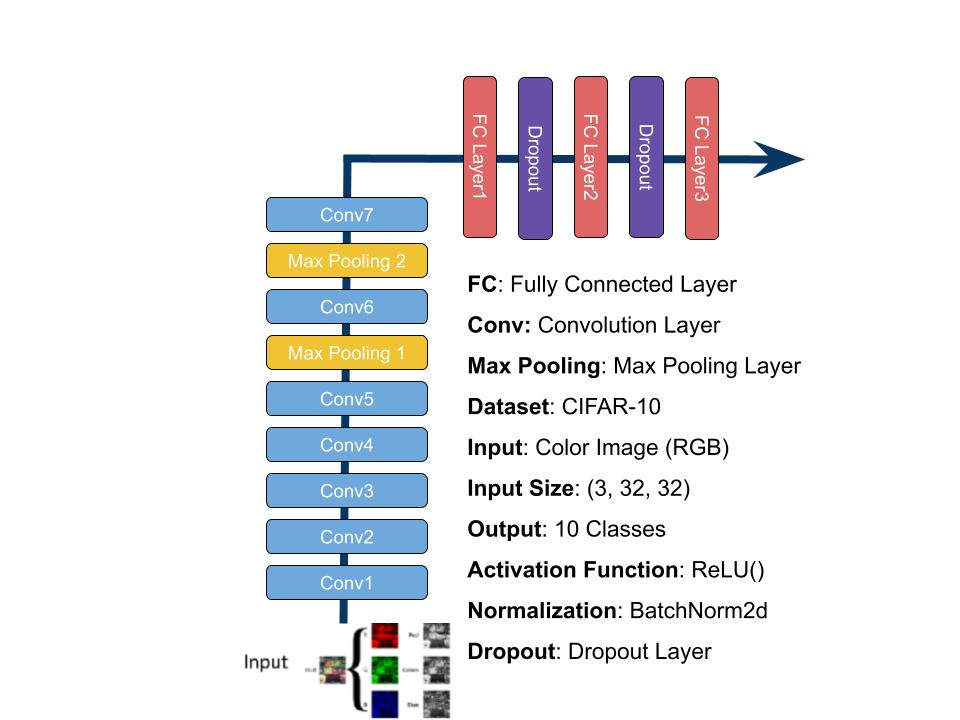

In [ ]:
class FinalNet(nn.Module):
    def __init__(self):
        super(FinalNet, self).__init__() 
        self.feature_extractor = nn.Sequential(  
            # Conv1        
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=11, stride=1, padding=5),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            # Conv2          
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            # Conv3        
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            # Conv4       
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # Conv5      
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # Max Pooling 1
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv6
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # Max Pooling 2
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv7
            nn.Conv2d(in_channels=128, out_channels=160, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
        )

        self.classifier = nn.Sequential(
            # FC Layer1
            nn.Linear(in_features=160, out_features=160),
            nn.ReLU(),
            nn.Dropout(0.5),
            # FC Layer2
            nn.Linear(in_features=160, out_features=64),
            nn.ReLU(),
            nn.Dropout(0.5),
            # FC Layer3
            nn.Linear(in_features=64, out_features=10),
        )

## Changes Made


Here are the differences between the FinalNet and YourNet architectures:

* FinalNet contains batch normalization layers after each convolution layer except the last one, while YourNet has no batch normalization layers.

* FinalNet has 7 convolution layers, while YourNet has 6.

* FinalNet has different numbers of output channels for different convolution layers 8, 16, 16, 32, 64, 128, and 160, while YourNet has 8, 16, 16, 16, 16, and 160 output channels for its convolution layers.

* FinalNet’s fourth convolution layer has a padding of 2, while YourNet has 0.

* FinalNet has three fully connected layers with dropout layers, while YourNet has two fully connected layers without any dropout layers.

These changes were created to increase the ability of the model to pick up on local patterns and not overfit. More convolutional layers have been seen to increase predictive ability (Jmour et al. 2018). The addition of batch normalization layers (Santurkar et al. 2018). The increasing parameters also can help in accuracy, while the dropout layers between the fully connected layers help prevent overfitting (Srivastava et al. 2014). These changes will likely increase the predictive ability of a model.


# Step 4 Add Learning Rate Scheduler and New Optimizer


## Add a Learning Rate Scheduler

In [ ]:
# Gamma is added as a hyperparameter
gamma = 0.1 # Default Value

# Define the Learning Rate Scheduler - MultiStepLR
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15, 30], gamma=gamma)

for epoch in range(1, epochs + 1):
    train(model, device, train_loader, optimizer, epoch)
    test_loss, correct = test(model, device, test_loader)
    scheduler.step() # This line implements the schedule after every epoch

A learning rate scheduler is added to a neural network model to adjust the learning rate. This allows for adaptive training, improving convergence speed and overall model accuracy. In addition, it helps prevent escaping from local minima or plateaus.


## Choosing a New Optimizer


In [ ]:
# Changing the Optimizer from SGD to Adam
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=5e-4)

The decision to replace the Stochastic Gradient Descent (SGD) optimizer with the Adaptive Moment Estimation (Adam) optimizer is practical. The reasoning is that Adam uses momentum and adaptive learning rates to induce faster convergence and improve model accuracy. Also, Adam is less sensitive to hyperparameter choices allowing for less optimization of hyperparameters to create a successful model.

# Step 5 Optimize Hyperparameters

This step aims to optimize the hyperparameters of batch size, learning rate, gamma, and droprate. To achieve this goal, Optuna will be used. Optuna is for hyperparameter optimization of the neural network (Akiba et al. 2019). In the program, the objective function trains the model with different hyperparameters suggested by Optuna for multiple trials. 

In [ ]:
%pip install optuna

[I 2023-04-14 21:35:02,831] A new study created in memory with name: no-name-07c784e2-3006-4238-9c78-52a1e008f0d0
<ipython-input-6-557cd31e57cc>:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-3)


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303242
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.302171

Test set: Average loss: -0.1085, Accuracy: 1688/10000 (17%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.297409
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.284138

Test set: Average loss: -0.1450, Accuracy: 1785/10000 (18%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.274225
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.248522

Test set: Average loss: -0.1756, Accuracy: 2127/10000 (21%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.239918
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.245357

Test set: Average loss: -0.2087, Accuracy: 2295/10000 (23%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 2.236518
Train Epoch: 5 [25900/50000 (52%)]	Loss: 2.234464

Test set: Average loss: -0.2279, Accuracy: 2433/10000 (24%)



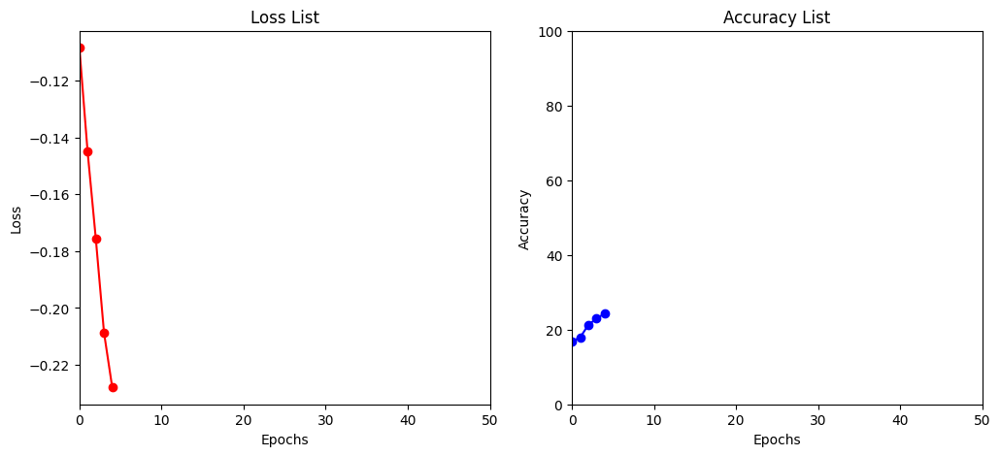

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.218901
Train Epoch: 6 [25900/50000 (52%)]	Loss: 2.210619

Test set: Average loss: -0.2403, Accuracy: 2565/10000 (26%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.202300
Train Epoch: 7 [25900/50000 (52%)]	Loss: 2.196913

Test set: Average loss: -0.2584, Accuracy: 2871/10000 (29%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.170085
Train Epoch: 8 [25900/50000 (52%)]	Loss: 2.191047

Test set: Average loss: -0.2792, Accuracy: 3137/10000 (31%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 2.202645
Train Epoch: 9 [25900/50000 (52%)]	Loss: 2.180733

Test set: Average loss: -0.2914, Accuracy: 3214/10000 (32%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 2.181114
Train Epoch: 10 [25900/50000 (52%)]	Loss: 2.160300

Test set: Average loss: -0.3115, Accuracy: 3312/10000 (33%)



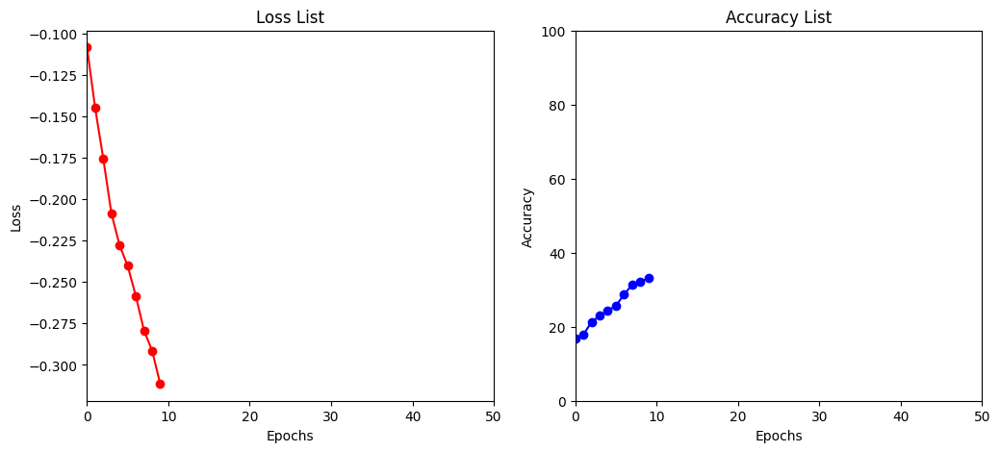

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.171326
Train Epoch: 11 [25900/50000 (52%)]	Loss: 2.193462

Test set: Average loss: -0.3236, Accuracy: 3394/10000 (34%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 2.163755
Train Epoch: 12 [25900/50000 (52%)]	Loss: 2.140374

Test set: Average loss: -0.3326, Accuracy: 3439/10000 (34%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 2.132963
Train Epoch: 13 [25900/50000 (52%)]	Loss: 2.144879

Test set: Average loss: -0.3372, Accuracy: 3458/10000 (35%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 2.153208
Train Epoch: 14 [25900/50000 (52%)]	Loss: 2.144101

Test set: Average loss: -0.3437, Accuracy: 3529/10000 (35%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 2.122967
Train Epoch: 15 [25900/50000 (52%)]	Loss: 2.106171

Test set: Average loss: -0.3552, Accuracy: 3644/10000 (36%)



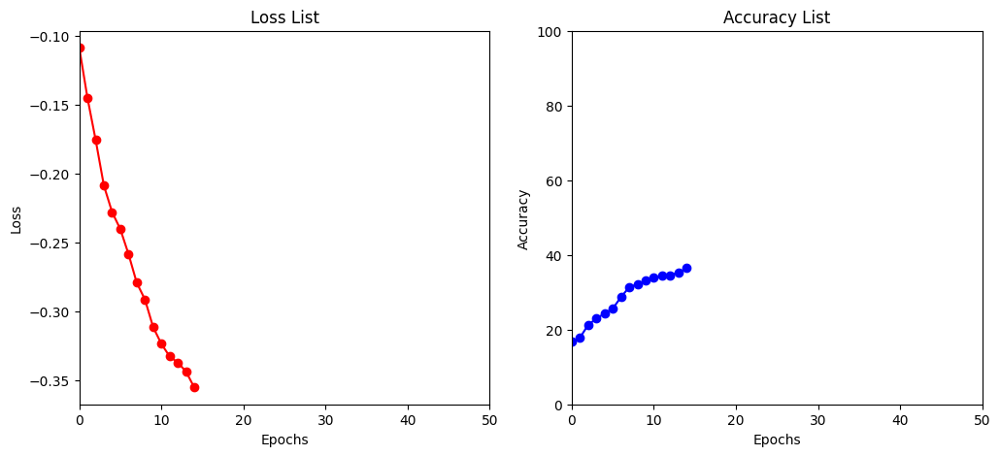

Train Epoch: 16 [0/50000 (0%)]	Loss: 2.152990
Train Epoch: 16 [25900/50000 (52%)]	Loss: 2.110417

Test set: Average loss: -0.3576, Accuracy: 3667/10000 (37%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 2.124601
Train Epoch: 17 [25900/50000 (52%)]	Loss: 2.129997

Test set: Average loss: -0.3592, Accuracy: 3682/10000 (37%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 2.105397
Train Epoch: 18 [25900/50000 (52%)]	Loss: 2.129546

Test set: Average loss: -0.3601, Accuracy: 3694/10000 (37%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 2.143691
Train Epoch: 19 [25900/50000 (52%)]	Loss: 2.116457

Test set: Average loss: -0.3607, Accuracy: 3698/10000 (37%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 2.132394
Train Epoch: 20 [25900/50000 (52%)]	Loss: 2.094112

Test set: Average loss: -0.3614, Accuracy: 3702/10000 (37%)



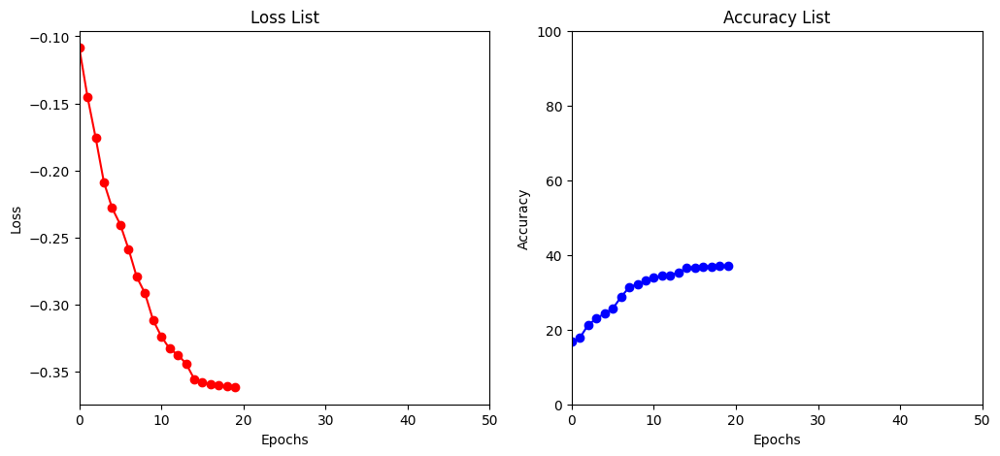

Train Epoch: 21 [0/50000 (0%)]	Loss: 2.122757
Train Epoch: 21 [25900/50000 (52%)]	Loss: 2.107543

Test set: Average loss: -0.3635, Accuracy: 3737/10000 (37%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 2.093891
Train Epoch: 22 [25900/50000 (52%)]	Loss: 2.151637

Test set: Average loss: -0.3632, Accuracy: 3723/10000 (37%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 2.135662
Train Epoch: 23 [25900/50000 (52%)]	Loss: 2.119501

Test set: Average loss: -0.3636, Accuracy: 3725/10000 (37%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 2.132467
Train Epoch: 24 [25900/50000 (52%)]	Loss: 2.146568

Test set: Average loss: -0.3648, Accuracy: 3738/10000 (37%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 2.098244
Train Epoch: 25 [25900/50000 (52%)]	Loss: 2.113168

Test set: Average loss: -0.3655, Accuracy: 3759/10000 (38%)



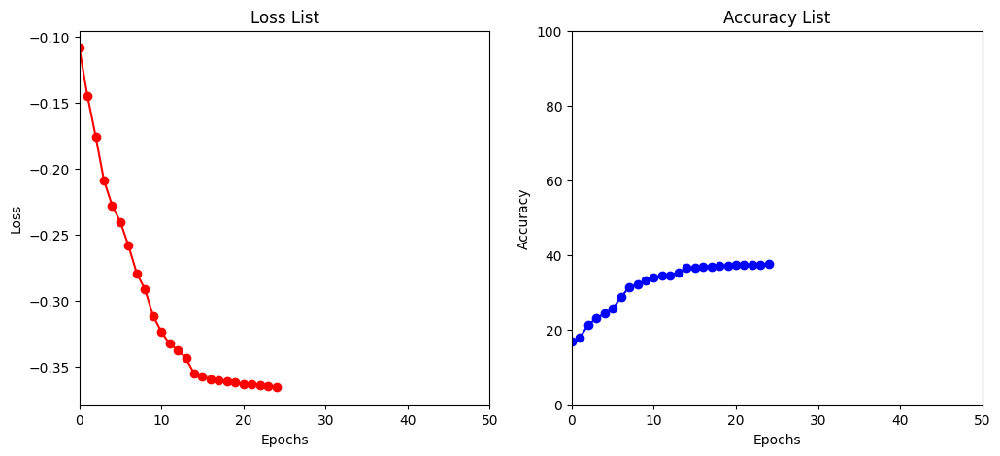

Train Epoch: 26 [0/50000 (0%)]	Loss: 2.119904
Train Epoch: 26 [25900/50000 (52%)]	Loss: 2.103487

Test set: Average loss: -0.3666, Accuracy: 3773/10000 (38%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 2.118284
Train Epoch: 27 [25900/50000 (52%)]	Loss: 2.113421

Test set: Average loss: -0.3677, Accuracy: 3773/10000 (38%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 2.113839
Train Epoch: 28 [25900/50000 (52%)]	Loss: 2.114542

Test set: Average loss: -0.3683, Accuracy: 3776/10000 (38%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 2.120510
Train Epoch: 29 [25900/50000 (52%)]	Loss: 2.122325

Test set: Average loss: -0.3696, Accuracy: 3788/10000 (38%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 2.123251
Train Epoch: 30 [25900/50000 (52%)]	Loss: 2.143180

Test set: Average loss: -0.3698, Accuracy: 3784/10000 (38%)



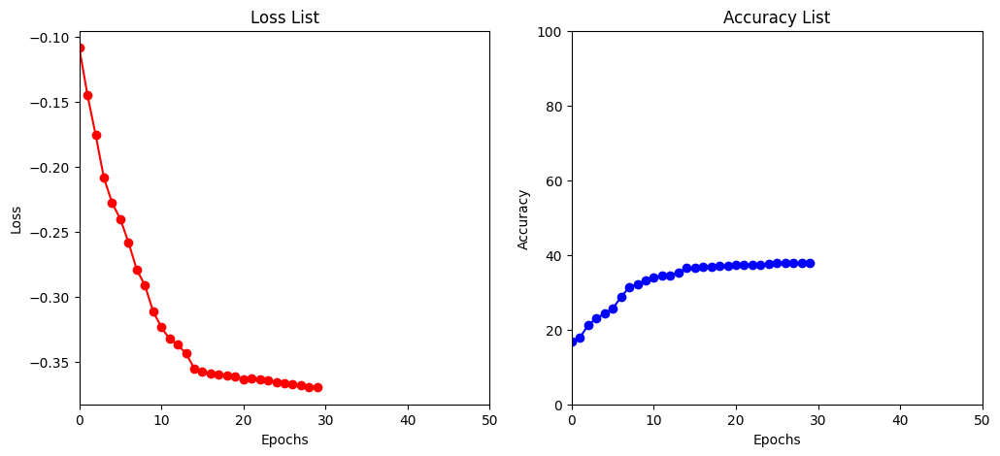

Train Epoch: 31 [0/50000 (0%)]	Loss: 2.106523
Train Epoch: 31 [25900/50000 (52%)]	Loss: 2.092817

Test set: Average loss: -0.3699, Accuracy: 3791/10000 (38%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 2.091357
Train Epoch: 32 [25900/50000 (52%)]	Loss: 2.129003

Test set: Average loss: -0.3696, Accuracy: 3794/10000 (38%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 2.133360
Train Epoch: 33 [25900/50000 (52%)]	Loss: 2.136601

Test set: Average loss: -0.3701, Accuracy: 3798/10000 (38%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 2.113003
Train Epoch: 34 [25900/50000 (52%)]	Loss: 2.098947

Test set: Average loss: -0.3701, Accuracy: 3802/10000 (38%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 2.118215
Train Epoch: 35 [25900/50000 (52%)]	Loss: 2.116875

Test set: Average loss: -0.3700, Accuracy: 3796/10000 (38%)



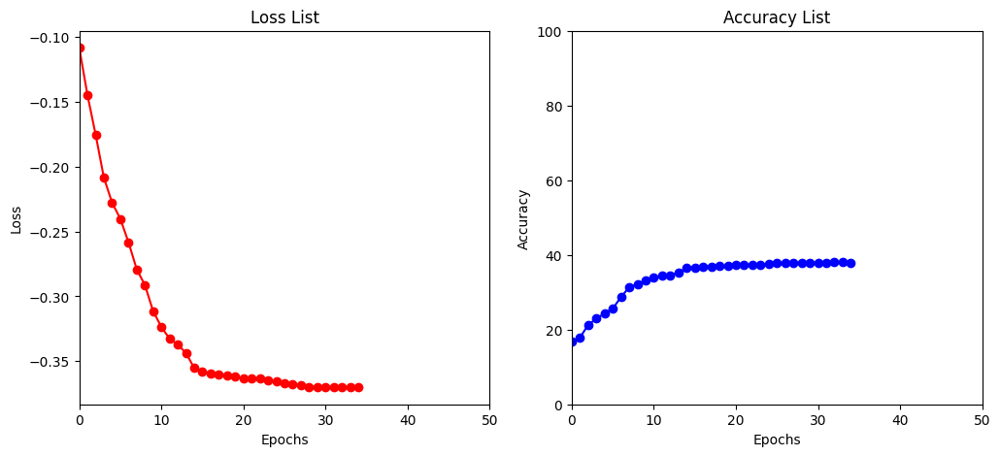

Train Epoch: 36 [0/50000 (0%)]	Loss: 2.110922
Train Epoch: 36 [25900/50000 (52%)]	Loss: 2.102054

Test set: Average loss: -0.3702, Accuracy: 3794/10000 (38%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 2.127600
Train Epoch: 37 [25900/50000 (52%)]	Loss: 2.086627

Test set: Average loss: -0.3699, Accuracy: 3793/10000 (38%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 2.127487
Train Epoch: 38 [25900/50000 (52%)]	Loss: 2.083386

Test set: Average loss: -0.3703, Accuracy: 3789/10000 (38%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 2.125950
Train Epoch: 39 [25900/50000 (52%)]	Loss: 2.112203

Test set: Average loss: -0.3703, Accuracy: 3795/10000 (38%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 2.122523
Train Epoch: 40 [25900/50000 (52%)]	Loss: 2.133458

Test set: Average loss: -0.3706, Accuracy: 3794/10000 (38%)



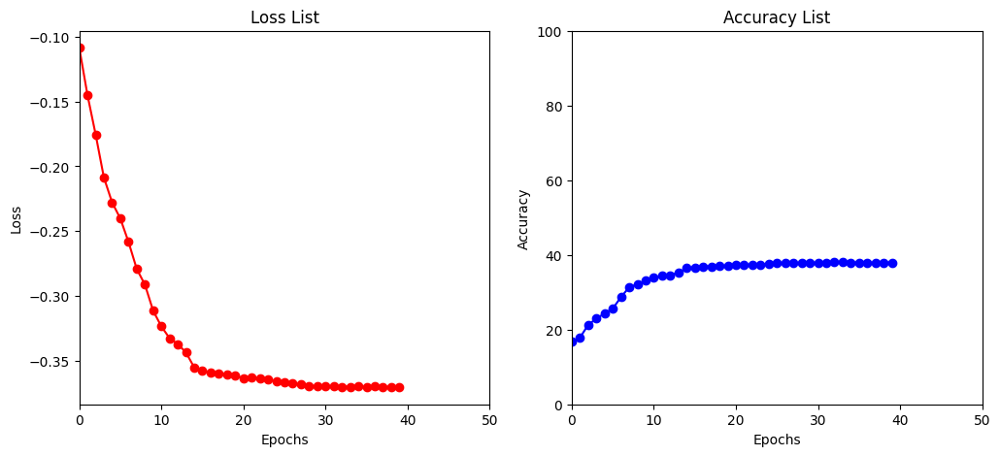

Train Epoch: 41 [0/50000 (0%)]	Loss: 2.119446
Train Epoch: 41 [25900/50000 (52%)]	Loss: 2.119727

Test set: Average loss: -0.3707, Accuracy: 3809/10000 (38%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 2.098721
Train Epoch: 42 [25900/50000 (52%)]	Loss: 2.094283

Test set: Average loss: -0.3706, Accuracy: 3797/10000 (38%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 2.114453
Train Epoch: 43 [25900/50000 (52%)]	Loss: 2.122383

Test set: Average loss: -0.3708, Accuracy: 3803/10000 (38%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 2.102215
Train Epoch: 44 [25900/50000 (52%)]	Loss: 2.122492

Test set: Average loss: -0.3706, Accuracy: 3801/10000 (38%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 2.076345
Train Epoch: 45 [25900/50000 (52%)]	Loss: 2.117435

Test set: Average loss: -0.3704, Accuracy: 3799/10000 (38%)



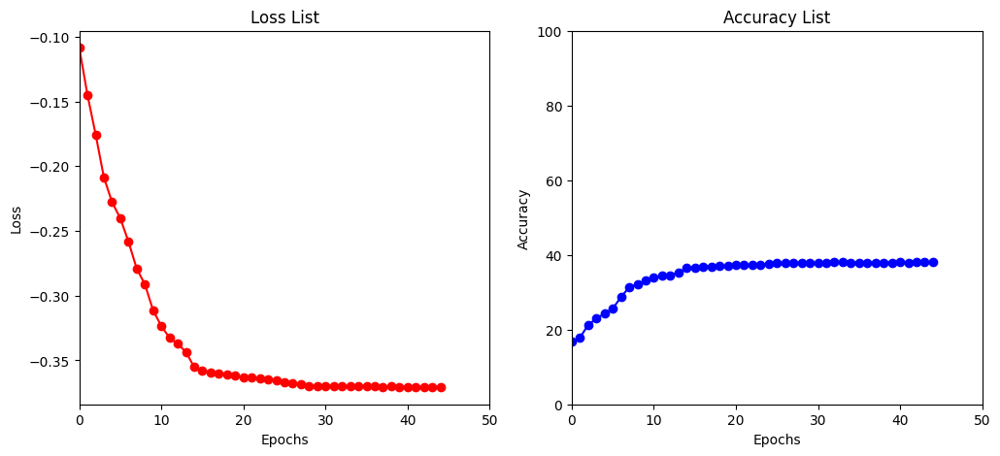

Train Epoch: 46 [0/50000 (0%)]	Loss: 2.124714
Train Epoch: 46 [25900/50000 (52%)]	Loss: 2.091449

Test set: Average loss: -0.3707, Accuracy: 3795/10000 (38%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 2.113601
Train Epoch: 47 [25900/50000 (52%)]	Loss: 2.133971

Test set: Average loss: -0.3706, Accuracy: 3793/10000 (38%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 2.121812
Train Epoch: 48 [25900/50000 (52%)]	Loss: 2.088767

Test set: Average loss: -0.3708, Accuracy: 3807/10000 (38%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 2.122061
Train Epoch: 49 [25900/50000 (52%)]	Loss: 2.104873

Test set: Average loss: -0.3711, Accuracy: 3818/10000 (38%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 2.124926
Train Epoch: 50 [25900/50000 (52%)]	Loss: 2.118391

Test set: Average loss: -0.3710, Accuracy: 3813/10000 (38%)



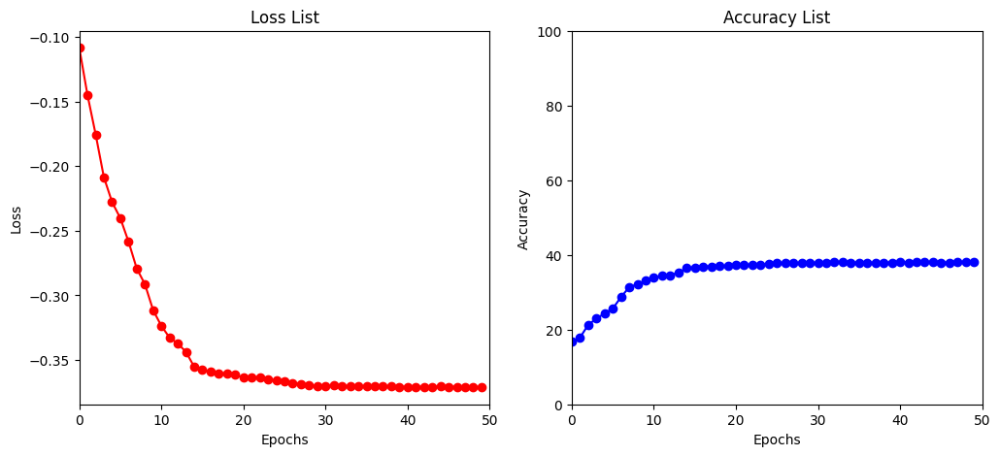

[I 2023-04-14 21:55:22,010] Trial 0 finished with value: -0.37100170707702634 and parameters: {'lr': 2.116603163992327e-05, 'batch_size': 518, 'gamma': 0.1, 'droprate': 0.6}. Best is trial 0 with value: -0.37100170707702634.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303566
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.274568
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.247279
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.208189

Test set: Average loss: -0.2402, Accuracy: 2640/10000 (26%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.199537
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.202471
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.156775
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.168985

Test set: Average loss: -0.3280, Accuracy: 3467/10000 (35%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.146713
Train Epoch: 3 [12800/50000 (26%)]	Loss: 2.083327
Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.112849
Train Epoch: 3 [38400/50000 (77%)]	Loss: 2.151107

Test set: Average loss: -0.3970, Accuracy: 4046/10000 (40%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.032387
Train Epoch: 4 [12800/50000 (26%)]	Loss: 2.047679
Train Epoch: 4 [25600/50000 (51%)]	Loss: 2.067503
Train Ep

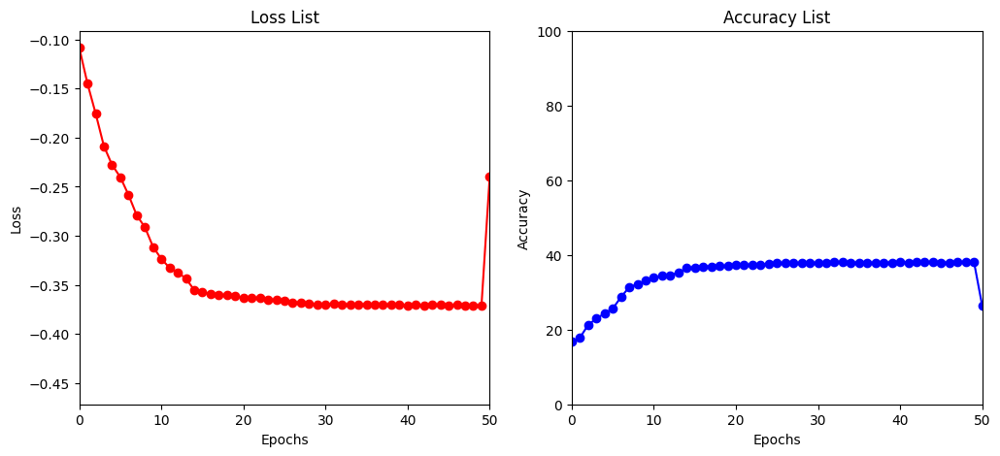

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.998542
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.037007
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.035910
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.023280

Test set: Average loss: -0.4225, Accuracy: 4262/10000 (43%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.065048
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.023430
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.030549
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.017495

Test set: Average loss: -0.4789, Accuracy: 4857/10000 (49%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.022776
Train Epoch: 8 [12800/50000 (26%)]	Loss: 2.002894
Train Epoch: 8 [25600/50000 (51%)]	Loss: 1.974635
Train Epoch: 8 [38400/50000 (77%)]	Loss: 1.960656

Test set: Average loss: -0.4798, Accuracy: 4854/10000 (49%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.964779
Train Epoch: 9 [12800/50000 (26%)]	Loss: 1.977267
Train Epoch: 9 [25600/50000 (51%)]	Loss: 1.968944
Train Epoch: 9 [38400/50000 (77%)]	Loss: 1.978122

Test set: Average loss: -0.4848, 

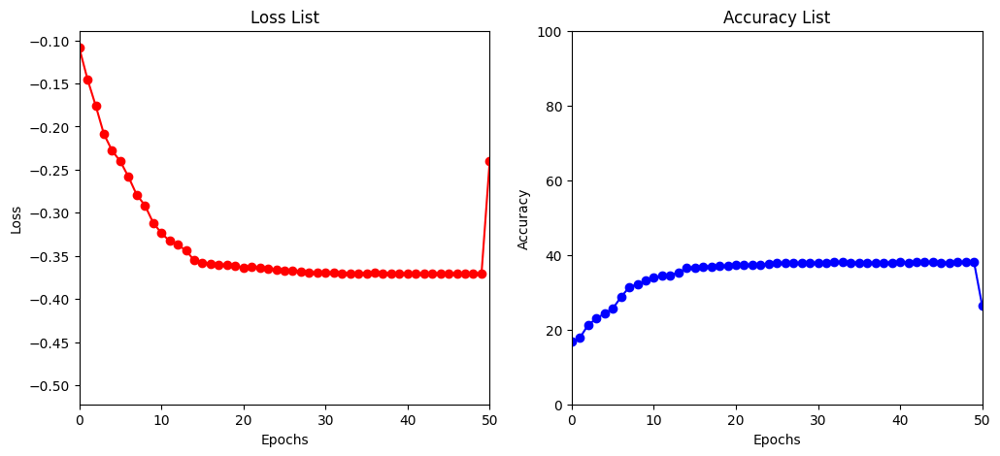

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.981322
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.994256
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.979170
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.942050

Test set: Average loss: -0.4989, Accuracy: 5031/10000 (50%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.974335
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.998649
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.985022
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.969127

Test set: Average loss: -0.4869, Accuracy: 4891/10000 (49%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.931764
Train Epoch: 13 [12800/50000 (26%)]	Loss: 1.983939
Train Epoch: 13 [25600/50000 (51%)]	Loss: 1.918077
Train Epoch: 13 [38400/50000 (77%)]	Loss: 2.002135

Test set: Average loss: -0.5218, Accuracy: 5266/10000 (53%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.943832
Train Epoch: 14 [12800/50000 (26%)]	Loss: 2.005130
Train Epoch: 14 [25600/50000 (51%)]	Loss: 1.942894
Train Epoch: 14 [38400/50000 (77%)]	Loss: 1.940502

Test set: Average

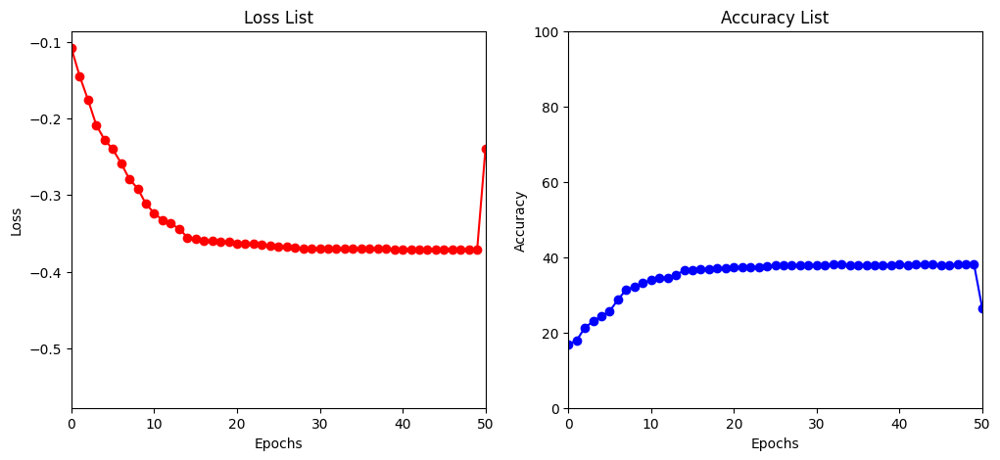

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.915424
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.910080
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.924861
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.942862

Test set: Average loss: -0.5828, Accuracy: 5902/10000 (59%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.847512
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.946907
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.855181
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.873122

Test set: Average loss: -0.5816, Accuracy: 5873/10000 (59%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.914001
Train Epoch: 18 [12800/50000 (26%)]	Loss: 1.866177
Train Epoch: 18 [25600/50000 (51%)]	Loss: 1.930415
Train Epoch: 18 [38400/50000 (77%)]	Loss: 1.857917

Test set: Average loss: -0.5871, Accuracy: 5930/10000 (59%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.946078
Train Epoch: 19 [12800/50000 (26%)]	Loss: 1.904817
Train Epoch: 19 [25600/50000 (51%)]	Loss: 1.933402
Train Epoch: 19 [38400/50000 (77%)]	Loss: 1.890330

Test set: Average

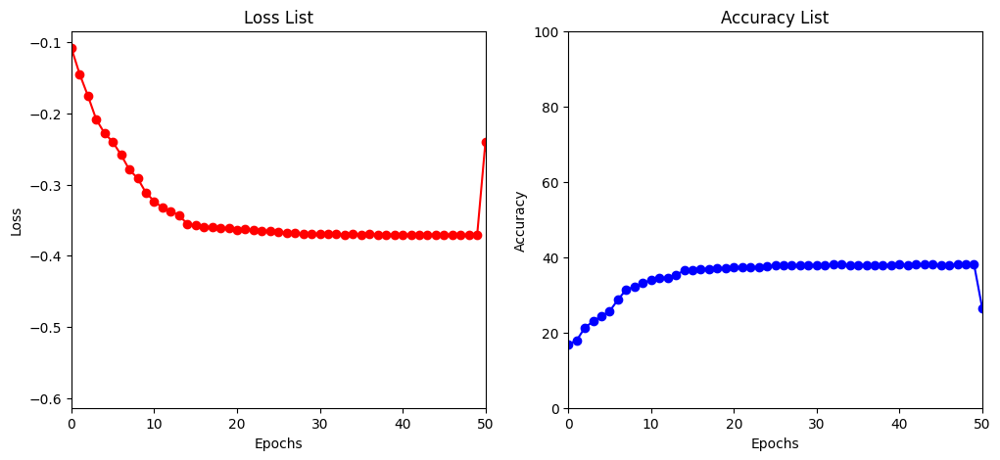

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.881585
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.900568
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.920254
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.876089

Test set: Average loss: -0.5896, Accuracy: 5969/10000 (60%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.932165
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.877503
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.915041
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.890103

Test set: Average loss: -0.5939, Accuracy: 5999/10000 (60%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.905713
Train Epoch: 23 [12800/50000 (26%)]	Loss: 1.904387
Train Epoch: 23 [25600/50000 (51%)]	Loss: 1.876717
Train Epoch: 23 [38400/50000 (77%)]	Loss: 1.906406

Test set: Average loss: -0.5944, Accuracy: 6004/10000 (60%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.905306
Train Epoch: 24 [12800/50000 (26%)]	Loss: 1.903733
Train Epoch: 24 [25600/50000 (51%)]	Loss: 1.847168
Train Epoch: 24 [38400/50000 (77%)]	Loss: 1.865194

Test set: Average

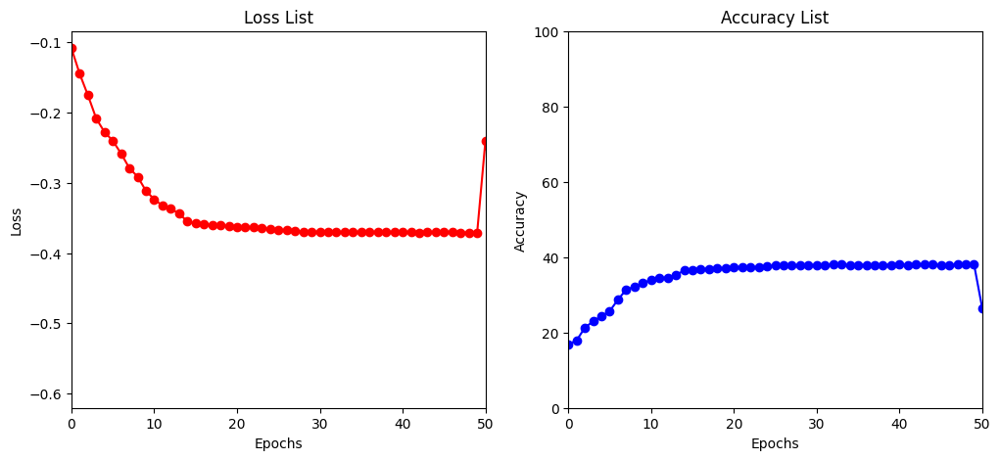

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.876909
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.836311
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.880890
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.889689

Test set: Average loss: -0.5961, Accuracy: 6010/10000 (60%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.885876
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.919503
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.884787
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.900374

Test set: Average loss: -0.5969, Accuracy: 6016/10000 (60%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.898892
Train Epoch: 28 [12800/50000 (26%)]	Loss: 1.855384
Train Epoch: 28 [25600/50000 (51%)]	Loss: 1.889882
Train Epoch: 28 [38400/50000 (77%)]	Loss: 1.878974

Test set: Average loss: -0.5981, Accuracy: 6030/10000 (60%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.867830
Train Epoch: 29 [12800/50000 (26%)]	Loss: 1.846570
Train Epoch: 29 [25600/50000 (51%)]	Loss: 1.845975
Train Epoch: 29 [38400/50000 (77%)]	Loss: 1.951001

Test set: Average

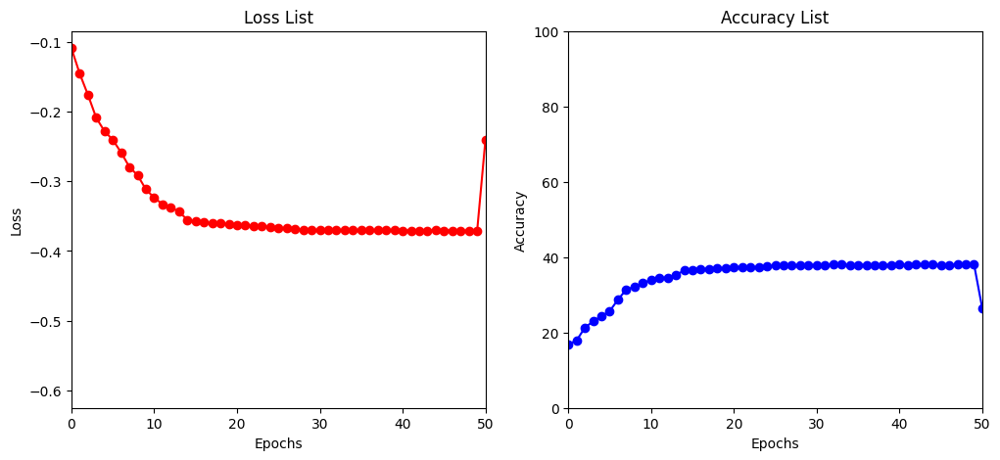

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.895350
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.918854
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.895893
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.831523

Test set: Average loss: -0.6018, Accuracy: 6068/10000 (61%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.911071
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.871912
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.889148
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.912723

Test set: Average loss: -0.6021, Accuracy: 6075/10000 (61%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.904018
Train Epoch: 33 [12800/50000 (26%)]	Loss: 1.861600
Train Epoch: 33 [25600/50000 (51%)]	Loss: 1.872387
Train Epoch: 33 [38400/50000 (77%)]	Loss: 1.856888

Test set: Average loss: -0.6027, Accuracy: 6094/10000 (61%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.852622
Train Epoch: 34 [12800/50000 (26%)]	Loss: 1.907877
Train Epoch: 34 [25600/50000 (51%)]	Loss: 1.869203
Train Epoch: 34 [38400/50000 (77%)]	Loss: 1.837478

Test set: Average

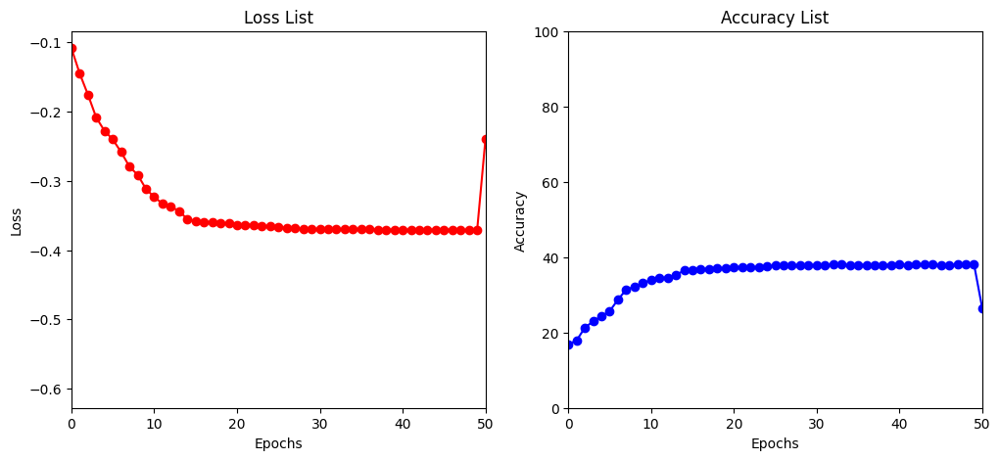

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.882262
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.874742
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.846412
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.875304

Test set: Average loss: -0.6029, Accuracy: 6083/10000 (61%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.866064
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.866409
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.913720
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.847702

Test set: Average loss: -0.6025, Accuracy: 6075/10000 (61%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.828807
Train Epoch: 38 [12800/50000 (26%)]	Loss: 1.888285
Train Epoch: 38 [25600/50000 (51%)]	Loss: 1.869055
Train Epoch: 38 [38400/50000 (77%)]	Loss: 1.877651

Test set: Average loss: -0.6021, Accuracy: 6084/10000 (61%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.870380
Train Epoch: 39 [12800/50000 (26%)]	Loss: 1.881163
Train Epoch: 39 [25600/50000 (51%)]	Loss: 1.879299
Train Epoch: 39 [38400/50000 (77%)]	Loss: 1.847509

Test set: Average

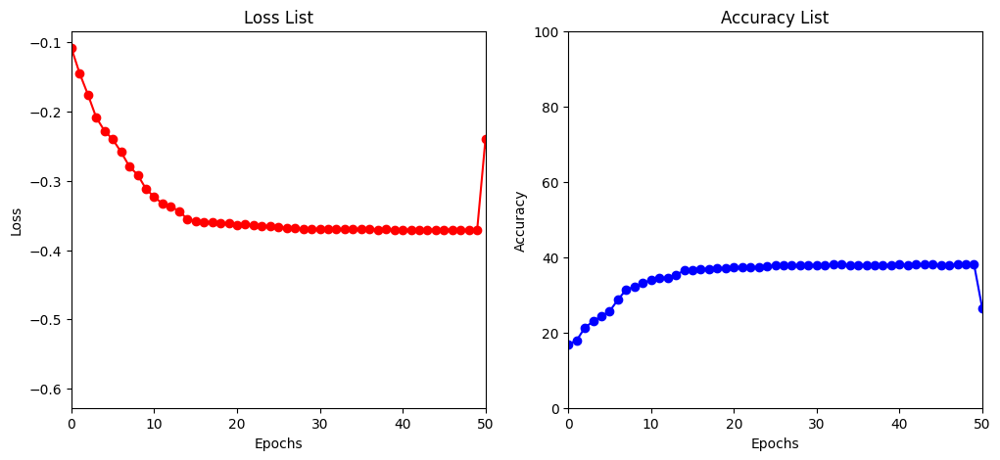

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.875458
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.892034
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.900699
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.898561

Test set: Average loss: -0.6039, Accuracy: 6095/10000 (61%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.879167
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.903196
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.838133
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.849975

Test set: Average loss: -0.6029, Accuracy: 6081/10000 (61%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.857019
Train Epoch: 43 [12800/50000 (26%)]	Loss: 1.912731
Train Epoch: 43 [25600/50000 (51%)]	Loss: 1.883810
Train Epoch: 43 [38400/50000 (77%)]	Loss: 1.889760

Test set: Average loss: -0.6029, Accuracy: 6078/10000 (61%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.834975
Train Epoch: 44 [12800/50000 (26%)]	Loss: 1.866886
Train Epoch: 44 [25600/50000 (51%)]	Loss: 1.818094
Train Epoch: 44 [38400/50000 (77%)]	Loss: 1.888032

Test set: Average

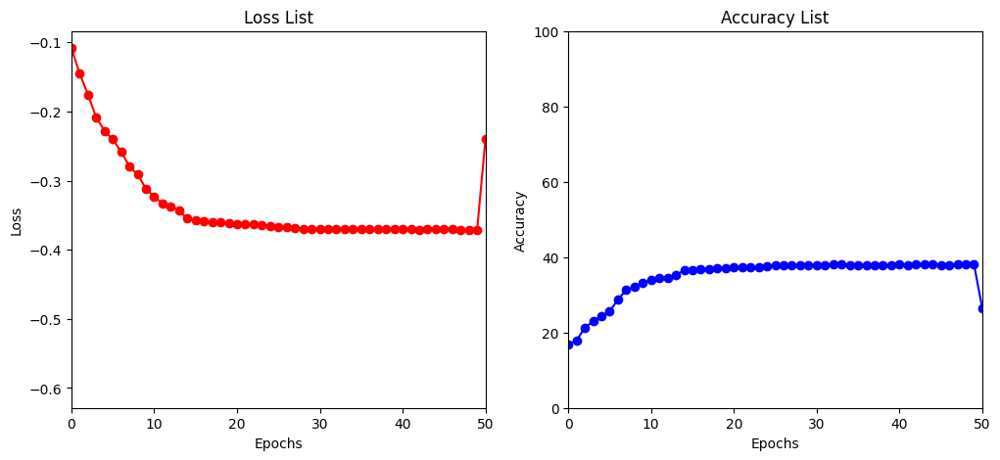

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.861688
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.856823
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.878470
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.877209

Test set: Average loss: -0.6036, Accuracy: 6090/10000 (61%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.831759
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.834215
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.851950
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.839306

Test set: Average loss: -0.6033, Accuracy: 6093/10000 (61%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.921974
Train Epoch: 48 [12800/50000 (26%)]	Loss: 1.905982
Train Epoch: 48 [25600/50000 (51%)]	Loss: 1.847932
Train Epoch: 48 [38400/50000 (77%)]	Loss: 1.830574

Test set: Average loss: -0.6031, Accuracy: 6077/10000 (61%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.880374
Train Epoch: 49 [12800/50000 (26%)]	Loss: 1.907977
Train Epoch: 49 [25600/50000 (51%)]	Loss: 1.861955
Train Epoch: 49 [38400/50000 (77%)]	Loss: 1.851717

Test set: Average

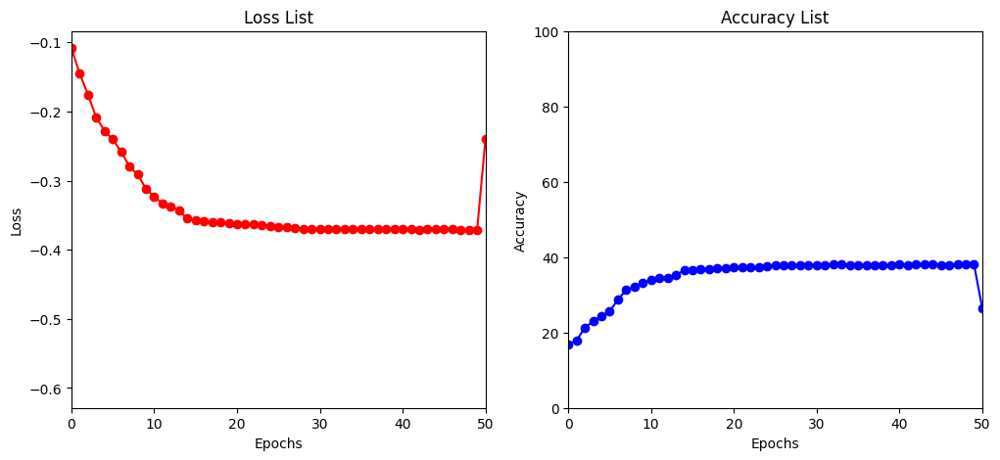

[I 2023-04-14 22:16:11,950] Trial 1 finished with value: -0.6037982577323914 and parameters: {'lr': 0.0001141057498419055, 'batch_size': 256, 'gamma': 0.1, 'droprate': 0.5}. Best is trial 1 with value: -0.6037982577323914.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303242
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.248547

Test set: Average loss: -0.2227, Accuracy: 2346/10000 (23%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.211975
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.199662

Test set: Average loss: -0.2731, Accuracy: 2920/10000 (29%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.143313
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.131919

Test set: Average loss: -0.3749, Accuracy: 3862/10000 (39%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.091716
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.110847

Test set: Average loss: -0.4314, Accuracy: 4379/10000 (44%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 2.056491
Train Epoch: 5 [25900/50000 (52%)]	Loss: 2.031297

Test set: Average loss: -0.4298, Accuracy: 4333/10000 (43%)



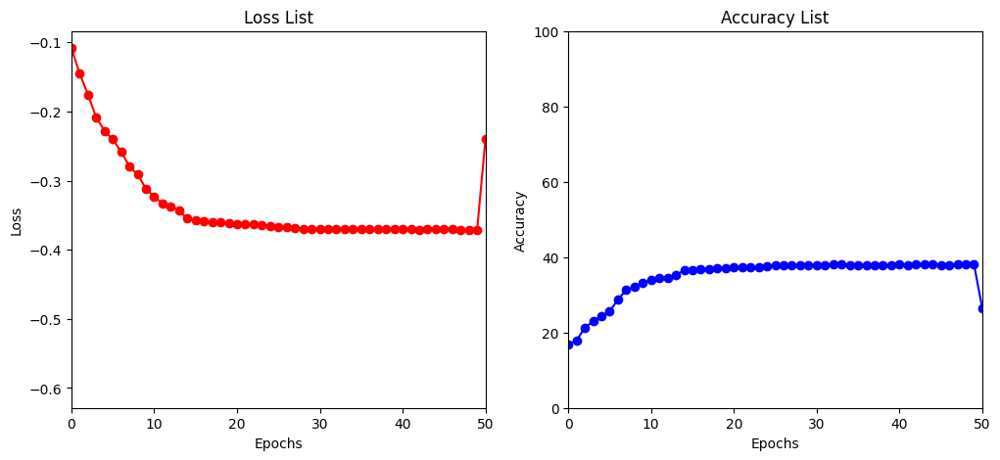

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.032221
Train Epoch: 6 [25900/50000 (52%)]	Loss: 2.029275

Test set: Average loss: -0.4617, Accuracy: 4662/10000 (47%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.030901
Train Epoch: 7 [25900/50000 (52%)]	Loss: 2.009467

Test set: Average loss: -0.4760, Accuracy: 4815/10000 (48%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.998494
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.995216

Test set: Average loss: -0.4858, Accuracy: 4874/10000 (49%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.981165
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.963798

Test set: Average loss: -0.4574, Accuracy: 4596/10000 (46%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.957754
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.954429

Test set: Average loss: -0.4876, Accuracy: 4901/10000 (49%)



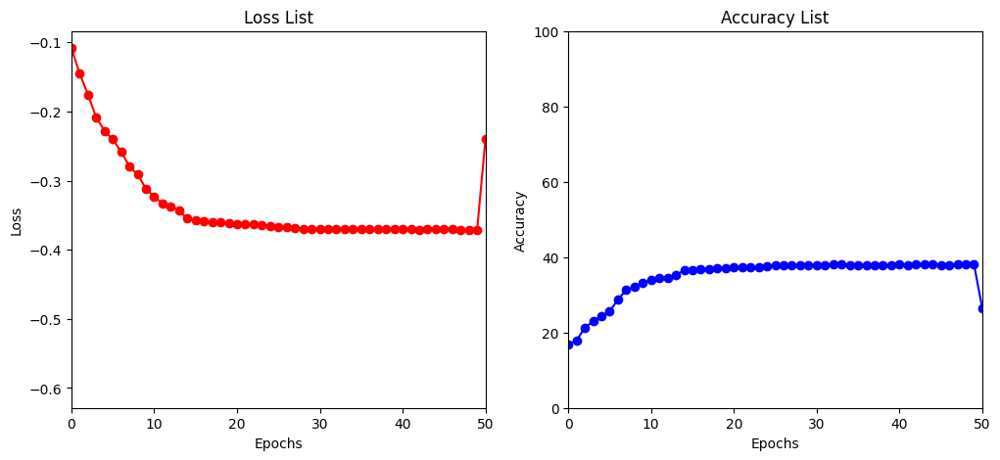

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.961789
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.958534

Test set: Average loss: -0.5440, Accuracy: 5451/10000 (55%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.905512
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.930602

Test set: Average loss: -0.5611, Accuracy: 5626/10000 (56%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.918074
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.900329

Test set: Average loss: -0.5448, Accuracy: 5499/10000 (55%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.925664
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.893438

Test set: Average loss: -0.5487, Accuracy: 5508/10000 (55%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.912766
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.886053

Test set: Average loss: -0.5785, Accuracy: 5815/10000 (58%)



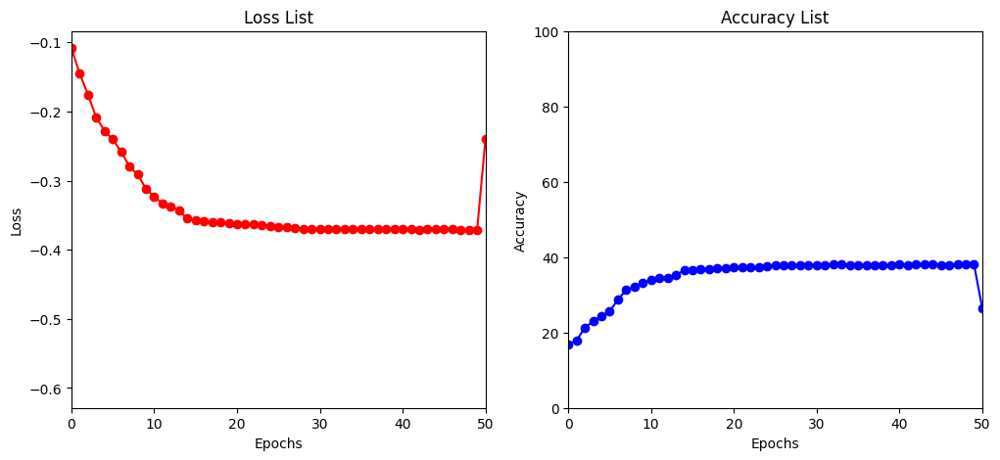

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.875150
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.889339

Test set: Average loss: -0.6171, Accuracy: 6204/10000 (62%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.844611
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.857146

Test set: Average loss: -0.6227, Accuracy: 6257/10000 (63%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.816477
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.871615

Test set: Average loss: -0.6226, Accuracy: 6254/10000 (63%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.882317
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.845379

Test set: Average loss: -0.6236, Accuracy: 6248/10000 (62%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.846900
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.857251

Test set: Average loss: -0.6266, Accuracy: 6298/10000 (63%)



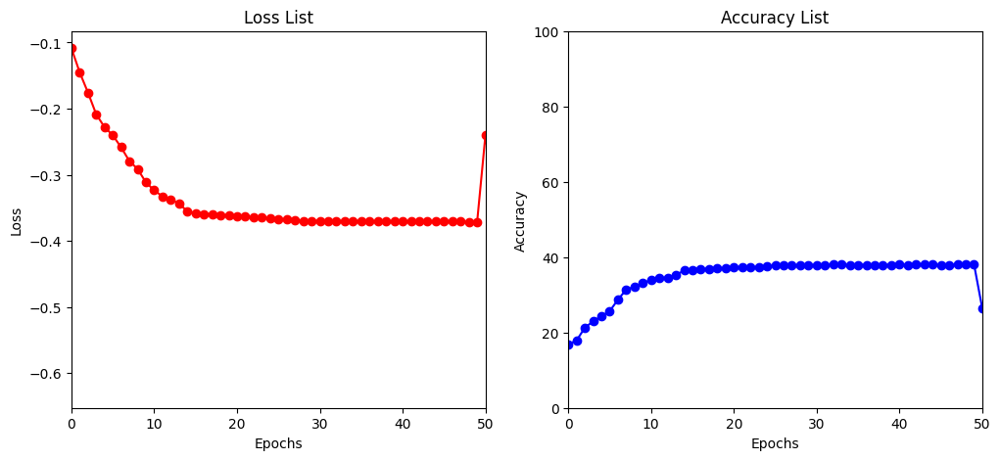

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.851300
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.877137

Test set: Average loss: -0.6306, Accuracy: 6349/10000 (63%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.860109
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.876281

Test set: Average loss: -0.6322, Accuracy: 6357/10000 (64%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.865954
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.846851

Test set: Average loss: -0.6307, Accuracy: 6330/10000 (63%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.881183
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.896942

Test set: Average loss: -0.6348, Accuracy: 6383/10000 (64%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.827885
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.837894

Test set: Average loss: -0.6360, Accuracy: 6393/10000 (64%)



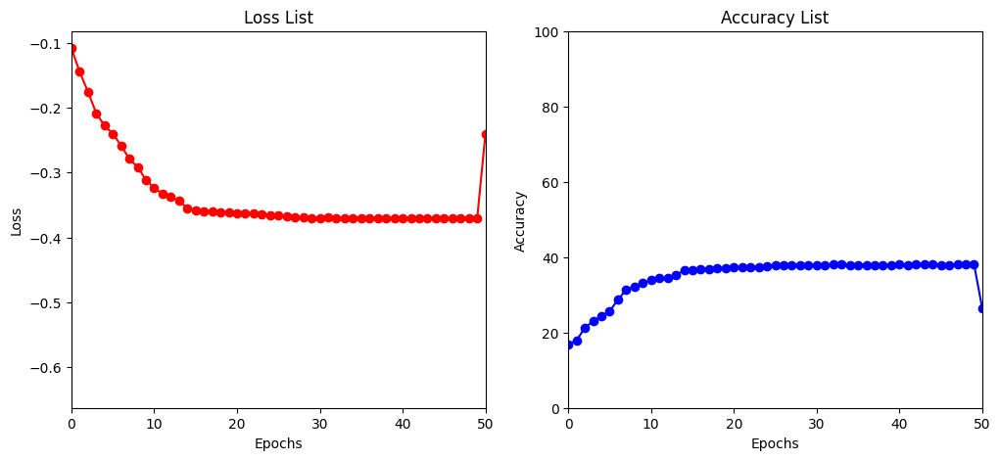

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.874379
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.839861

Test set: Average loss: -0.6342, Accuracy: 6364/10000 (64%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.856034
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.808975

Test set: Average loss: -0.6362, Accuracy: 6404/10000 (64%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.843807
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.837469

Test set: Average loss: -0.6395, Accuracy: 6432/10000 (64%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.821137
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.815767

Test set: Average loss: -0.6405, Accuracy: 6444/10000 (64%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.858311
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.842654

Test set: Average loss: -0.6391, Accuracy: 6417/10000 (64%)



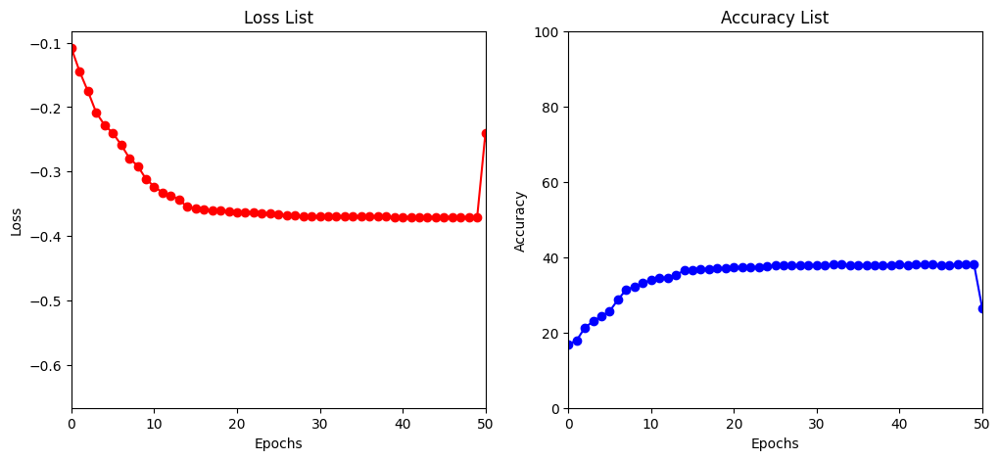

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.845344
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.823554

Test set: Average loss: -0.6416, Accuracy: 6443/10000 (64%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.843971
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.827318

Test set: Average loss: -0.6426, Accuracy: 6463/10000 (65%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.846346
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.837687

Test set: Average loss: -0.6433, Accuracy: 6479/10000 (65%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.841909
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.844806

Test set: Average loss: -0.6445, Accuracy: 6483/10000 (65%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.830824
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.857549

Test set: Average loss: -0.6445, Accuracy: 6493/10000 (65%)



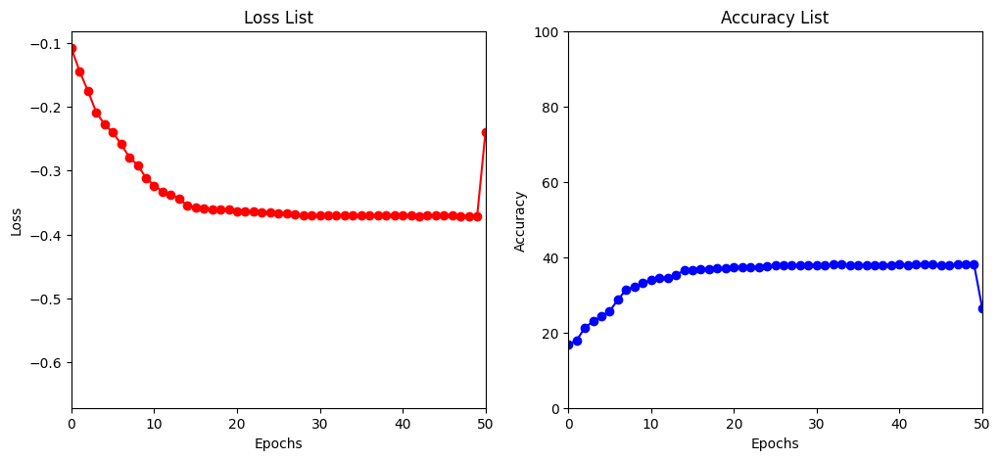

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.819214
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.805928

Test set: Average loss: -0.6440, Accuracy: 6473/10000 (65%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.858090
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.836434

Test set: Average loss: -0.6440, Accuracy: 6468/10000 (65%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.798294
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.801333

Test set: Average loss: -0.6443, Accuracy: 6469/10000 (65%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.830098
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.832513

Test set: Average loss: -0.6445, Accuracy: 6478/10000 (65%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.842801
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.828770

Test set: Average loss: -0.6445, Accuracy: 6466/10000 (65%)



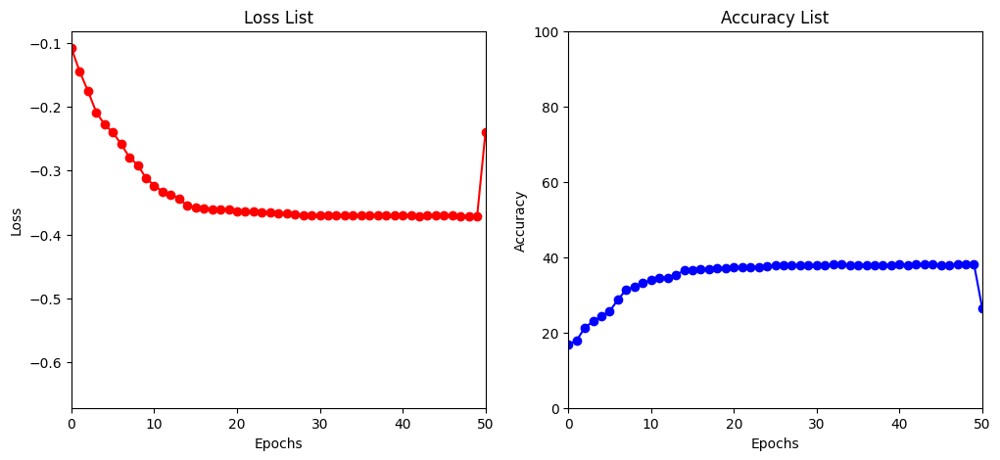

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.834082
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.840167

Test set: Average loss: -0.6459, Accuracy: 6487/10000 (65%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.847933
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.799892

Test set: Average loss: -0.6450, Accuracy: 6480/10000 (65%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.833494
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.849331

Test set: Average loss: -0.6457, Accuracy: 6486/10000 (65%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.785553
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.827110

Test set: Average loss: -0.6463, Accuracy: 6490/10000 (65%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.807430
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.802815

Test set: Average loss: -0.6460, Accuracy: 6493/10000 (65%)



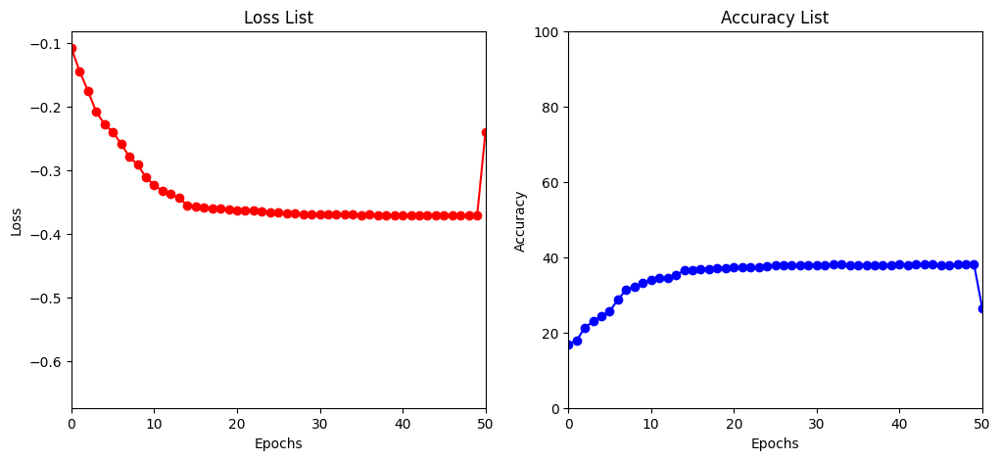

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.825941
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.802051

Test set: Average loss: -0.6458, Accuracy: 6479/10000 (65%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.800881
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.861928

Test set: Average loss: -0.6456, Accuracy: 6488/10000 (65%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.824066
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.818977

Test set: Average loss: -0.6464, Accuracy: 6497/10000 (65%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.825757
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.801722

Test set: Average loss: -0.6463, Accuracy: 6497/10000 (65%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.831089
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.862855

Test set: Average loss: -0.6464, Accuracy: 6492/10000 (65%)



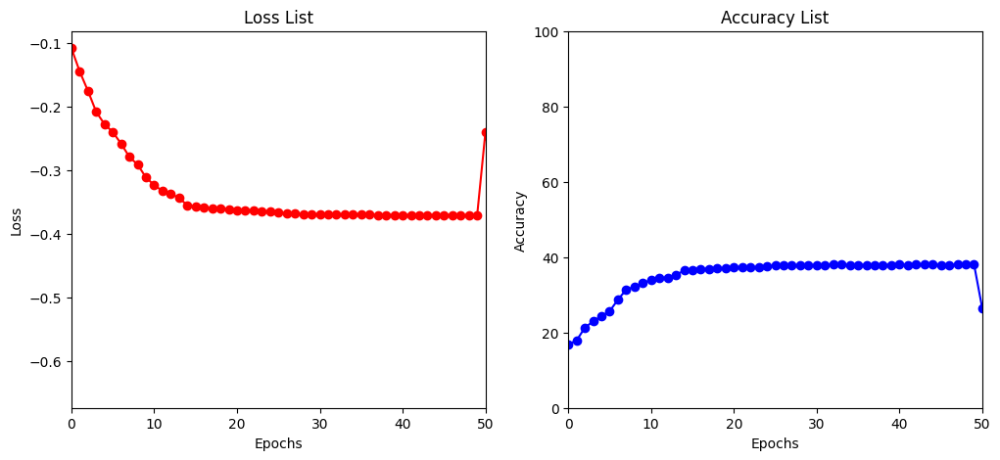

[I 2023-04-14 22:36:35,989] Trial 2 finished with value: -0.6463891822814941 and parameters: {'lr': 0.0002640387466592871, 'batch_size': 518, 'gamma': 0.12, 'droprate': 0.6}. Best is trial 2 with value: -0.6463891822814941.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303166
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.221934

Test set: Average loss: -0.2462, Accuracy: 2593/10000 (26%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.185399
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.153461

Test set: Average loss: -0.3178, Accuracy: 3211/10000 (32%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.101246
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.080404

Test set: Average loss: -0.3777, Accuracy: 3837/10000 (38%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.065459
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.029333

Test set: Average loss: -0.4489, Accuracy: 4554/10000 (46%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 2.058102
Train Epoch: 5 [25900/50000 (52%)]	Loss: 2.030969

Test set: Average loss: -0.4582, Accuracy: 4636/10000 (46%)



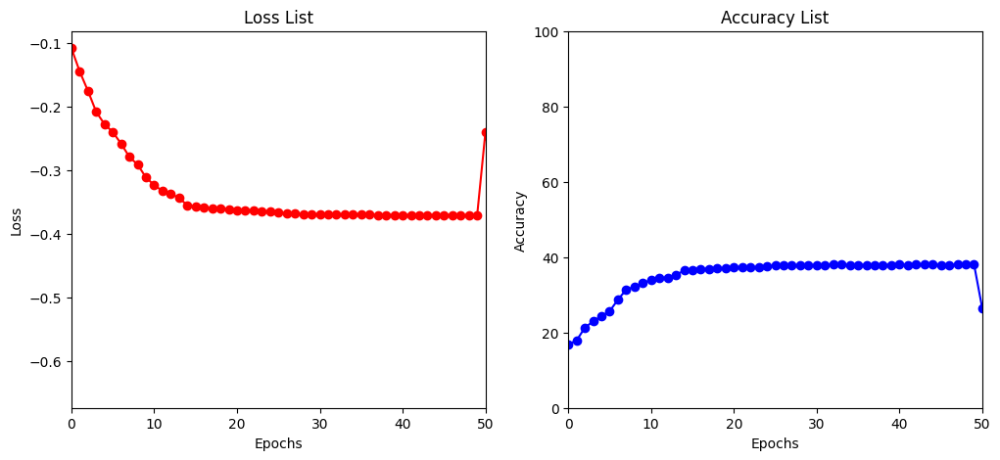

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.999275
Train Epoch: 6 [25900/50000 (52%)]	Loss: 2.022860

Test set: Average loss: -0.4792, Accuracy: 4825/10000 (48%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.991753
Train Epoch: 7 [25900/50000 (52%)]	Loss: 1.972549

Test set: Average loss: -0.4824, Accuracy: 4859/10000 (49%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.988894
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.967433

Test set: Average loss: -0.4874, Accuracy: 4933/10000 (49%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.983345
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.966527

Test set: Average loss: -0.4844, Accuracy: 4891/10000 (49%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.933928
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.947344

Test set: Average loss: -0.5229, Accuracy: 5257/10000 (53%)



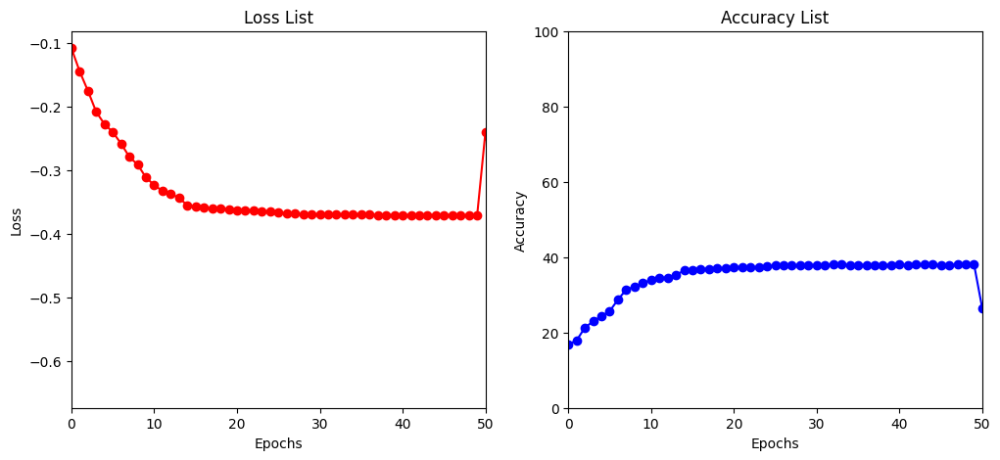

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.993552
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.965865

Test set: Average loss: -0.5213, Accuracy: 5253/10000 (53%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.960254
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.953131

Test set: Average loss: -0.5222, Accuracy: 5254/10000 (53%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.930282
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.918518

Test set: Average loss: -0.5449, Accuracy: 5499/10000 (55%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.940504
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.911320

Test set: Average loss: -0.5404, Accuracy: 5441/10000 (54%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.915029
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.914679

Test set: Average loss: -0.5557, Accuracy: 5591/10000 (56%)



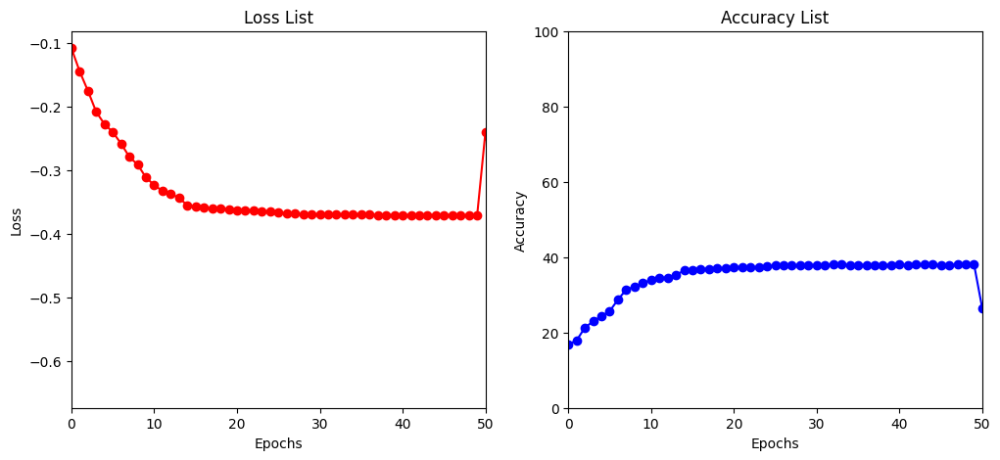

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.916928
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.878555

Test set: Average loss: -0.6133, Accuracy: 6171/10000 (62%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.875528
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.887965

Test set: Average loss: -0.6158, Accuracy: 6185/10000 (62%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.831285
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.861535

Test set: Average loss: -0.6202, Accuracy: 6247/10000 (62%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.882668
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.819606

Test set: Average loss: -0.6241, Accuracy: 6292/10000 (63%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.831196
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.877304

Test set: Average loss: -0.6267, Accuracy: 6304/10000 (63%)



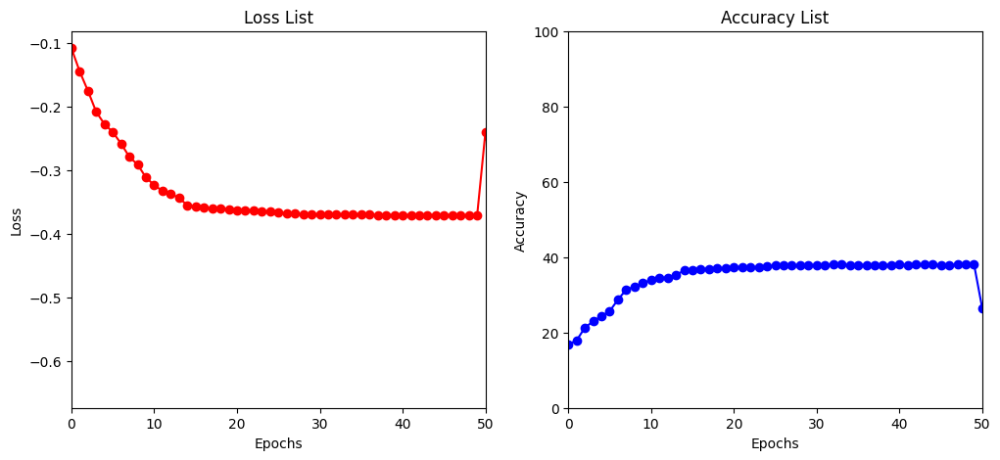

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.822053
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.866594

Test set: Average loss: -0.6261, Accuracy: 6306/10000 (63%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.856521
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.842325

Test set: Average loss: -0.6268, Accuracy: 6315/10000 (63%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.882424
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.840598

Test set: Average loss: -0.6277, Accuracy: 6328/10000 (63%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.854949
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.865531

Test set: Average loss: -0.6348, Accuracy: 6400/10000 (64%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.830286
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.846982

Test set: Average loss: -0.6373, Accuracy: 6429/10000 (64%)



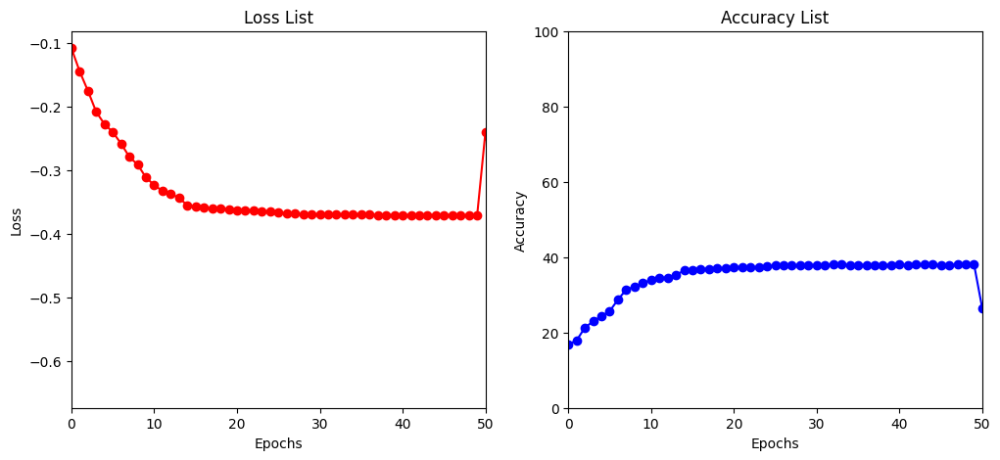

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.865916
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.847968

Test set: Average loss: -0.6408, Accuracy: 6447/10000 (64%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.836776
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.843735

Test set: Average loss: -0.6428, Accuracy: 6470/10000 (65%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.842665
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.828395

Test set: Average loss: -0.6405, Accuracy: 6453/10000 (65%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.806800
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.800231

Test set: Average loss: -0.6448, Accuracy: 6497/10000 (65%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.833168
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.852919

Test set: Average loss: -0.6472, Accuracy: 6512/10000 (65%)



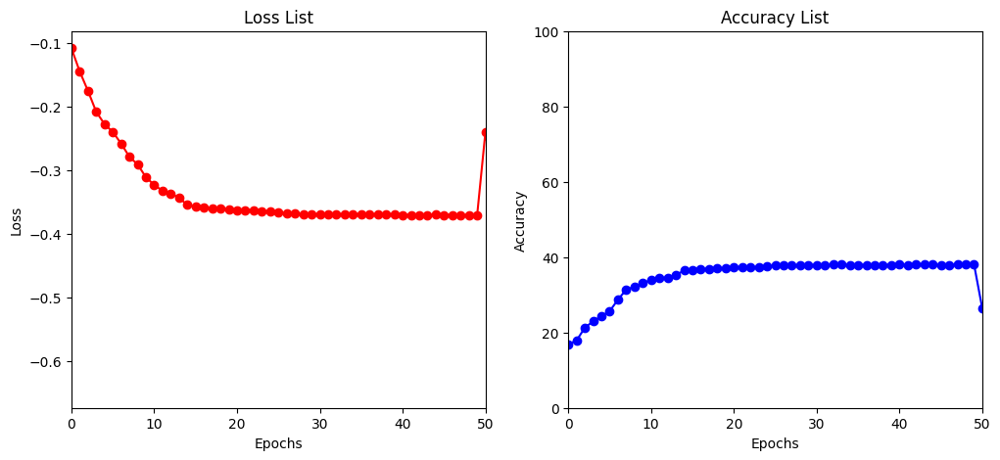

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.836704
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.816389

Test set: Average loss: -0.6502, Accuracy: 6537/10000 (65%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.843708
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.831584

Test set: Average loss: -0.6501, Accuracy: 6542/10000 (65%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.853651
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.823055

Test set: Average loss: -0.6511, Accuracy: 6548/10000 (65%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.831071
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.826786

Test set: Average loss: -0.6507, Accuracy: 6537/10000 (65%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.827870
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.849465

Test set: Average loss: -0.6510, Accuracy: 6555/10000 (66%)



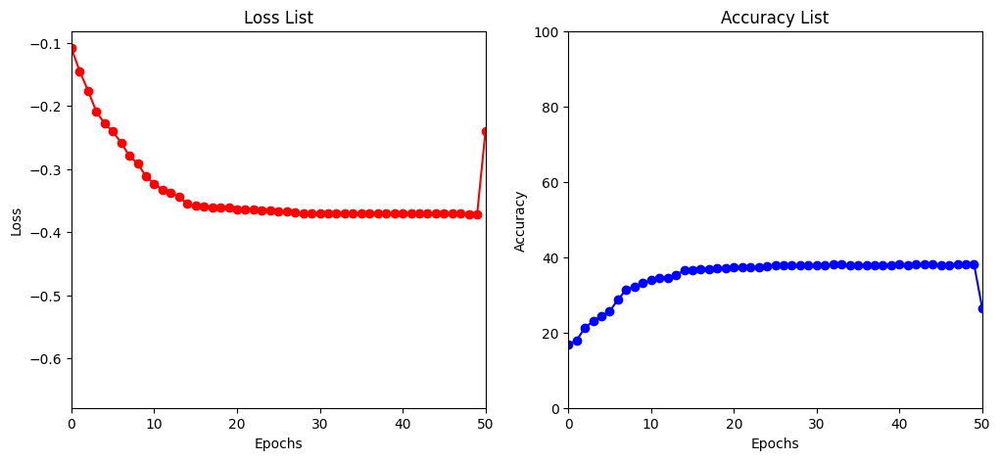

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.791692
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.801969

Test set: Average loss: -0.6514, Accuracy: 6555/10000 (66%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.848377
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.825598

Test set: Average loss: -0.6507, Accuracy: 6548/10000 (65%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.780306
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.787906

Test set: Average loss: -0.6516, Accuracy: 6563/10000 (66%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.798550
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.815633

Test set: Average loss: -0.6514, Accuracy: 6560/10000 (66%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.843272
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.784212

Test set: Average loss: -0.6519, Accuracy: 6557/10000 (66%)



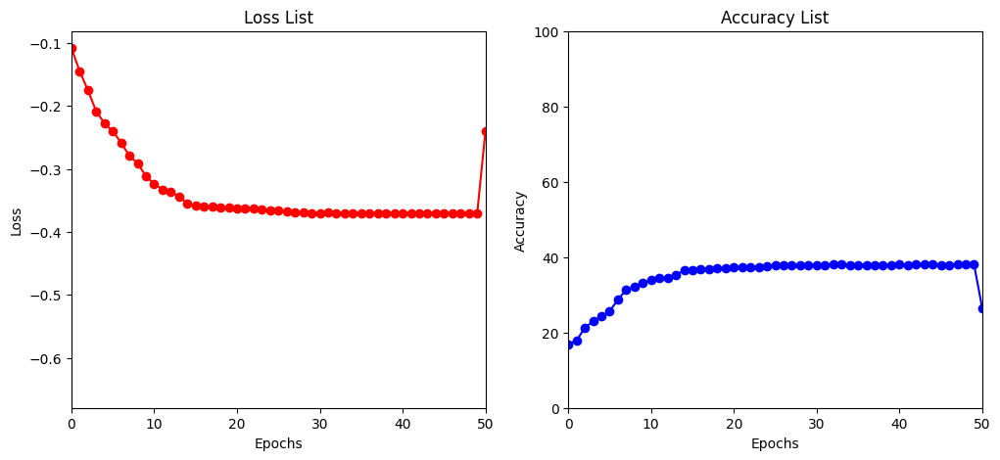

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.840513
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.826264

Test set: Average loss: -0.6531, Accuracy: 6572/10000 (66%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.816304
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.798742

Test set: Average loss: -0.6531, Accuracy: 6571/10000 (66%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.826747
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.810887

Test set: Average loss: -0.6532, Accuracy: 6572/10000 (66%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.772867
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.814061

Test set: Average loss: -0.6536, Accuracy: 6573/10000 (66%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.808474
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.809339

Test set: Average loss: -0.6526, Accuracy: 6567/10000 (66%)



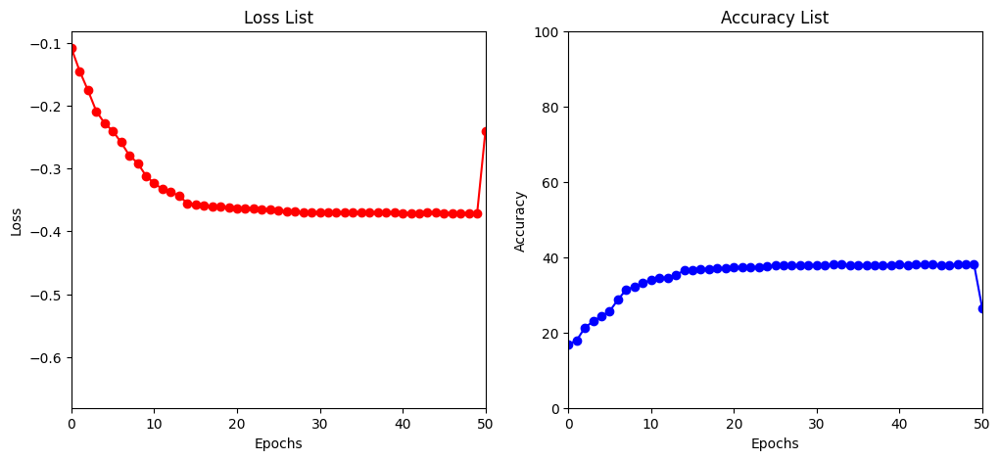

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.812372
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.785867

Test set: Average loss: -0.6532, Accuracy: 6569/10000 (66%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.795825
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.840976

Test set: Average loss: -0.6528, Accuracy: 6565/10000 (66%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.838533
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.816931

Test set: Average loss: -0.6532, Accuracy: 6569/10000 (66%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.809753
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.802080

Test set: Average loss: -0.6539, Accuracy: 6583/10000 (66%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.831414
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.842914

Test set: Average loss: -0.6540, Accuracy: 6579/10000 (66%)



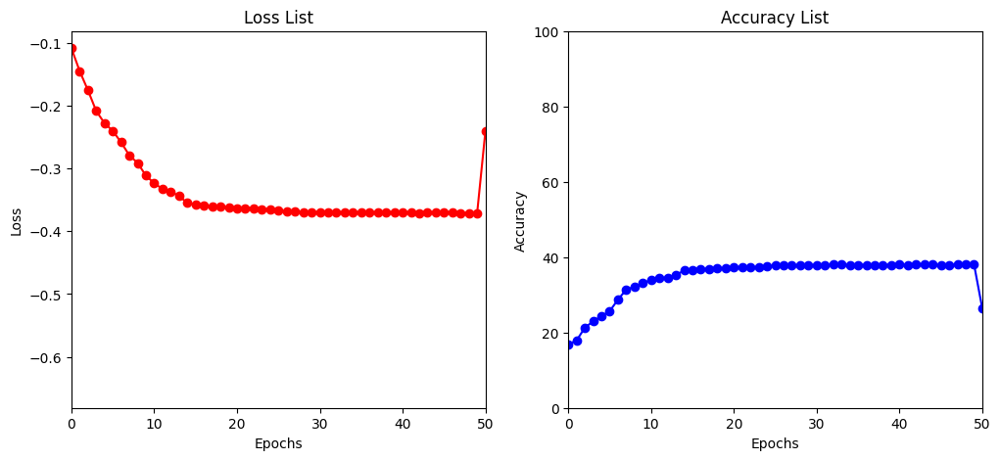

[I 2023-04-14 22:56:59,648] Trial 3 finished with value: -0.6539759750366211 and parameters: {'lr': 0.0006658215535118438, 'batch_size': 518, 'gamma': 0.1, 'droprate': 0.5}. Best is trial 3 with value: -0.6539759750366211.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303130
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.286954
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.243494
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.208794

Test set: Average loss: -0.2434, Accuracy: 2703/10000 (27%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.184242
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.204261
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.139712
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.160767

Test set: Average loss: -0.3397, Accuracy: 3638/10000 (36%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.136913
Train Epoch: 3 [12800/50000 (26%)]	Loss: 2.060977
Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.091132
Train Epoch: 3 [38400/50000 (77%)]	Loss: 2.127532

Test set: Average loss: -0.4159, Accuracy: 4268/10000 (43%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.005803
Train Epoch: 4 [12800/50000 (26%)]	Loss: 2.069144
Train Epoch: 4 [25600/50000 (51%)]	Loss: 2.068798
Train Ep

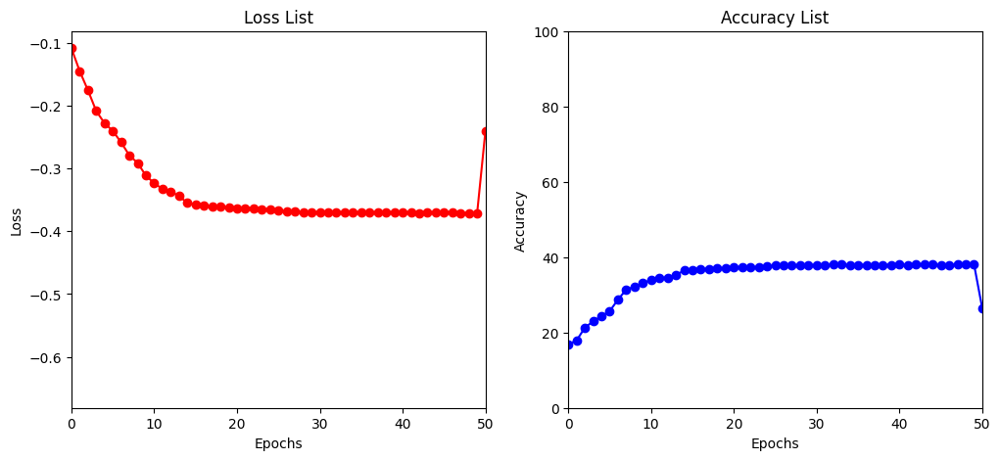

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.995241
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.034013
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.035687
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.049566

Test set: Average loss: -0.4472, Accuracy: 4524/10000 (45%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.040711
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.000372
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.029754
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.006562

Test set: Average loss: -0.4790, Accuracy: 4837/10000 (48%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.993552
Train Epoch: 8 [12800/50000 (26%)]	Loss: 2.019355
Train Epoch: 8 [25600/50000 (51%)]	Loss: 1.965280
Train Epoch: 8 [38400/50000 (77%)]	Loss: 1.971596

Test set: Average loss: -0.4783, Accuracy: 4857/10000 (49%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.950762
Train Epoch: 9 [12800/50000 (26%)]	Loss: 2.000268
Train Epoch: 9 [25600/50000 (51%)]	Loss: 2.000829
Train Epoch: 9 [38400/50000 (77%)]	Loss: 1.993599

Test set: Average loss: -0.4883, 

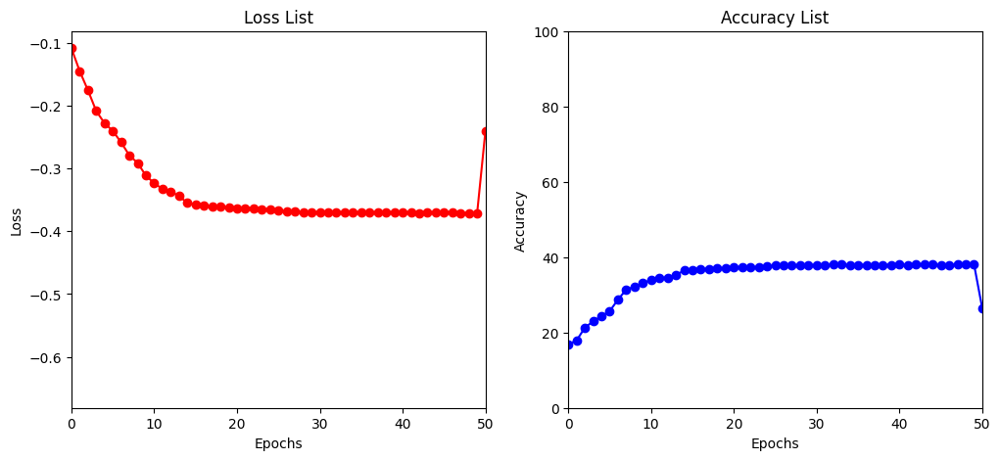

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.969977
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.991750
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.960887
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.934253

Test set: Average loss: -0.5078, Accuracy: 5148/10000 (51%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.956507
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.002971
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.003566
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.967816

Test set: Average loss: -0.5090, Accuracy: 5165/10000 (52%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.906727
Train Epoch: 13 [12800/50000 (26%)]	Loss: 1.996531
Train Epoch: 13 [25600/50000 (51%)]	Loss: 1.952444
Train Epoch: 13 [38400/50000 (77%)]	Loss: 2.003134

Test set: Average loss: -0.5009, Accuracy: 5072/10000 (51%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.965359
Train Epoch: 14 [12800/50000 (26%)]	Loss: 1.983949
Train Epoch: 14 [25600/50000 (51%)]	Loss: 1.910114
Train Epoch: 14 [38400/50000 (77%)]	Loss: 1.963407

Test set: Average

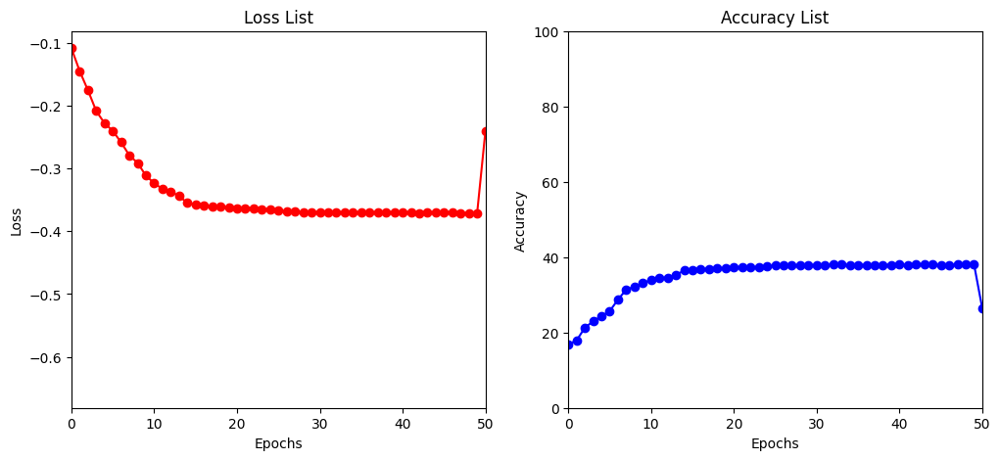

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.951787
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.929236
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.936598
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.978416

Test set: Average loss: -0.5360, Accuracy: 5413/10000 (54%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.905204
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.966983
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.901545
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.887722

Test set: Average loss: -0.5349, Accuracy: 5400/10000 (54%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.950882
Train Epoch: 18 [12800/50000 (26%)]	Loss: 1.938160
Train Epoch: 18 [25600/50000 (51%)]	Loss: 1.963407
Train Epoch: 18 [38400/50000 (77%)]	Loss: 1.911404

Test set: Average loss: -0.5377, Accuracy: 5447/10000 (54%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.966033
Train Epoch: 19 [12800/50000 (26%)]	Loss: 1.913679
Train Epoch: 19 [25600/50000 (51%)]	Loss: 1.976314
Train Epoch: 19 [38400/50000 (77%)]	Loss: 1.962403

Test set: Average

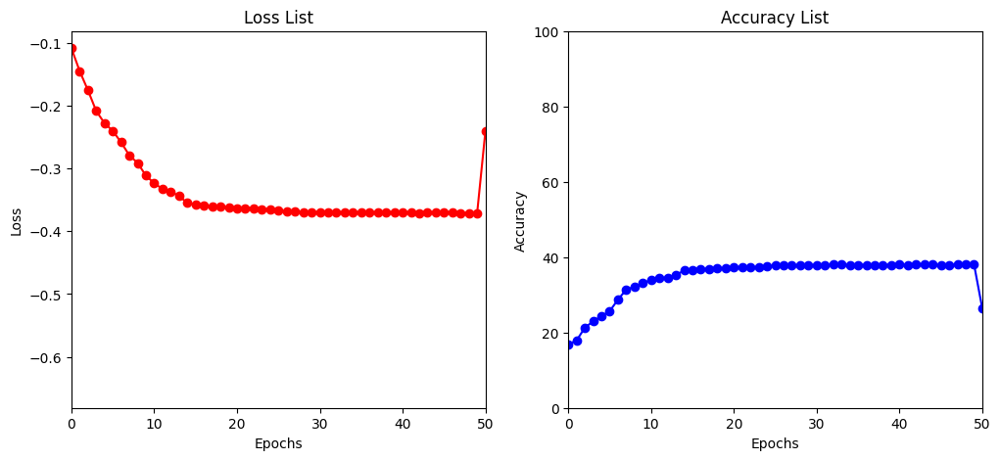

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.937913
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.953734
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.962923
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.934338

Test set: Average loss: -0.5420, Accuracy: 5474/10000 (55%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.974890
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.942060
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.973583
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.902502

Test set: Average loss: -0.5424, Accuracy: 5461/10000 (55%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.926860
Train Epoch: 23 [12800/50000 (26%)]	Loss: 1.906842
Train Epoch: 23 [25600/50000 (51%)]	Loss: 1.958019
Train Epoch: 23 [38400/50000 (77%)]	Loss: 1.947974

Test set: Average loss: -0.5468, Accuracy: 5512/10000 (55%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.940339
Train Epoch: 24 [12800/50000 (26%)]	Loss: 1.922389
Train Epoch: 24 [25600/50000 (51%)]	Loss: 1.900455
Train Epoch: 24 [38400/50000 (77%)]	Loss: 1.896580

Test set: Average

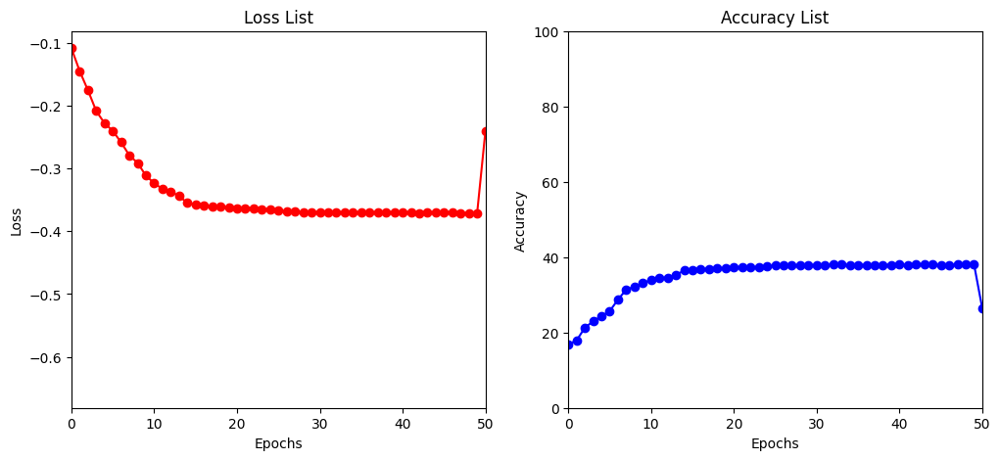

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.944482
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.898729
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.929249
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.932886

Test set: Average loss: -0.5583, Accuracy: 5667/10000 (57%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.924242
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.902692
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.953655
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.910001

Test set: Average loss: -0.5608, Accuracy: 5677/10000 (57%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.943390
Train Epoch: 28 [12800/50000 (26%)]	Loss: 1.899143
Train Epoch: 28 [25600/50000 (51%)]	Loss: 1.924511
Train Epoch: 28 [38400/50000 (77%)]	Loss: 1.917026

Test set: Average loss: -0.5647, Accuracy: 5721/10000 (57%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.888713
Train Epoch: 29 [12800/50000 (26%)]	Loss: 1.896693
Train Epoch: 29 [25600/50000 (51%)]	Loss: 1.918642
Train Epoch: 29 [38400/50000 (77%)]	Loss: 1.946844

Test set: Average

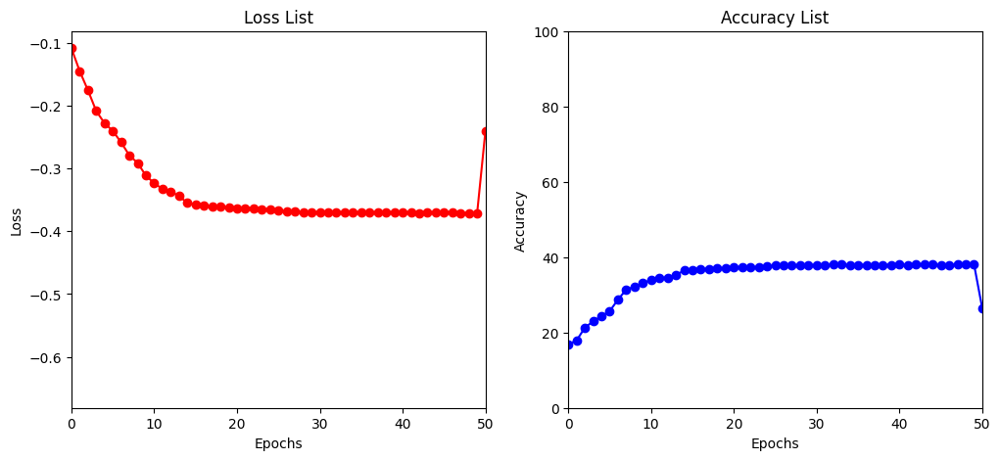

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.915405
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.954893
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.944887
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.873167

Test set: Average loss: -0.5707, Accuracy: 5784/10000 (58%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.917304
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.933083
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.904052
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.913326

Test set: Average loss: -0.5721, Accuracy: 5807/10000 (58%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.946544
Train Epoch: 33 [12800/50000 (26%)]	Loss: 1.881959
Train Epoch: 33 [25600/50000 (51%)]	Loss: 1.902841
Train Epoch: 33 [38400/50000 (77%)]	Loss: 1.878371

Test set: Average loss: -0.5721, Accuracy: 5806/10000 (58%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.890133
Train Epoch: 34 [12800/50000 (26%)]	Loss: 1.927644
Train Epoch: 34 [25600/50000 (51%)]	Loss: 1.887177
Train Epoch: 34 [38400/50000 (77%)]	Loss: 1.880306

Test set: Average

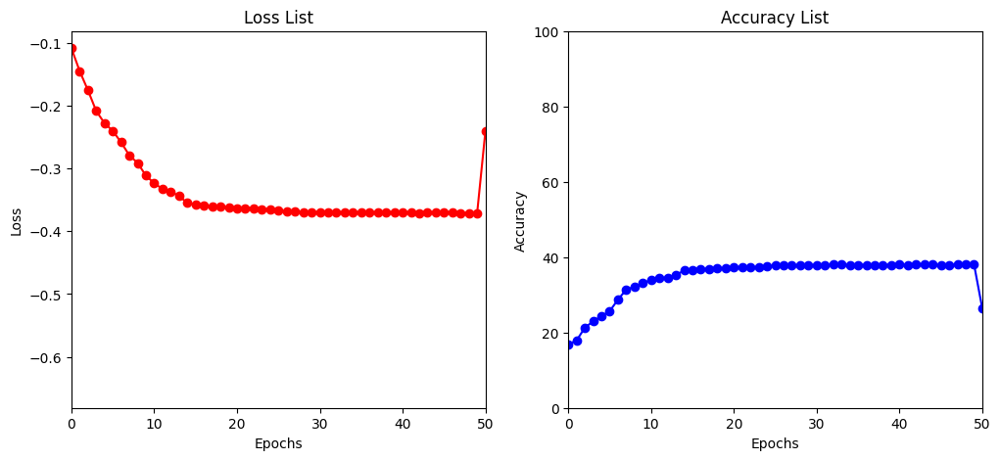

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.889583
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.926666
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.888757
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.924451

Test set: Average loss: -0.5730, Accuracy: 5822/10000 (58%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.868093
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.897284
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.902410
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.861790

Test set: Average loss: -0.5736, Accuracy: 5836/10000 (58%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.860435
Train Epoch: 38 [12800/50000 (26%)]	Loss: 1.940242
Train Epoch: 38 [25600/50000 (51%)]	Loss: 1.869090
Train Epoch: 38 [38400/50000 (77%)]	Loss: 1.895680

Test set: Average loss: -0.5740, Accuracy: 5838/10000 (58%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.875333
Train Epoch: 39 [12800/50000 (26%)]	Loss: 1.889515
Train Epoch: 39 [25600/50000 (51%)]	Loss: 1.860834
Train Epoch: 39 [38400/50000 (77%)]	Loss: 1.879119

Test set: Average

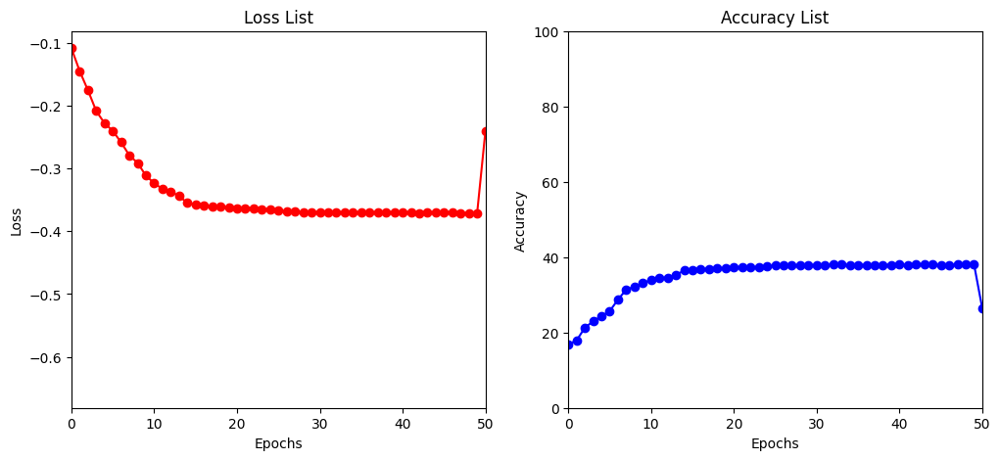

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.917349
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.908751
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.925254
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.937383

Test set: Average loss: -0.5751, Accuracy: 5862/10000 (59%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.894227
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.894851
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.885407
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.892586

Test set: Average loss: -0.5750, Accuracy: 5850/10000 (58%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.908803
Train Epoch: 43 [12800/50000 (26%)]	Loss: 1.942435
Train Epoch: 43 [25600/50000 (51%)]	Loss: 1.881238
Train Epoch: 43 [38400/50000 (77%)]	Loss: 1.956776

Test set: Average loss: -0.5752, Accuracy: 5851/10000 (59%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.835864
Train Epoch: 44 [12800/50000 (26%)]	Loss: 1.900964
Train Epoch: 44 [25600/50000 (51%)]	Loss: 1.834610
Train Epoch: 44 [38400/50000 (77%)]	Loss: 1.950941

Test set: Average

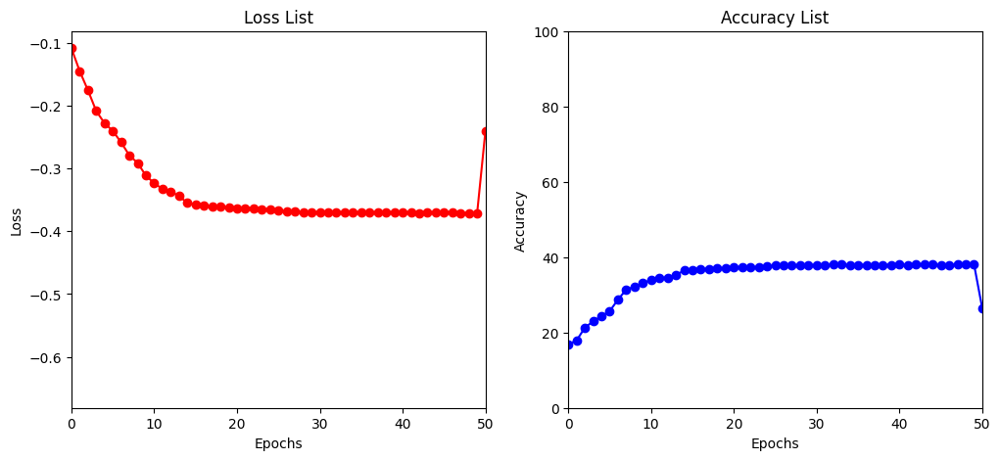

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.918663
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.890132
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.930531
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.898691

Test set: Average loss: -0.5765, Accuracy: 5859/10000 (59%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.856502
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.857566
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.888703
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.854898

Test set: Average loss: -0.5759, Accuracy: 5850/10000 (58%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.924020
Train Epoch: 48 [12800/50000 (26%)]	Loss: 1.946735
Train Epoch: 48 [25600/50000 (51%)]	Loss: 1.867703
Train Epoch: 48 [38400/50000 (77%)]	Loss: 1.869230

Test set: Average loss: -0.5760, Accuracy: 5847/10000 (58%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.871666
Train Epoch: 49 [12800/50000 (26%)]	Loss: 1.955315
Train Epoch: 49 [25600/50000 (51%)]	Loss: 1.867175
Train Epoch: 49 [38400/50000 (77%)]	Loss: 1.897574

Test set: Average

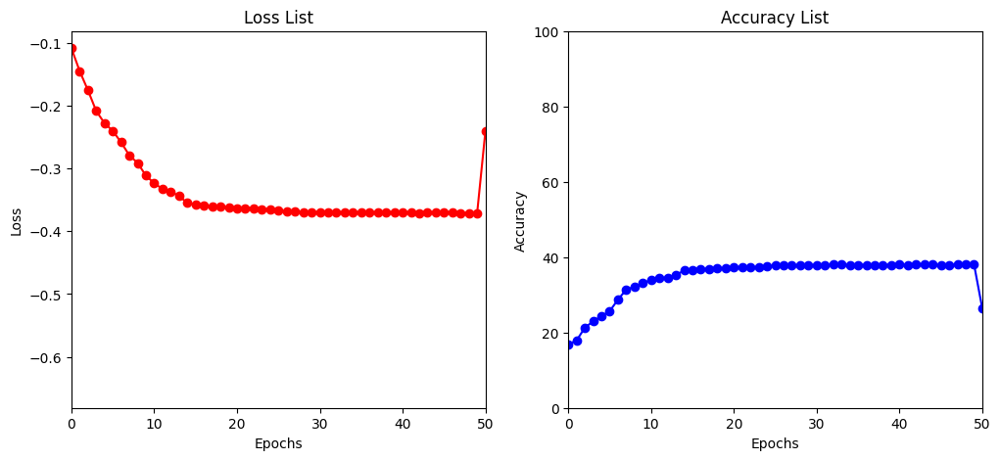

[I 2023-04-14 23:18:00,413] Trial 4 finished with value: -0.5763796265125275 and parameters: {'lr': 7.812651956841026e-05, 'batch_size': 256, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 3 with value: -0.6539759750366211.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303130
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.302634
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.301148
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.295829

Test set: Average loss: -0.1191, Accuracy: 1855/10000 (19%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.283968
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.268833
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.256906
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.256066

Test set: Average loss: -0.1733, Accuracy: 2160/10000 (22%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.237925
Train Epoch: 3 [12800/50000 (26%)]	Loss: 2.235955
Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.231630
Train Epoch: 3 [38400/50000 (77%)]	Loss: 2.255225

Test set: Average loss: -0.2186, Accuracy: 2330/10000 (23%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.202438
Train Epoch: 4 [12800/50000 (26%)]	Loss: 2.203992
Train Epoch: 4 [25600/50000 (51%)]	Loss: 2.205605
Train Ep

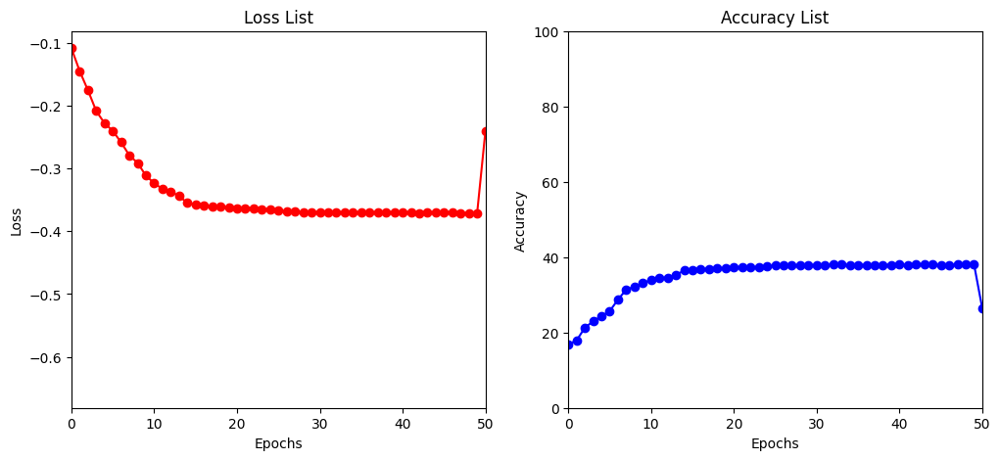

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.172994
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.149617
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.189693
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.169995

Test set: Average loss: -0.2699, Accuracy: 2844/10000 (28%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.177530
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.184905
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.187644
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.180535

Test set: Average loss: -0.2877, Accuracy: 3020/10000 (30%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.128560
Train Epoch: 8 [12800/50000 (26%)]	Loss: 2.174352
Train Epoch: 8 [25600/50000 (51%)]	Loss: 2.156305
Train Epoch: 8 [38400/50000 (77%)]	Loss: 2.154508

Test set: Average loss: -0.3018, Accuracy: 3212/10000 (32%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 2.157770
Train Epoch: 9 [12800/50000 (26%)]	Loss: 2.161340
Train Epoch: 9 [25600/50000 (51%)]	Loss: 2.154953
Train Epoch: 9 [38400/50000 (77%)]	Loss: 2.156793

Test set: Average loss: -0.3186, 

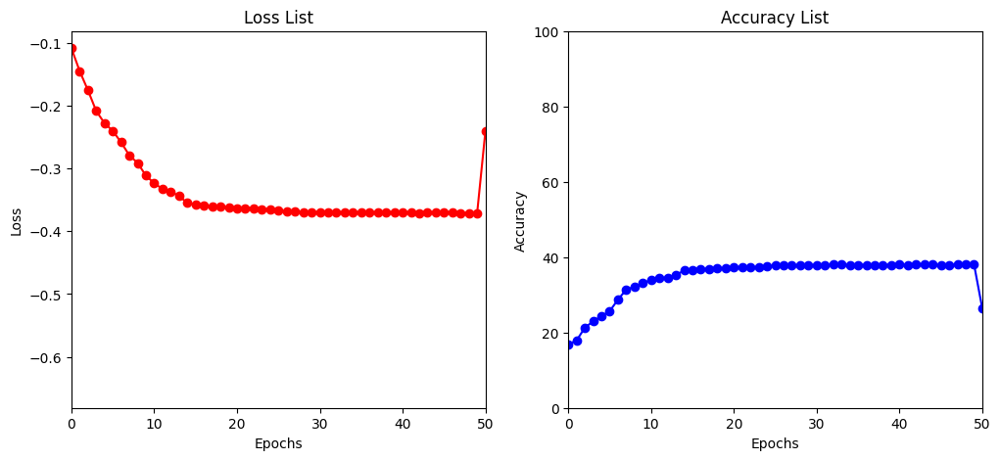

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.140615
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.139548
Train Epoch: 11 [25600/50000 (51%)]	Loss: 2.093817
Train Epoch: 11 [38400/50000 (77%)]	Loss: 2.113339

Test set: Average loss: -0.3554, Accuracy: 3807/10000 (38%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 2.127124
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.123582
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.108410
Train Epoch: 12 [38400/50000 (77%)]	Loss: 2.121062

Test set: Average loss: -0.3735, Accuracy: 4008/10000 (40%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 2.076257
Train Epoch: 13 [12800/50000 (26%)]	Loss: 2.143784
Train Epoch: 13 [25600/50000 (51%)]	Loss: 2.117882
Train Epoch: 13 [38400/50000 (77%)]	Loss: 2.123241

Test set: Average loss: -0.3881, Accuracy: 4122/10000 (41%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 2.097529
Train Epoch: 14 [12800/50000 (26%)]	Loss: 2.145527
Train Epoch: 14 [25600/50000 (51%)]	Loss: 2.069009
Train Epoch: 14 [38400/50000 (77%)]	Loss: 2.093773

Test set: Average

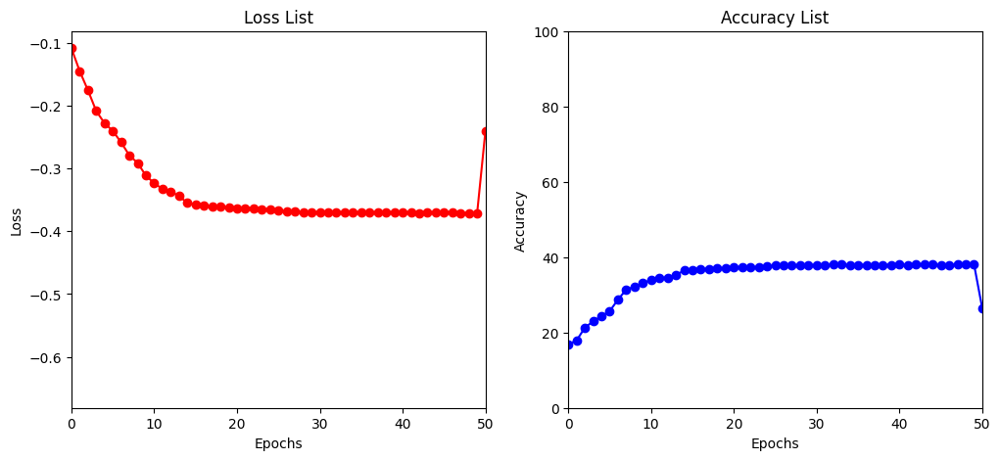

Train Epoch: 16 [0/50000 (0%)]	Loss: 2.081372
Train Epoch: 16 [12800/50000 (26%)]	Loss: 2.050557
Train Epoch: 16 [25600/50000 (51%)]	Loss: 2.070964
Train Epoch: 16 [38400/50000 (77%)]	Loss: 2.113217

Test set: Average loss: -0.4101, Accuracy: 4299/10000 (43%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 2.055970
Train Epoch: 17 [12800/50000 (26%)]	Loss: 2.104295
Train Epoch: 17 [25600/50000 (51%)]	Loss: 2.054542
Train Epoch: 17 [38400/50000 (77%)]	Loss: 2.051392

Test set: Average loss: -0.4097, Accuracy: 4263/10000 (43%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 2.075596
Train Epoch: 18 [12800/50000 (26%)]	Loss: 2.077398
Train Epoch: 18 [25600/50000 (51%)]	Loss: 2.095177
Train Epoch: 18 [38400/50000 (77%)]	Loss: 2.040657

Test set: Average loss: -0.4108, Accuracy: 4267/10000 (43%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 2.103215
Train Epoch: 19 [12800/50000 (26%)]	Loss: 2.095313
Train Epoch: 19 [25600/50000 (51%)]	Loss: 2.109846
Train Epoch: 19 [38400/50000 (77%)]	Loss: 2.123232

Test set: Average

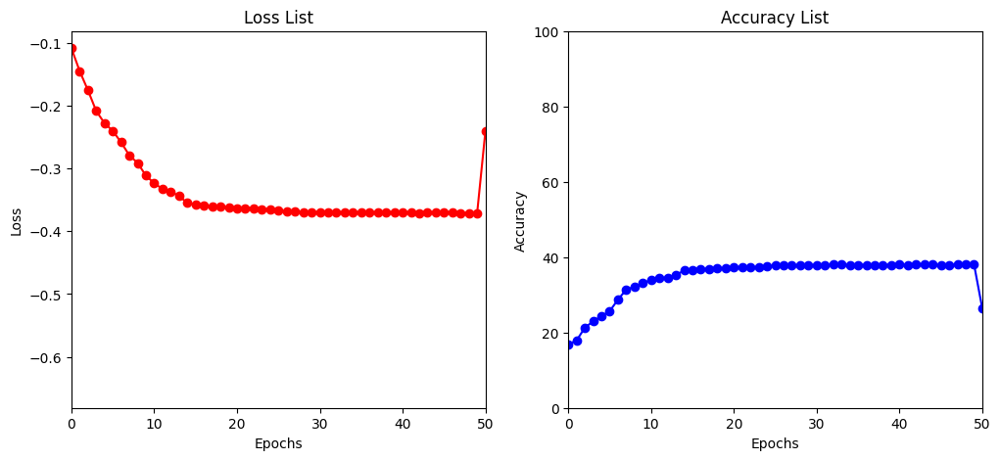

Train Epoch: 21 [0/50000 (0%)]	Loss: 2.025259
Train Epoch: 21 [12800/50000 (26%)]	Loss: 2.073472
Train Epoch: 21 [25600/50000 (51%)]	Loss: 2.072407
Train Epoch: 21 [38400/50000 (77%)]	Loss: 2.109321

Test set: Average loss: -0.4135, Accuracy: 4315/10000 (43%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 2.106136
Train Epoch: 22 [12800/50000 (26%)]	Loss: 2.064180
Train Epoch: 22 [25600/50000 (51%)]	Loss: 2.073442
Train Epoch: 22 [38400/50000 (77%)]	Loss: 2.079084

Test set: Average loss: -0.4136, Accuracy: 4301/10000 (43%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 2.063552
Train Epoch: 23 [12800/50000 (26%)]	Loss: 2.085104
Train Epoch: 23 [25600/50000 (51%)]	Loss: 2.079587
Train Epoch: 23 [38400/50000 (77%)]	Loss: 2.115857

Test set: Average loss: -0.4148, Accuracy: 4315/10000 (43%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 2.084158
Train Epoch: 24 [12800/50000 (26%)]	Loss: 2.057383
Train Epoch: 24 [25600/50000 (51%)]	Loss: 2.010385
Train Epoch: 24 [38400/50000 (77%)]	Loss: 2.060119

Test set: Average

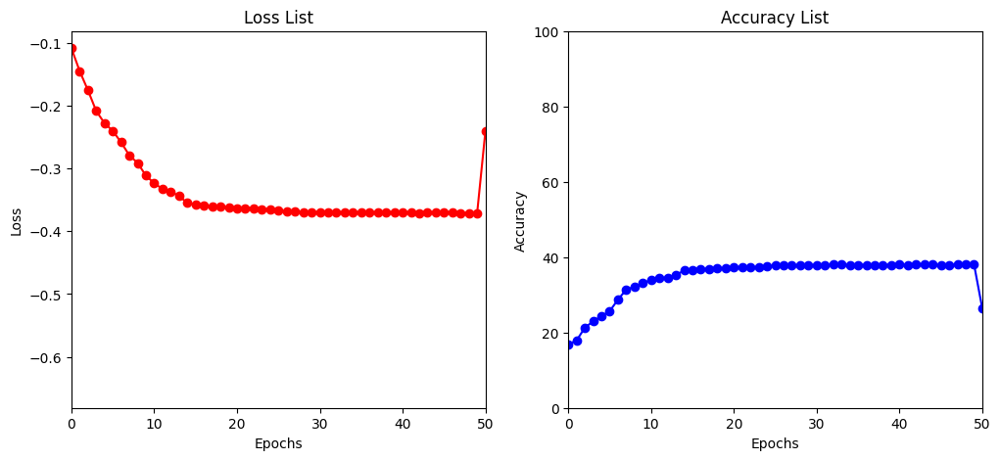

Train Epoch: 26 [0/50000 (0%)]	Loss: 2.078274
Train Epoch: 26 [12800/50000 (26%)]	Loss: 2.031137
Train Epoch: 26 [25600/50000 (51%)]	Loss: 2.051859
Train Epoch: 26 [38400/50000 (77%)]	Loss: 2.035997

Test set: Average loss: -0.4162, Accuracy: 4310/10000 (43%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 2.051911
Train Epoch: 27 [12800/50000 (26%)]	Loss: 2.053859
Train Epoch: 27 [25600/50000 (51%)]	Loss: 2.075058
Train Epoch: 27 [38400/50000 (77%)]	Loss: 2.096739

Test set: Average loss: -0.4174, Accuracy: 4337/10000 (43%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 2.073705
Train Epoch: 28 [12800/50000 (26%)]	Loss: 2.071352
Train Epoch: 28 [25600/50000 (51%)]	Loss: 2.108698
Train Epoch: 28 [38400/50000 (77%)]	Loss: 2.070866

Test set: Average loss: -0.4184, Accuracy: 4345/10000 (43%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 2.044968
Train Epoch: 29 [12800/50000 (26%)]	Loss: 2.022843
Train Epoch: 29 [25600/50000 (51%)]	Loss: 2.069357
Train Epoch: 29 [38400/50000 (77%)]	Loss: 2.129389

Test set: Average

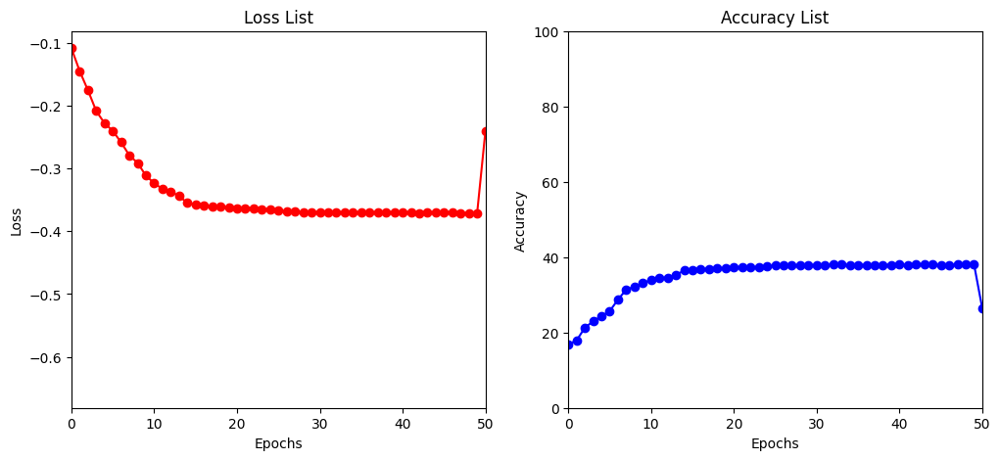

Train Epoch: 31 [0/50000 (0%)]	Loss: 2.082239
Train Epoch: 31 [12800/50000 (26%)]	Loss: 2.076573
Train Epoch: 31 [25600/50000 (51%)]	Loss: 2.113782
Train Epoch: 31 [38400/50000 (77%)]	Loss: 2.035496

Test set: Average loss: -0.4198, Accuracy: 4355/10000 (44%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 2.071835
Train Epoch: 32 [12800/50000 (26%)]	Loss: 2.099638
Train Epoch: 32 [25600/50000 (51%)]	Loss: 2.035292
Train Epoch: 32 [38400/50000 (77%)]	Loss: 2.066354

Test set: Average loss: -0.4185, Accuracy: 4333/10000 (43%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 2.081689
Train Epoch: 33 [12800/50000 (26%)]	Loss: 2.052554
Train Epoch: 33 [25600/50000 (51%)]	Loss: 2.021852
Train Epoch: 33 [38400/50000 (77%)]	Loss: 2.048073

Test set: Average loss: -0.4193, Accuracy: 4336/10000 (43%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 2.063281
Train Epoch: 34 [12800/50000 (26%)]	Loss: 2.078171
Train Epoch: 34 [25600/50000 (51%)]	Loss: 2.091065
Train Epoch: 34 [38400/50000 (77%)]	Loss: 2.081064

Test set: Average

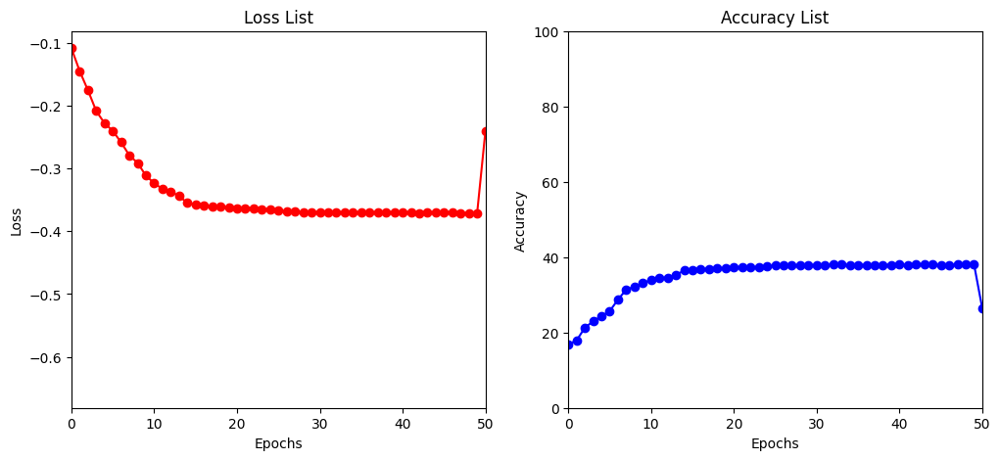

Train Epoch: 36 [0/50000 (0%)]	Loss: 2.072268
Train Epoch: 36 [12800/50000 (26%)]	Loss: 2.101177
Train Epoch: 36 [25600/50000 (51%)]	Loss: 2.008762
Train Epoch: 36 [38400/50000 (77%)]	Loss: 2.073399

Test set: Average loss: -0.4198, Accuracy: 4349/10000 (43%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 2.064728
Train Epoch: 37 [12800/50000 (26%)]	Loss: 2.065662
Train Epoch: 37 [25600/50000 (51%)]	Loss: 2.053171
Train Epoch: 37 [38400/50000 (77%)]	Loss: 2.064369

Test set: Average loss: -0.4191, Accuracy: 4334/10000 (43%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 2.042674
Train Epoch: 38 [12800/50000 (26%)]	Loss: 2.103680
Train Epoch: 38 [25600/50000 (51%)]	Loss: 2.056555
Train Epoch: 38 [38400/50000 (77%)]	Loss: 2.027386

Test set: Average loss: -0.4199, Accuracy: 4363/10000 (44%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 2.076402
Train Epoch: 39 [12800/50000 (26%)]	Loss: 2.067078
Train Epoch: 39 [25600/50000 (51%)]	Loss: 2.066123
Train Epoch: 39 [38400/50000 (77%)]	Loss: 2.060614

Test set: Average

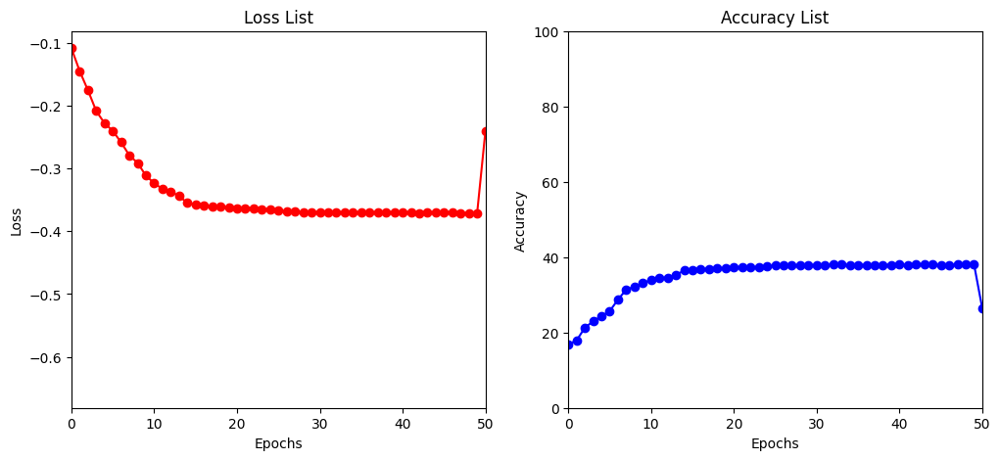

Train Epoch: 41 [0/50000 (0%)]	Loss: 2.116727
Train Epoch: 41 [12800/50000 (26%)]	Loss: 2.065294
Train Epoch: 41 [25600/50000 (51%)]	Loss: 2.063056
Train Epoch: 41 [38400/50000 (77%)]	Loss: 2.070925

Test set: Average loss: -0.4202, Accuracy: 4352/10000 (44%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 2.035420
Train Epoch: 42 [12800/50000 (26%)]	Loss: 2.066381
Train Epoch: 42 [25600/50000 (51%)]	Loss: 2.065438
Train Epoch: 42 [38400/50000 (77%)]	Loss: 2.087757

Test set: Average loss: -0.4202, Accuracy: 4353/10000 (44%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 2.107097
Train Epoch: 43 [12800/50000 (26%)]	Loss: 2.088791
Train Epoch: 43 [25600/50000 (51%)]	Loss: 2.073232
Train Epoch: 43 [38400/50000 (77%)]	Loss: 2.037116

Test set: Average loss: -0.4201, Accuracy: 4351/10000 (44%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 2.027453
Train Epoch: 44 [12800/50000 (26%)]	Loss: 2.078480
Train Epoch: 44 [25600/50000 (51%)]	Loss: 2.041469
Train Epoch: 44 [38400/50000 (77%)]	Loss: 2.097324

Test set: Average

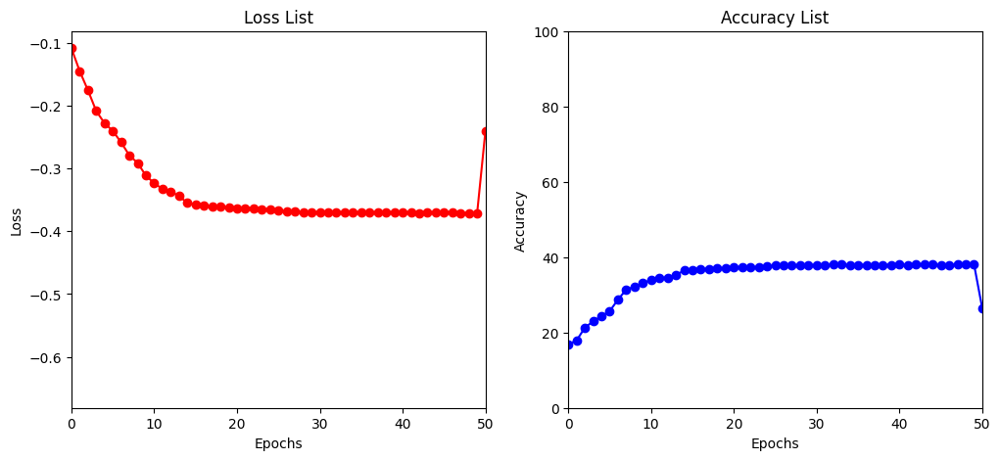

Train Epoch: 46 [0/50000 (0%)]	Loss: 2.067917
Train Epoch: 46 [12800/50000 (26%)]	Loss: 2.057557
Train Epoch: 46 [25600/50000 (51%)]	Loss: 2.077224
Train Epoch: 46 [38400/50000 (77%)]	Loss: 2.057010

Test set: Average loss: -0.4202, Accuracy: 4346/10000 (43%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 2.018484
Train Epoch: 47 [12800/50000 (26%)]	Loss: 2.042576
Train Epoch: 47 [25600/50000 (51%)]	Loss: 2.058418
Train Epoch: 47 [38400/50000 (77%)]	Loss: 2.040438

Test set: Average loss: -0.4197, Accuracy: 4344/10000 (43%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 2.094797
Train Epoch: 48 [12800/50000 (26%)]	Loss: 2.067510
Train Epoch: 48 [25600/50000 (51%)]	Loss: 2.057578
Train Epoch: 48 [38400/50000 (77%)]	Loss: 2.016715

Test set: Average loss: -0.4199, Accuracy: 4353/10000 (44%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 2.032892
Train Epoch: 49 [12800/50000 (26%)]	Loss: 2.115815
Train Epoch: 49 [25600/50000 (51%)]	Loss: 2.063484
Train Epoch: 49 [38400/50000 (77%)]	Loss: 2.054642

Test set: Average

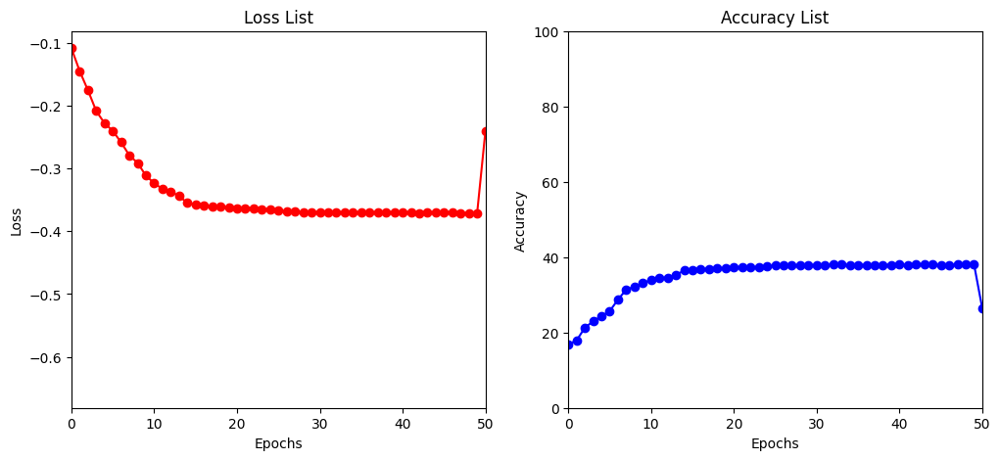

[I 2023-04-14 23:39:00,204] Trial 5 finished with value: -0.42028012480735777 and parameters: {'lr': 1.180292962789488e-05, 'batch_size': 256, 'gamma': 0.1, 'droprate': 0.4}. Best is trial 3 with value: -0.6539759750366211.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302978
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.207354

Test set: Average loss: -0.2648, Accuracy: 2848/10000 (28%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.177963
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.149687

Test set: Average loss: -0.3519, Accuracy: 3571/10000 (36%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.059264
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.049644

Test set: Average loss: -0.4572, Accuracy: 4651/10000 (47%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 1.996920
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.008482

Test set: Average loss: -0.4725, Accuracy: 4775/10000 (48%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 1.980802
Train Epoch: 5 [25900/50000 (52%)]	Loss: 1.970028

Test set: Average loss: -0.4841, Accuracy: 4907/10000 (49%)



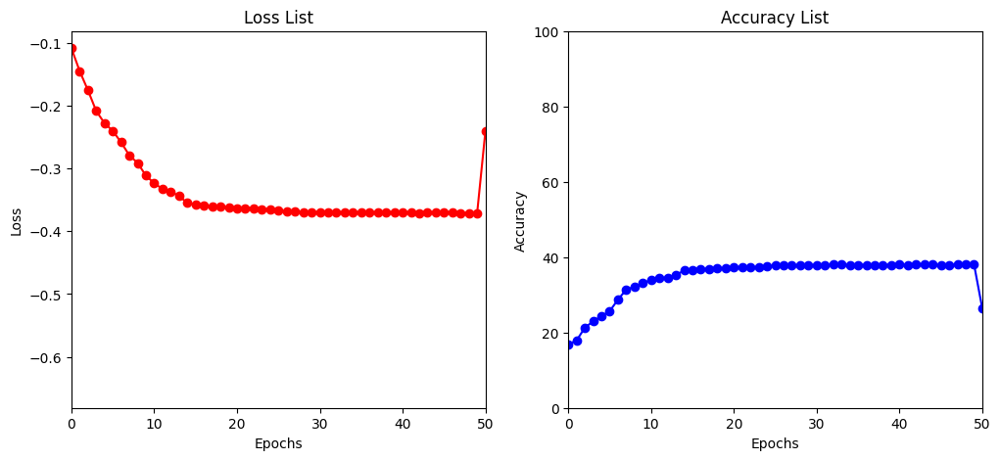

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.951563
Train Epoch: 6 [25900/50000 (52%)]	Loss: 1.962354

Test set: Average loss: -0.5013, Accuracy: 5070/10000 (51%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.953199
Train Epoch: 7 [25900/50000 (52%)]	Loss: 1.927784

Test set: Average loss: -0.5033, Accuracy: 5106/10000 (51%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.930755
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.936632

Test set: Average loss: -0.5584, Accuracy: 5670/10000 (57%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.927710
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.894167

Test set: Average loss: -0.5575, Accuracy: 5621/10000 (56%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.875774
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.870495

Test set: Average loss: -0.5684, Accuracy: 5730/10000 (57%)



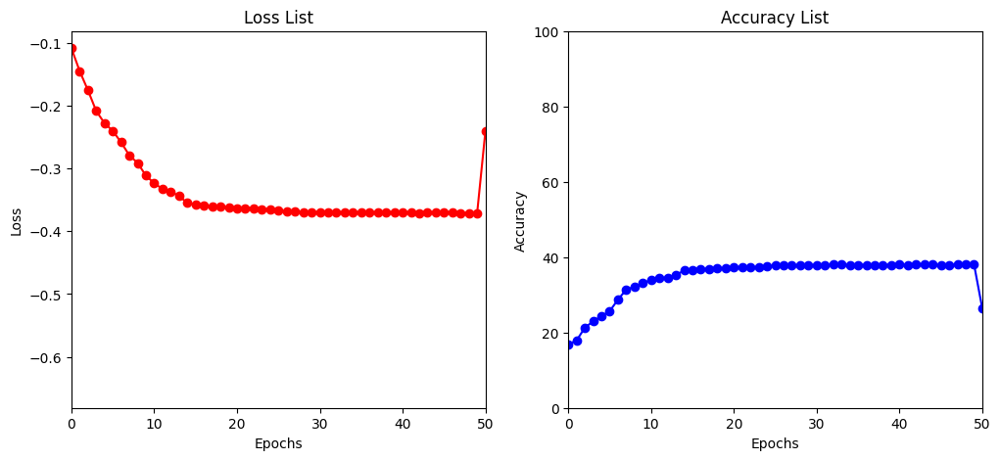

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.913256
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.910233

Test set: Average loss: -0.5792, Accuracy: 5833/10000 (58%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.905424
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.895832

Test set: Average loss: -0.5525, Accuracy: 5585/10000 (56%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.846406
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.876785

Test set: Average loss: -0.5663, Accuracy: 5710/10000 (57%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.876625
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.845690

Test set: Average loss: -0.5976, Accuracy: 6035/10000 (60%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.876870
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.868404

Test set: Average loss: -0.5653, Accuracy: 5675/10000 (57%)



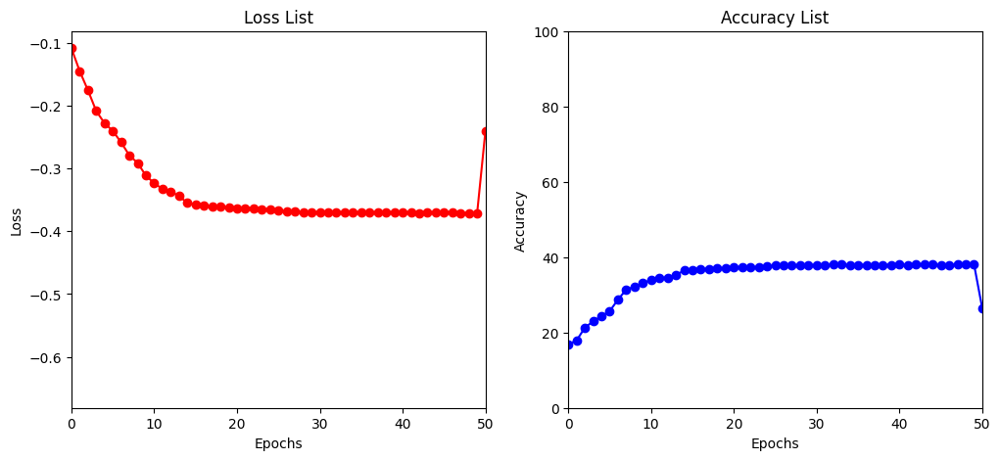

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.839779
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.829929

Test set: Average loss: -0.6519, Accuracy: 6565/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.821447
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.833416

Test set: Average loss: -0.6579, Accuracy: 6623/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.778347
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.813957

Test set: Average loss: -0.6632, Accuracy: 6674/10000 (67%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.837070
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.783429

Test set: Average loss: -0.6647, Accuracy: 6692/10000 (67%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.811215
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.811666

Test set: Average loss: -0.6690, Accuracy: 6731/10000 (67%)



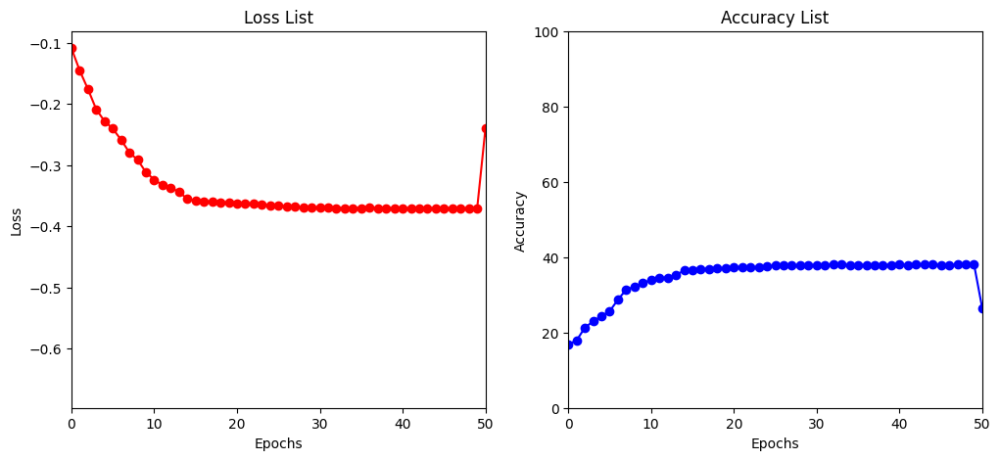

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.801763
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.822789

Test set: Average loss: -0.6702, Accuracy: 6761/10000 (68%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.819272
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.841976

Test set: Average loss: -0.6699, Accuracy: 6760/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.825827
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.796031

Test set: Average loss: -0.6735, Accuracy: 6783/10000 (68%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.798176
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.838528

Test set: Average loss: -0.6746, Accuracy: 6805/10000 (68%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.799809
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.783123

Test set: Average loss: -0.6765, Accuracy: 6814/10000 (68%)



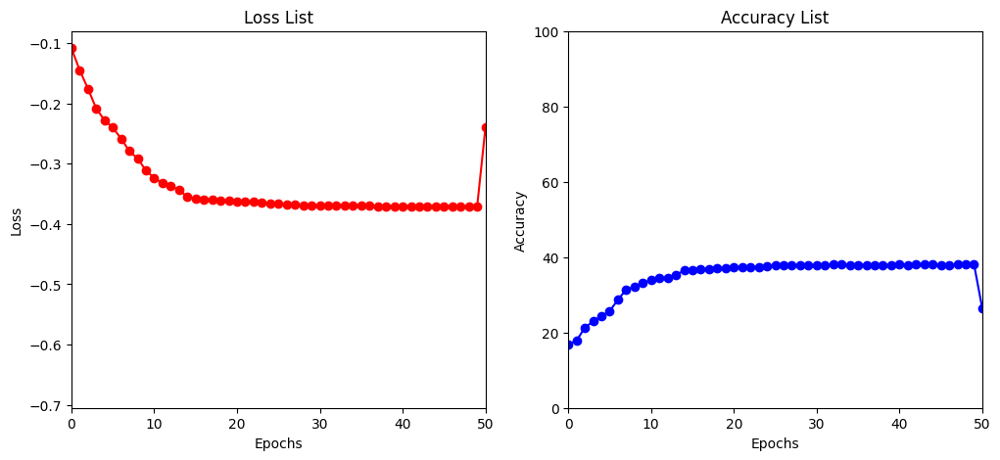

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.826641
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.811106

Test set: Average loss: -0.6794, Accuracy: 6858/10000 (69%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.813210
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.789032

Test set: Average loss: -0.6764, Accuracy: 6812/10000 (68%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.802625
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.775150

Test set: Average loss: -0.6807, Accuracy: 6859/10000 (69%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.783870
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.757556

Test set: Average loss: -0.6821, Accuracy: 6890/10000 (69%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.803490
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.772176

Test set: Average loss: -0.6812, Accuracy: 6871/10000 (69%)



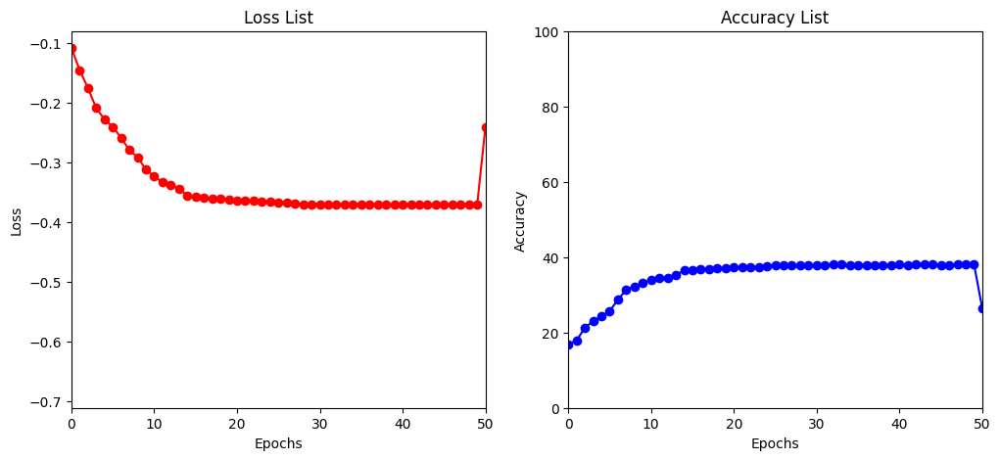

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.784582
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.773754

Test set: Average loss: -0.6873, Accuracy: 6921/10000 (69%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.803304
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.776972

Test set: Average loss: -0.6873, Accuracy: 6912/10000 (69%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.803967
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.788454

Test set: Average loss: -0.6888, Accuracy: 6947/10000 (69%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.801661
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.794313

Test set: Average loss: -0.6885, Accuracy: 6938/10000 (69%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.794777
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.800217

Test set: Average loss: -0.6892, Accuracy: 6953/10000 (70%)



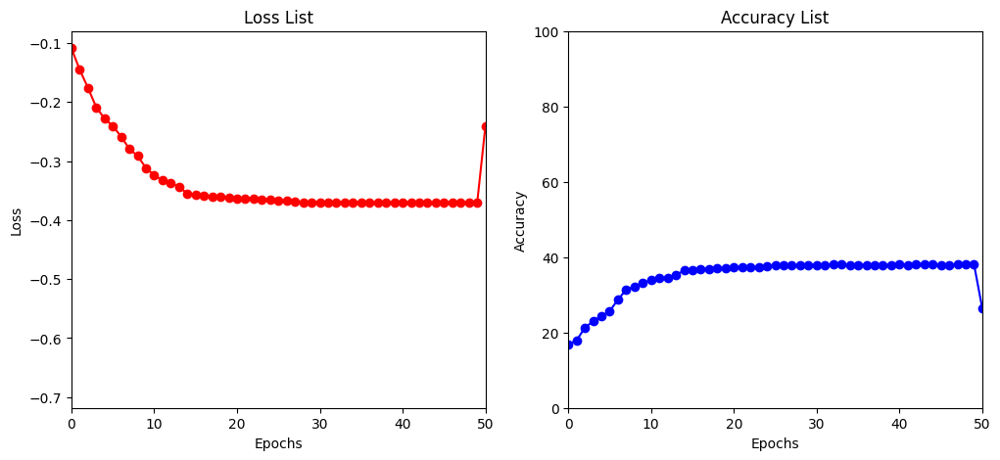

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.760380
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.781606

Test set: Average loss: -0.6892, Accuracy: 6952/10000 (70%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.803560
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.806934

Test set: Average loss: -0.6892, Accuracy: 6944/10000 (69%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.743881
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.763007

Test set: Average loss: -0.6893, Accuracy: 6953/10000 (70%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.777828
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.789427

Test set: Average loss: -0.6900, Accuracy: 6944/10000 (69%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.786774
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.766583

Test set: Average loss: -0.6896, Accuracy: 6951/10000 (70%)



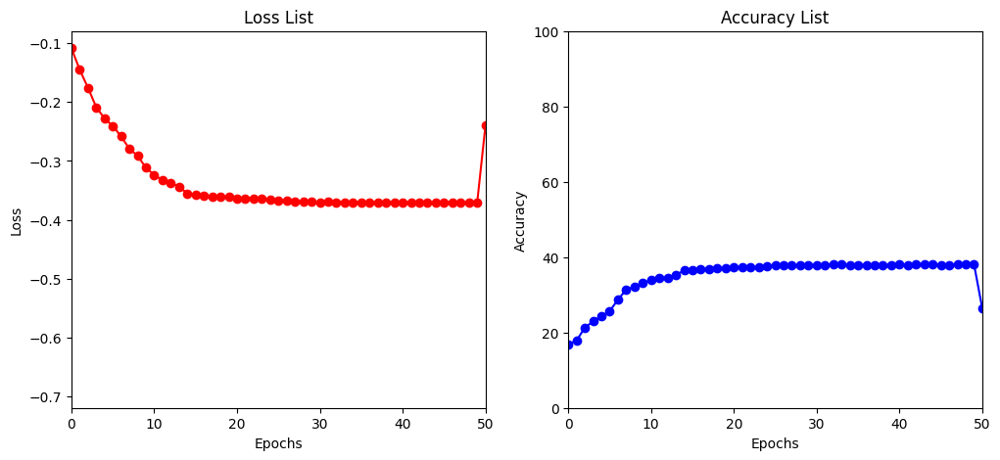

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.793828
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.797466

Test set: Average loss: -0.6899, Accuracy: 6938/10000 (69%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.784300
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.746678

Test set: Average loss: -0.6896, Accuracy: 6954/10000 (70%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.793333
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.780693

Test set: Average loss: -0.6903, Accuracy: 6959/10000 (70%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.735628
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.788402

Test set: Average loss: -0.6909, Accuracy: 6965/10000 (70%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.785520
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.777907

Test set: Average loss: -0.6905, Accuracy: 6959/10000 (70%)



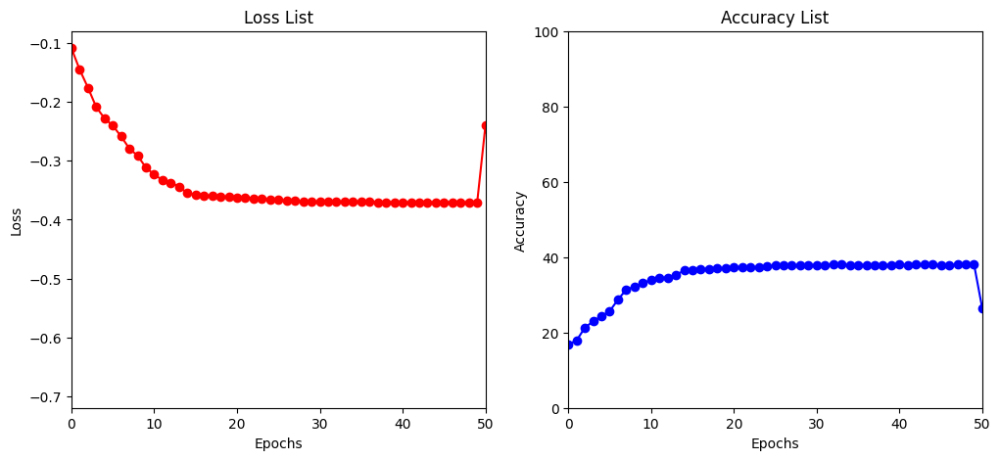

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.755987
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.758540

Test set: Average loss: -0.6907, Accuracy: 6960/10000 (70%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.764342
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.795871

Test set: Average loss: -0.6912, Accuracy: 6970/10000 (70%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.769641
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.761775

Test set: Average loss: -0.6920, Accuracy: 6982/10000 (70%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.776340
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.784171

Test set: Average loss: -0.6912, Accuracy: 6971/10000 (70%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.784042
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.800682

Test set: Average loss: -0.6915, Accuracy: 6976/10000 (70%)



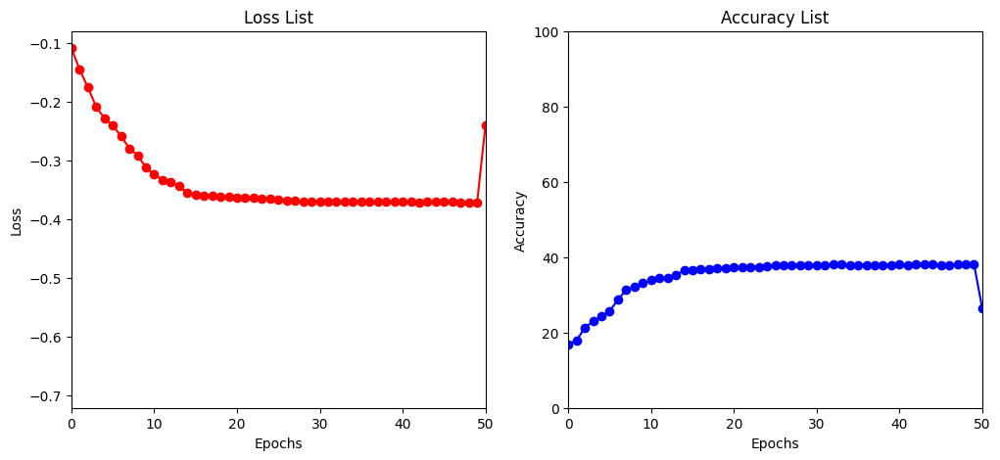

[I 2023-04-14 23:59:25,828] Trial 6 finished with value: -0.6914667594909668 and parameters: {'lr': 0.0003240091840370151, 'batch_size': 518, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303130
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.289698
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.245975
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.212737

Test set: Average loss: -0.2373, Accuracy: 2719/10000 (27%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.186530
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.197693
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.134587
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.174263

Test set: Average loss: -0.3329, Accuracy: 3584/10000 (36%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.131297
Train Epoch: 3 [12800/50000 (26%)]	Loss: 2.070662
Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.098523
Train Epoch: 3 [38400/50000 (77%)]	Loss: 2.130318

Test set: Average loss: -0.4097, Accuracy: 4184/10000 (42%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.032662
Train Epoch: 4 [12800/50000 (26%)]	Loss: 2.062254
Train Epoch: 4 [25600/50000 (51%)]	Loss: 2.086587
Train Ep

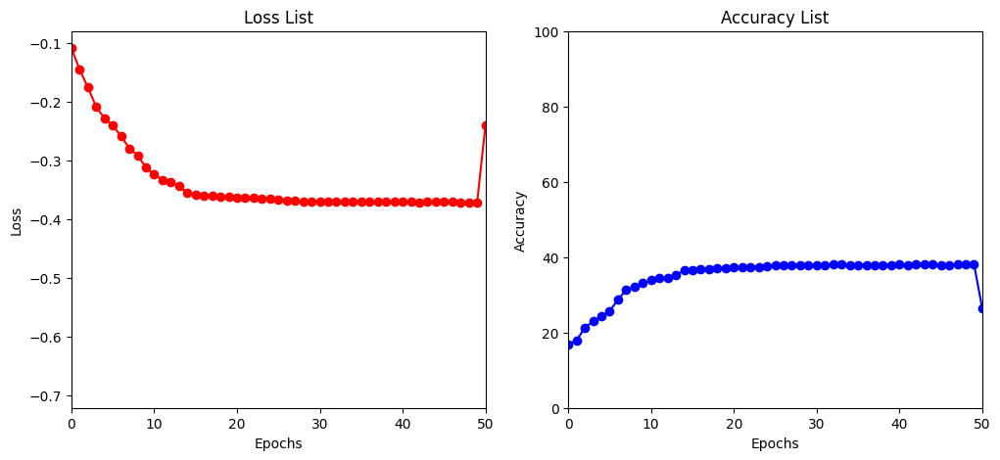

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.005819
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.033317
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.025830
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.041713

Test set: Average loss: -0.4465, Accuracy: 4559/10000 (46%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.054432
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.020709
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.018128
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.035419

Test set: Average loss: -0.4665, Accuracy: 4716/10000 (47%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.020866
Train Epoch: 8 [12800/50000 (26%)]	Loss: 2.000231
Train Epoch: 8 [25600/50000 (51%)]	Loss: 1.986507
Train Epoch: 8 [38400/50000 (77%)]	Loss: 1.970455

Test set: Average loss: -0.4729, Accuracy: 4823/10000 (48%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.939606
Train Epoch: 9 [12800/50000 (26%)]	Loss: 2.003524
Train Epoch: 9 [25600/50000 (51%)]	Loss: 1.999415
Train Epoch: 9 [38400/50000 (77%)]	Loss: 1.998285

Test set: Average loss: -0.4781, 

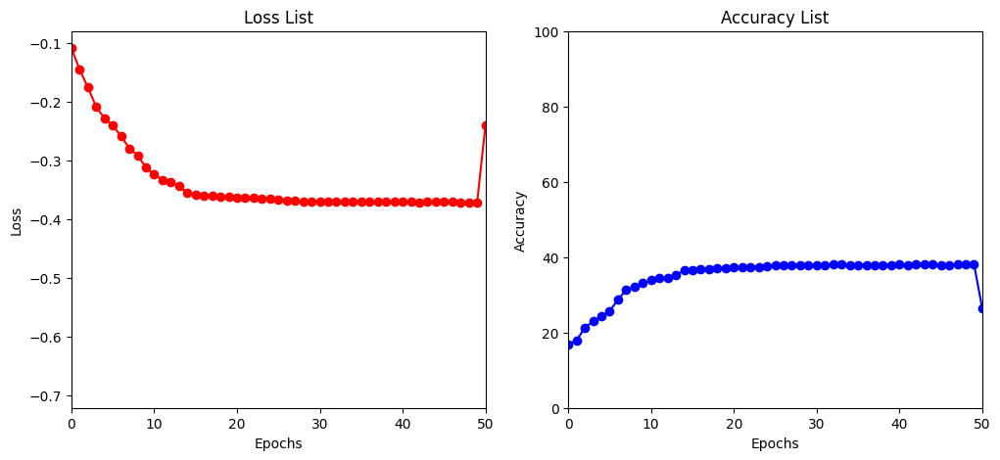

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.982076
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.001754
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.991229
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.954353

Test set: Average loss: -0.4941, Accuracy: 5003/10000 (50%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.989015
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.011633
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.977893
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.984920

Test set: Average loss: -0.4936, Accuracy: 4993/10000 (50%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.916374
Train Epoch: 13 [12800/50000 (26%)]	Loss: 1.990209
Train Epoch: 13 [25600/50000 (51%)]	Loss: 1.947859
Train Epoch: 13 [38400/50000 (77%)]	Loss: 2.012290

Test set: Average loss: -0.5060, Accuracy: 5128/10000 (51%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.966896
Train Epoch: 14 [12800/50000 (26%)]	Loss: 2.003994
Train Epoch: 14 [25600/50000 (51%)]	Loss: 1.931415
Train Epoch: 14 [38400/50000 (77%)]	Loss: 1.953054

Test set: Average

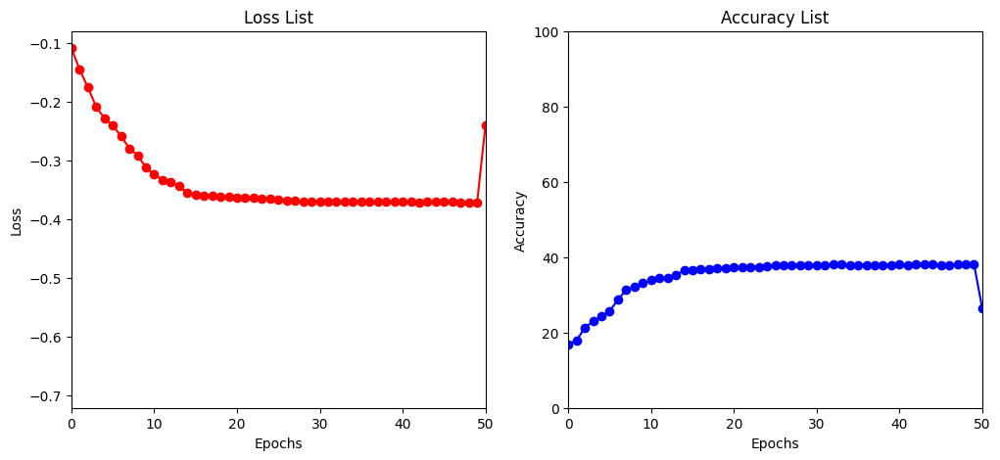

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.947733
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.919995
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.959818
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.982327

Test set: Average loss: -0.5543, Accuracy: 5623/10000 (56%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.882591
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.966607
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.872427
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.888482

Test set: Average loss: -0.5563, Accuracy: 5649/10000 (56%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.903789
Train Epoch: 18 [12800/50000 (26%)]	Loss: 1.891607
Train Epoch: 18 [25600/50000 (51%)]	Loss: 1.952252
Train Epoch: 18 [38400/50000 (77%)]	Loss: 1.903656

Test set: Average loss: -0.5591, Accuracy: 5687/10000 (57%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.951683
Train Epoch: 19 [12800/50000 (26%)]	Loss: 1.913461
Train Epoch: 19 [25600/50000 (51%)]	Loss: 1.950786
Train Epoch: 19 [38400/50000 (77%)]	Loss: 1.942059

Test set: Average

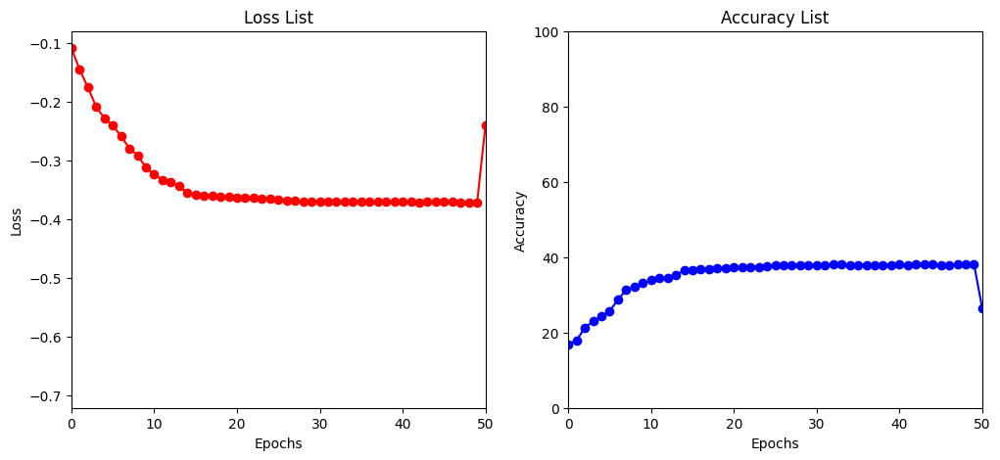

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.893805
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.899456
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.948790
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.904353

Test set: Average loss: -0.5630, Accuracy: 5696/10000 (57%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.947790
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.896841
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.942156
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.900175

Test set: Average loss: -0.5658, Accuracy: 5751/10000 (58%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.907608
Train Epoch: 23 [12800/50000 (26%)]	Loss: 1.904606
Train Epoch: 23 [25600/50000 (51%)]	Loss: 1.915297
Train Epoch: 23 [38400/50000 (77%)]	Loss: 1.907968

Test set: Average loss: -0.5684, Accuracy: 5775/10000 (58%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.936834
Train Epoch: 24 [12800/50000 (26%)]	Loss: 1.920109
Train Epoch: 24 [25600/50000 (51%)]	Loss: 1.887753
Train Epoch: 24 [38400/50000 (77%)]	Loss: 1.889442

Test set: Average

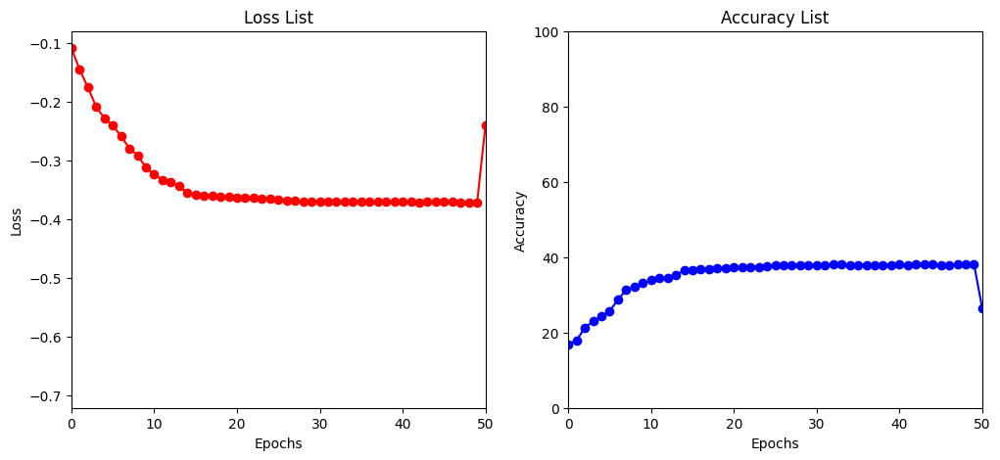

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.933922
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.889678
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.892197
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.922764

Test set: Average loss: -0.5716, Accuracy: 5802/10000 (58%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.912371
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.910064
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.931205
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.899204

Test set: Average loss: -0.5718, Accuracy: 5795/10000 (58%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.916876
Train Epoch: 28 [12800/50000 (26%)]	Loss: 1.866406
Train Epoch: 28 [25600/50000 (51%)]	Loss: 1.925330
Train Epoch: 28 [38400/50000 (77%)]	Loss: 1.906229

Test set: Average loss: -0.5725, Accuracy: 5811/10000 (58%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.896460
Train Epoch: 29 [12800/50000 (26%)]	Loss: 1.892567
Train Epoch: 29 [25600/50000 (51%)]	Loss: 1.899716
Train Epoch: 29 [38400/50000 (77%)]	Loss: 1.932014

Test set: Average

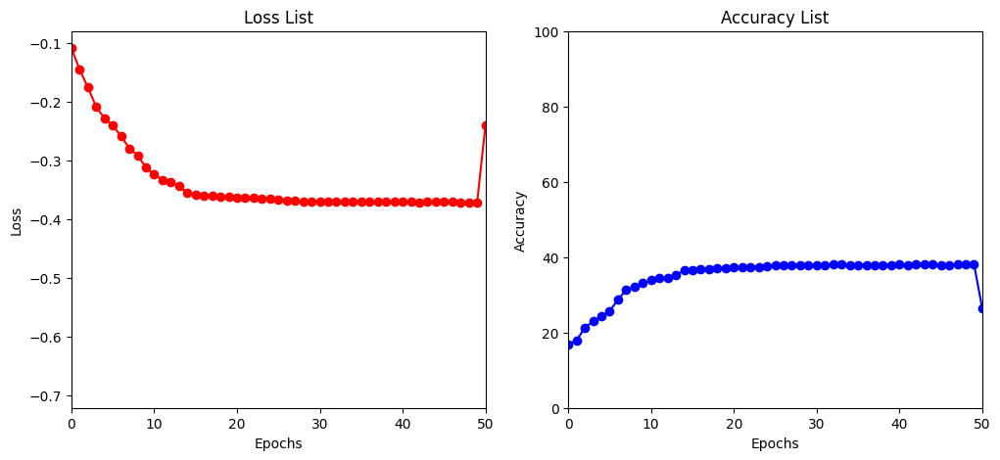

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.920111
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.936097
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.934124
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.847349

Test set: Average loss: -0.5754, Accuracy: 5815/10000 (58%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.902219
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.911906
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.903746
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.921559

Test set: Average loss: -0.5753, Accuracy: 5816/10000 (58%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.940852
Train Epoch: 33 [12800/50000 (26%)]	Loss: 1.900061
Train Epoch: 33 [25600/50000 (51%)]	Loss: 1.898576
Train Epoch: 33 [38400/50000 (77%)]	Loss: 1.869810

Test set: Average loss: -0.5753, Accuracy: 5807/10000 (58%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.871329
Train Epoch: 34 [12800/50000 (26%)]	Loss: 1.917344
Train Epoch: 34 [25600/50000 (51%)]	Loss: 1.893571
Train Epoch: 34 [38400/50000 (77%)]	Loss: 1.860510

Test set: Average

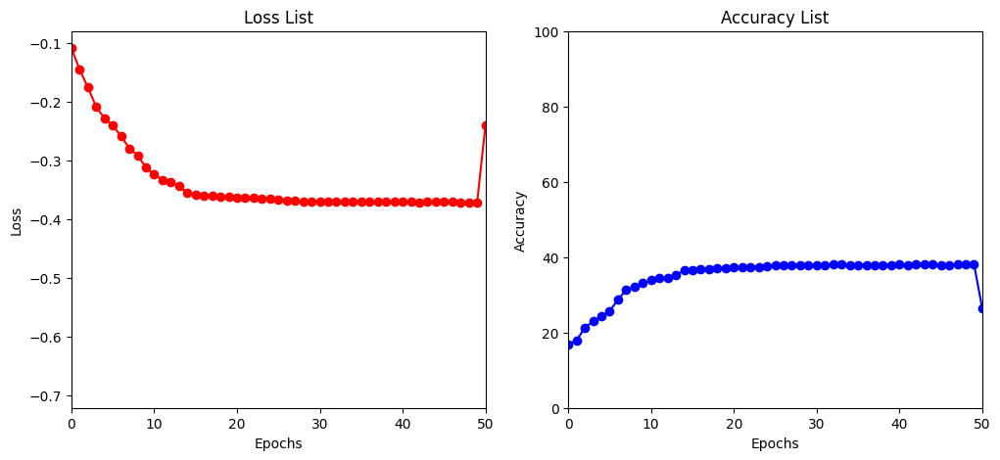

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.898028
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.911990
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.878821
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.916927

Test set: Average loss: -0.5758, Accuracy: 5825/10000 (58%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.893798
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.890388
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.922217
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.877719

Test set: Average loss: -0.5751, Accuracy: 5822/10000 (58%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.848823
Train Epoch: 38 [12800/50000 (26%)]	Loss: 1.941949
Train Epoch: 38 [25600/50000 (51%)]	Loss: 1.872042
Train Epoch: 38 [38400/50000 (77%)]	Loss: 1.895501

Test set: Average loss: -0.5758, Accuracy: 5817/10000 (58%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.880913
Train Epoch: 39 [12800/50000 (26%)]	Loss: 1.903067
Train Epoch: 39 [25600/50000 (51%)]	Loss: 1.889067
Train Epoch: 39 [38400/50000 (77%)]	Loss: 1.885711

Test set: Average

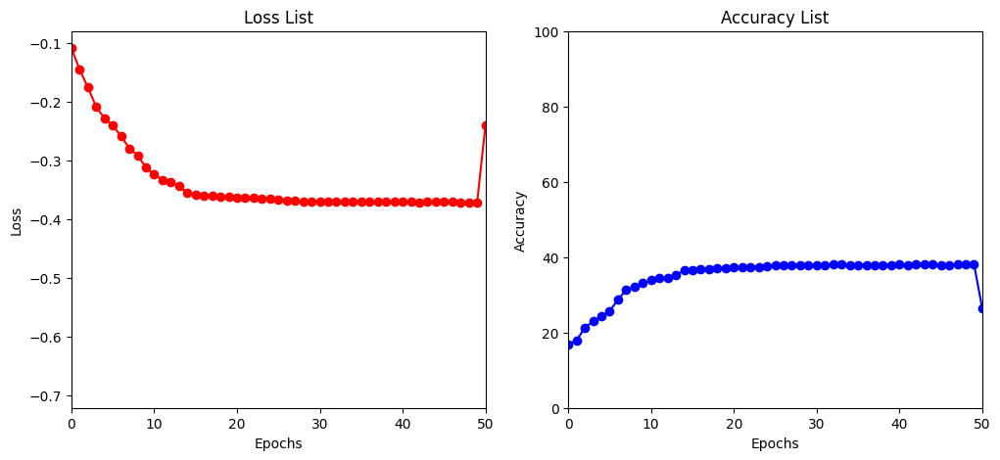

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.932499
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.909277
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.921377
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.934680

Test set: Average loss: -0.5768, Accuracy: 5832/10000 (58%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.910064
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.901778
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.881068
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.916256

Test set: Average loss: -0.5763, Accuracy: 5830/10000 (58%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.894507
Train Epoch: 43 [12800/50000 (26%)]	Loss: 1.936371
Train Epoch: 43 [25600/50000 (51%)]	Loss: 1.887885
Train Epoch: 43 [38400/50000 (77%)]	Loss: 1.925326

Test set: Average loss: -0.5765, Accuracy: 5833/10000 (58%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.832354
Train Epoch: 44 [12800/50000 (26%)]	Loss: 1.915452
Train Epoch: 44 [25600/50000 (51%)]	Loss: 1.853091
Train Epoch: 44 [38400/50000 (77%)]	Loss: 1.962722

Test set: Average

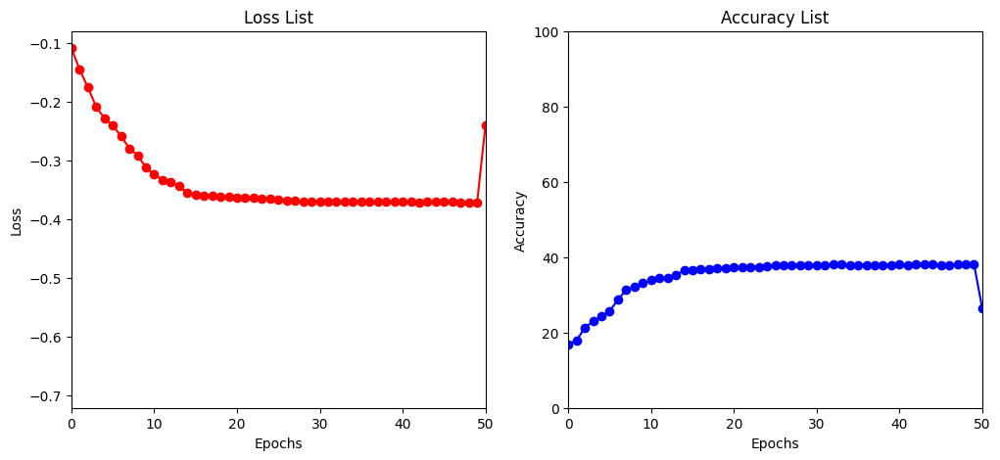

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.923006
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.895993
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.923490
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.891424

Test set: Average loss: -0.5771, Accuracy: 5827/10000 (58%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.869405
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.878504
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.877712
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.860998

Test set: Average loss: -0.5762, Accuracy: 5824/10000 (58%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.943863
Train Epoch: 48 [12800/50000 (26%)]	Loss: 1.950914
Train Epoch: 48 [25600/50000 (51%)]	Loss: 1.866252
Train Epoch: 48 [38400/50000 (77%)]	Loss: 1.873402

Test set: Average loss: -0.5769, Accuracy: 5845/10000 (58%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.872841
Train Epoch: 49 [12800/50000 (26%)]	Loss: 1.935757
Train Epoch: 49 [25600/50000 (51%)]	Loss: 1.866713
Train Epoch: 49 [38400/50000 (77%)]	Loss: 1.891729

Test set: Average

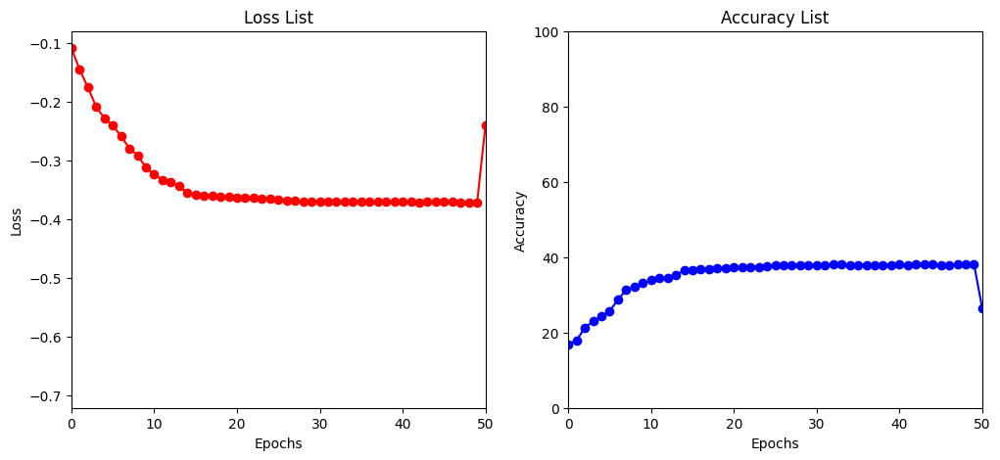

[I 2023-04-15 00:20:21,021] Trial 7 finished with value: -0.577131678390503 and parameters: {'lr': 7.06124964675615e-05, 'batch_size': 256, 'gamma': 0.1, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.304203
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.268496
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.236826
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.236841

Test set: Average loss: -0.2444, Accuracy: 2497/10000 (25%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.204456
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.190164
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.143425
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.163935

Test set: Average loss: -0.3497, Accuracy: 3562/10000 (36%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.123737
Train Epoch: 3 [12800/50000 (26%)]	Loss: 2.100566
Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.119786
Train Epoch: 3 [38400/50000 (77%)]	Loss: 2.125496

Test set: Average loss: -0.3717, Accuracy: 3789/10000 (38%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.047008
Train Epoch: 4 [12800/50000 (26%)]	Loss: 2.046587
Train Epoch: 4 [25600/50000 (51%)]	Loss: 2.139646
Train Ep

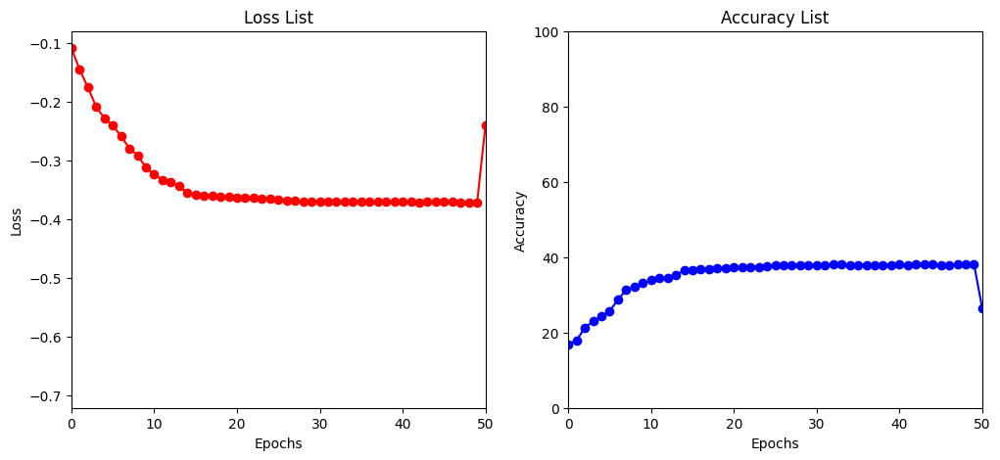

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.048718
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.066957
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.075042
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.042505

Test set: Average loss: -0.4390, Accuracy: 4441/10000 (44%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.064401
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.995748
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.061175
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.054183

Test set: Average loss: -0.4446, Accuracy: 4488/10000 (45%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.024514
Train Epoch: 8 [12800/50000 (26%)]	Loss: 2.024899
Train Epoch: 8 [25600/50000 (51%)]	Loss: 2.003053
Train Epoch: 8 [38400/50000 (77%)]	Loss: 2.019310

Test set: Average loss: -0.4708, Accuracy: 4777/10000 (48%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 2.007678
Train Epoch: 9 [12800/50000 (26%)]	Loss: 2.020289
Train Epoch: 9 [25600/50000 (51%)]	Loss: 2.040047
Train Epoch: 9 [38400/50000 (77%)]	Loss: 2.039667

Test set: Average loss: -0.4521, 

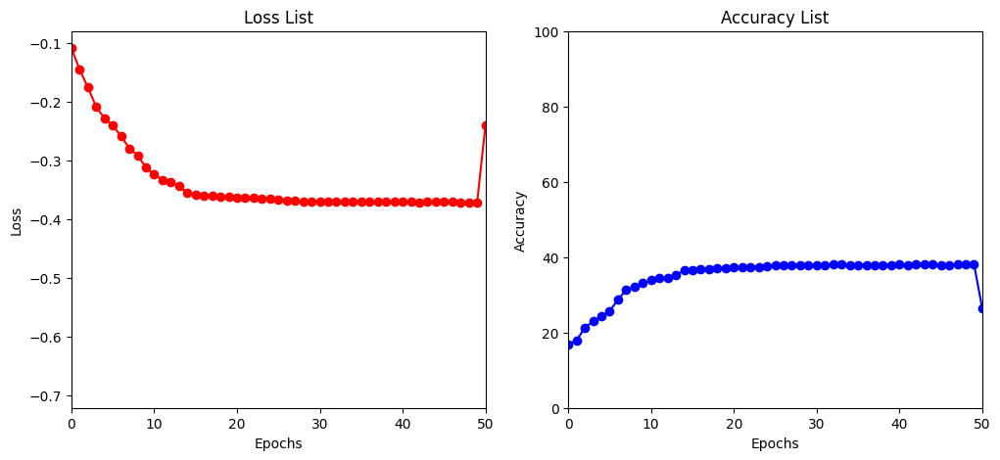

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.001868
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.049509
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.971051
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.969745

Test set: Average loss: -0.4711, Accuracy: 4739/10000 (47%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.983299
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.015561
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.041283
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.962422

Test set: Average loss: -0.4818, Accuracy: 4847/10000 (48%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.933618
Train Epoch: 13 [12800/50000 (26%)]	Loss: 2.030917
Train Epoch: 13 [25600/50000 (51%)]	Loss: 1.943197
Train Epoch: 13 [38400/50000 (77%)]	Loss: 1.991028

Test set: Average loss: -0.4776, Accuracy: 4816/10000 (48%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.937818
Train Epoch: 14 [12800/50000 (26%)]	Loss: 1.969104
Train Epoch: 14 [25600/50000 (51%)]	Loss: 1.981527
Train Epoch: 14 [38400/50000 (77%)]	Loss: 2.003093

Test set: Average

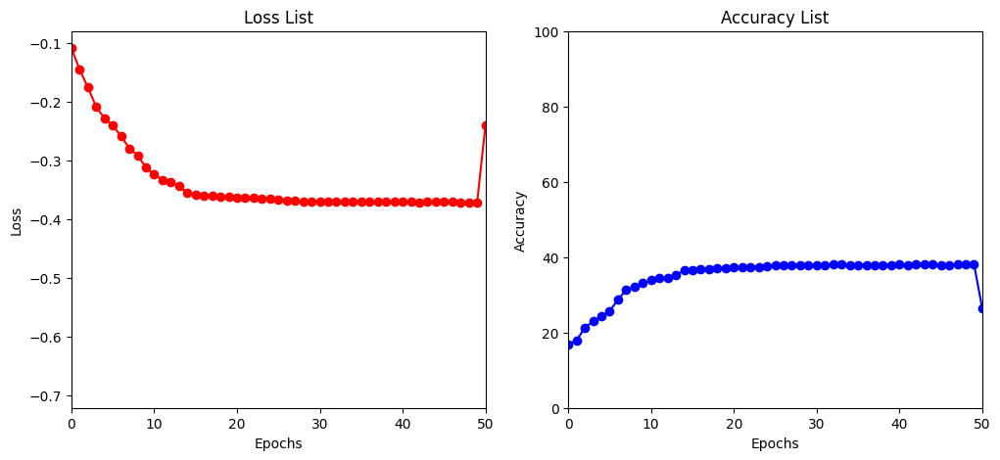

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.975337
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.915257
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.958707
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.979475

Test set: Average loss: -0.5582, Accuracy: 5636/10000 (56%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.893073
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.974618
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.855766
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.918514

Test set: Average loss: -0.5644, Accuracy: 5716/10000 (57%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.885385
Train Epoch: 18 [12800/50000 (26%)]	Loss: 1.886865
Train Epoch: 18 [25600/50000 (51%)]	Loss: 1.962630
Train Epoch: 18 [38400/50000 (77%)]	Loss: 1.899895

Test set: Average loss: -0.5700, Accuracy: 5766/10000 (58%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.962330
Train Epoch: 19 [12800/50000 (26%)]	Loss: 1.900361
Train Epoch: 19 [25600/50000 (51%)]	Loss: 1.933707
Train Epoch: 19 [38400/50000 (77%)]	Loss: 1.934462

Test set: Average

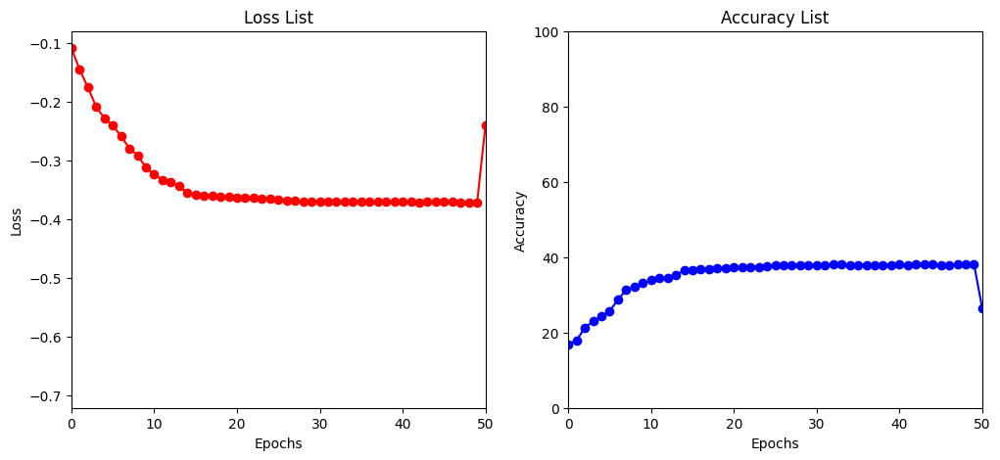

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.896449
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.882906
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.940780
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.879490

Test set: Average loss: -0.5760, Accuracy: 5815/10000 (58%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.915610
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.901300
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.900383
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.906465

Test set: Average loss: -0.5786, Accuracy: 5831/10000 (58%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.883628
Train Epoch: 23 [12800/50000 (26%)]	Loss: 1.940923
Train Epoch: 23 [25600/50000 (51%)]	Loss: 1.881492
Train Epoch: 23 [38400/50000 (77%)]	Loss: 1.934629

Test set: Average loss: -0.5814, Accuracy: 5853/10000 (59%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.888511
Train Epoch: 24 [12800/50000 (26%)]	Loss: 1.931176
Train Epoch: 24 [25600/50000 (51%)]	Loss: 1.842563
Train Epoch: 24 [38400/50000 (77%)]	Loss: 1.900487

Test set: Average

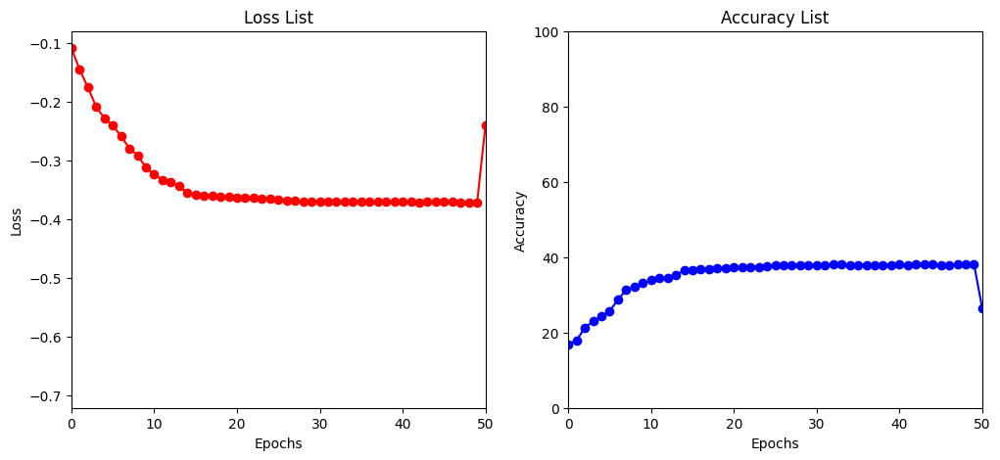

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.909849
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.909118
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.893289
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.908026

Test set: Average loss: -0.5873, Accuracy: 5918/10000 (59%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.920028
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.923148
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.911986
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.895286

Test set: Average loss: -0.5913, Accuracy: 5953/10000 (60%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.881150
Train Epoch: 28 [12800/50000 (26%)]	Loss: 1.847900
Train Epoch: 28 [25600/50000 (51%)]	Loss: 1.890381
Train Epoch: 28 [38400/50000 (77%)]	Loss: 1.894216

Test set: Average loss: -0.5896, Accuracy: 5938/10000 (59%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.864371
Train Epoch: 29 [12800/50000 (26%)]	Loss: 1.839813
Train Epoch: 29 [25600/50000 (51%)]	Loss: 1.870964
Train Epoch: 29 [38400/50000 (77%)]	Loss: 1.914891

Test set: Average

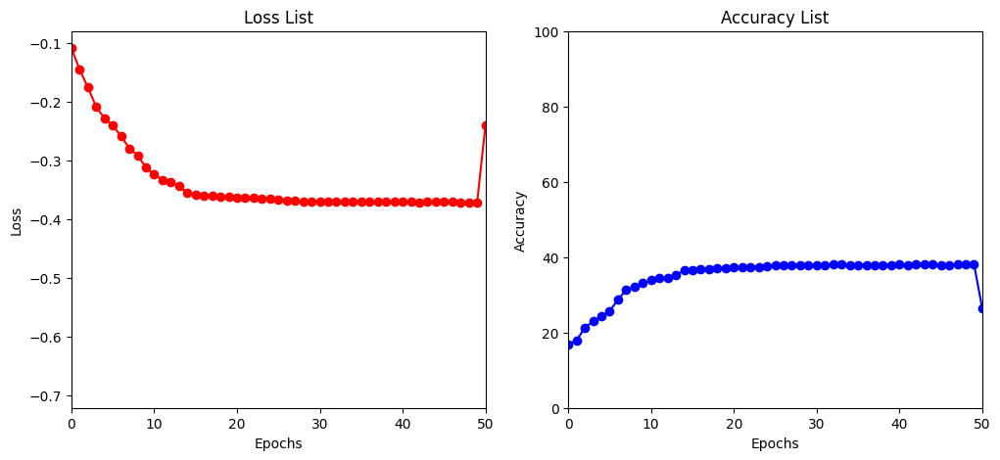

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.916423
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.914826
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.869305
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.861161

Test set: Average loss: -0.5961, Accuracy: 6001/10000 (60%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.916168
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.885237
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.898132
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.911596

Test set: Average loss: -0.5970, Accuracy: 6009/10000 (60%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.883220
Train Epoch: 33 [12800/50000 (26%)]	Loss: 1.877961
Train Epoch: 33 [25600/50000 (51%)]	Loss: 1.860033
Train Epoch: 33 [38400/50000 (77%)]	Loss: 1.830397

Test set: Average loss: -0.5984, Accuracy: 6026/10000 (60%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.865606
Train Epoch: 34 [12800/50000 (26%)]	Loss: 1.887972
Train Epoch: 34 [25600/50000 (51%)]	Loss: 1.902959
Train Epoch: 34 [38400/50000 (77%)]	Loss: 1.905606

Test set: Average

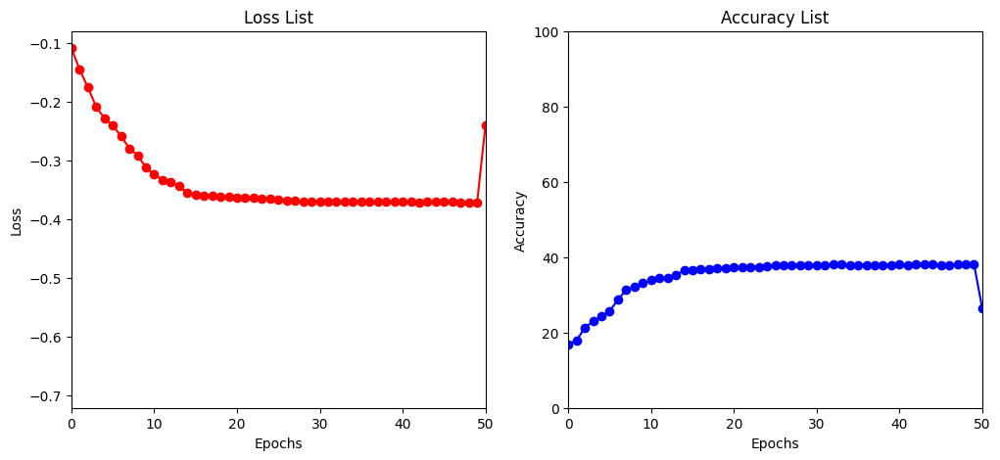

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.863782
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.910859
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.840096
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.881088

Test set: Average loss: -0.5994, Accuracy: 6039/10000 (60%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.884117
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.836452
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.906869
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.880814

Test set: Average loss: -0.5999, Accuracy: 6043/10000 (60%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.843067
Train Epoch: 38 [12800/50000 (26%)]	Loss: 1.882672
Train Epoch: 38 [25600/50000 (51%)]	Loss: 1.857217
Train Epoch: 38 [38400/50000 (77%)]	Loss: 1.869390

Test set: Average loss: -0.5996, Accuracy: 6035/10000 (60%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.856891
Train Epoch: 39 [12800/50000 (26%)]	Loss: 1.895931
Train Epoch: 39 [25600/50000 (51%)]	Loss: 1.879774
Train Epoch: 39 [38400/50000 (77%)]	Loss: 1.872734

Test set: Average

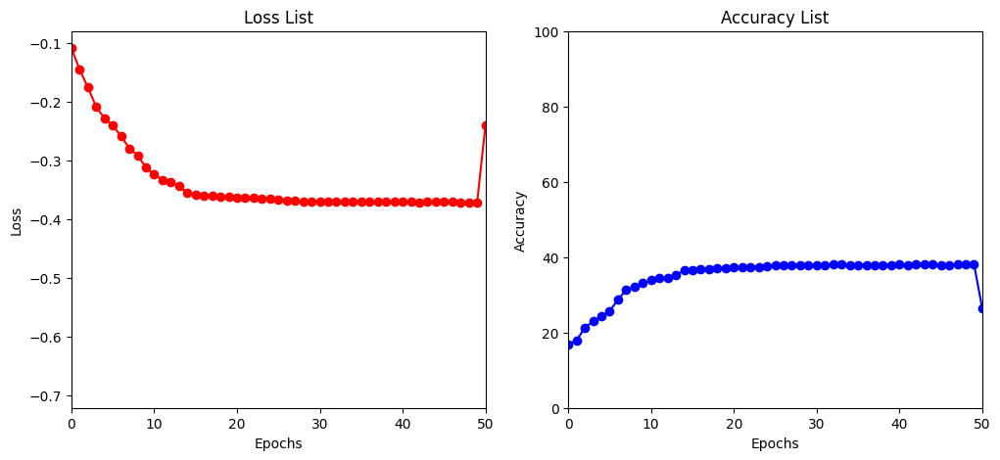

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.910285
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.890463
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.886154
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.892345

Test set: Average loss: -0.6004, Accuracy: 6041/10000 (60%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.917927
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.860258
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.871793
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.835754

Test set: Average loss: -0.6014, Accuracy: 6049/10000 (60%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.873850
Train Epoch: 43 [12800/50000 (26%)]	Loss: 1.937808
Train Epoch: 43 [25600/50000 (51%)]	Loss: 1.915044
Train Epoch: 43 [38400/50000 (77%)]	Loss: 1.879868

Test set: Average loss: -0.6017, Accuracy: 6051/10000 (61%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.810823
Train Epoch: 44 [12800/50000 (26%)]	Loss: 1.934030
Train Epoch: 44 [25600/50000 (51%)]	Loss: 1.864017
Train Epoch: 44 [38400/50000 (77%)]	Loss: 1.926890

Test set: Average

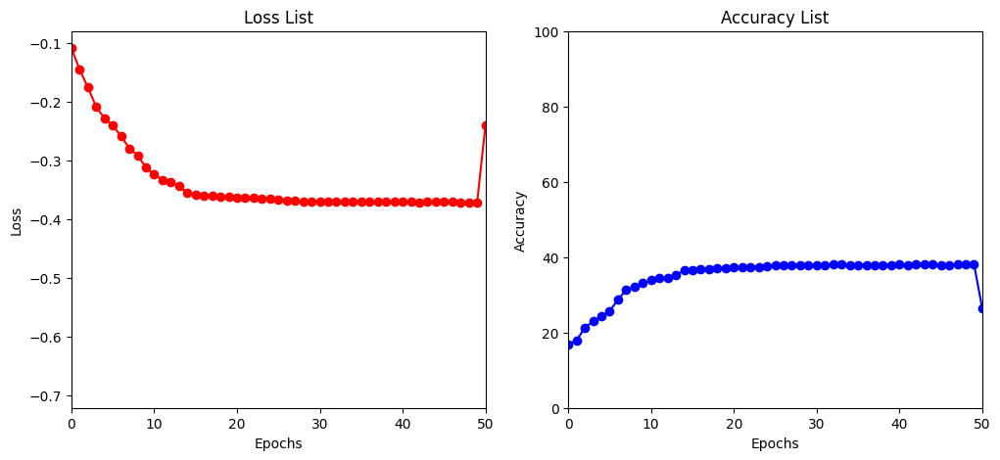

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.857322
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.873241
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.912285
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.870830

Test set: Average loss: -0.6023, Accuracy: 6065/10000 (61%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.847760
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.891446
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.863247
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.857145

Test set: Average loss: -0.6017, Accuracy: 6050/10000 (60%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.896511
Train Epoch: 48 [12800/50000 (26%)]	Loss: 1.893479
Train Epoch: 48 [25600/50000 (51%)]	Loss: 1.858073
Train Epoch: 48 [38400/50000 (77%)]	Loss: 1.838072

Test set: Average loss: -0.6016, Accuracy: 6060/10000 (61%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.852529
Train Epoch: 49 [12800/50000 (26%)]	Loss: 1.906312
Train Epoch: 49 [25600/50000 (51%)]	Loss: 1.852312
Train Epoch: 49 [38400/50000 (77%)]	Loss: 1.876090

Test set: Average

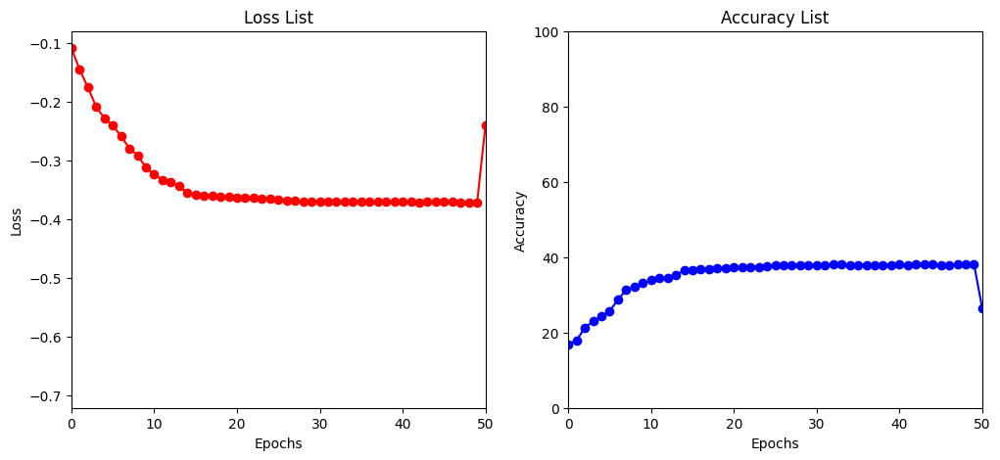

[I 2023-04-15 00:41:20,216] Trial 8 finished with value: -0.6028190940856933 and parameters: {'lr': 0.0005012131095941255, 'batch_size': 256, 'gamma': 0.1, 'droprate': 0.6}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302978
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.208258

Test set: Average loss: -0.2840, Accuracy: 3072/10000 (31%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.165084
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.134750

Test set: Average loss: -0.3740, Accuracy: 3834/10000 (38%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.075052
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.037220

Test set: Average loss: -0.4474, Accuracy: 4560/10000 (46%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.028997
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.019157

Test set: Average loss: -0.4863, Accuracy: 4964/10000 (50%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 2.001399
Train Epoch: 5 [25900/50000 (52%)]	Loss: 2.008498

Test set: Average loss: -0.4846, Accuracy: 4911/10000 (49%)



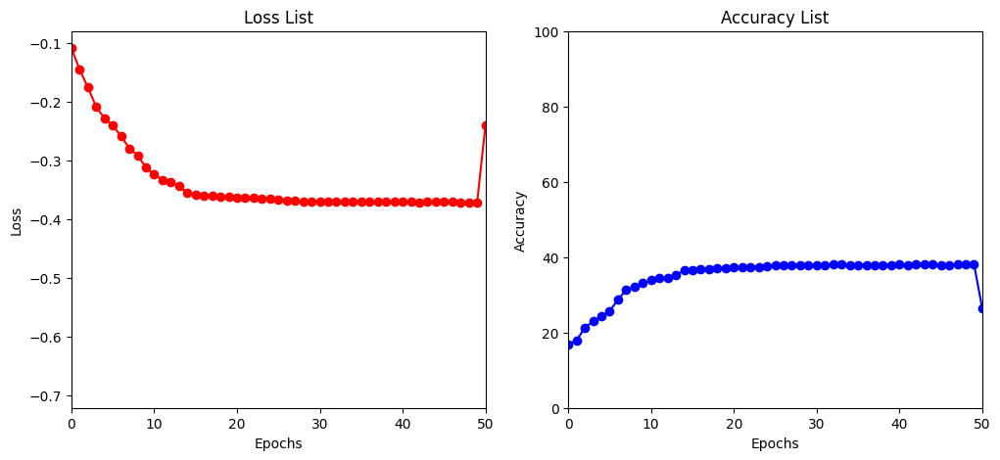

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.950950
Train Epoch: 6 [25900/50000 (52%)]	Loss: 1.977402

Test set: Average loss: -0.4996, Accuracy: 5051/10000 (51%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.965394
Train Epoch: 7 [25900/50000 (52%)]	Loss: 1.959176

Test set: Average loss: -0.4963, Accuracy: 5039/10000 (50%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.956368
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.942311

Test set: Average loss: -0.5305, Accuracy: 5355/10000 (54%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.939026
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.927777

Test set: Average loss: -0.5540, Accuracy: 5587/10000 (56%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.894595
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.879202

Test set: Average loss: -0.5382, Accuracy: 5431/10000 (54%)



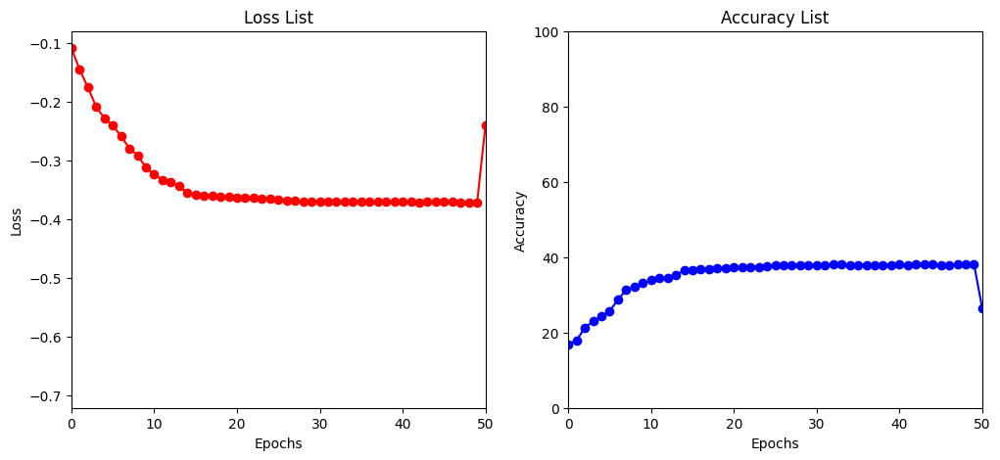

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.930668
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.917550

Test set: Average loss: -0.5625, Accuracy: 5673/10000 (57%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.882047
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.890854

Test set: Average loss: -0.5594, Accuracy: 5621/10000 (56%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.874309
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.861533

Test set: Average loss: -0.5963, Accuracy: 6032/10000 (60%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.870518
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.844886

Test set: Average loss: -0.5786, Accuracy: 5843/10000 (58%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.904031
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.872655

Test set: Average loss: -0.6140, Accuracy: 6171/10000 (62%)



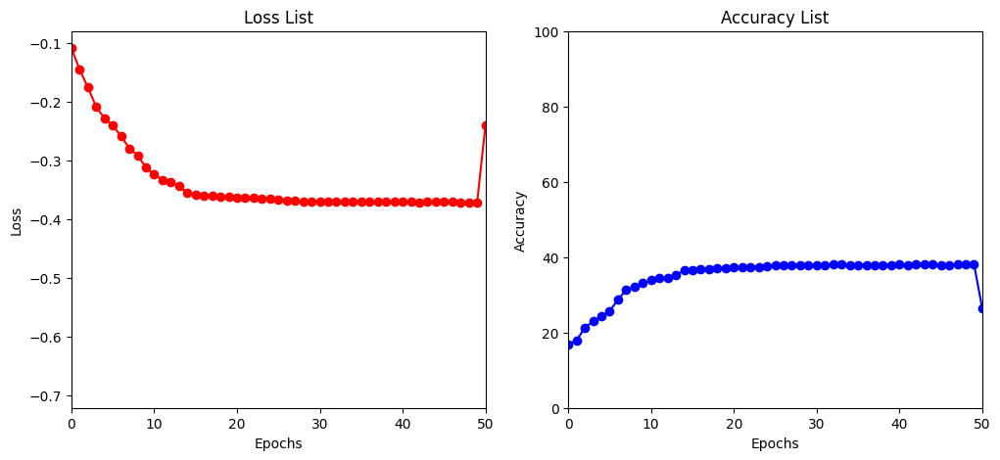

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.851692
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.838619

Test set: Average loss: -0.6518, Accuracy: 6569/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.836331
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.843779

Test set: Average loss: -0.6552, Accuracy: 6600/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.793805
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.800923

Test set: Average loss: -0.6608, Accuracy: 6643/10000 (66%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.839582
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.794121

Test set: Average loss: -0.6621, Accuracy: 6651/10000 (67%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.835252
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.799282

Test set: Average loss: -0.6642, Accuracy: 6698/10000 (67%)



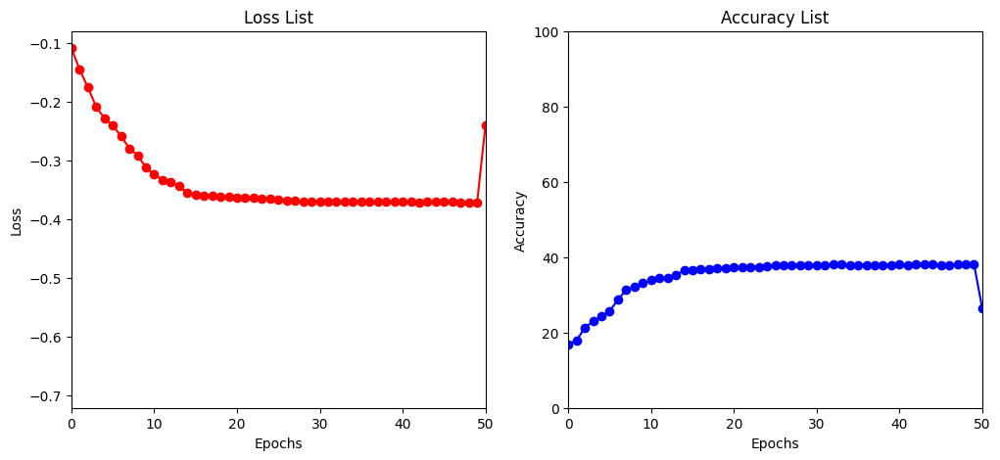

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.793160
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.833984

Test set: Average loss: -0.6681, Accuracy: 6716/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.811413
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.829135

Test set: Average loss: -0.6695, Accuracy: 6757/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.843594
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.817074

Test set: Average loss: -0.6703, Accuracy: 6736/10000 (67%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.812717
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.823884

Test set: Average loss: -0.6701, Accuracy: 6764/10000 (68%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.786163
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.789762

Test set: Average loss: -0.6705, Accuracy: 6755/10000 (68%)



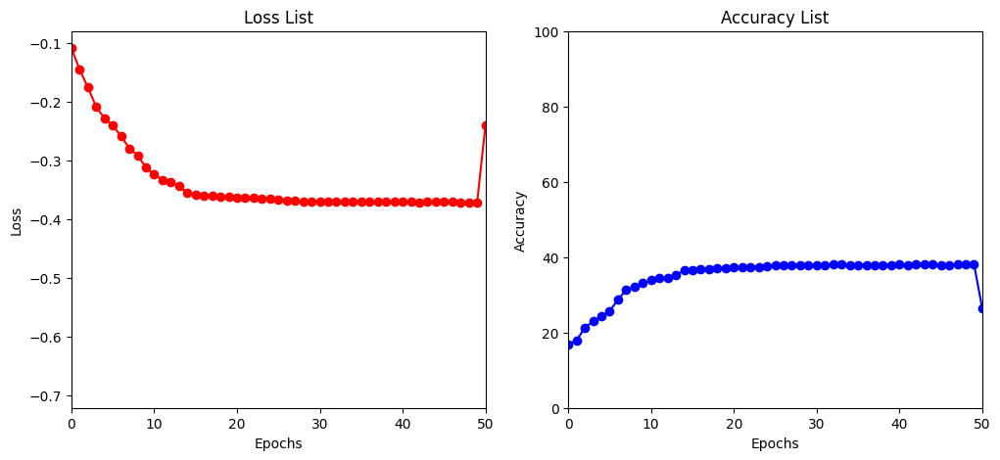

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.811961
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.813672

Test set: Average loss: -0.6745, Accuracy: 6794/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.818800
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.796757

Test set: Average loss: -0.6778, Accuracy: 6829/10000 (68%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.803511
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.790757

Test set: Average loss: -0.6775, Accuracy: 6839/10000 (68%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.785046
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.768217

Test set: Average loss: -0.6759, Accuracy: 6808/10000 (68%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.791544
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.789050

Test set: Average loss: -0.6775, Accuracy: 6824/10000 (68%)



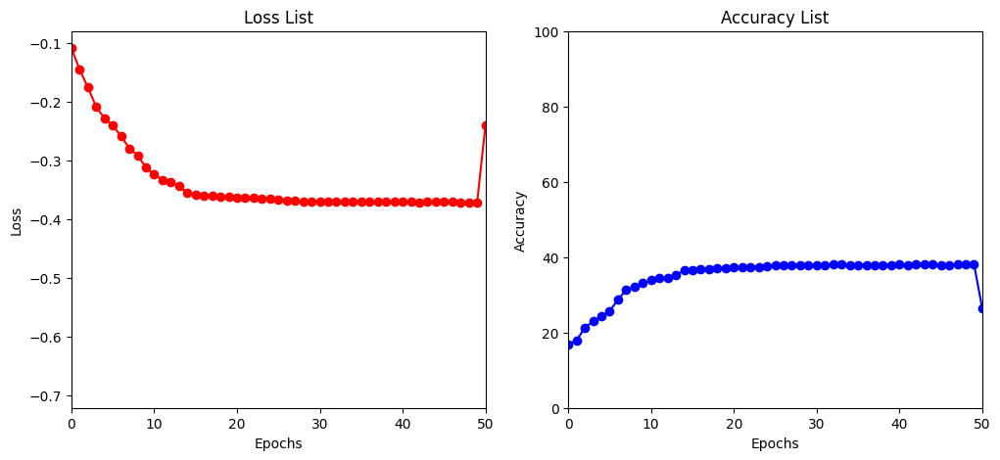

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.773915
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.781349

Test set: Average loss: -0.6798, Accuracy: 6844/10000 (68%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.793792
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.820342

Test set: Average loss: -0.6803, Accuracy: 6862/10000 (69%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.817216
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.789620

Test set: Average loss: -0.6818, Accuracy: 6878/10000 (69%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.789649
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.790599

Test set: Average loss: -0.6832, Accuracy: 6886/10000 (69%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.781931
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.817489

Test set: Average loss: -0.6834, Accuracy: 6883/10000 (69%)



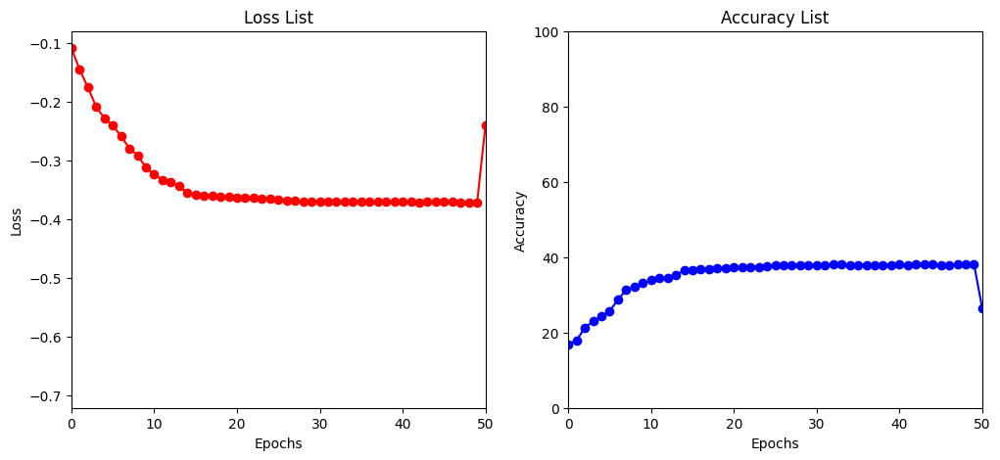

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.754732
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.779078

Test set: Average loss: -0.6837, Accuracy: 6896/10000 (69%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.828066
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.791391

Test set: Average loss: -0.6840, Accuracy: 6904/10000 (69%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.753672
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.769596

Test set: Average loss: -0.6842, Accuracy: 6919/10000 (69%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.771594
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.776219

Test set: Average loss: -0.6836, Accuracy: 6902/10000 (69%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.785156
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.783675

Test set: Average loss: -0.6839, Accuracy: 6902/10000 (69%)



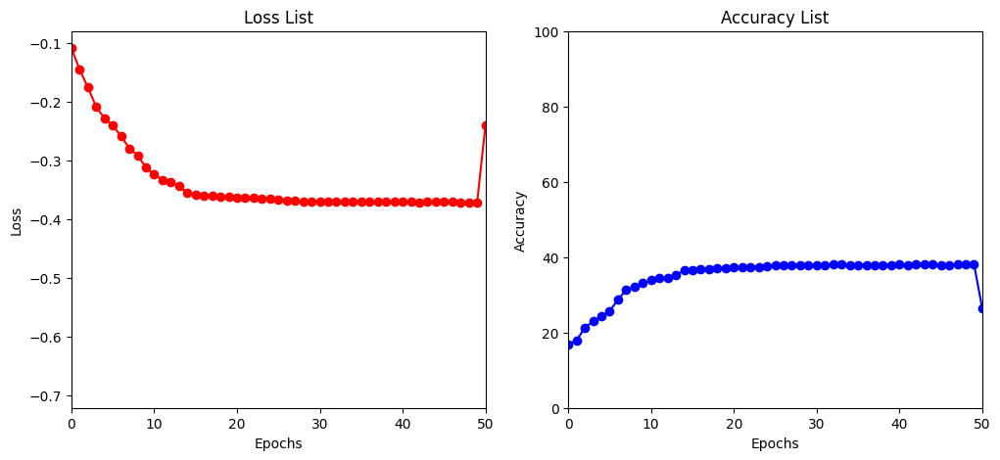

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.785783
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.793074

Test set: Average loss: -0.6843, Accuracy: 6900/10000 (69%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.782241
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.752601

Test set: Average loss: -0.6846, Accuracy: 6906/10000 (69%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.782761
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.776265

Test set: Average loss: -0.6845, Accuracy: 6914/10000 (69%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.742455
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.784491

Test set: Average loss: -0.6834, Accuracy: 6889/10000 (69%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.777894
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.785455

Test set: Average loss: -0.6849, Accuracy: 6925/10000 (69%)



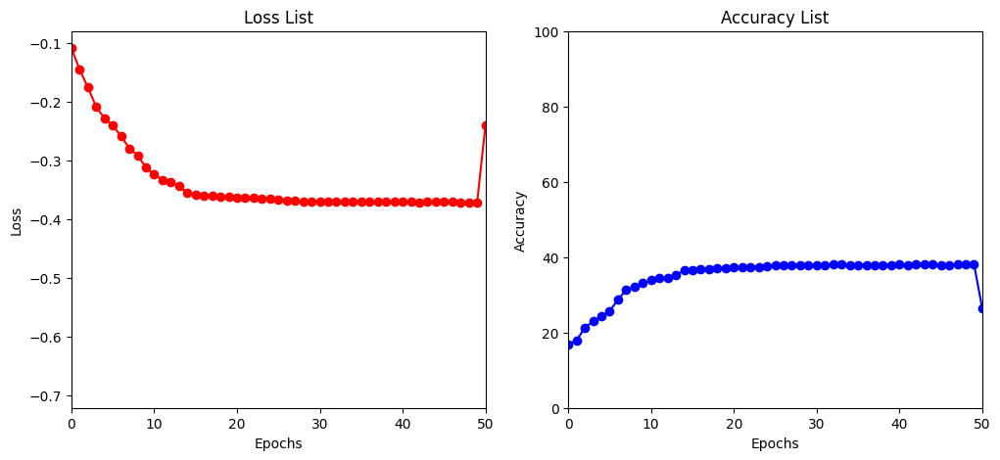

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.774138
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.754092

Test set: Average loss: -0.6854, Accuracy: 6919/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.776539
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.798711

Test set: Average loss: -0.6854, Accuracy: 6920/10000 (69%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.781326
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.792781

Test set: Average loss: -0.6850, Accuracy: 6905/10000 (69%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.785552
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.799068

Test set: Average loss: -0.6854, Accuracy: 6926/10000 (69%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.799090
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.820096

Test set: Average loss: -0.6855, Accuracy: 6927/10000 (69%)



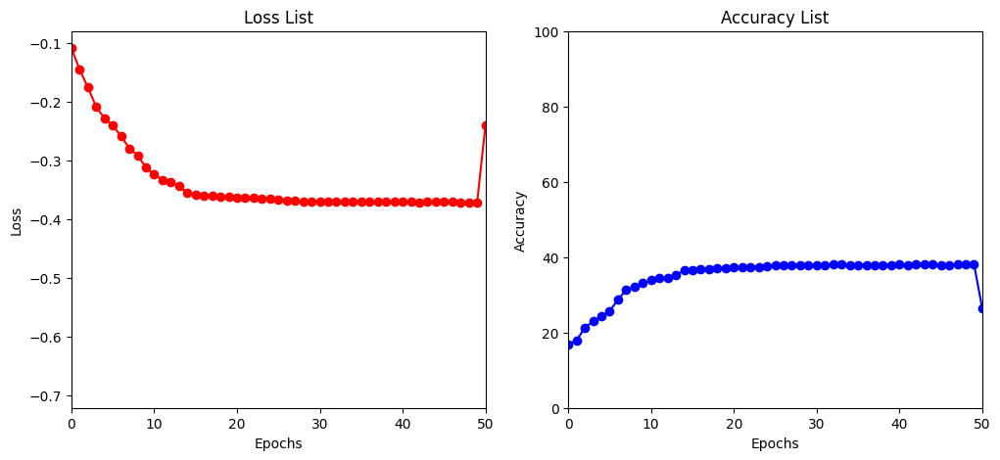

[I 2023-04-15 01:01:46,683] Trial 9 finished with value: -0.6854722496032715 and parameters: {'lr': 0.00035378871209219837, 'batch_size': 518, 'gamma': 0.1, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.226030
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.223288
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.183450
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.207057
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.184626
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.170847
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.239170

Test set: Average loss: -0.2894, Accuracy: 2970/10000 (30%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.182492
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.199950
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.174317
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.121686
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.132401
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.122280
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.103348
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.132165

Test set: Average loss: -0.3450, Accuracy: 3505/10000 (35%)

Train Epoch:

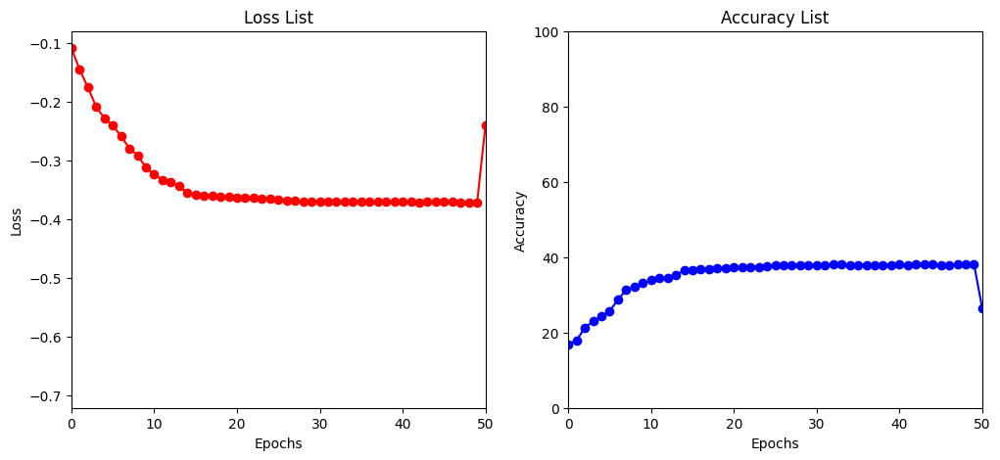

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.042157
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.111603
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.125120
Train Epoch: 6 [19200/50000 (38%)]	Loss: 2.066968
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.149931
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.125477
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.141349
Train Epoch: 6 [44800/50000 (90%)]	Loss: 2.060881

Test set: Average loss: -0.3965, Accuracy: 4007/10000 (40%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.082432
Train Epoch: 7 [6400/50000 (13%)]	Loss: 2.068710
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.098726
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.073498
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.007252
Train Epoch: 7 [32000/50000 (64%)]	Loss: 2.039299
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.114479
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.970224

Test set: Average loss: -0.4228, Accuracy: 4286/10000 (43%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.017142
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.1

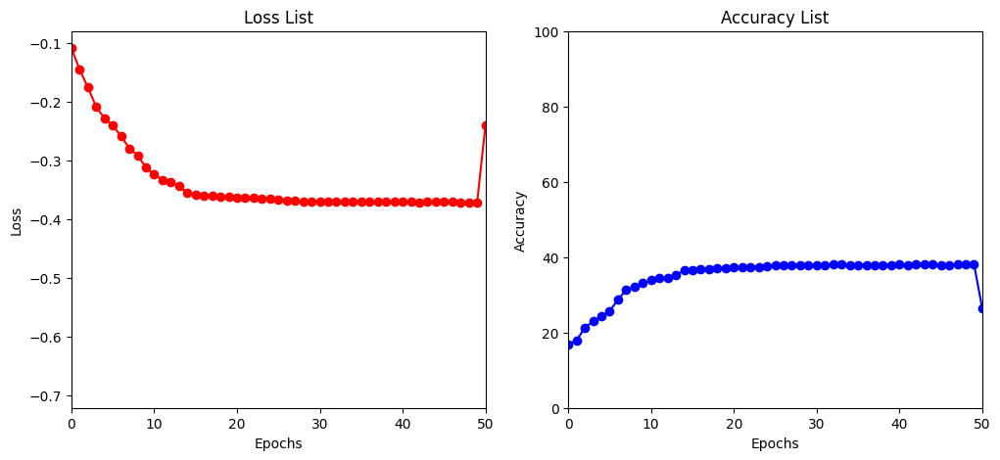

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.044944
Train Epoch: 11 [6400/50000 (13%)]	Loss: 2.078421
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.058909
Train Epoch: 11 [19200/50000 (38%)]	Loss: 2.033723
Train Epoch: 11 [25600/50000 (51%)]	Loss: 2.026480
Train Epoch: 11 [32000/50000 (64%)]	Loss: 2.013655
Train Epoch: 11 [38400/50000 (77%)]	Loss: 2.021787
Train Epoch: 11 [44800/50000 (90%)]	Loss: 2.072864

Test set: Average loss: -0.4493, Accuracy: 4525/10000 (45%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 2.037781
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.987392
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.061953
Train Epoch: 12 [19200/50000 (38%)]	Loss: 2.019392
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.086126
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.970679
Train Epoch: 12 [38400/50000 (77%)]	Loss: 2.008820
Train Epoch: 12 [44800/50000 (90%)]	Loss: 2.030049

Test set: Average loss: -0.4443, Accuracy: 4459/10000 (45%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 2.036550
Train Epoch: 13 [6400/5000

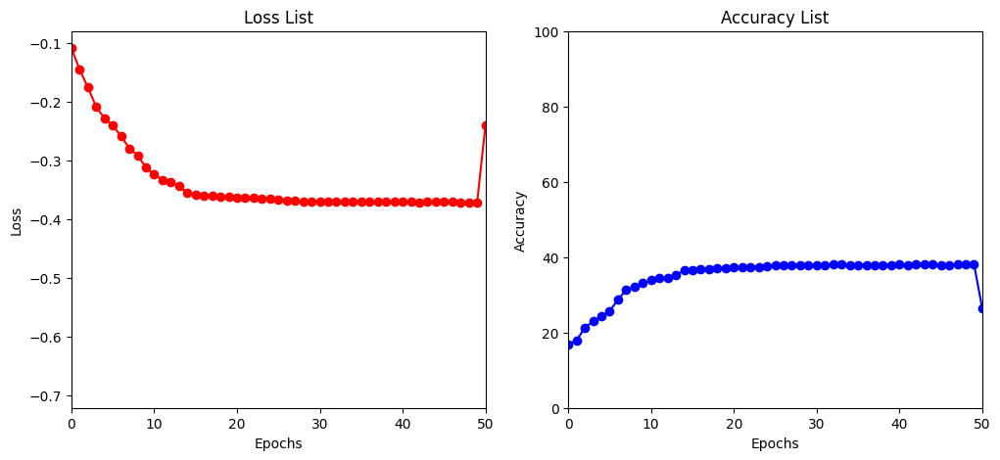

Train Epoch: 16 [0/50000 (0%)]	Loss: 2.022895
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.994232
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.959759
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.913802
Train Epoch: 16 [25600/50000 (51%)]	Loss: 2.013137
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.981872
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.970984
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.976978

Test set: Average loss: -0.5100, Accuracy: 5165/10000 (52%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.931834
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.958888
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.988559
Train Epoch: 17 [19200/50000 (38%)]	Loss: 2.015300
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.914523
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.963008
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.956829
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.908338

Test set: Average loss: -0.5176, Accuracy: 5257/10000 (53%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.967951
Train Epoch: 18 [6400/5000

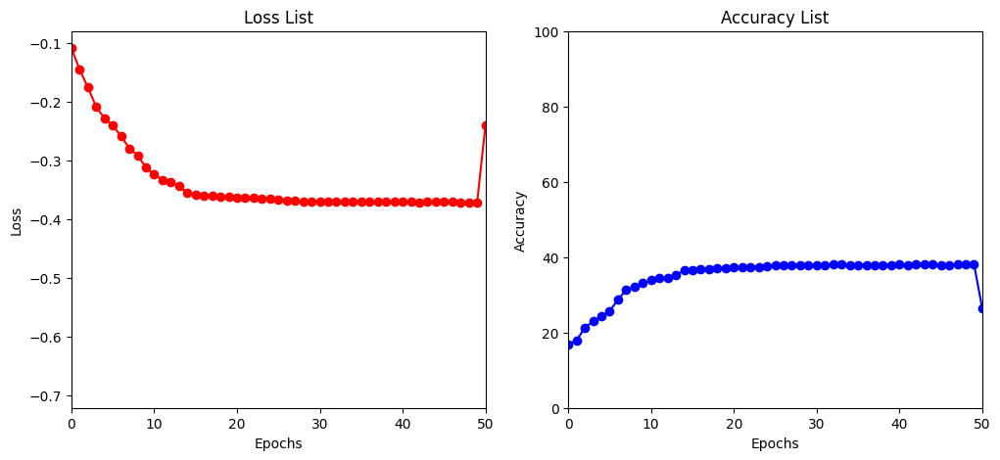

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.924009
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.913537
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.907985
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.997393
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.970363
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.931963
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.940023
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.936278

Test set: Average loss: -0.5313, Accuracy: 5386/10000 (54%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.958865
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.853247
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.920007
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.985879
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.891429
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.886648
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.957270
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.961005

Test set: Average loss: -0.5291, Accuracy: 5360/10000 (54%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.904821
Train Epoch: 23 [6400/5000

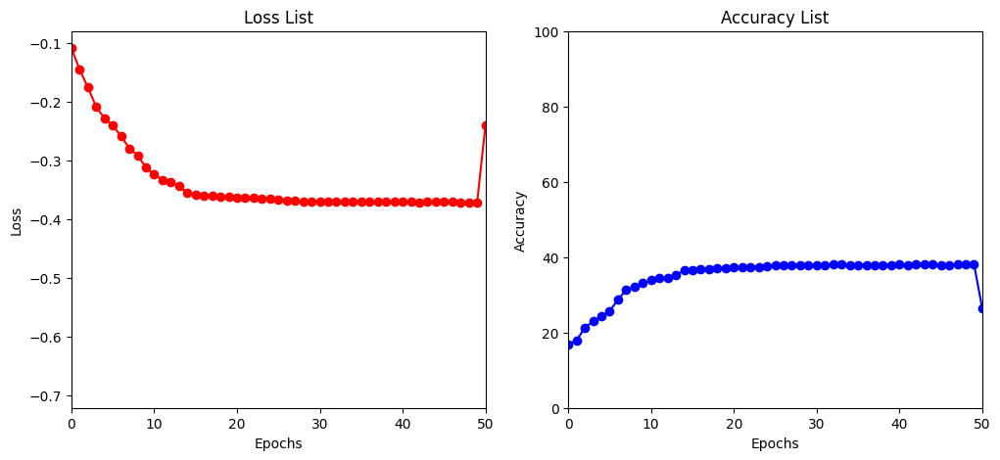

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.955302
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.955057
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.924379
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.961031
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.968621
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.919274
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.926338
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.945154

Test set: Average loss: -0.5436, Accuracy: 5508/10000 (55%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.975480
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.938585
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.996065
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.900424
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.957336
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.982441
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.915066
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.916366

Test set: Average loss: -0.5472, Accuracy: 5550/10000 (56%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.945167
Train Epoch: 28 [6400/5000

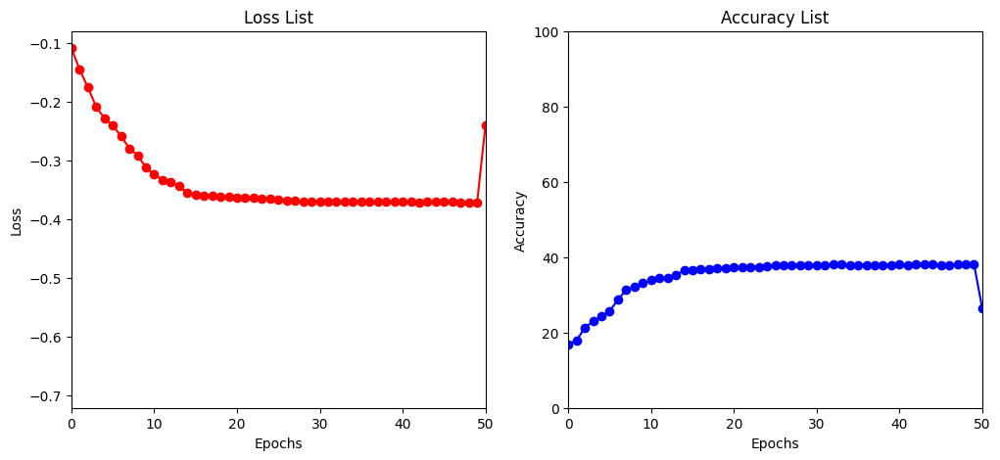

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.924886
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.877876
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.949538
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.924222
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.938006
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.976522
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.839323
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.968928

Test set: Average loss: -0.5512, Accuracy: 5573/10000 (56%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.946291
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.967857
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.844871
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.885488
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.925228
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.901579
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.937089
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.900591

Test set: Average loss: -0.5523, Accuracy: 5585/10000 (56%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.864878
Train Epoch: 33 [6400/5000

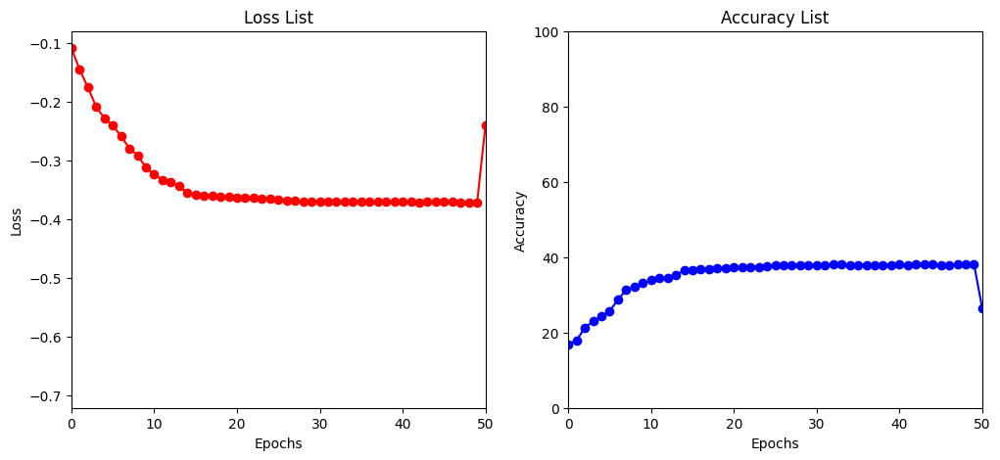

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.913521
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.898896
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.967345
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.867705
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.868759
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.939952
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.956770
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.941860

Test set: Average loss: -0.5545, Accuracy: 5628/10000 (56%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.958212
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.928273
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.835276
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.918758
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.938641
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.912972
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.923568
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.864605

Test set: Average loss: -0.5547, Accuracy: 5613/10000 (56%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.871566
Train Epoch: 38 [6400/5000

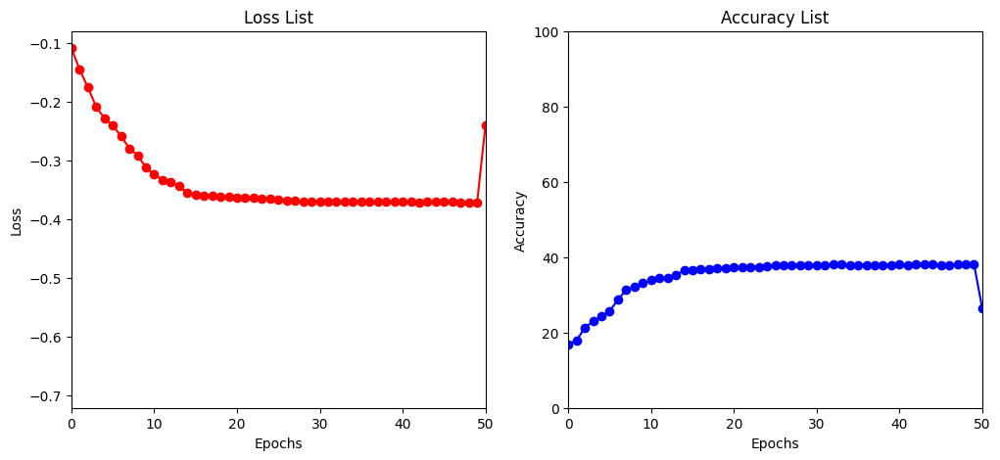

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.988802
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.976559
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.921852
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.836650
Train Epoch: 41 [25600/50000 (51%)]	Loss: 2.027957
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.939680
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.957270
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.989038

Test set: Average loss: -0.5568, Accuracy: 5624/10000 (56%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.895914
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.895361
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.919443
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.934039
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.840315
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.901514
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.873874
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.902672

Test set: Average loss: -0.5562, Accuracy: 5620/10000 (56%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.908153
Train Epoch: 43 [6400/5000

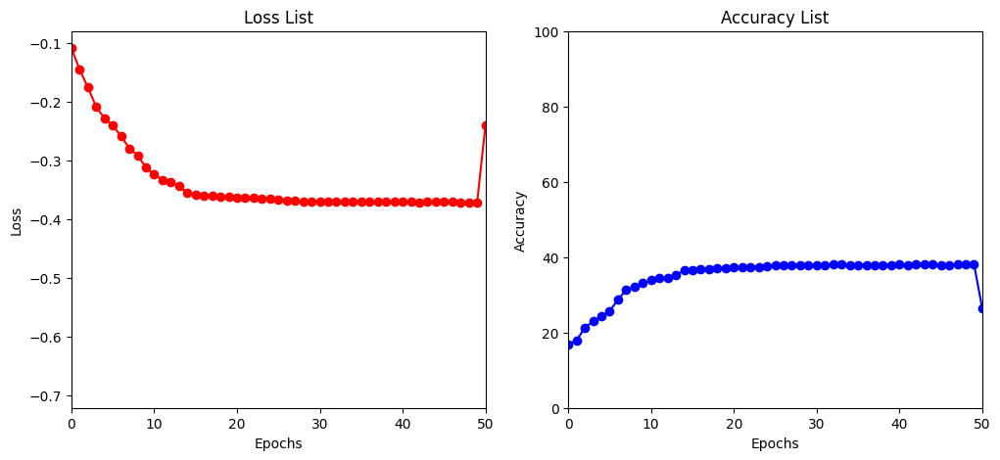

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.863131
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.981169
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.861553
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.910235
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.942154
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.931687
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.918880
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.897438

Test set: Average loss: -0.5571, Accuracy: 5635/10000 (56%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.841786
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.927604
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.925741
Train Epoch: 47 [19200/50000 (38%)]	Loss: 2.011957
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.838660
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.871556
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.860587
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.905603

Test set: Average loss: -0.5566, Accuracy: 5628/10000 (56%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.962355
Train Epoch: 48 [6400/5000

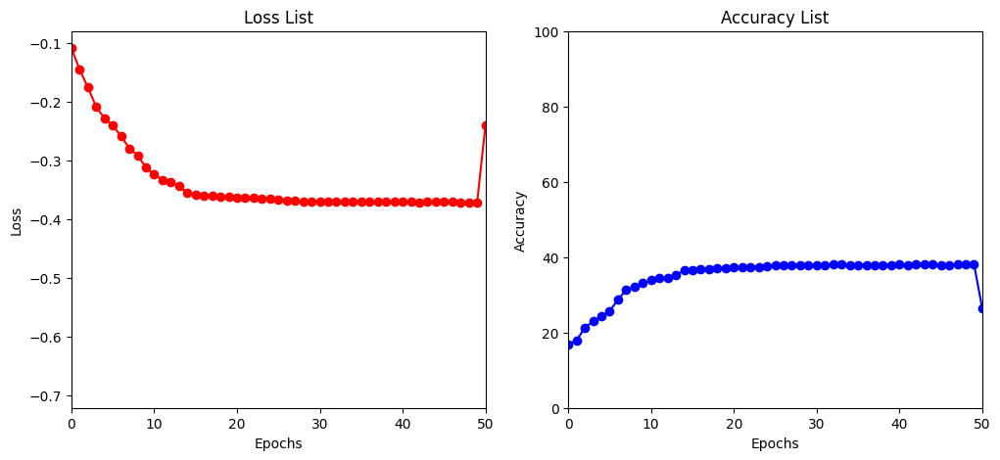

[I 2023-04-15 01:23:37,450] Trial 10 finished with value: -0.557431846666336 and parameters: {'lr': 0.0008125928358222546, 'batch_size': 128, 'gamma': 0.08, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302978
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.213595

Test set: Average loss: -0.2328, Accuracy: 2531/10000 (25%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.194112
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.143181

Test set: Average loss: -0.3424, Accuracy: 3476/10000 (35%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.073927
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.050446

Test set: Average loss: -0.4288, Accuracy: 4339/10000 (43%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 1.999144
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.004059

Test set: Average loss: -0.4900, Accuracy: 4954/10000 (50%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 1.986253
Train Epoch: 5 [25900/50000 (52%)]	Loss: 1.976468

Test set: Average loss: -0.5188, Accuracy: 5282/10000 (53%)



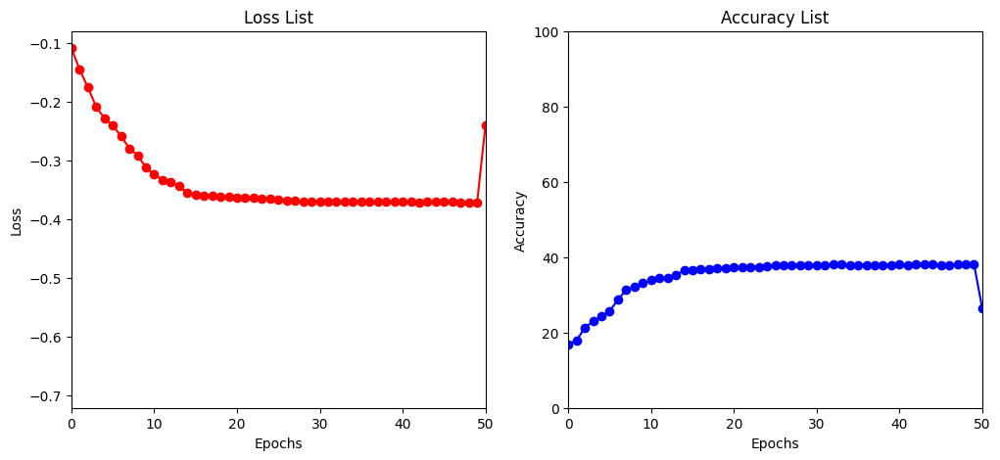

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.958698
Train Epoch: 6 [25900/50000 (52%)]	Loss: 1.952326

Test set: Average loss: -0.5158, Accuracy: 5230/10000 (52%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.938894
Train Epoch: 7 [25900/50000 (52%)]	Loss: 1.938016

Test set: Average loss: -0.5185, Accuracy: 5258/10000 (53%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.919179
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.904204

Test set: Average loss: -0.5516, Accuracy: 5588/10000 (56%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.907705
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.887738

Test set: Average loss: -0.5627, Accuracy: 5684/10000 (57%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.873535
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.887286

Test set: Average loss: -0.5856, Accuracy: 5878/10000 (59%)



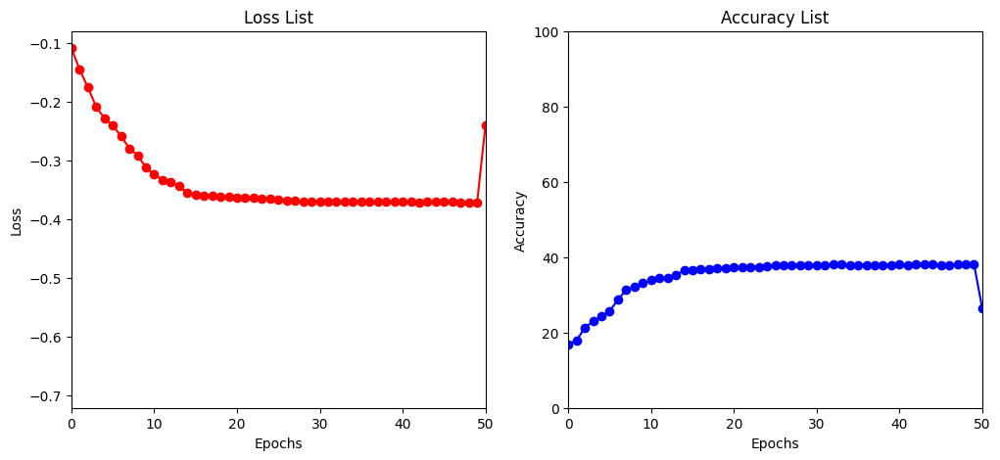

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.913083
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.866526

Test set: Average loss: -0.5616, Accuracy: 5658/10000 (57%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.857849
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.879354

Test set: Average loss: -0.5932, Accuracy: 5976/10000 (60%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.838650
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.857034

Test set: Average loss: -0.6070, Accuracy: 6136/10000 (61%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.860323
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.823098

Test set: Average loss: -0.5963, Accuracy: 5996/10000 (60%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.877543
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.873467

Test set: Average loss: -0.6067, Accuracy: 6123/10000 (61%)



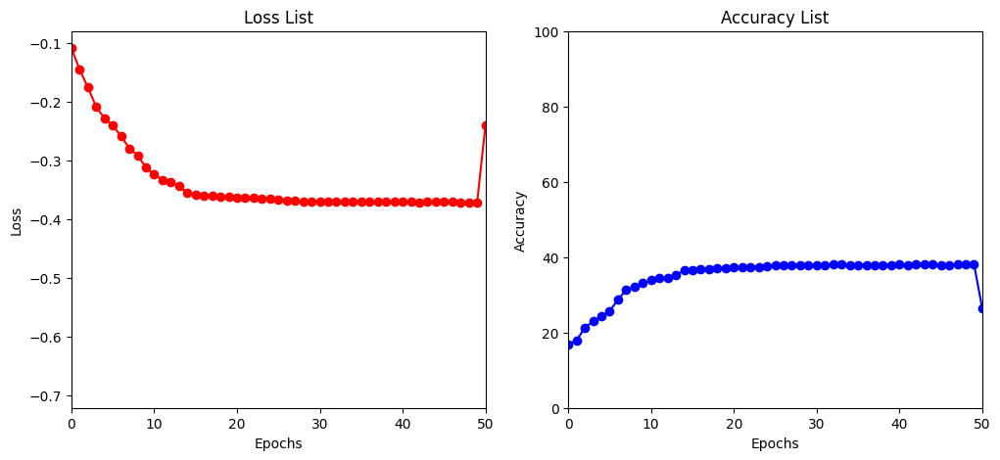

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.826066
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.824708

Test set: Average loss: -0.6573, Accuracy: 6616/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.801168
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.826408

Test set: Average loss: -0.6606, Accuracy: 6653/10000 (67%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.771359
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.816039

Test set: Average loss: -0.6658, Accuracy: 6720/10000 (67%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.831344
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.787678

Test set: Average loss: -0.6657, Accuracy: 6704/10000 (67%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.816116
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.824812

Test set: Average loss: -0.6701, Accuracy: 6737/10000 (67%)



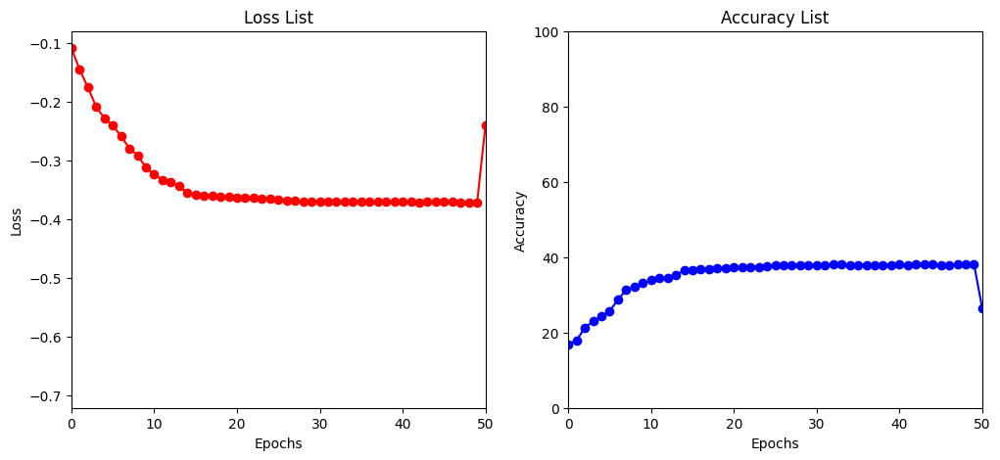

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.811811
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.817986

Test set: Average loss: -0.6702, Accuracy: 6752/10000 (68%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.804157
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.815579

Test set: Average loss: -0.6710, Accuracy: 6769/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.819714
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.795559

Test set: Average loss: -0.6725, Accuracy: 6778/10000 (68%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.806316
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.829297

Test set: Average loss: -0.6758, Accuracy: 6811/10000 (68%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.816371
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.817049

Test set: Average loss: -0.6753, Accuracy: 6815/10000 (68%)



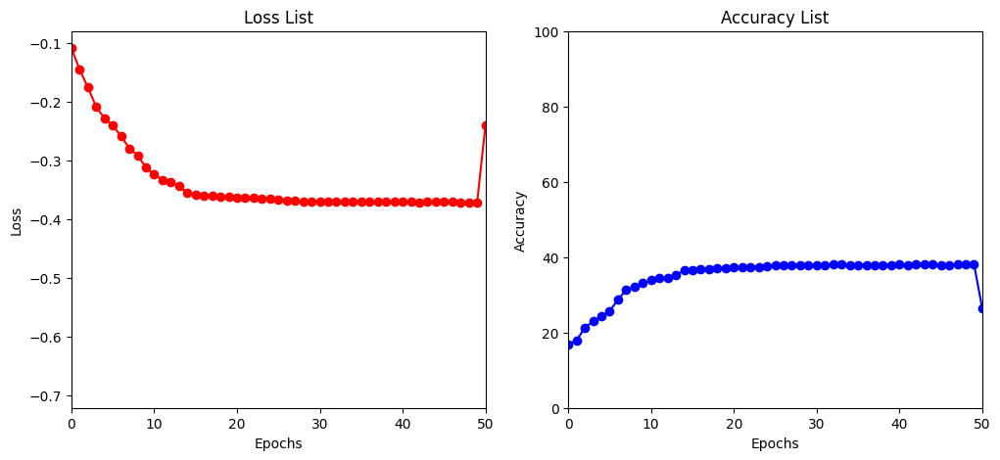

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.819475
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.798223

Test set: Average loss: -0.6776, Accuracy: 6834/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.812006
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.782571

Test set: Average loss: -0.6783, Accuracy: 6827/10000 (68%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.800122
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.765985

Test set: Average loss: -0.6783, Accuracy: 6825/10000 (68%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.780103
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.773651

Test set: Average loss: -0.6815, Accuracy: 6847/10000 (68%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.809892
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.781513

Test set: Average loss: -0.6837, Accuracy: 6889/10000 (69%)



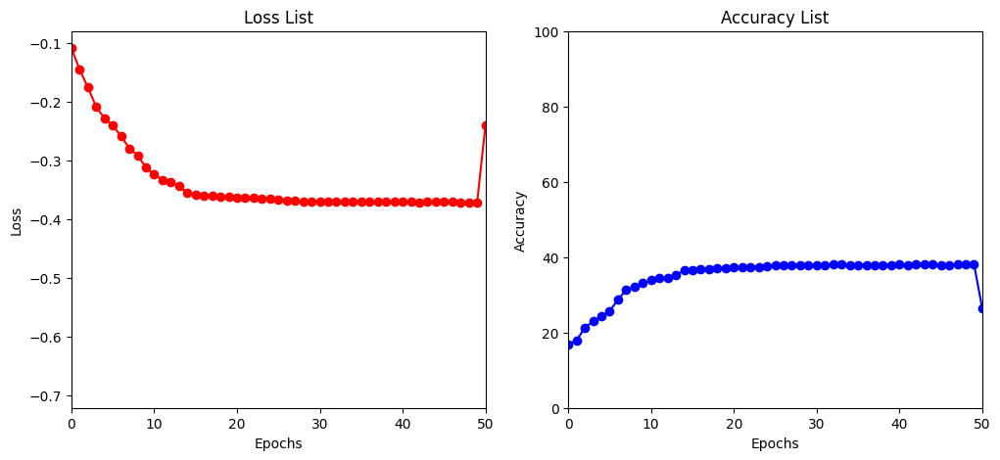

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.756139
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.769680

Test set: Average loss: -0.6842, Accuracy: 6890/10000 (69%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.789373
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.781366

Test set: Average loss: -0.6844, Accuracy: 6888/10000 (69%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.796946
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.765693

Test set: Average loss: -0.6854, Accuracy: 6899/10000 (69%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.779947
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.786115

Test set: Average loss: -0.6859, Accuracy: 6888/10000 (69%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.765634
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.815057

Test set: Average loss: -0.6856, Accuracy: 6894/10000 (69%)



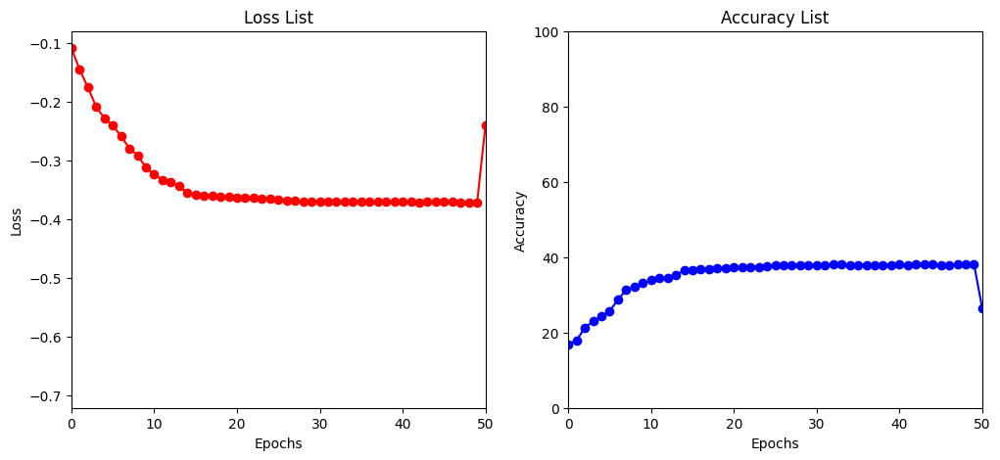

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.757968
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.756153

Test set: Average loss: -0.6867, Accuracy: 6912/10000 (69%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.812804
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.810503

Test set: Average loss: -0.6859, Accuracy: 6892/10000 (69%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.753608
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.770998

Test set: Average loss: -0.6866, Accuracy: 6900/10000 (69%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.768622
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.787477

Test set: Average loss: -0.6873, Accuracy: 6932/10000 (69%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.773570
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.785664

Test set: Average loss: -0.6880, Accuracy: 6925/10000 (69%)



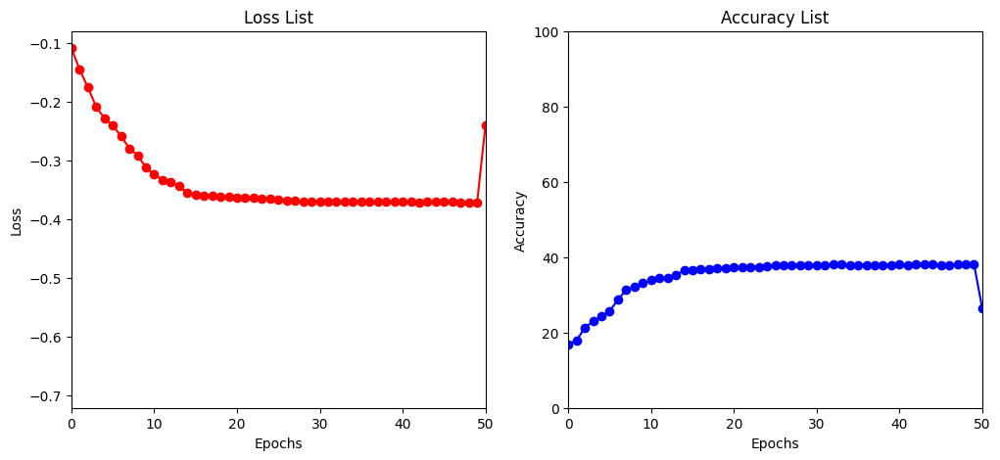

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.782735
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.787922

Test set: Average loss: -0.6874, Accuracy: 6911/10000 (69%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.791333
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.766691

Test set: Average loss: -0.6867, Accuracy: 6901/10000 (69%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.791883
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.784315

Test set: Average loss: -0.6879, Accuracy: 6925/10000 (69%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.739020
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.785791

Test set: Average loss: -0.6874, Accuracy: 6922/10000 (69%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.772097
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.761810

Test set: Average loss: -0.6874, Accuracy: 6912/10000 (69%)



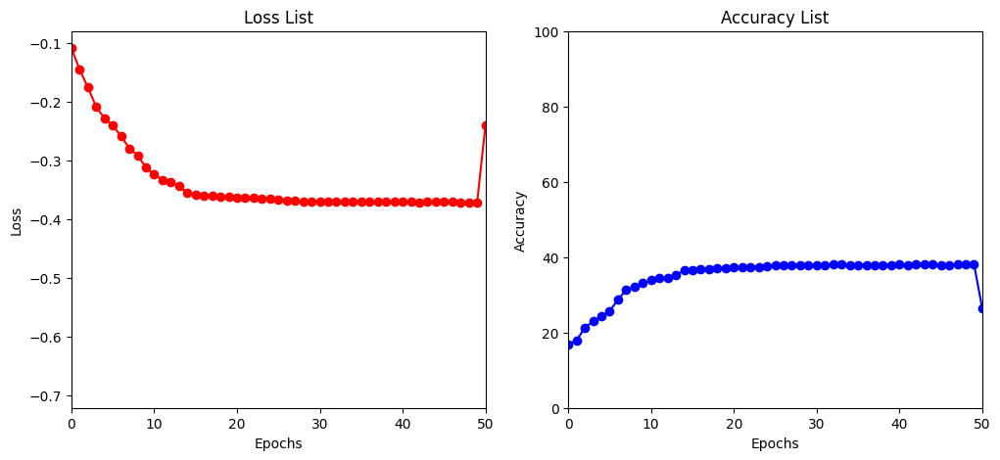

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.748488
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.769070

Test set: Average loss: -0.6877, Accuracy: 6915/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.769163
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.787593

Test set: Average loss: -0.6875, Accuracy: 6915/10000 (69%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.773771
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.761422

Test set: Average loss: -0.6889, Accuracy: 6940/10000 (69%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.781179
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.762943

Test set: Average loss: -0.6878, Accuracy: 6912/10000 (69%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.772690
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.806961

Test set: Average loss: -0.6886, Accuracy: 6921/10000 (69%)



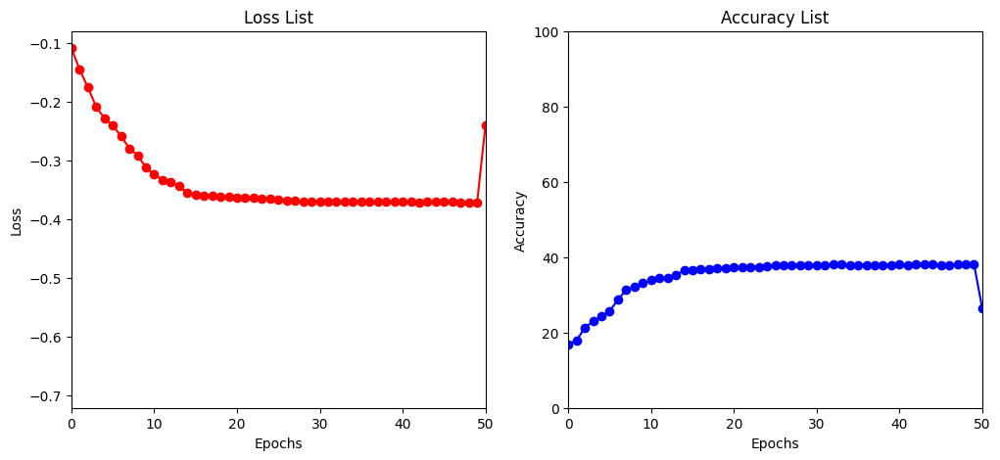

[I 2023-04-15 01:44:03,979] Trial 11 finished with value: -0.6885943031311035 and parameters: {'lr': 0.00027644106070237254, 'batch_size': 518, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302978
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.225019

Test set: Average loss: -0.2485, Accuracy: 2692/10000 (27%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.191857
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.148102

Test set: Average loss: -0.3261, Accuracy: 3326/10000 (33%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.079487
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.040132

Test set: Average loss: -0.4575, Accuracy: 4715/10000 (47%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.010185
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.017396

Test set: Average loss: -0.4831, Accuracy: 4899/10000 (49%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 1.988325
Train Epoch: 5 [25900/50000 (52%)]	Loss: 1.982584

Test set: Average loss: -0.4630, Accuracy: 4693/10000 (47%)



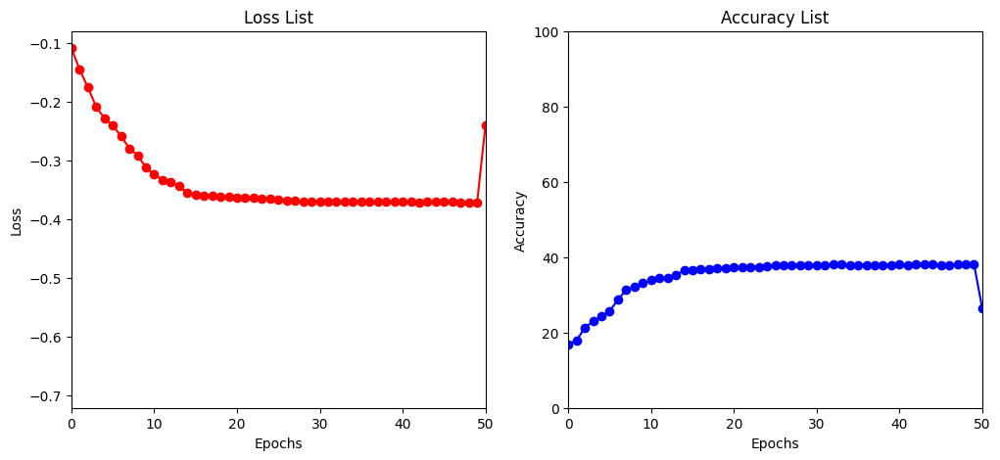

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.964923
Train Epoch: 6 [25900/50000 (52%)]	Loss: 1.966197

Test set: Average loss: -0.4881, Accuracy: 4941/10000 (49%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.953020
Train Epoch: 7 [25900/50000 (52%)]	Loss: 1.934806

Test set: Average loss: -0.5169, Accuracy: 5221/10000 (52%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.912232
Train Epoch: 8 [25900/50000 (52%)]	Loss: 1.924984

Test set: Average loss: -0.5205, Accuracy: 5280/10000 (53%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 1.928951
Train Epoch: 9 [25900/50000 (52%)]	Loss: 1.875143

Test set: Average loss: -0.5199, Accuracy: 5252/10000 (53%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 1.906664
Train Epoch: 10 [25900/50000 (52%)]	Loss: 1.893423

Test set: Average loss: -0.5514, Accuracy: 5583/10000 (56%)



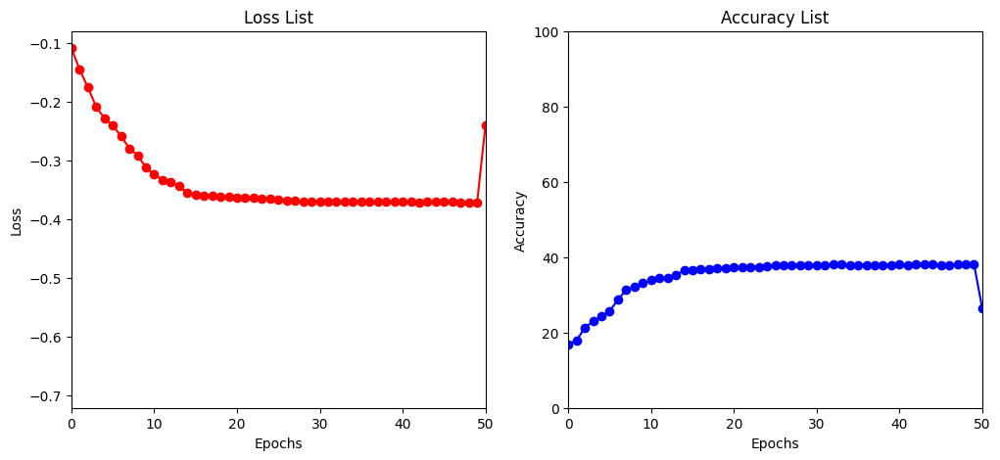

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.916906
Train Epoch: 11 [25900/50000 (52%)]	Loss: 1.908735

Test set: Average loss: -0.5744, Accuracy: 5809/10000 (58%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.878204
Train Epoch: 12 [25900/50000 (52%)]	Loss: 1.886778

Test set: Average loss: -0.5708, Accuracy: 5761/10000 (58%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.873827
Train Epoch: 13 [25900/50000 (52%)]	Loss: 1.862290

Test set: Average loss: -0.5597, Accuracy: 5627/10000 (56%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 1.871532
Train Epoch: 14 [25900/50000 (52%)]	Loss: 1.835742

Test set: Average loss: -0.6039, Accuracy: 6078/10000 (61%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 1.857797
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.879708

Test set: Average loss: -0.6171, Accuracy: 6224/10000 (62%)



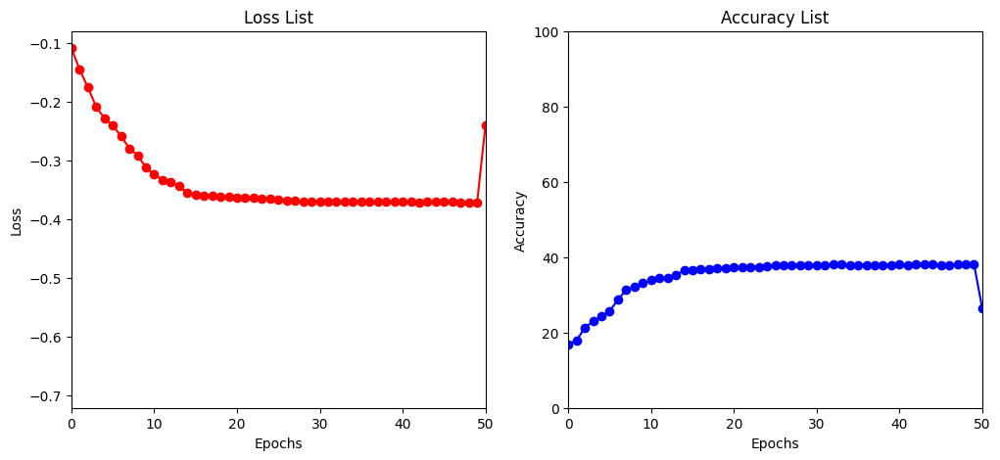

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.839862
Train Epoch: 16 [25900/50000 (52%)]	Loss: 1.847197

Test set: Average loss: -0.6381, Accuracy: 6440/10000 (64%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.824012
Train Epoch: 17 [25900/50000 (52%)]	Loss: 1.841130

Test set: Average loss: -0.6409, Accuracy: 6470/10000 (65%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.790397
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.838415

Test set: Average loss: -0.6411, Accuracy: 6466/10000 (65%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 1.838295
Train Epoch: 19 [25900/50000 (52%)]	Loss: 1.810212

Test set: Average loss: -0.6478, Accuracy: 6545/10000 (65%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 1.841691
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.841335

Test set: Average loss: -0.6477, Accuracy: 6543/10000 (65%)



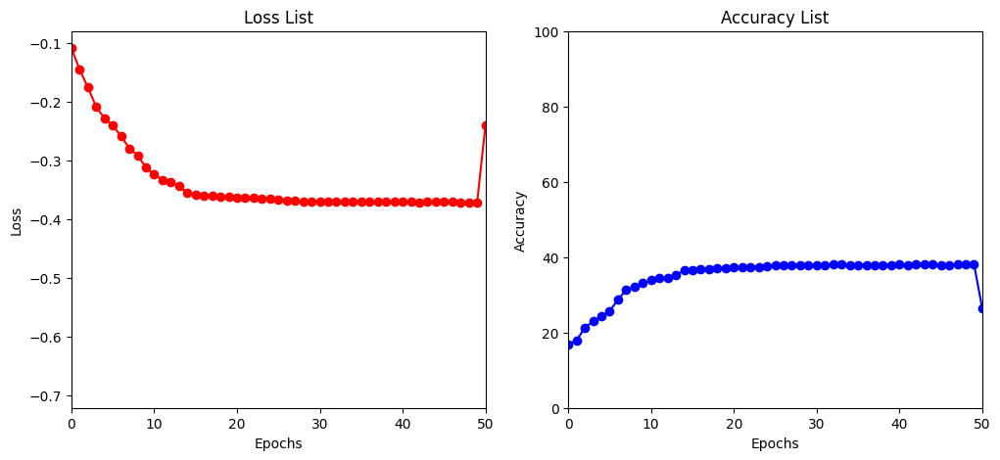

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.831754
Train Epoch: 21 [25900/50000 (52%)]	Loss: 1.842609

Test set: Average loss: -0.6485, Accuracy: 6524/10000 (65%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.837794
Train Epoch: 22 [25900/50000 (52%)]	Loss: 1.838408

Test set: Average loss: -0.6517, Accuracy: 6594/10000 (66%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.853975
Train Epoch: 23 [25900/50000 (52%)]	Loss: 1.809420

Test set: Average loss: -0.6531, Accuracy: 6588/10000 (66%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 1.815838
Train Epoch: 24 [25900/50000 (52%)]	Loss: 1.858519

Test set: Average loss: -0.6555, Accuracy: 6623/10000 (66%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.811321
Train Epoch: 25 [25900/50000 (52%)]	Loss: 1.818544

Test set: Average loss: -0.6556, Accuracy: 6631/10000 (66%)



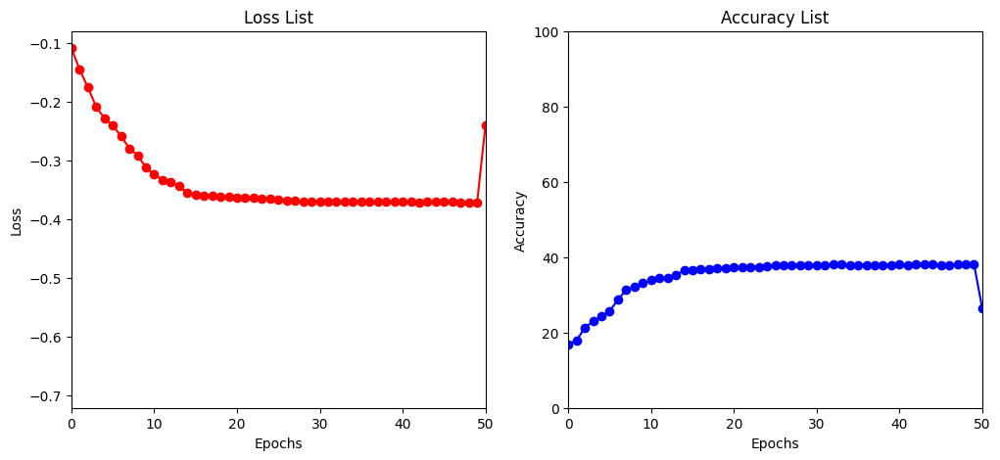

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.844214
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.837739

Test set: Average loss: -0.6579, Accuracy: 6645/10000 (66%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.840921
Train Epoch: 27 [25900/50000 (52%)]	Loss: 1.791850

Test set: Average loss: -0.6541, Accuracy: 6587/10000 (66%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.816836
Train Epoch: 28 [25900/50000 (52%)]	Loss: 1.784842

Test set: Average loss: -0.6618, Accuracy: 6692/10000 (67%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 1.798335
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.789791

Test set: Average loss: -0.6589, Accuracy: 6623/10000 (66%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 1.841781
Train Epoch: 30 [25900/50000 (52%)]	Loss: 1.814216

Test set: Average loss: -0.6608, Accuracy: 6663/10000 (67%)



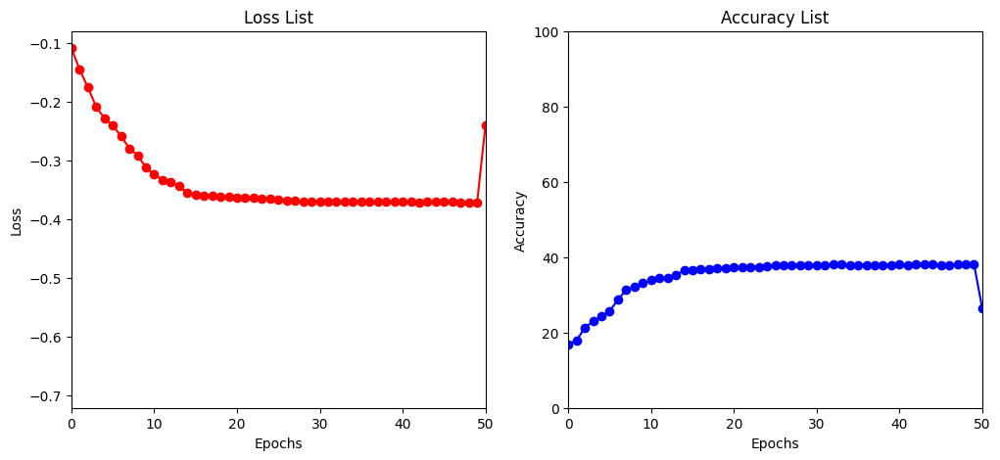

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.778192
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.772326

Test set: Average loss: -0.6633, Accuracy: 6697/10000 (67%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.823919
Train Epoch: 32 [25900/50000 (52%)]	Loss: 1.824860

Test set: Average loss: -0.6636, Accuracy: 6697/10000 (67%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.823893
Train Epoch: 33 [25900/50000 (52%)]	Loss: 1.787623

Test set: Average loss: -0.6640, Accuracy: 6716/10000 (67%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 1.811790
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.820376

Test set: Average loss: -0.6644, Accuracy: 6700/10000 (67%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 1.789494
Train Epoch: 35 [25900/50000 (52%)]	Loss: 1.804360

Test set: Average loss: -0.6643, Accuracy: 6714/10000 (67%)



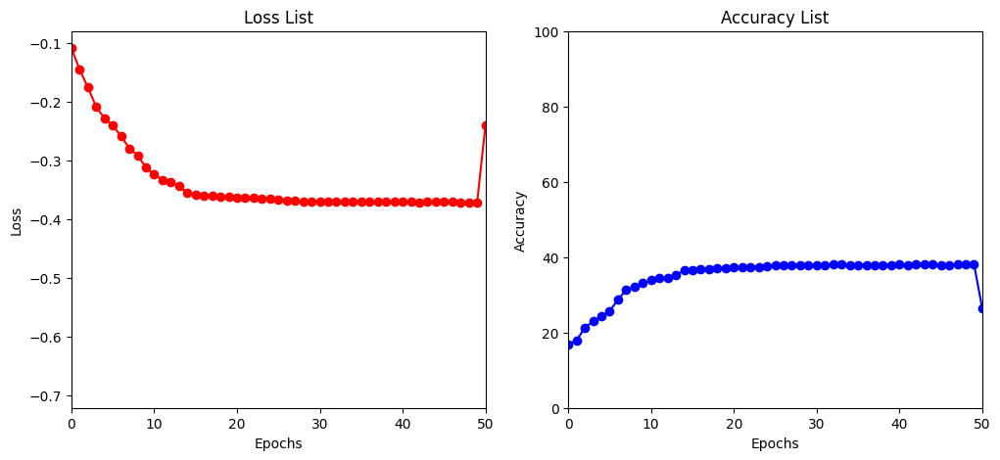

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.794120
Train Epoch: 36 [25900/50000 (52%)]	Loss: 1.822379

Test set: Average loss: -0.6638, Accuracy: 6700/10000 (67%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.821357
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.827952

Test set: Average loss: -0.6644, Accuracy: 6693/10000 (67%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.752233
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.778591

Test set: Average loss: -0.6641, Accuracy: 6711/10000 (67%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 1.803368
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.805566

Test set: Average loss: -0.6645, Accuracy: 6706/10000 (67%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 1.814973
Train Epoch: 40 [25900/50000 (52%)]	Loss: 1.798510

Test set: Average loss: -0.6645, Accuracy: 6706/10000 (67%)



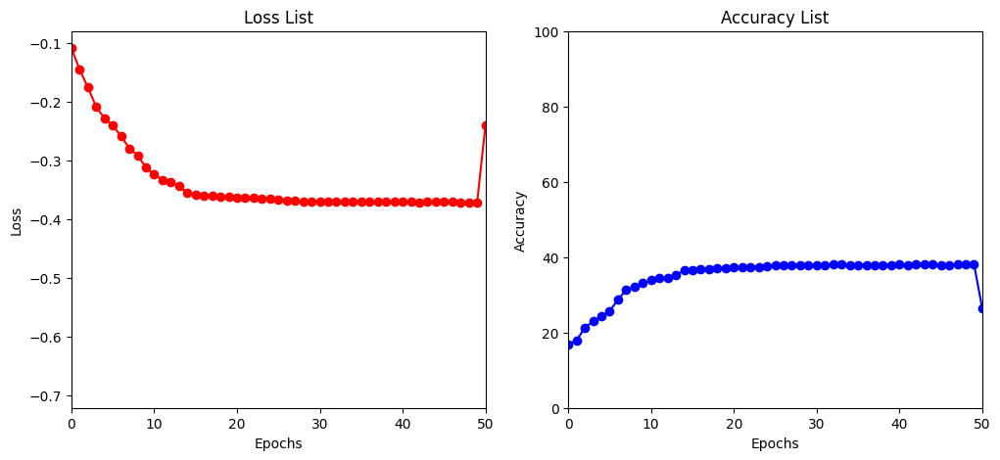

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.795537
Train Epoch: 41 [25900/50000 (52%)]	Loss: 1.803867

Test set: Average loss: -0.6651, Accuracy: 6714/10000 (67%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.812556
Train Epoch: 42 [25900/50000 (52%)]	Loss: 1.768823

Test set: Average loss: -0.6652, Accuracy: 6717/10000 (67%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.802575
Train Epoch: 43 [25900/50000 (52%)]	Loss: 1.797586

Test set: Average loss: -0.6655, Accuracy: 6729/10000 (67%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.766026
Train Epoch: 44 [25900/50000 (52%)]	Loss: 1.800861

Test set: Average loss: -0.6653, Accuracy: 6717/10000 (67%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.791814
Train Epoch: 45 [25900/50000 (52%)]	Loss: 1.795421

Test set: Average loss: -0.6660, Accuracy: 6733/10000 (67%)



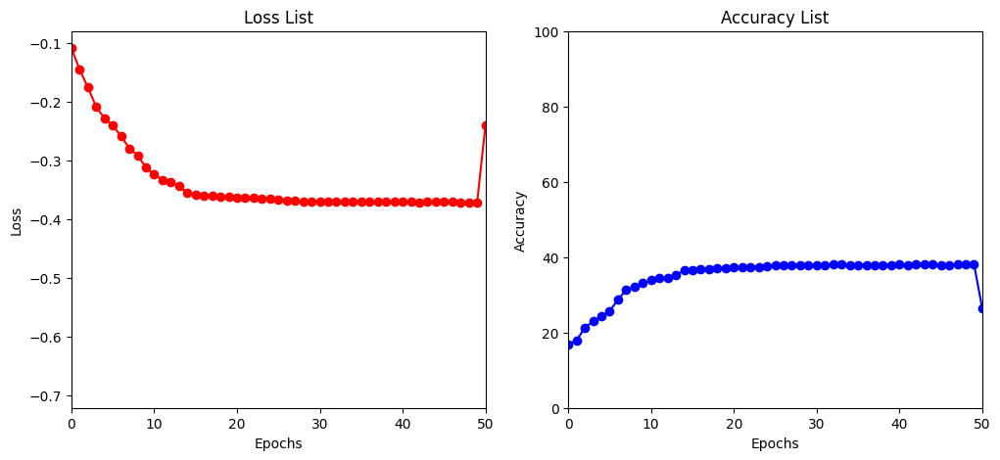

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.795288
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.780237

Test set: Average loss: -0.6662, Accuracy: 6743/10000 (67%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.786293
Train Epoch: 47 [25900/50000 (52%)]	Loss: 1.811672

Test set: Average loss: -0.6664, Accuracy: 6734/10000 (67%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.801286
Train Epoch: 48 [25900/50000 (52%)]	Loss: 1.779008

Test set: Average loss: -0.6663, Accuracy: 6731/10000 (67%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.793169
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.800837

Test set: Average loss: -0.6667, Accuracy: 6734/10000 (67%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 1.807450
Train Epoch: 50 [25900/50000 (52%)]	Loss: 1.824277

Test set: Average loss: -0.6662, Accuracy: 6732/10000 (67%)



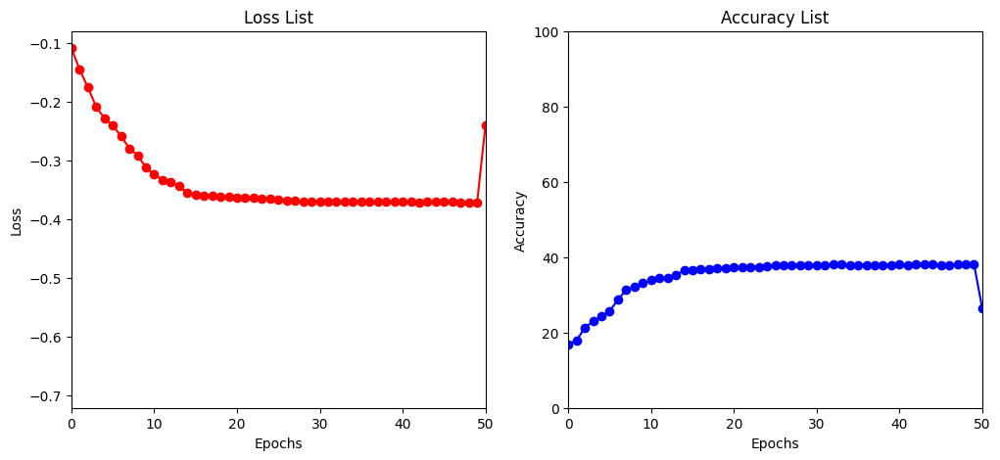

[I 2023-04-15 02:04:31,241] Trial 12 finished with value: -0.6661876121520997 and parameters: {'lr': 0.00021631746961122154, 'batch_size': 518, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.241951
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.221292
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.178842
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.214243
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.195182
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.179309
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.176411

Test set: Average loss: -0.3288, Accuracy: 3438/10000 (34%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.128216
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.155957
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.123545
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.073650
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.073458
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.071687
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.098484
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.053646

Test set: Average loss: -0.4075, Accuracy: 4124/10000 (41%)

Train Epoch:

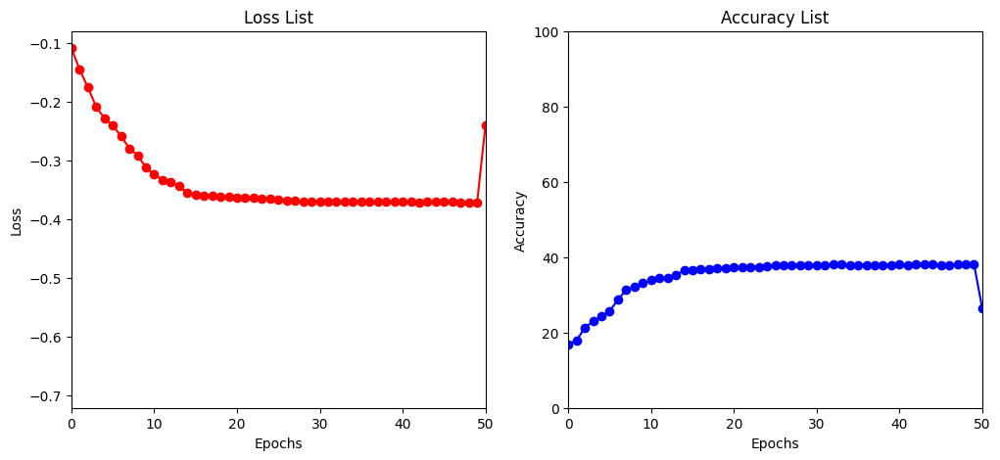

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.925075
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.015172
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.001828
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.926265
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.031475
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.021026
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.984692
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.903701

Test set: Average loss: -0.5207, Accuracy: 5260/10000 (53%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.024350
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.921460
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.971500
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.033082
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.932776
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.887563
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.997304
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.896327

Test set: Average loss: -0.5389, Accuracy: 5462/10000 (55%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.937454
Train Epoch: 8 [6400/50000 (13%)]	Loss: 1.9

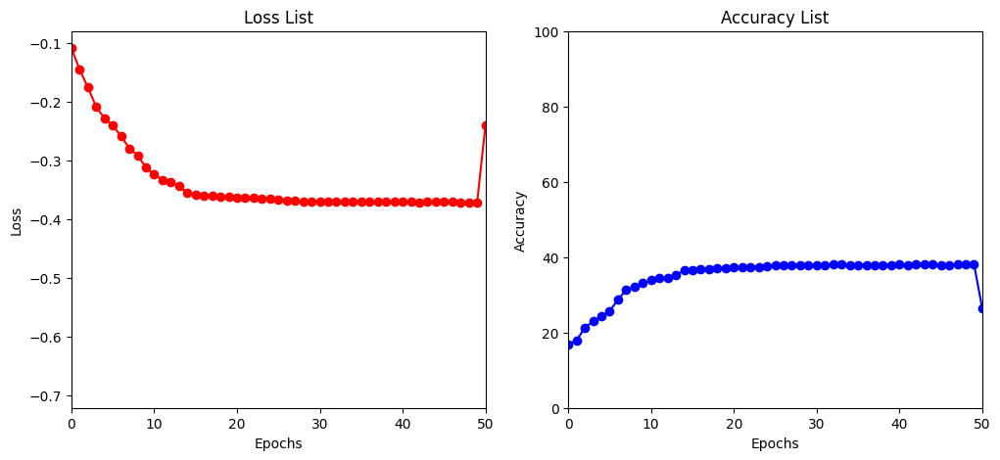

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.875615
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.955748
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.945592
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.903231
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.916696
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.871055
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.875194
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.813603

Test set: Average loss: -0.5909, Accuracy: 5968/10000 (60%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.823191
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.908264
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.968271
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.924329
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.948415
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.844910
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.892184
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.872571

Test set: Average loss: -0.5808, Accuracy: 5848/10000 (58%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.865252
Train Epoch: 13 [6400/5000

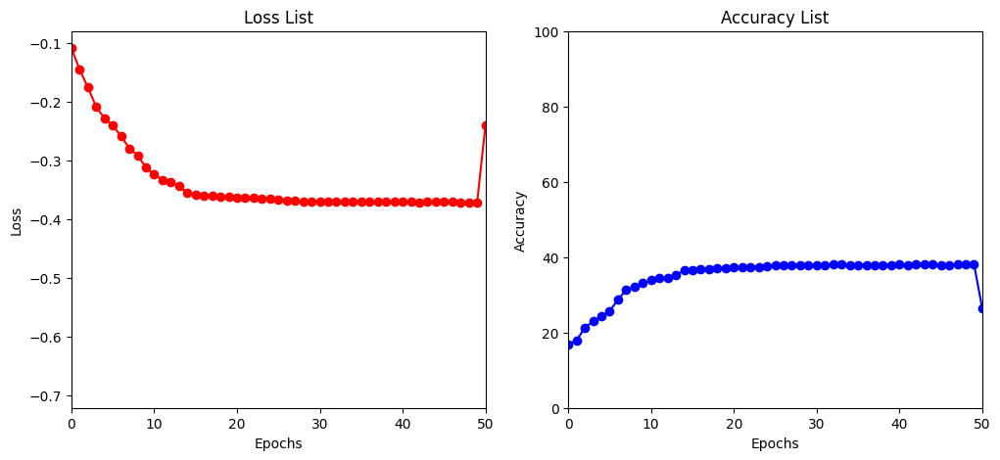

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.933490
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.862600
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.788833
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.840437
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.815714
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.826253
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.837629
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.866579

Test set: Average loss: -0.6525, Accuracy: 6576/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.825250
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.808870
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.865923
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.862346
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.784222
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.821582
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.852330
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.830422

Test set: Average loss: -0.6606, Accuracy: 6663/10000 (67%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.861398
Train Epoch: 18 [6400/5000

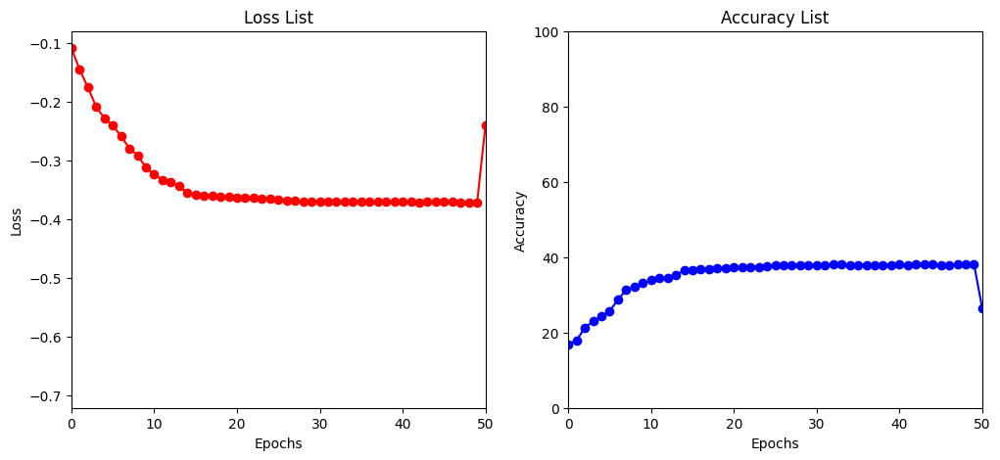

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.833727
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.741577
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.806760
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.855464
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.851228
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.823083
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.743083
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.798131

Test set: Average loss: -0.6679, Accuracy: 6728/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.822881
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.785233
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.800917
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.886299
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.780751
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.742375
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.834237
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.823844

Test set: Average loss: -0.6719, Accuracy: 6781/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.828919
Train Epoch: 23 [6400/5000

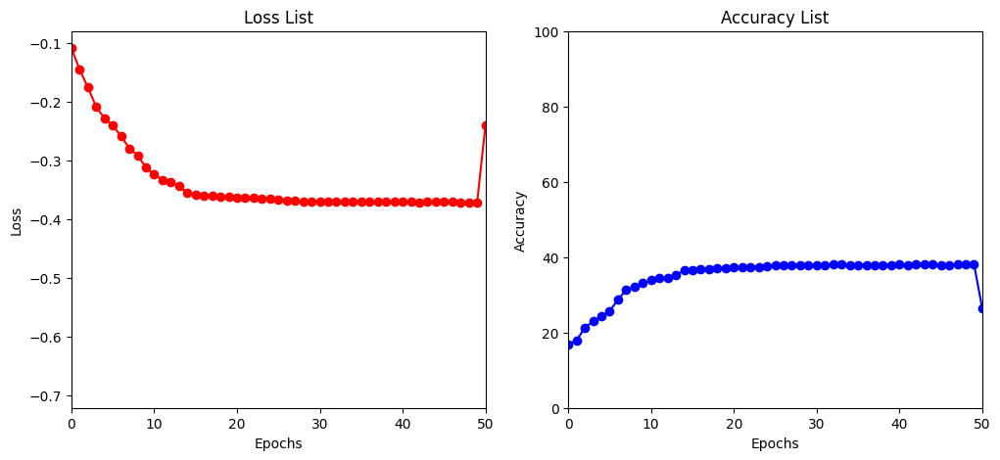

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.803451
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.771227
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.823113
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.841442
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.794267
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.835918
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.789465
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.824745

Test set: Average loss: -0.6770, Accuracy: 6844/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.885741
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.711958
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.792413
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.769794
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.815573
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.802785
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.790695
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.781813

Test set: Average loss: -0.6792, Accuracy: 6844/10000 (68%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.747311
Train Epoch: 28 [6400/5000

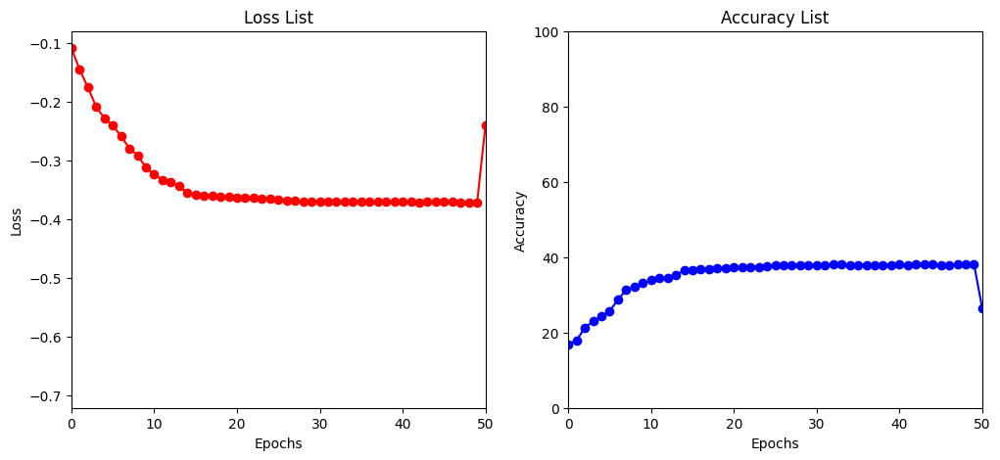

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.841022
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.811544
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.773169
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.738483
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.791303
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.825823
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.753578
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.818274

Test set: Average loss: -0.6835, Accuracy: 6896/10000 (69%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.760970
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.810635
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.755392
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.726017
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.749653
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.770781
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.826814
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.779900

Test set: Average loss: -0.6848, Accuracy: 6896/10000 (69%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.806982
Train Epoch: 33 [6400/5000

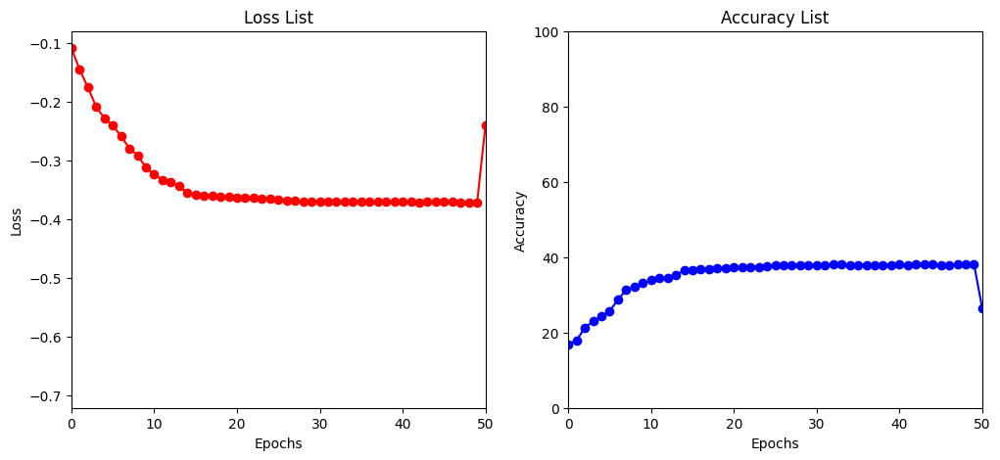

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.766037
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.801337
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.800687
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.776787
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.772354
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.810657
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.822819
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.852841

Test set: Average loss: -0.6865, Accuracy: 6927/10000 (69%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.804848
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.816040
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.781657
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.747866
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.858152
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.763889
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.744381
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.718513

Test set: Average loss: -0.6873, Accuracy: 6929/10000 (69%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.787639
Train Epoch: 38 [6400/5000

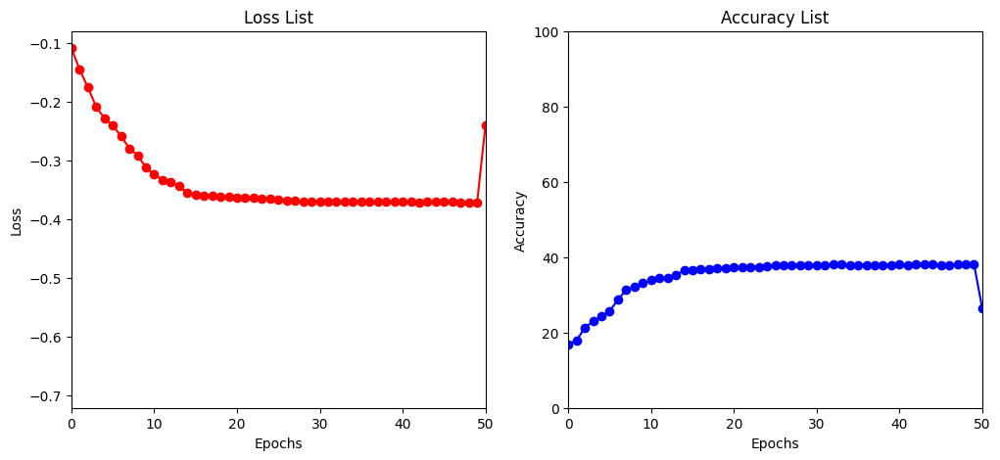

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.763437
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.791199
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.783756
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.746274
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.814214
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.814915
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.867661
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.788252

Test set: Average loss: -0.6884, Accuracy: 6959/10000 (70%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.803167
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.801935
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.762459
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.776299
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.745824
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.769015
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.756888
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.767950

Test set: Average loss: -0.6876, Accuracy: 6938/10000 (69%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.787044
Train Epoch: 43 [6400/5000

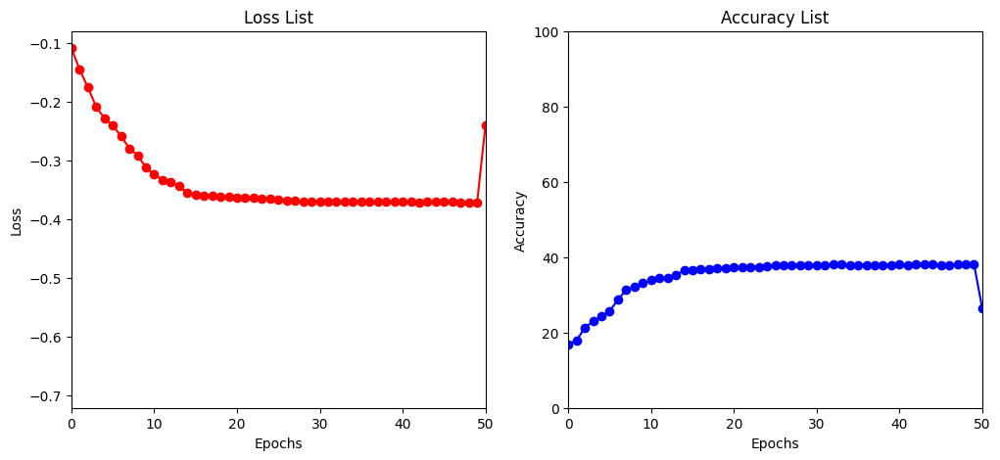

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.804120
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.813579
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.737551
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.728893
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.790616
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.799629
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.763413
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.760036

Test set: Average loss: -0.6891, Accuracy: 6949/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.713363
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.763801
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.831545
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.812489
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.765334
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.746221
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.735162
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.733980

Test set: Average loss: -0.6890, Accuracy: 6944/10000 (69%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.761786
Train Epoch: 48 [6400/5000

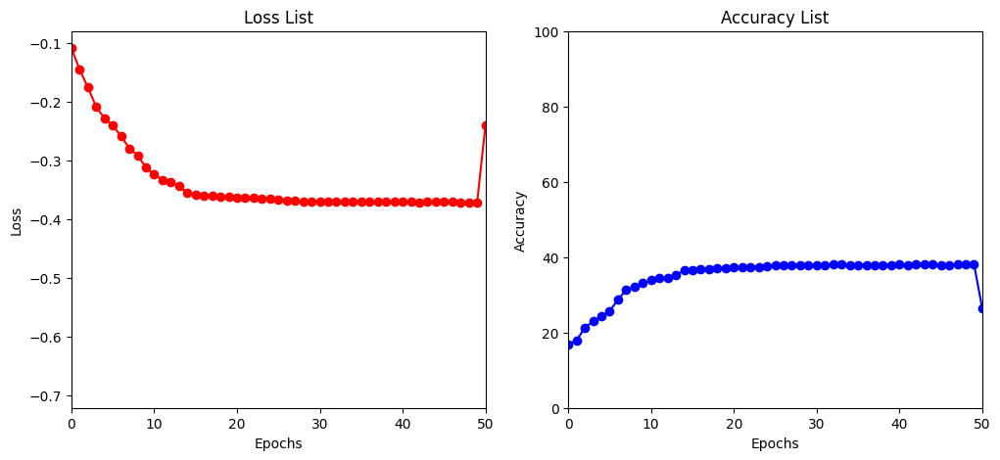

[I 2023-04-15 02:26:27,690] Trial 13 finished with value: -0.6900209075927735 and parameters: {'lr': 0.00018130561300070782, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.250647
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.228000
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.172183
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.215099
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.225064
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.191862
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.154627

Test set: Average loss: -0.2952, Accuracy: 3151/10000 (32%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.124071
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.167830
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.178153
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.105983
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.093114
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.082538
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.139229
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.035977

Test set: Average loss: -0.3803, Accuracy: 3857/10000 (39%)

Train Epoch:

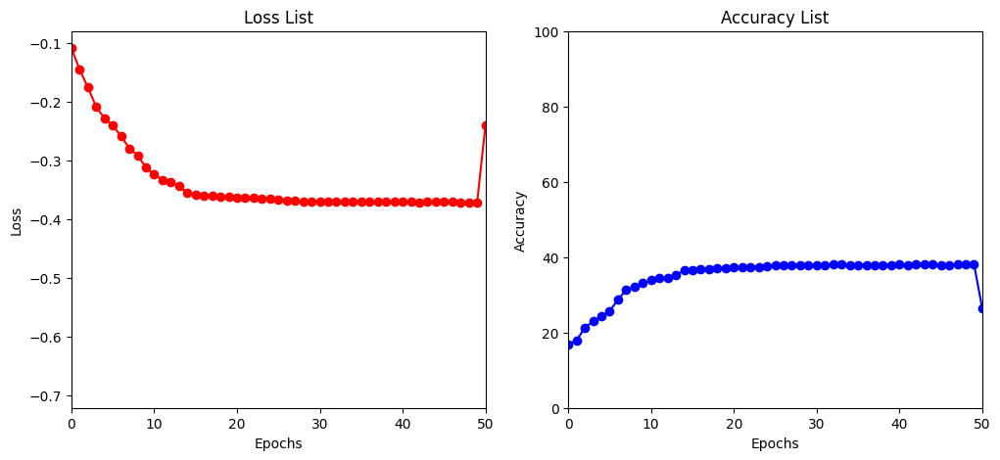

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.959591
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.015492
Train Epoch: 6 [12800/50000 (26%)]	Loss: 1.946990
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.943733
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.042165
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.977969
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.933851
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.915458

Test set: Average loss: -0.5363, Accuracy: 5430/10000 (54%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.025819
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.929840
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.876365
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.002050
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.907623
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.894992
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.983523
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.898617

Test set: Average loss: -0.5322, Accuracy: 5364/10000 (54%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.920502
Train Epoch: 8 [6400/50000 (13%)]	Loss: 1.9

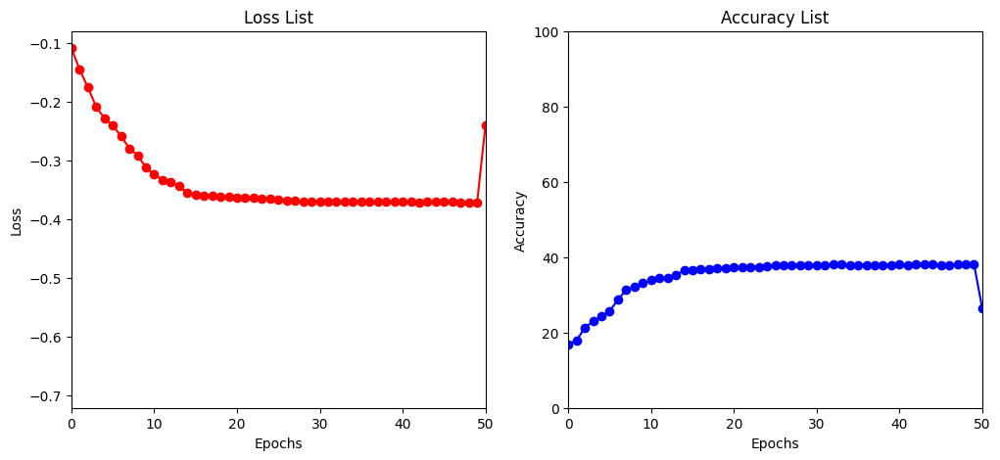

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.875782
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.962405
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.963040
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.911535
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.888784
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.860623
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.904664
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.880154

Test set: Average loss: -0.5820, Accuracy: 5866/10000 (59%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.892938
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.916897
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.965075
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.926062
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.954593
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.830826
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.858935
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.828588

Test set: Average loss: -0.5951, Accuracy: 6001/10000 (60%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.880176
Train Epoch: 13 [6400/5000

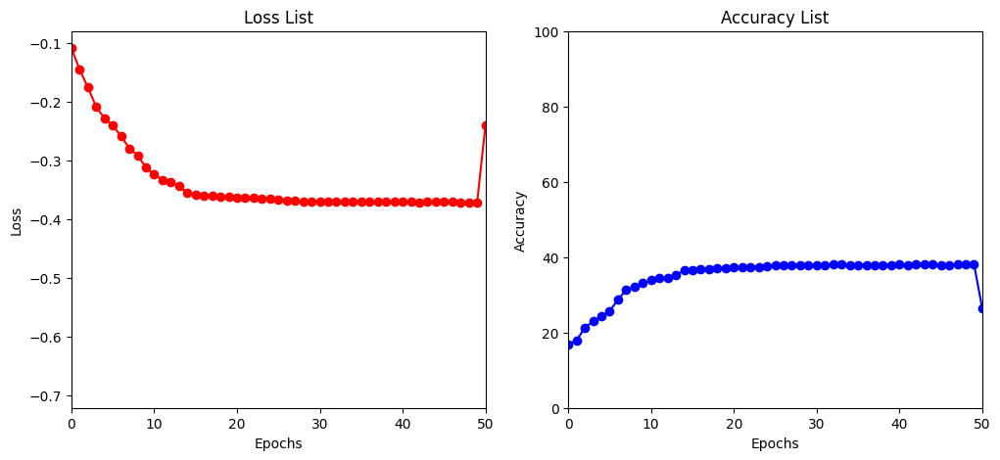

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.927119
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.823857
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.826286
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.823523
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.856244
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.831760
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.846806
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.847291

Test set: Average loss: -0.6481, Accuracy: 6528/10000 (65%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.818516
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.817717
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.922374
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.844784
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.764899
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.866486
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.862880
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.813799

Test set: Average loss: -0.6504, Accuracy: 6546/10000 (65%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.838682
Train Epoch: 18 [6400/5000

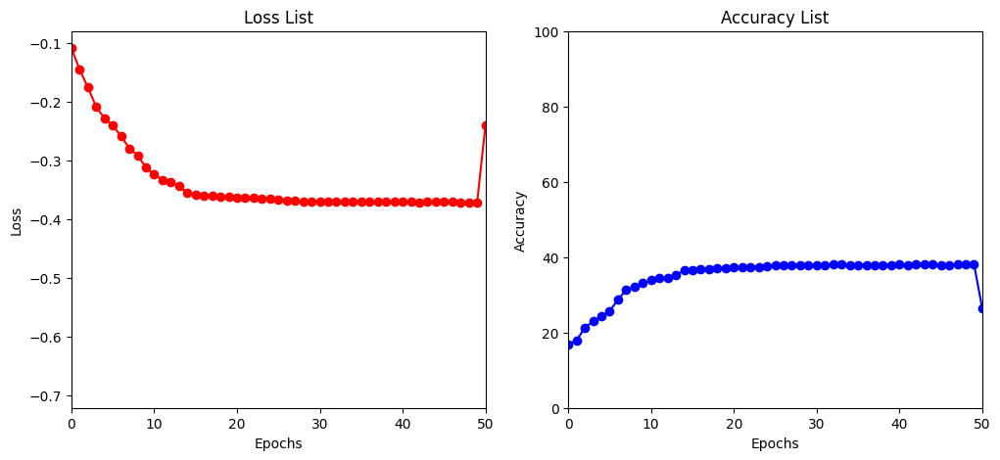

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.834092
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.752218
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.763147
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.844626
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.826637
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.811507
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.810065
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.806079

Test set: Average loss: -0.6633, Accuracy: 6691/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.807635
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.781381
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.785647
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.857107
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.773341
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.737432
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.836925
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.766652

Test set: Average loss: -0.6648, Accuracy: 6725/10000 (67%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.849304
Train Epoch: 23 [6400/5000

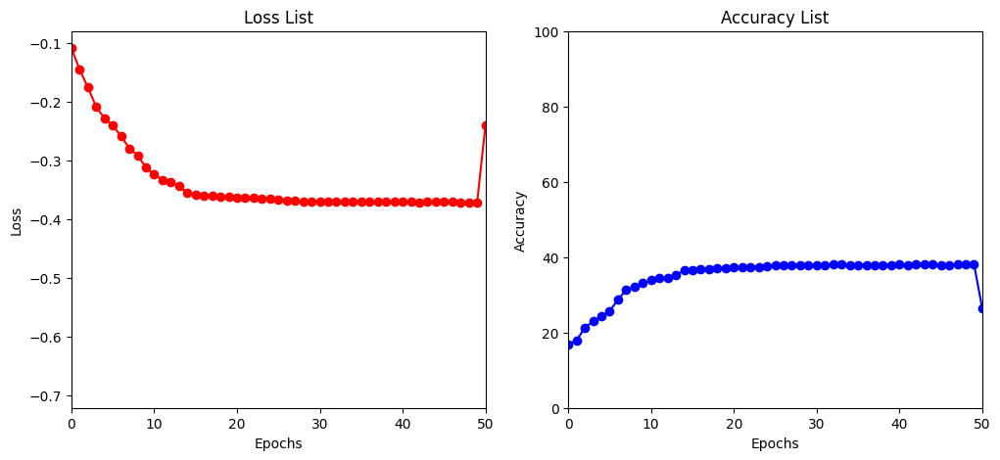

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.824835
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.811644
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.801015
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.825331
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.797909
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.835763
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.811647
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.824160

Test set: Average loss: -0.6705, Accuracy: 6760/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.844996
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.699993
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.808838
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.737264
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.814297
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.859954
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.789603
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.873439

Test set: Average loss: -0.6692, Accuracy: 6761/10000 (68%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.809773
Train Epoch: 28 [6400/5000

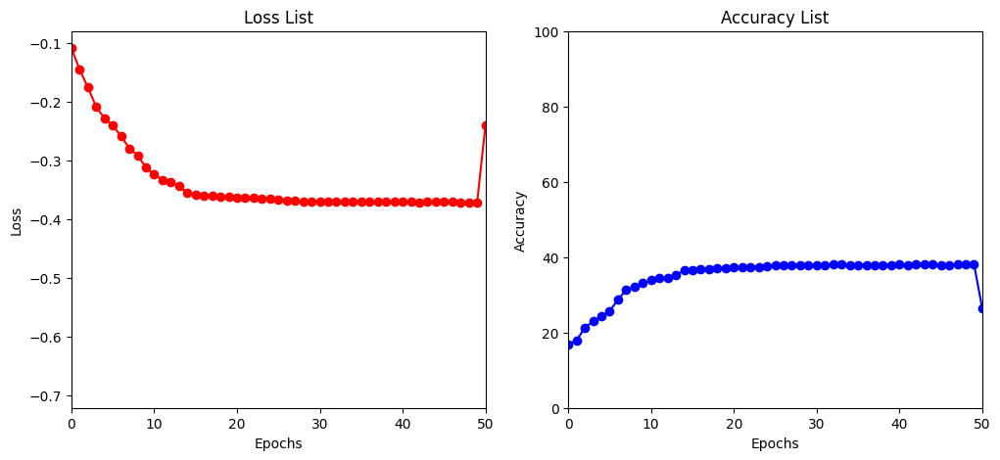

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.831523
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.760875
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.818612
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.773847
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.807462
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.855617
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.745634
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.847048

Test set: Average loss: -0.6748, Accuracy: 6787/10000 (68%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.813951
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.824058
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.773398
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.744904
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.816947
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.802010
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.806973
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.820511

Test set: Average loss: -0.6740, Accuracy: 6761/10000 (68%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.790213
Train Epoch: 33 [6400/5000

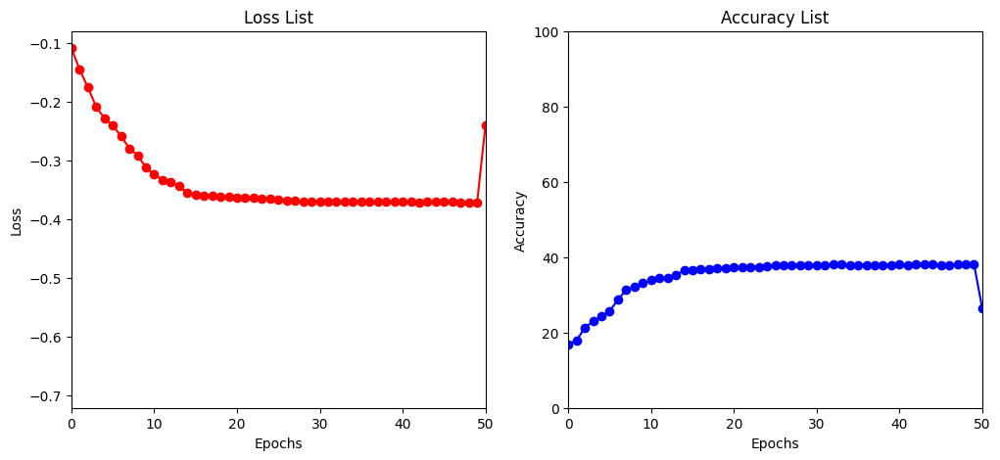

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.789828
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.768434
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.802853
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.775036
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.808158
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.791436
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.842583
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.876879

Test set: Average loss: -0.6771, Accuracy: 6803/10000 (68%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.801284
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.814806
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.750579
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.741329
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.832727
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.744738
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.745781
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.747816

Test set: Average loss: -0.6763, Accuracy: 6797/10000 (68%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.748119
Train Epoch: 38 [6400/5000

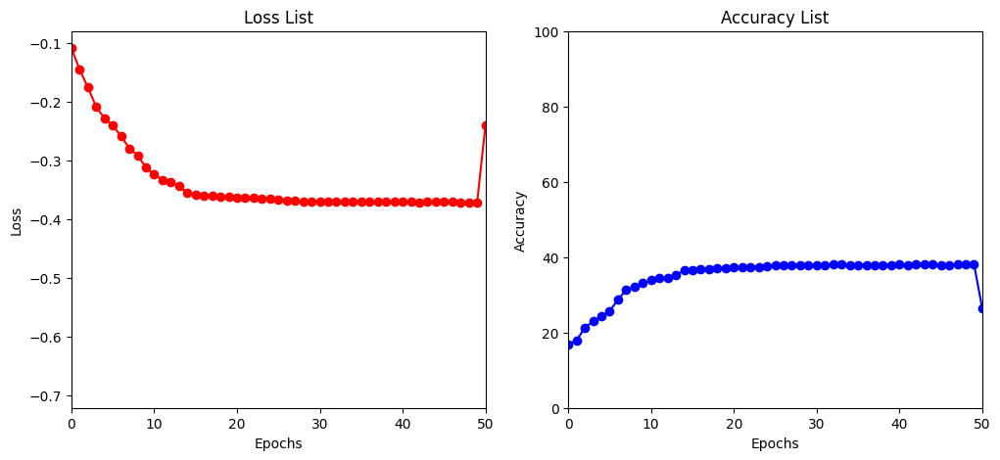

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.815202
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.821074
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.784046
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.802264
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.812145
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.832790
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.803446
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.793865

Test set: Average loss: -0.6782, Accuracy: 6825/10000 (68%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.799238
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.825680
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.777183
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.793908
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.800243
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.736574
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.785781
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.783074

Test set: Average loss: -0.6781, Accuracy: 6812/10000 (68%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.816778
Train Epoch: 43 [6400/5000

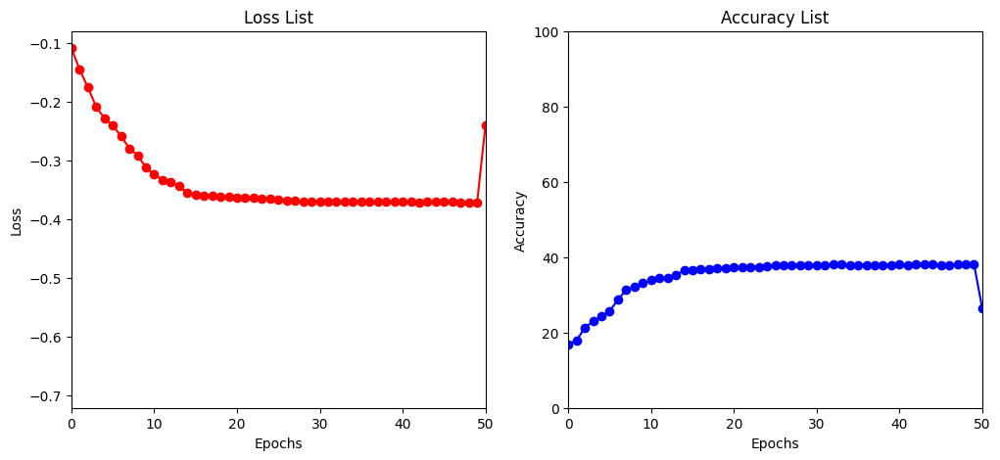

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.785685
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.826922
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.770315
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.803053
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.793406
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.844672
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.785889
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.753798

Test set: Average loss: -0.6790, Accuracy: 6839/10000 (68%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.704157
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.776321
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.773777
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.823929
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.766520
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.732688
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.735299
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.780600

Test set: Average loss: -0.6790, Accuracy: 6851/10000 (69%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.787329
Train Epoch: 48 [6400/5000

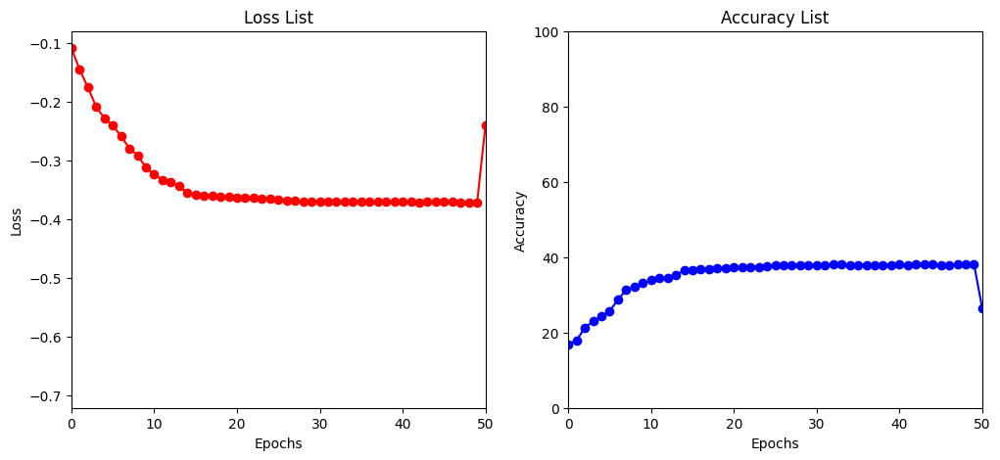

[I 2023-04-15 02:48:14,934] Trial 14 finished with value: -0.6799712741851807 and parameters: {'lr': 0.0001480177073971705, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302842
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.237845
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.261619
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.197542
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.254892
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.221864
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.209142
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.208833

Test set: Average loss: -0.2929, Accuracy: 2995/10000 (30%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.188471
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.176134
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.202142
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.167606
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.162754
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.097783
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.183060
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.088879

Test set: Average loss: -0.3644, Accuracy: 3713/10000 (37%)

Train Epoch:

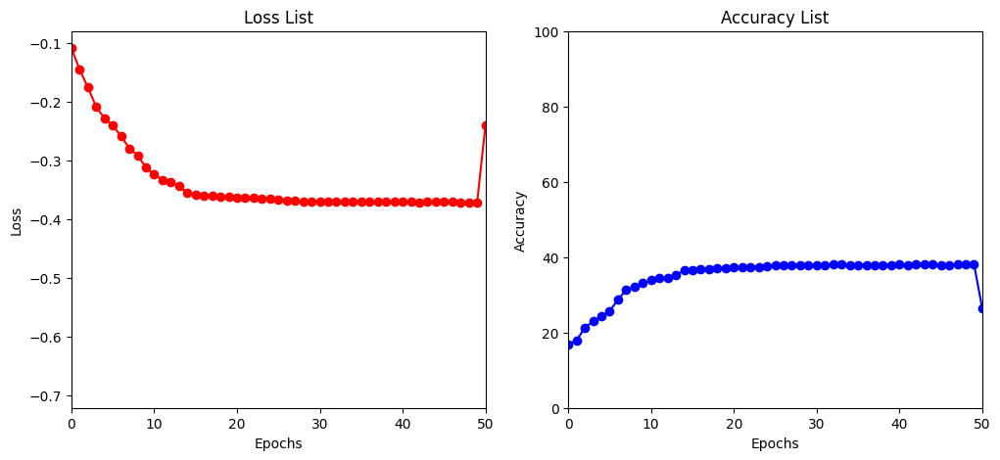

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.016969
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.061617
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.054039
Train Epoch: 6 [19200/50000 (38%)]	Loss: 2.029251
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.121053
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.084604
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.108742
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.998129

Test set: Average loss: -0.4112, Accuracy: 4157/10000 (42%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.067057
Train Epoch: 7 [6400/50000 (13%)]	Loss: 2.035474
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.081784
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.065680
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.065019
Train Epoch: 7 [32000/50000 (64%)]	Loss: 2.011174
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.105962
Train Epoch: 7 [44800/50000 (90%)]	Loss: 2.030488

Test set: Average loss: -0.4387, Accuracy: 4446/10000 (44%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.000545
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.1

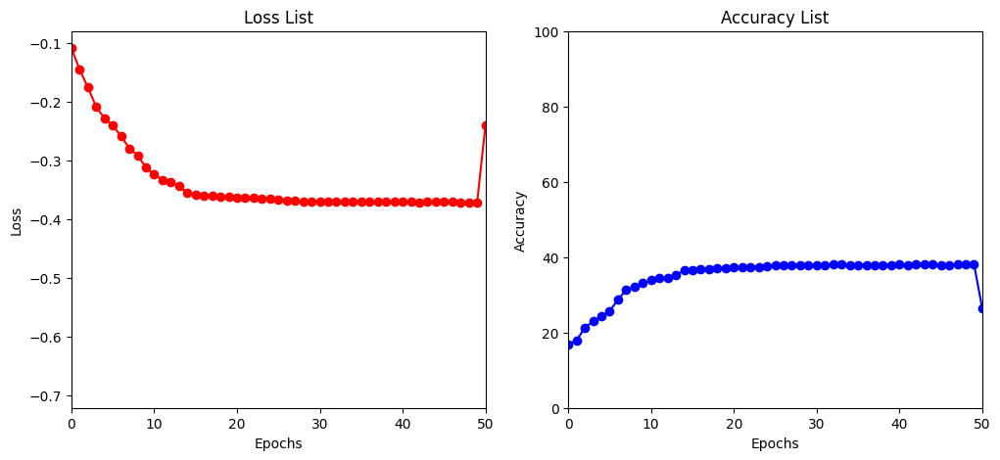

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.979152
Train Epoch: 11 [6400/50000 (13%)]	Loss: 2.086312
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.036843
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.991320
Train Epoch: 11 [25600/50000 (51%)]	Loss: 2.053485
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.981627
Train Epoch: 11 [38400/50000 (77%)]	Loss: 2.006474
Train Epoch: 11 [44800/50000 (90%)]	Loss: 2.043906

Test set: Average loss: -0.4703, Accuracy: 4744/10000 (47%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.980858
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.975073
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.019436
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.953189
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.071004
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.923618
Train Epoch: 12 [38400/50000 (77%)]	Loss: 2.005070
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.952358

Test set: Average loss: -0.4892, Accuracy: 4916/10000 (49%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.981412
Train Epoch: 13 [6400/5000

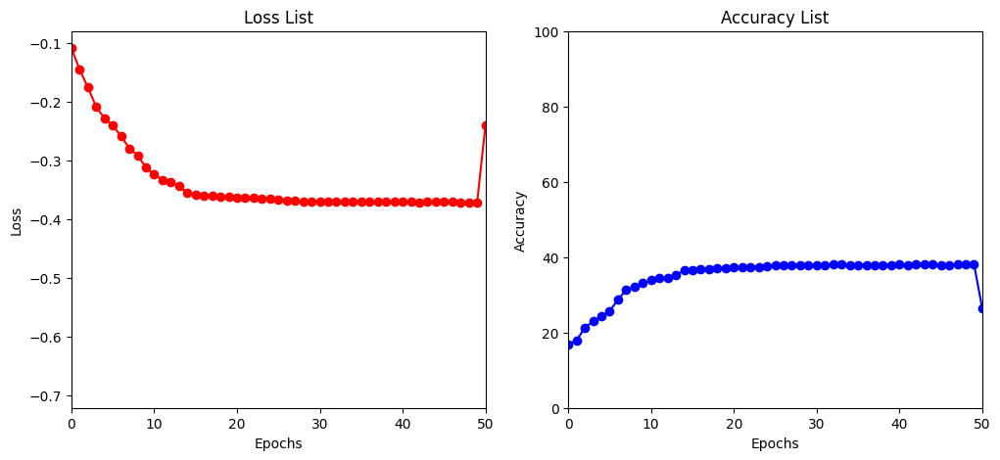

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.959000
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.992306
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.921117
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.905961
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.961178
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.954904
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.983294
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.933051

Test set: Average loss: -0.5309, Accuracy: 5357/10000 (54%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.896386
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.924646
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.978555
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.991675
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.850184
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.950924
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.933004
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.911063

Test set: Average loss: -0.5374, Accuracy: 5438/10000 (54%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.944732
Train Epoch: 18 [6400/5000

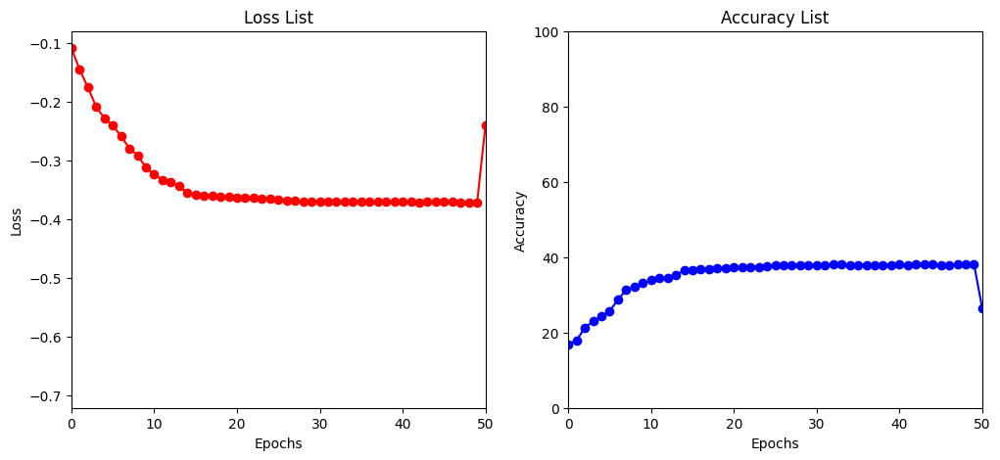

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.904650
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.893633
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.917496
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.930890
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.890006
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.928611
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.952739
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.942208

Test set: Average loss: -0.5504, Accuracy: 5554/10000 (56%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.948026
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.855160
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.875154
Train Epoch: 22 [19200/50000 (38%)]	Loss: 2.020536
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.900021
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.922211
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.902154
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.971709

Test set: Average loss: -0.5488, Accuracy: 5535/10000 (55%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.938782
Train Epoch: 23 [6400/5000

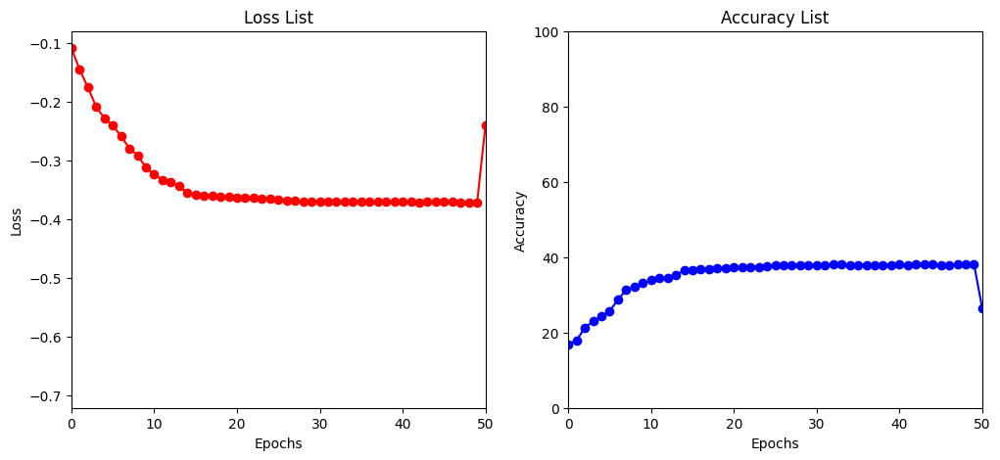

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.930737
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.965769
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.936911
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.925825
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.947558
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.949289
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.959800
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.969272

Test set: Average loss: -0.5569, Accuracy: 5631/10000 (56%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.964335
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.866801
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.974440
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.877711
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.960114
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.959896
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.940332
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.908098

Test set: Average loss: -0.5566, Accuracy: 5608/10000 (56%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.911610
Train Epoch: 28 [6400/5000

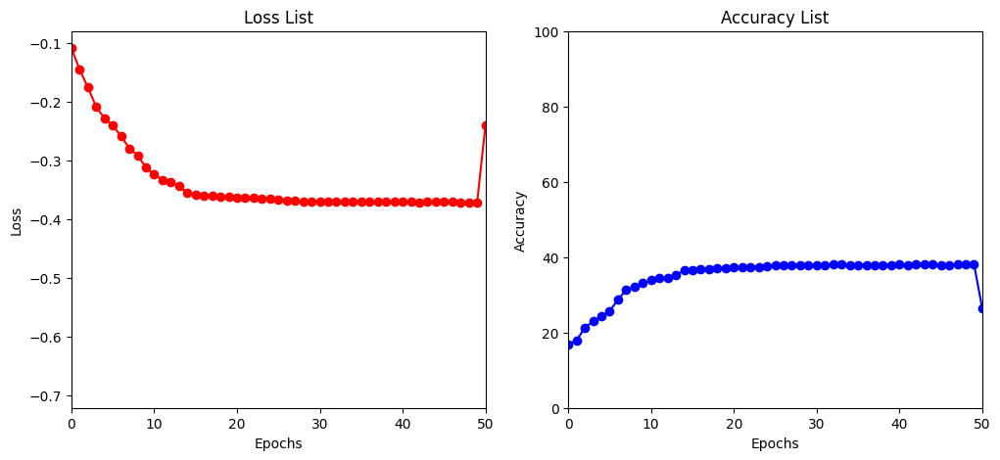

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.909583
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.873025
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.954892
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.992919
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.927540
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.977973
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.815809
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.930491

Test set: Average loss: -0.5670, Accuracy: 5708/10000 (57%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.913636
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.951671
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.839113
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.865990
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.870756
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.951561
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.967713
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.931539

Test set: Average loss: -0.5671, Accuracy: 5713/10000 (57%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.931577
Train Epoch: 33 [6400/5000

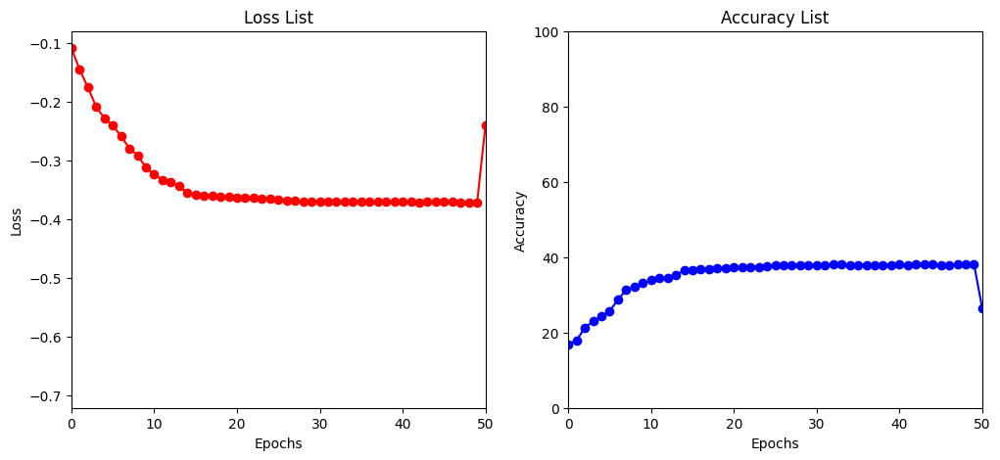

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.884427
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.963825
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.916380
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.820399
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.841843
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.909819
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.970821
Train Epoch: 36 [44800/50000 (90%)]	Loss: 2.010961

Test set: Average loss: -0.5678, Accuracy: 5715/10000 (57%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.927419
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.904423
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.859606
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.885629
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.915973
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.900673
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.901051
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.858661

Test set: Average loss: -0.5673, Accuracy: 5718/10000 (57%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.895247
Train Epoch: 38 [6400/5000

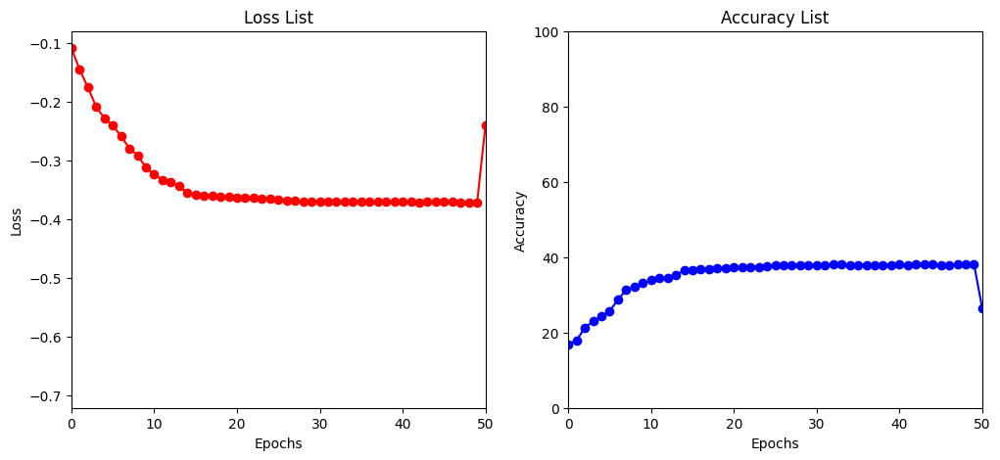

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.900818
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.948122
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.918850
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.842112
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.949581
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.946200
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.948783
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.958413

Test set: Average loss: -0.5687, Accuracy: 5735/10000 (57%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.890825
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.965523
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.897514
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.896431
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.876261
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.888376
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.820870
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.894340

Test set: Average loss: -0.5683, Accuracy: 5712/10000 (57%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.949778
Train Epoch: 43 [6400/5000

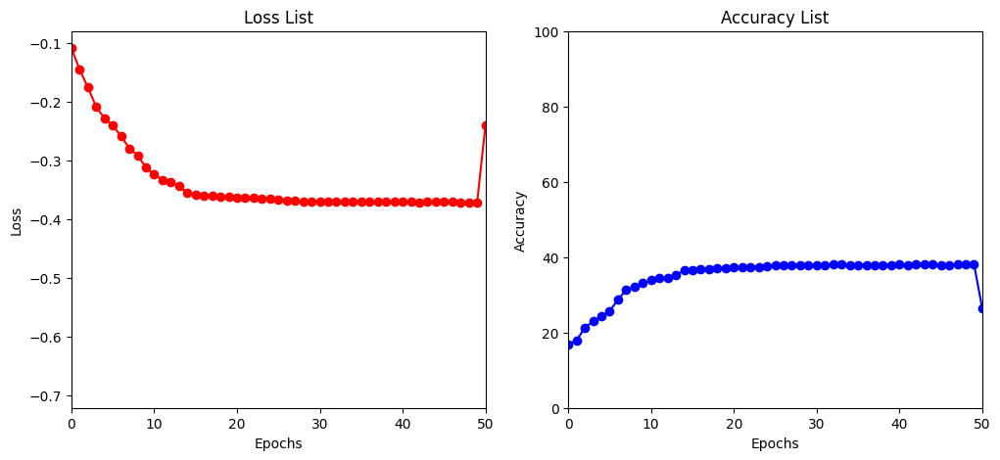

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.920669
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.974334
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.822562
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.937201
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.924448
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.898687
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.928083
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.883034

Test set: Average loss: -0.5691, Accuracy: 5729/10000 (57%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.806269
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.936347
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.845296
Train Epoch: 47 [19200/50000 (38%)]	Loss: 2.004143
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.844027
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.896127
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.844328
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.897112

Test set: Average loss: -0.5692, Accuracy: 5738/10000 (57%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.934312
Train Epoch: 48 [6400/5000

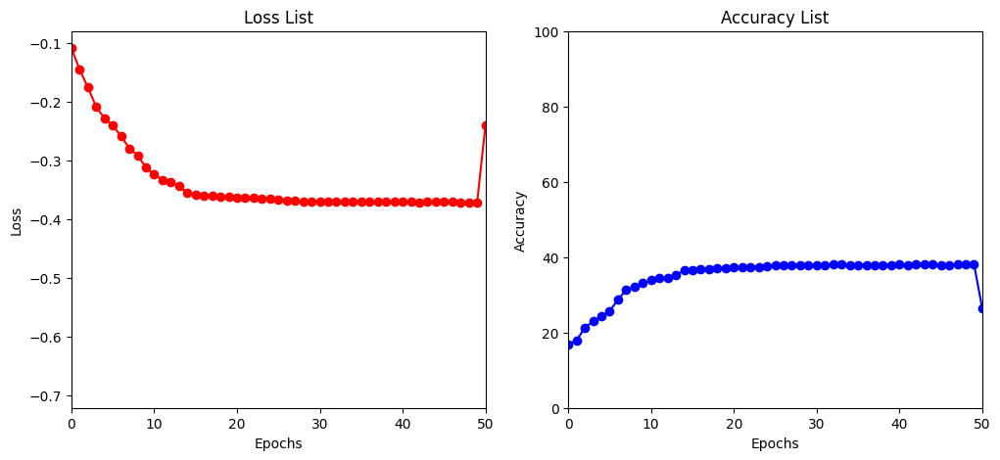

[I 2023-04-15 03:10:15,774] Trial 15 finished with value: -0.5691165634155273 and parameters: {'lr': 0.0004996510484372216, 'batch_size': 128, 'gamma': 0.08, 'droprate': 0.5}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.241170
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.221138
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.172931
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.216324
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.197716
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.187633
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.170608

Test set: Average loss: -0.3195, Accuracy: 3369/10000 (34%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.108374
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.170751
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.160341
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.063311
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.101255
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.051111
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.083034
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.058463

Test set: Average loss: -0.4193, Accuracy: 4283/10000 (43%)

Train Epoch:

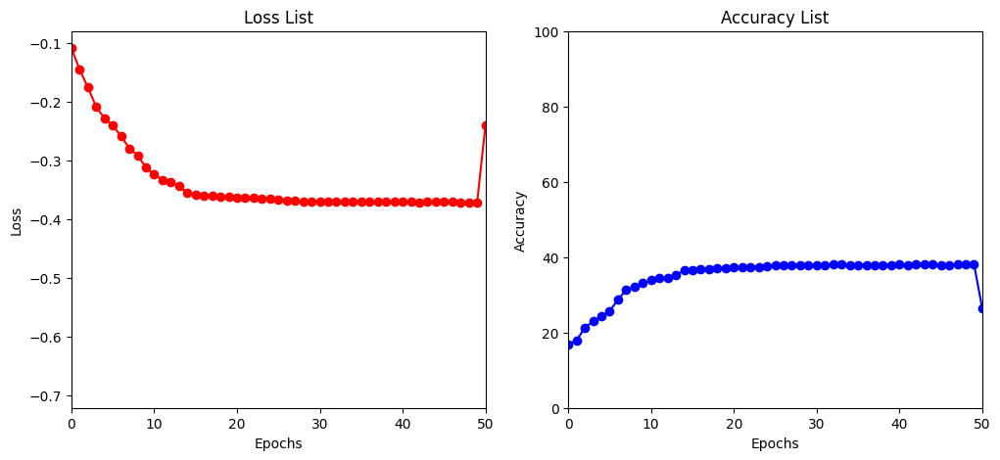

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.890761
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.005576
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.005126
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.906564
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.003456
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.989638
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.968327
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.917263

Test set: Average loss: -0.5353, Accuracy: 5400/10000 (54%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.000383
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.904571
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.912709
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.038603
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.892794
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.908002
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.946761
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.951844

Test set: Average loss: -0.5407, Accuracy: 5452/10000 (55%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.927514
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.0

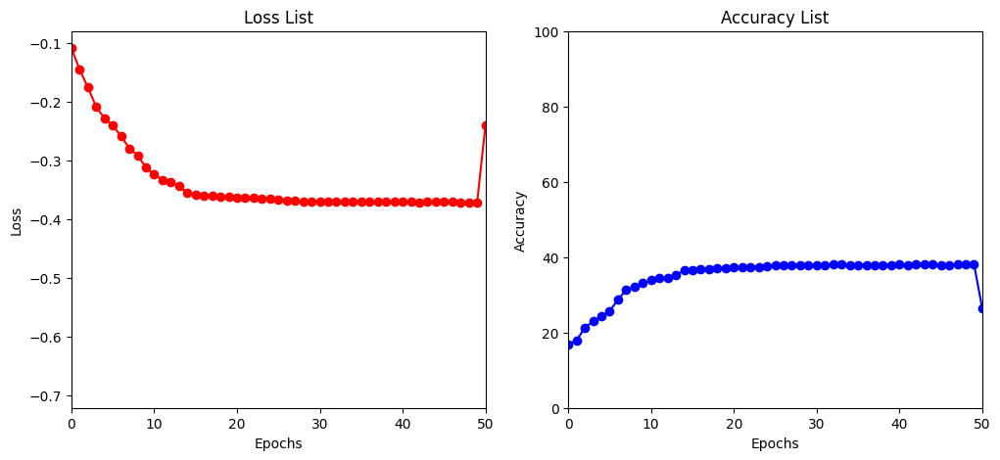

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.849674
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.969377
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.897538
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.895472
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.901716
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.904235
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.896457
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.870209

Test set: Average loss: -0.5928, Accuracy: 5979/10000 (60%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.814130
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.902140
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.948455
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.904347
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.954396
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.850116
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.860898
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.854159

Test set: Average loss: -0.5863, Accuracy: 5913/10000 (59%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.826364
Train Epoch: 13 [6400/5000

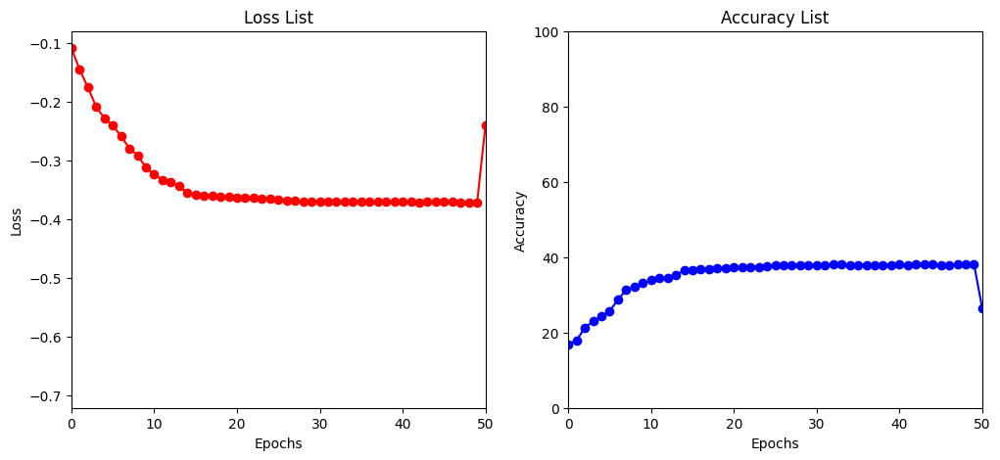

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.916674
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.830070
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.809444
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.797164
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.823800
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.832218
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.851794
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.811193

Test set: Average loss: -0.6575, Accuracy: 6619/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.845510
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.792341
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.844032
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.816977
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.822293
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.832473
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.872301
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.824219

Test set: Average loss: -0.6606, Accuracy: 6633/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.834736
Train Epoch: 18 [6400/5000

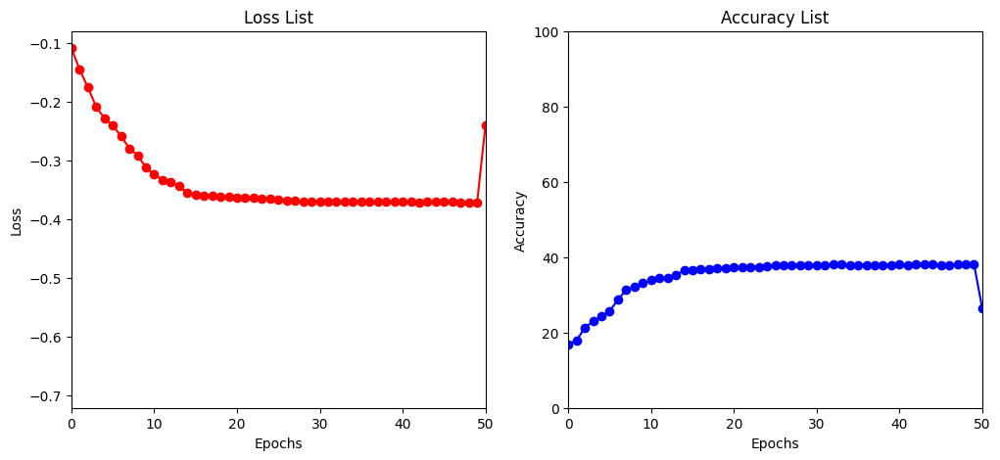

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.782753
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.739626
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.755255
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.800845
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.825397
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.808375
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.784757
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.807416

Test set: Average loss: -0.6699, Accuracy: 6732/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.831287
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.818392
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.794919
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.844625
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.800694
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.768056
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.823913
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.815241

Test set: Average loss: -0.6726, Accuracy: 6791/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.839612
Train Epoch: 23 [6400/5000

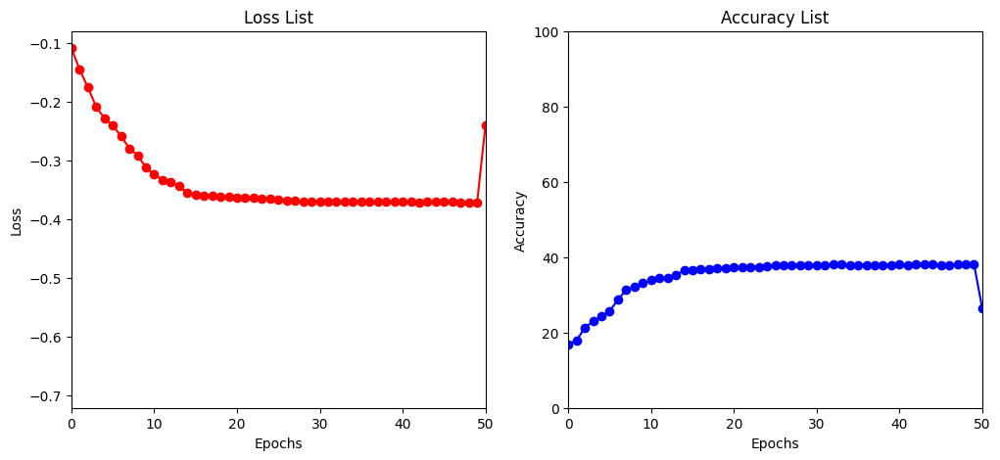

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.809997
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.809706
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.783086
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.834630
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.762006
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.803145
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.783264
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.780338

Test set: Average loss: -0.6787, Accuracy: 6833/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.879180
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.741027
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.760689
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.733258
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.839541
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.817088
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.796738
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.839082

Test set: Average loss: -0.6805, Accuracy: 6867/10000 (69%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.755235
Train Epoch: 28 [6400/5000

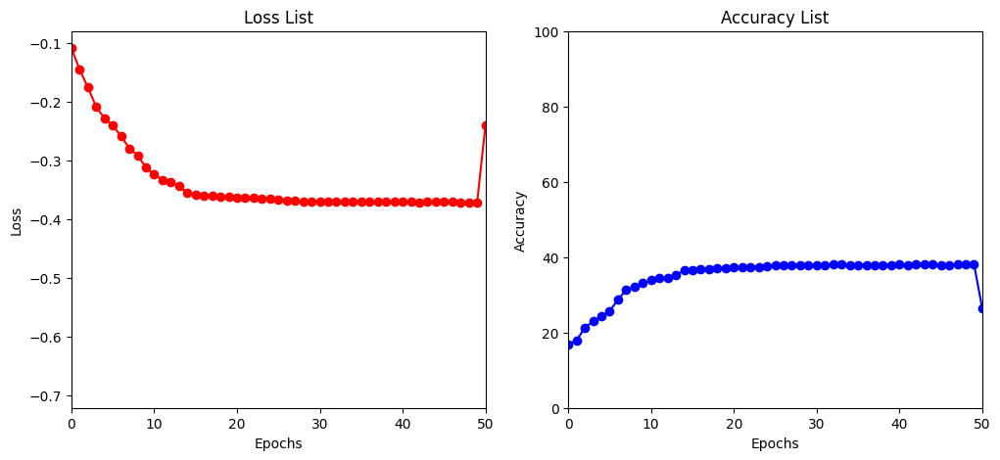

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.849478
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.761572
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.764800
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.763798
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.830338
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.815826
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.750383
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.862389

Test set: Average loss: -0.6864, Accuracy: 6900/10000 (69%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.775885
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.842600
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.730210
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.721133
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.780164
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.764107
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.829674
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.756258

Test set: Average loss: -0.6871, Accuracy: 6917/10000 (69%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.763504
Train Epoch: 33 [6400/5000

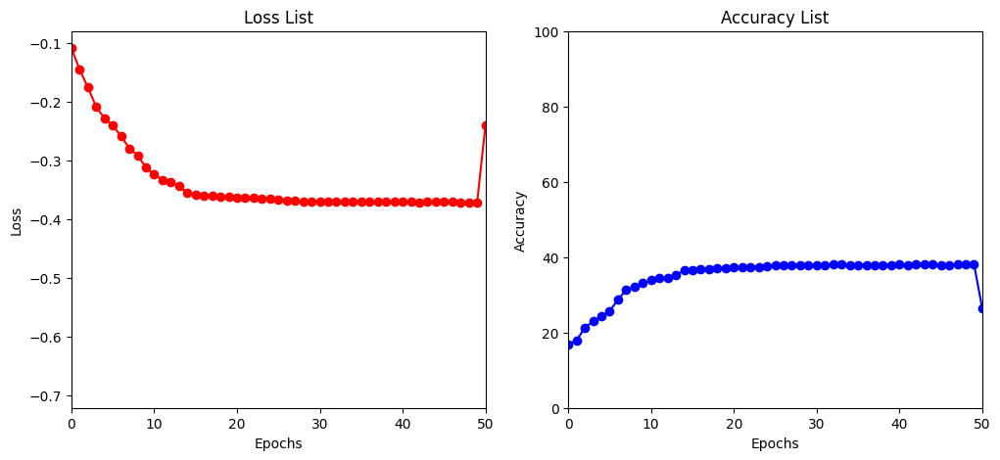

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.773720
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.785248
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.814523
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.748590
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.746688
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.791417
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.819151
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.848004

Test set: Average loss: -0.6891, Accuracy: 6944/10000 (69%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.766625
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.771882
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.767247
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.755000
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.837598
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.783329
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.760447
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.733989

Test set: Average loss: -0.6883, Accuracy: 6946/10000 (69%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.749673
Train Epoch: 38 [6400/5000

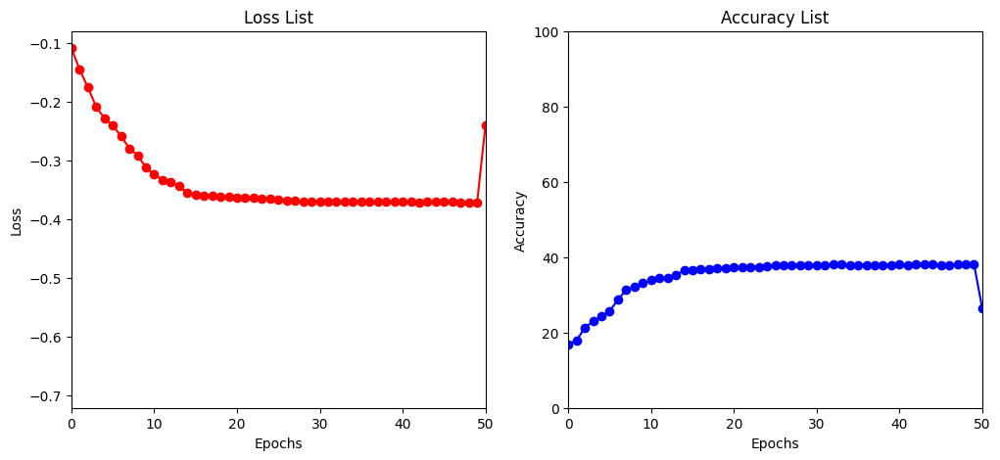

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.817166
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.792443
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.772039
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.718298
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.791498
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.811071
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.796185
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.777508

Test set: Average loss: -0.6899, Accuracy: 6944/10000 (69%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.827973
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.775053
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.738687
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.765683
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.750947
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.762059
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.796699
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.756762

Test set: Average loss: -0.6890, Accuracy: 6927/10000 (69%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.797558
Train Epoch: 43 [6400/5000

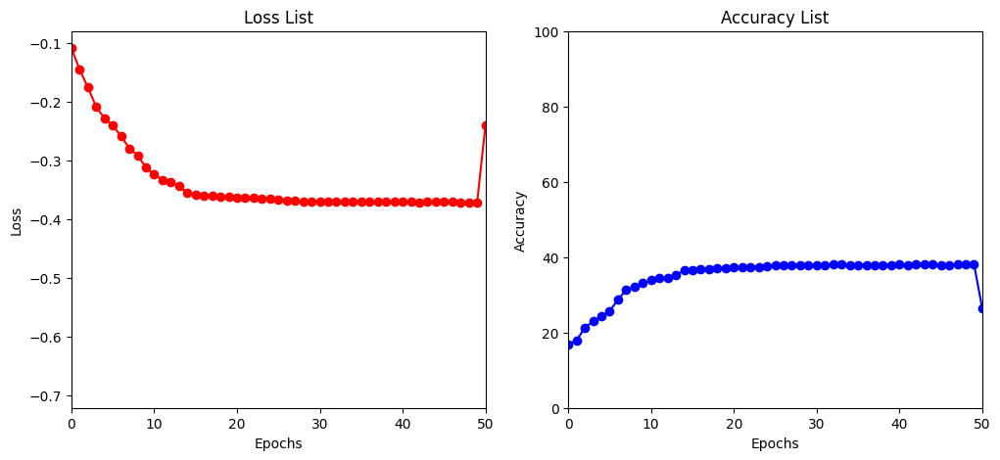

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.780042
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.799802
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.735995
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.771006
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.773710
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.795449
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.765374
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.744418

Test set: Average loss: -0.6899, Accuracy: 6934/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.712637
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.774849
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.771285
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.819950
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.741527
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.734301
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.753386
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.756911

Test set: Average loss: -0.6898, Accuracy: 6941/10000 (69%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.792417
Train Epoch: 48 [6400/5000

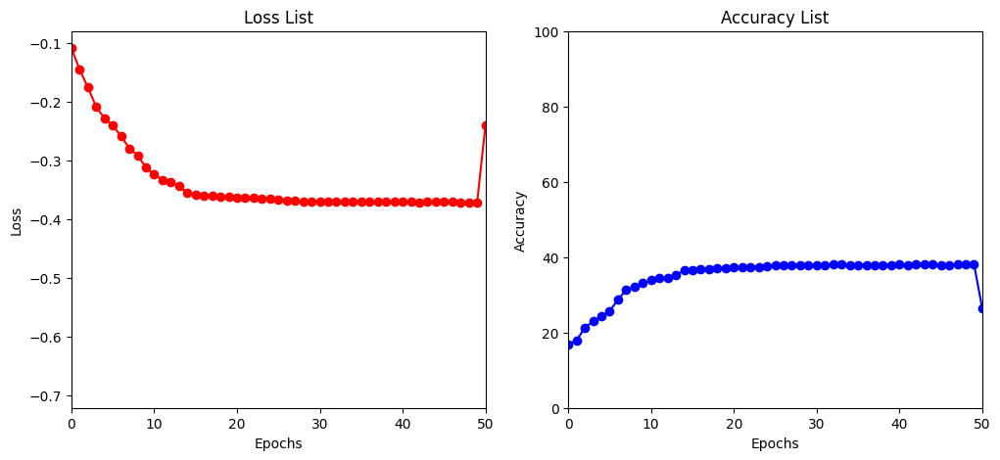

[I 2023-04-15 03:32:12,098] Trial 16 finished with value: -0.6906452760696411 and parameters: {'lr': 0.00018496877962198842, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.229738
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.245910
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.188615
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.185750
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.182067
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.192004
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.210976

Test set: Average loss: -0.3096, Accuracy: 3193/10000 (32%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.178824
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.202830
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.166137
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.094479
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.111204
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.019406
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.128944
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.062656

Test set: Average loss: -0.3896, Accuracy: 3937/10000 (39%)

Train Epoch:

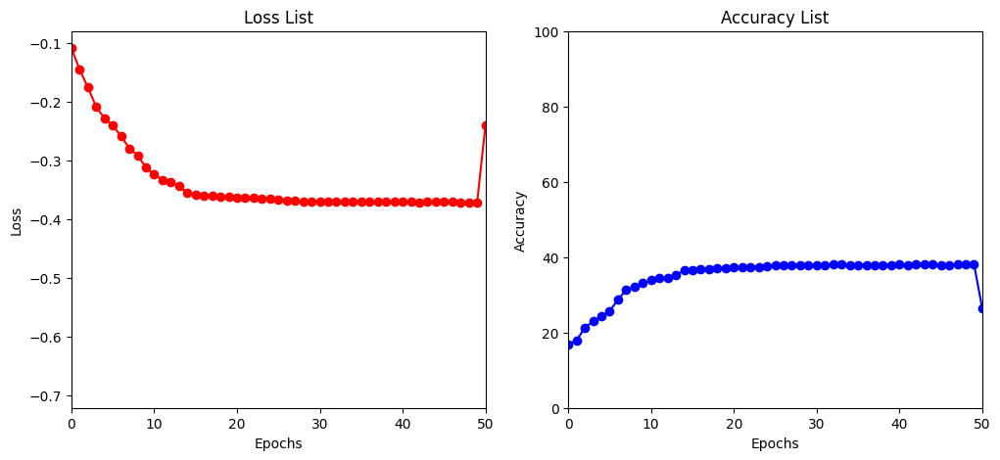

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.936135
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.010963
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.021272
Train Epoch: 6 [19200/50000 (38%)]	Loss: 2.028638
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.033956
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.984854
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.039647
Train Epoch: 6 [44800/50000 (90%)]	Loss: 2.030753

Test set: Average loss: -0.4796, Accuracy: 4842/10000 (48%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.059559
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.979207
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.044213
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.077521
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.982547
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.903987
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.979730
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.942866

Test set: Average loss: -0.4905, Accuracy: 4938/10000 (49%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.965102
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.0

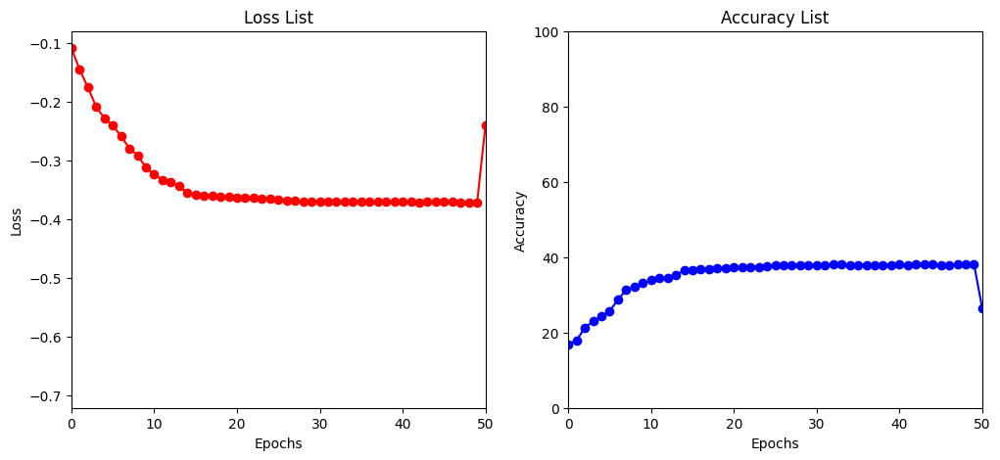

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.995151
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.970856
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.937966
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.920327
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.976046
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.883082
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.919472
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.956995

Test set: Average loss: -0.5437, Accuracy: 5477/10000 (55%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.896665
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.946156
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.963563
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.978637
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.038239
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.854871
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.876536
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.935765

Test set: Average loss: -0.5484, Accuracy: 5525/10000 (55%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.872915
Train Epoch: 13 [6400/5000

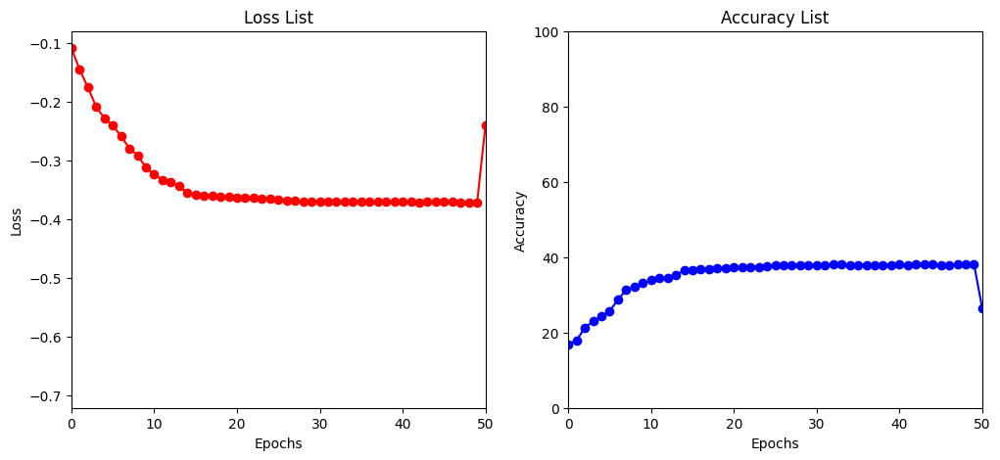

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.967698
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.833850
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.829443
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.798864
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.895191
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.846850
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.840857
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.861403

Test set: Average loss: -0.6307, Accuracy: 6342/10000 (63%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.813717
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.822826
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.893353
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.909111
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.810123
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.840947
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.823120
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.776869

Test set: Average loss: -0.6295, Accuracy: 6338/10000 (63%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.867159
Train Epoch: 18 [6400/5000

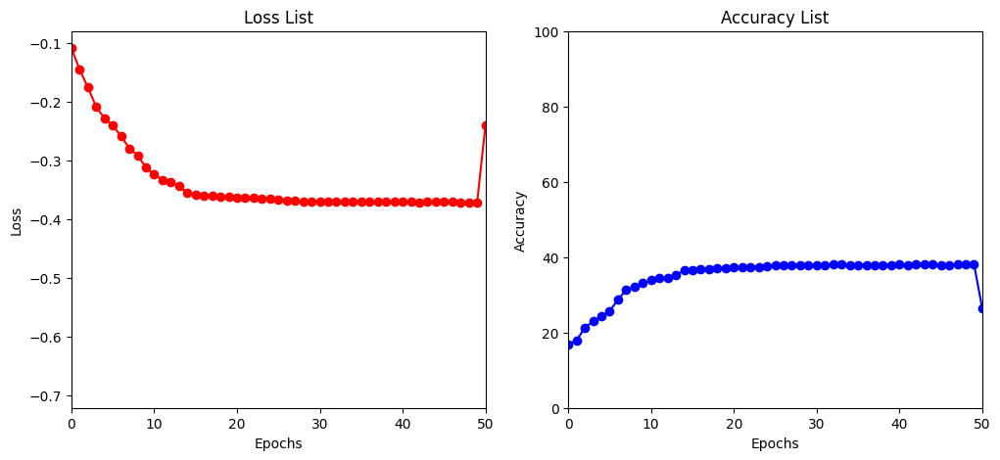

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.773430
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.813489
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.808234
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.834443
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.847312
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.801492
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.782469
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.871356

Test set: Average loss: -0.6480, Accuracy: 6526/10000 (65%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.832803
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.800181
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.794945
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.879867
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.817143
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.788015
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.810664
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.844203

Test set: Average loss: -0.6497, Accuracy: 6545/10000 (65%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.813763
Train Epoch: 23 [6400/5000

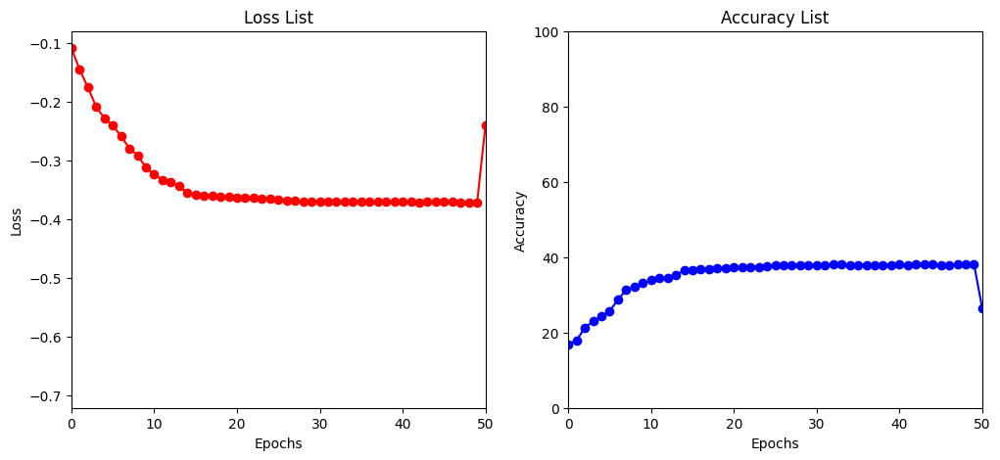

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.787131
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.861234
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.876671
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.871847
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.792926
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.838050
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.841158
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.811720

Test set: Average loss: -0.6601, Accuracy: 6655/10000 (67%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.867699
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.761282
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.844961
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.797643
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.816722
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.814201
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.776752
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.822062

Test set: Average loss: -0.6657, Accuracy: 6719/10000 (67%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.765526
Train Epoch: 28 [6400/5000

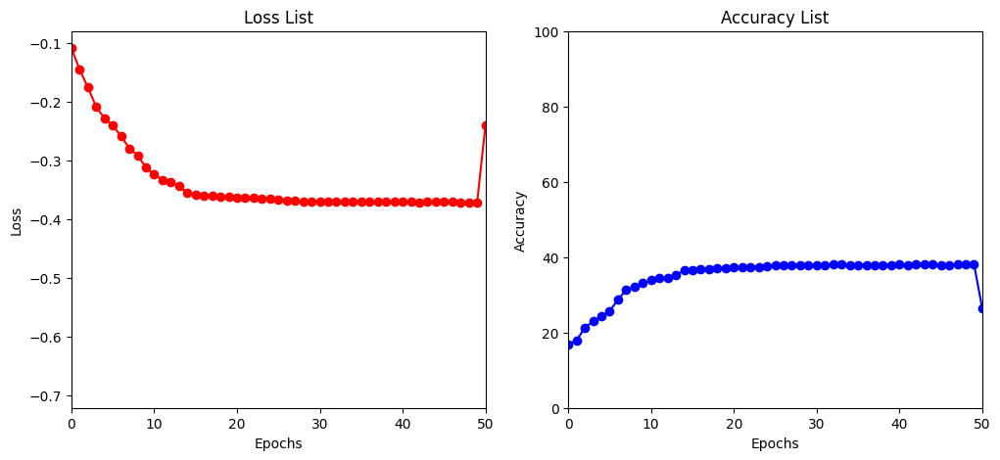

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.840102
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.820915
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.829685
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.805030
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.847615
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.837401
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.731113
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.896990

Test set: Average loss: -0.6741, Accuracy: 6795/10000 (68%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.800860
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.819480
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.738058
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.788175
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.767004
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.780742
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.838261
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.798382

Test set: Average loss: -0.6752, Accuracy: 6806/10000 (68%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.826150
Train Epoch: 33 [6400/5000

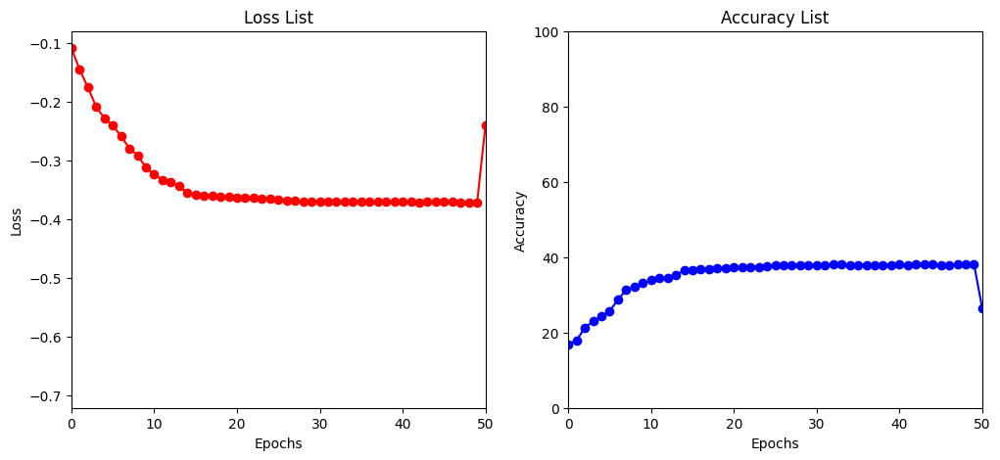

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.783471
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.786015
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.801904
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.821281
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.806232
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.768795
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.875897
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.867317

Test set: Average loss: -0.6775, Accuracy: 6814/10000 (68%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.824583
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.768582
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.722208
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.737564
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.844763
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.816596
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.766258
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.776290

Test set: Average loss: -0.6787, Accuracy: 6832/10000 (68%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.764809
Train Epoch: 38 [6400/5000

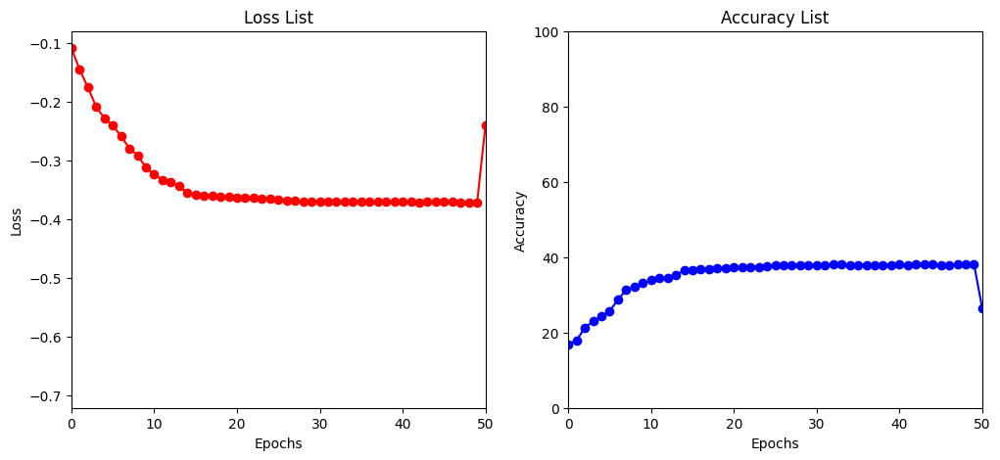

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.833448
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.830870
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.786446
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.716157
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.787784
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.870363
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.821564
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.797280

Test set: Average loss: -0.6796, Accuracy: 6848/10000 (68%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.819613
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.796689
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.714490
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.772960
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.753570
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.743475
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.744396
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.779654

Test set: Average loss: -0.6800, Accuracy: 6868/10000 (69%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.780322
Train Epoch: 43 [6400/5000

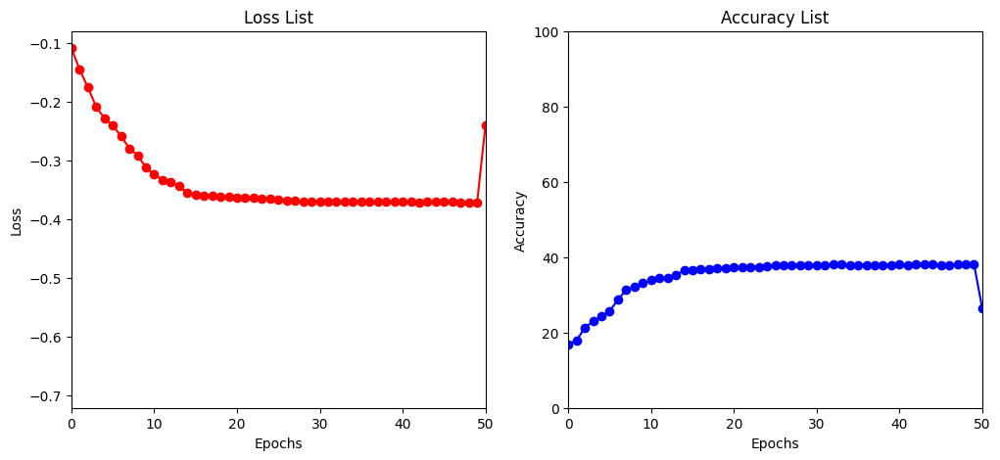

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.773809
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.832054
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.752684
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.761263
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.760096
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.794858
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.788324
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.781005

Test set: Average loss: -0.6804, Accuracy: 6860/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.745555
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.804030
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.762220
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.867430
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.749193
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.769025
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.746051
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.767075

Test set: Average loss: -0.6806, Accuracy: 6848/10000 (68%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.759749
Train Epoch: 48 [6400/5000

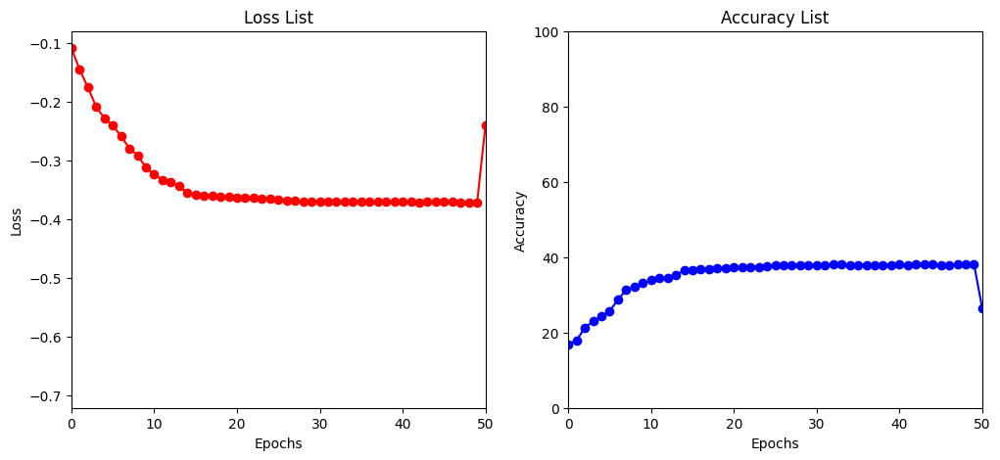

[I 2023-04-15 03:54:04,629] Trial 17 finished with value: -0.682964769077301 and parameters: {'lr': 0.0003951105287075462, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302842
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.238668
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.277133
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.201226
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.215371
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.199897
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.206208
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.232723

Test set: Average loss: -0.3183, Accuracy: 3204/10000 (32%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.157513
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.196350
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.170688
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.164829
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.155746
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.105855
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.193029
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.126890

Test set: Average loss: -0.3574, Accuracy: 3608/10000 (36%)

Train Epoch:

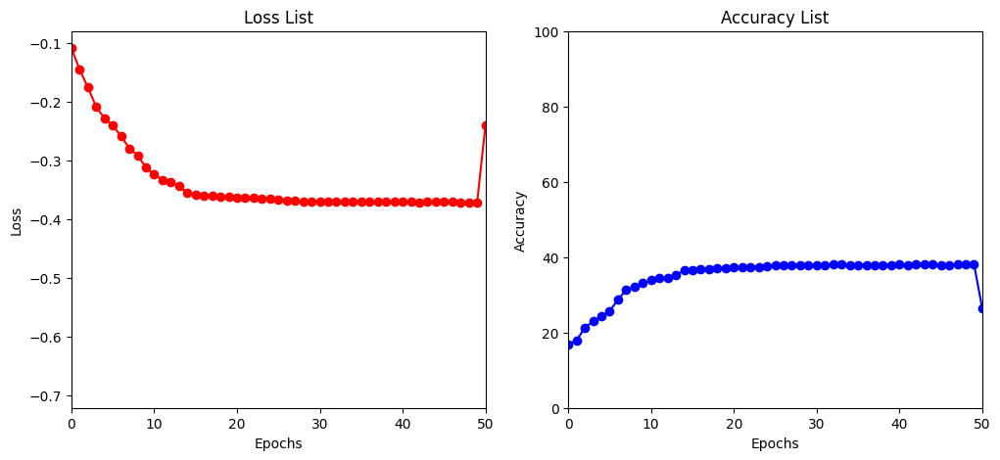

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.071442
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.104551
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.045909
Train Epoch: 6 [19200/50000 (38%)]	Loss: 2.049082
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.073988
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.088718
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.105368
Train Epoch: 6 [44800/50000 (90%)]	Loss: 2.040645

Test set: Average loss: -0.3993, Accuracy: 4028/10000 (40%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.075394
Train Epoch: 7 [6400/50000 (13%)]	Loss: 2.034756
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.057347
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.103143
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.075528
Train Epoch: 7 [32000/50000 (64%)]	Loss: 2.044834
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.077603
Train Epoch: 7 [44800/50000 (90%)]	Loss: 2.012008

Test set: Average loss: -0.4240, Accuracy: 4294/10000 (43%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.001079
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.1

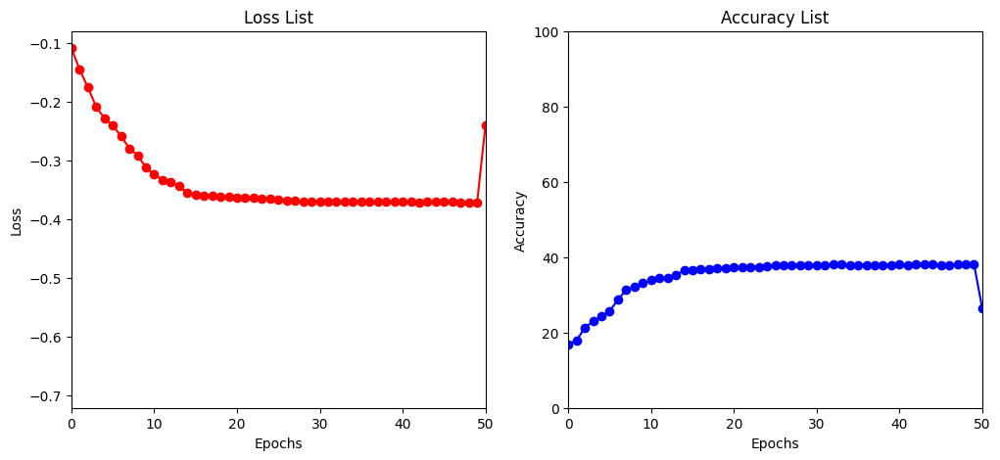

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.030091
Train Epoch: 11 [6400/50000 (13%)]	Loss: 2.028010
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.086330
Train Epoch: 11 [19200/50000 (38%)]	Loss: 2.095077
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.996479
Train Epoch: 11 [32000/50000 (64%)]	Loss: 2.041744
Train Epoch: 11 [38400/50000 (77%)]	Loss: 2.022130
Train Epoch: 11 [44800/50000 (90%)]	Loss: 2.034667

Test set: Average loss: -0.4416, Accuracy: 4444/10000 (44%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.999421
Train Epoch: 12 [6400/50000 (13%)]	Loss: 2.025868
Train Epoch: 12 [12800/50000 (26%)]	Loss: 2.040915
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.997134
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.042941
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.993468
Train Epoch: 12 [38400/50000 (77%)]	Loss: 2.002696
Train Epoch: 12 [44800/50000 (90%)]	Loss: 2.006372

Test set: Average loss: -0.4672, Accuracy: 4725/10000 (47%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.999755
Train Epoch: 13 [6400/5000

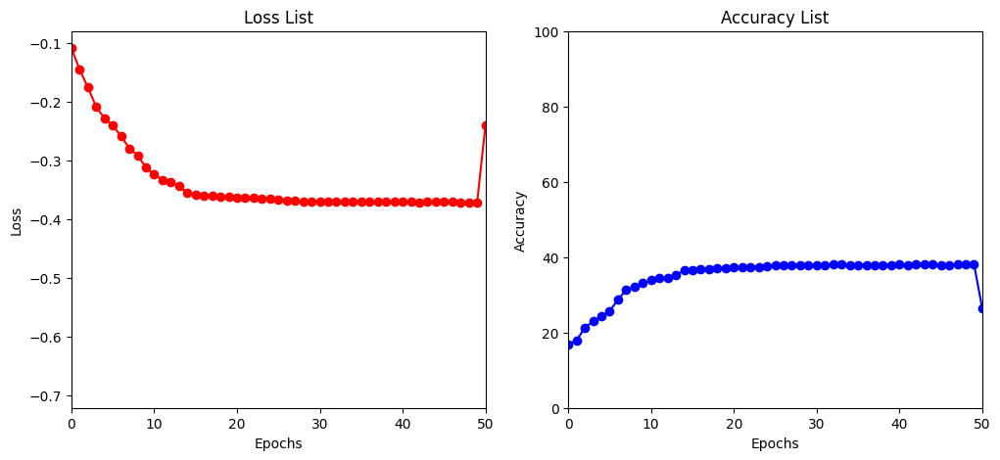

Train Epoch: 16 [0/50000 (0%)]	Loss: 2.008826
Train Epoch: 16 [6400/50000 (13%)]	Loss: 2.022647
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.962949
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.940976
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.994699
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.983398
Train Epoch: 16 [38400/50000 (77%)]	Loss: 2.042175
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.965343

Test set: Average loss: -0.5141, Accuracy: 5196/10000 (52%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.954859
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.951228
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.958541
Train Epoch: 17 [19200/50000 (38%)]	Loss: 2.019392
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.884854
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.949827
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.955828
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.896379

Test set: Average loss: -0.5221, Accuracy: 5267/10000 (53%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.978989
Train Epoch: 18 [6400/5000

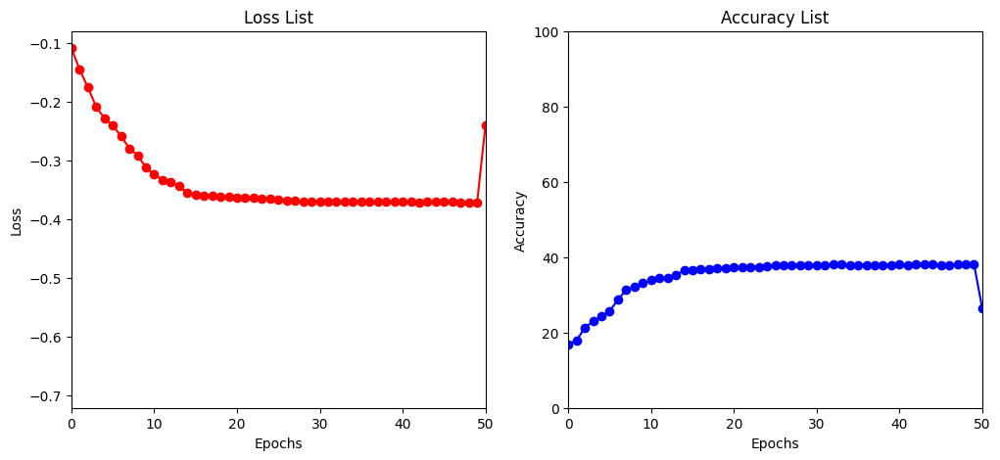

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.906817
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.888574
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.917773
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.974097
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.975051
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.933508
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.923711
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.967336

Test set: Average loss: -0.5344, Accuracy: 5401/10000 (54%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.961307
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.889411
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.927757
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.983481
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.899587
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.899515
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.949407
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.990526

Test set: Average loss: -0.5334, Accuracy: 5366/10000 (54%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.952417
Train Epoch: 23 [6400/5000

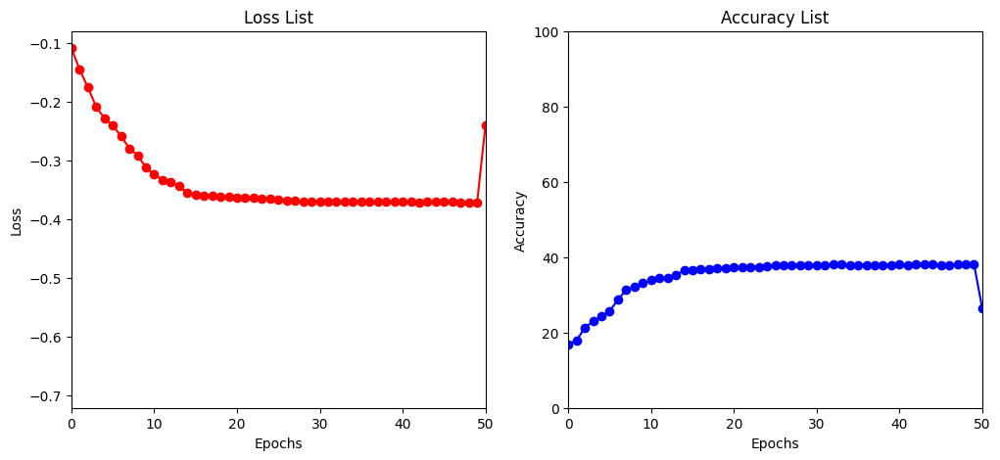

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.909305
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.954431
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.996104
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.914944
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.954912
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.999472
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.931275
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.965389

Test set: Average loss: -0.5483, Accuracy: 5524/10000 (55%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.971315
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.908822
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.997484
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.894805
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.924061
Train Epoch: 27 [32000/50000 (64%)]	Loss: 2.006599
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.960313
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.934307

Test set: Average loss: -0.5535, Accuracy: 5593/10000 (56%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.923546
Train Epoch: 28 [6400/5000

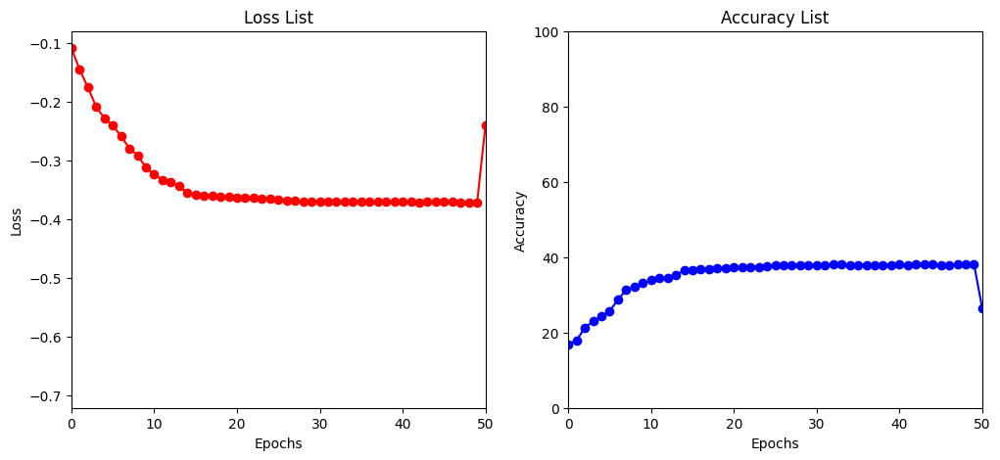

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.951433
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.856148
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.984748
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.964225
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.908306
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.986654
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.842676
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.958012

Test set: Average loss: -0.5583, Accuracy: 5629/10000 (56%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.904263
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.931515
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.833539
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.885272
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.897775
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.932811
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.915162
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.889054

Test set: Average loss: -0.5591, Accuracy: 5625/10000 (56%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.931860
Train Epoch: 33 [6400/5000

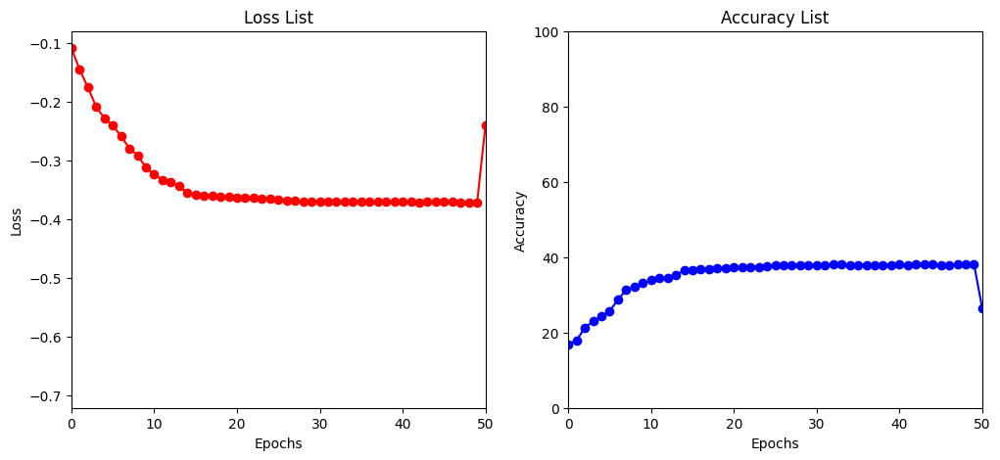

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.898937
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.919634
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.922397
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.901484
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.901841
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.929421
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.954920
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.999502

Test set: Average loss: -0.5627, Accuracy: 5682/10000 (57%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.949904
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.918831
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.836951
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.881838
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.925792
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.906587
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.902032
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.833277

Test set: Average loss: -0.5630, Accuracy: 5680/10000 (57%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.902868
Train Epoch: 38 [6400/5000

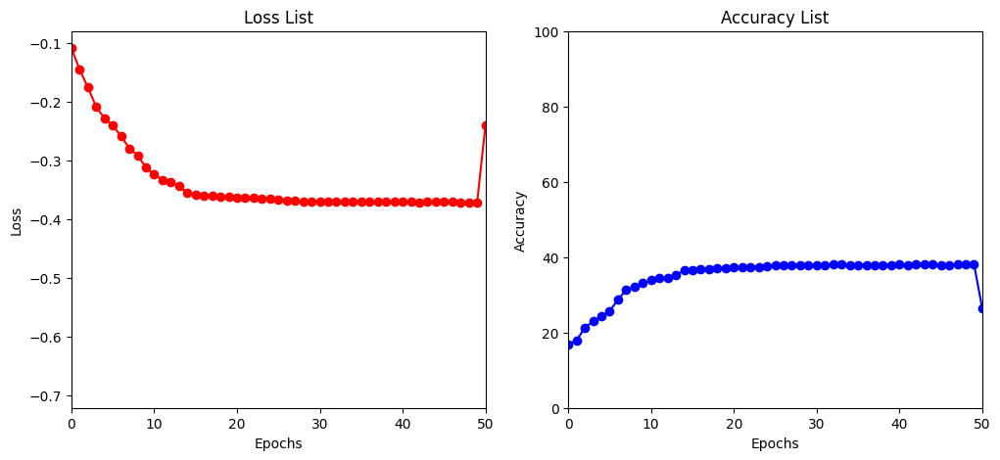

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.930140
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.978934
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.902750
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.876124
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.977039
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.946339
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.929187
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.979610

Test set: Average loss: -0.5677, Accuracy: 5742/10000 (57%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.894100
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.981908
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.949701
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.945425
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.852969
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.900938
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.864678
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.933591

Test set: Average loss: -0.5656, Accuracy: 5705/10000 (57%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.891814
Train Epoch: 43 [6400/5000

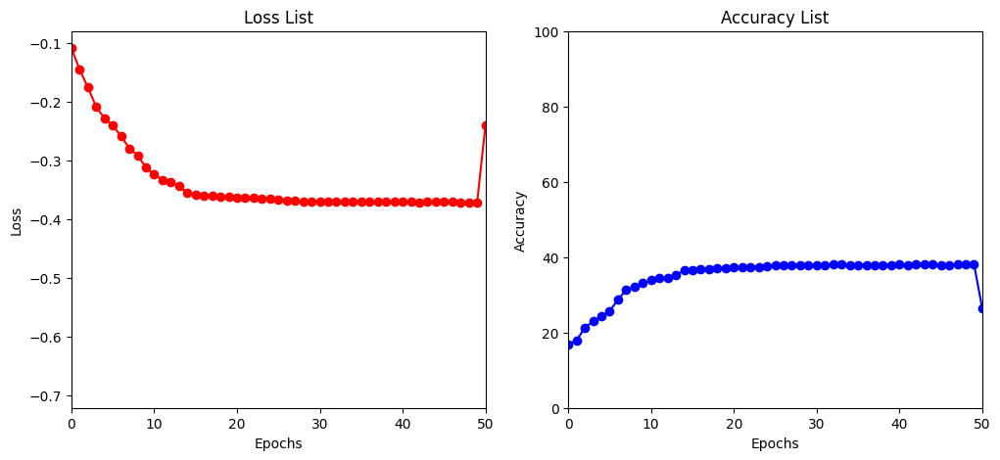

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.869810
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.980402
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.842491
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.949693
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.893043
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.915145
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.939728
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.871349

Test set: Average loss: -0.5699, Accuracy: 5744/10000 (57%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.817229
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.897655
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.930053
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.978644
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.874132
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.898955
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.831227
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.915246

Test set: Average loss: -0.5688, Accuracy: 5737/10000 (57%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.933531
Train Epoch: 48 [6400/5000

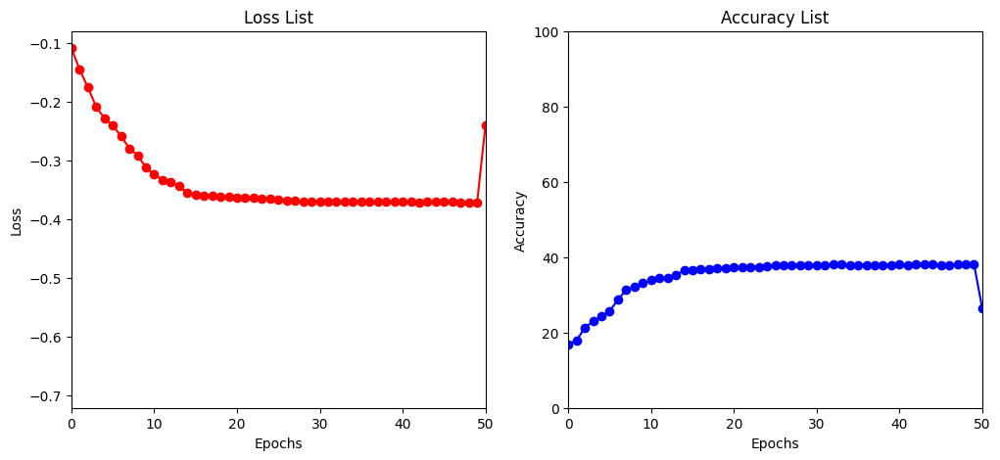

[I 2023-04-15 04:15:55,649] Trial 18 finished with value: -0.5679941838741303 and parameters: {'lr': 0.0008826107596824549, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.5}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.303242
Train Epoch: 1 [25900/50000 (52%)]	Loss: 2.297516

Test set: Average loss: -0.1433, Accuracy: 1780/10000 (18%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.270382
Train Epoch: 2 [25900/50000 (52%)]	Loss: 2.256619

Test set: Average loss: -0.1984, Accuracy: 2317/10000 (23%)

Train Epoch: 3 [0/50000 (0%)]	Loss: 2.241102
Train Epoch: 3 [25900/50000 (52%)]	Loss: 2.208192

Test set: Average loss: -0.2527, Accuracy: 2688/10000 (27%)

Train Epoch: 4 [0/50000 (0%)]	Loss: 2.179452
Train Epoch: 4 [25900/50000 (52%)]	Loss: 2.193167

Test set: Average loss: -0.2874, Accuracy: 3166/10000 (32%)

Train Epoch: 5 [0/50000 (0%)]	Loss: 2.189970
Train Epoch: 5 [25900/50000 (52%)]	Loss: 2.165139

Test set: Average loss: -0.3198, Accuracy: 3290/10000 (33%)



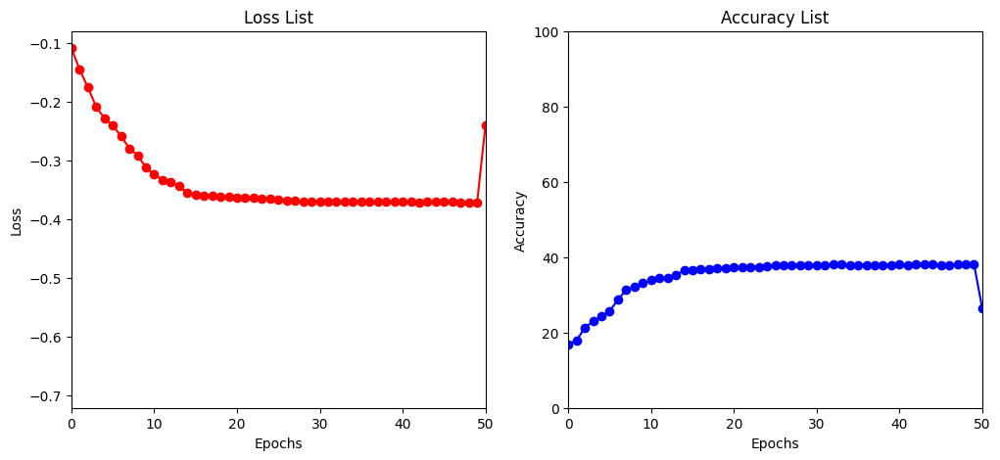

Train Epoch: 6 [0/50000 (0%)]	Loss: 2.144060
Train Epoch: 6 [25900/50000 (52%)]	Loss: 2.134162

Test set: Average loss: -0.3174, Accuracy: 3218/10000 (32%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.140584
Train Epoch: 7 [25900/50000 (52%)]	Loss: 2.133097

Test set: Average loss: -0.3403, Accuracy: 3473/10000 (35%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 2.102996
Train Epoch: 8 [25900/50000 (52%)]	Loss: 2.132234

Test set: Average loss: -0.3726, Accuracy: 3821/10000 (38%)

Train Epoch: 9 [0/50000 (0%)]	Loss: 2.121057
Train Epoch: 9 [25900/50000 (52%)]	Loss: 2.101986

Test set: Average loss: -0.3958, Accuracy: 4111/10000 (41%)

Train Epoch: 10 [0/50000 (0%)]	Loss: 2.095180
Train Epoch: 10 [25900/50000 (52%)]	Loss: 2.072551

Test set: Average loss: -0.4260, Accuracy: 4384/10000 (44%)



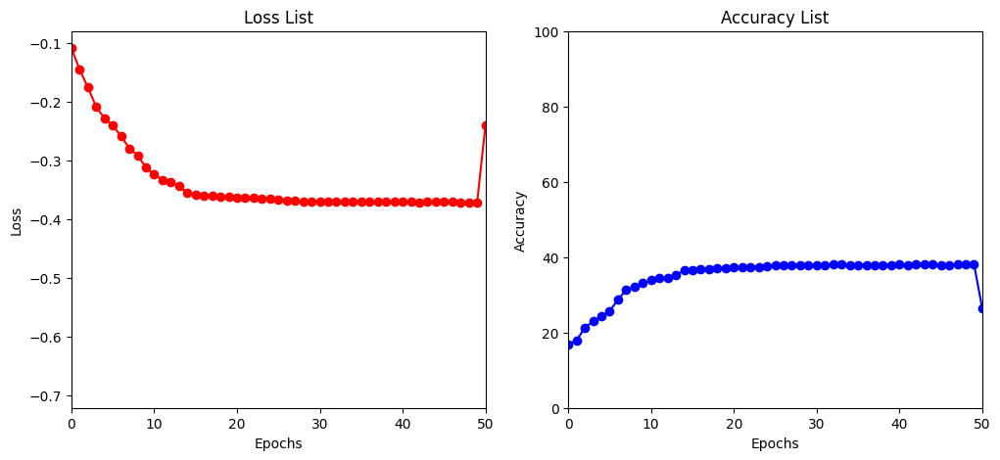

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.085529
Train Epoch: 11 [25900/50000 (52%)]	Loss: 2.105480

Test set: Average loss: -0.4431, Accuracy: 4530/10000 (45%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 2.062260
Train Epoch: 12 [25900/50000 (52%)]	Loss: 2.055146

Test set: Average loss: -0.4318, Accuracy: 4368/10000 (44%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 2.033623
Train Epoch: 13 [25900/50000 (52%)]	Loss: 2.036933

Test set: Average loss: -0.4566, Accuracy: 4637/10000 (46%)

Train Epoch: 14 [0/50000 (0%)]	Loss: 2.053020
Train Epoch: 14 [25900/50000 (52%)]	Loss: 2.051211

Test set: Average loss: -0.4606, Accuracy: 4644/10000 (46%)

Train Epoch: 15 [0/50000 (0%)]	Loss: 2.030352
Train Epoch: 15 [25900/50000 (52%)]	Loss: 1.999385

Test set: Average loss: -0.4619, Accuracy: 4669/10000 (47%)



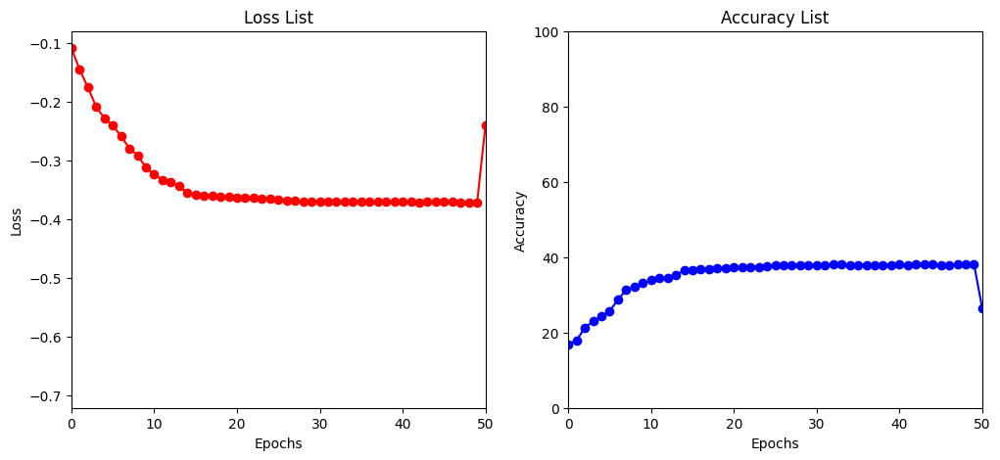

Train Epoch: 16 [0/50000 (0%)]	Loss: 2.015471
Train Epoch: 16 [25900/50000 (52%)]	Loss: 2.001173

Test set: Average loss: -0.4732, Accuracy: 4777/10000 (48%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.998722
Train Epoch: 17 [25900/50000 (52%)]	Loss: 2.019427

Test set: Average loss: -0.4734, Accuracy: 4788/10000 (48%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.996799
Train Epoch: 18 [25900/50000 (52%)]	Loss: 1.998603

Test set: Average loss: -0.4731, Accuracy: 4780/10000 (48%)

Train Epoch: 19 [0/50000 (0%)]	Loss: 2.029698
Train Epoch: 19 [25900/50000 (52%)]	Loss: 2.025159

Test set: Average loss: -0.4746, Accuracy: 4786/10000 (48%)

Train Epoch: 20 [0/50000 (0%)]	Loss: 2.037292
Train Epoch: 20 [25900/50000 (52%)]	Loss: 1.996034

Test set: Average loss: -0.4756, Accuracy: 4807/10000 (48%)



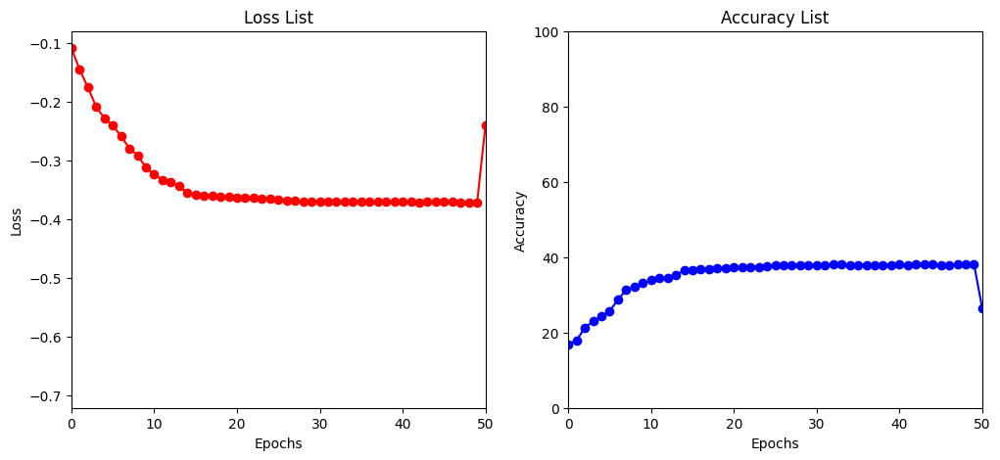

Train Epoch: 21 [0/50000 (0%)]	Loss: 2.008200
Train Epoch: 21 [25900/50000 (52%)]	Loss: 2.042695

Test set: Average loss: -0.4772, Accuracy: 4820/10000 (48%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.991544
Train Epoch: 22 [25900/50000 (52%)]	Loss: 2.046293

Test set: Average loss: -0.4752, Accuracy: 4803/10000 (48%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 2.006072
Train Epoch: 23 [25900/50000 (52%)]	Loss: 2.013553

Test set: Average loss: -0.4760, Accuracy: 4814/10000 (48%)

Train Epoch: 24 [0/50000 (0%)]	Loss: 2.031621
Train Epoch: 24 [25900/50000 (52%)]	Loss: 2.033282

Test set: Average loss: -0.4771, Accuracy: 4819/10000 (48%)

Train Epoch: 25 [0/50000 (0%)]	Loss: 1.989319
Train Epoch: 25 [25900/50000 (52%)]	Loss: 2.023672

Test set: Average loss: -0.4778, Accuracy: 4820/10000 (48%)



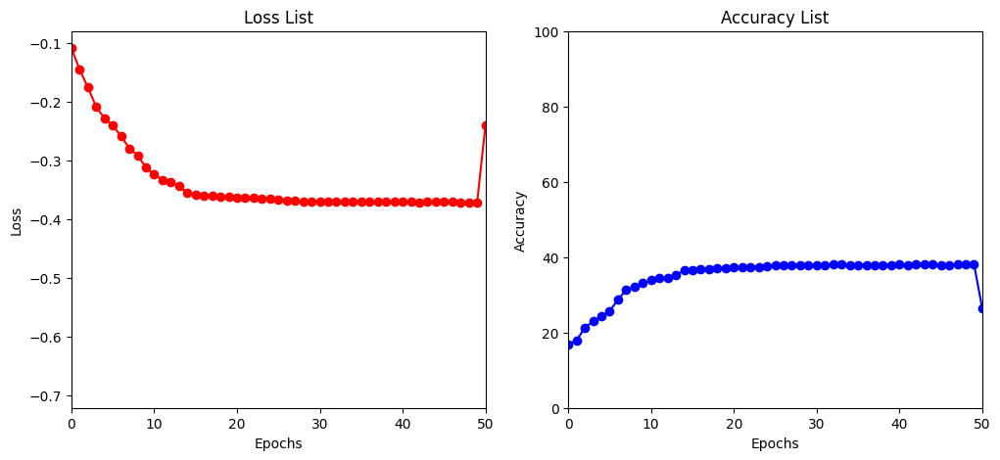

Train Epoch: 26 [0/50000 (0%)]	Loss: 2.028024
Train Epoch: 26 [25900/50000 (52%)]	Loss: 1.997892

Test set: Average loss: -0.4785, Accuracy: 4825/10000 (48%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 2.028905
Train Epoch: 27 [25900/50000 (52%)]	Loss: 2.017216

Test set: Average loss: -0.4788, Accuracy: 4831/10000 (48%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 2.003387
Train Epoch: 28 [25900/50000 (52%)]	Loss: 2.000503

Test set: Average loss: -0.4781, Accuracy: 4837/10000 (48%)

Train Epoch: 29 [0/50000 (0%)]	Loss: 2.014354
Train Epoch: 29 [25900/50000 (52%)]	Loss: 1.995643

Test set: Average loss: -0.4788, Accuracy: 4833/10000 (48%)

Train Epoch: 30 [0/50000 (0%)]	Loss: 2.003598
Train Epoch: 30 [25900/50000 (52%)]	Loss: 2.016550

Test set: Average loss: -0.4798, Accuracy: 4841/10000 (48%)



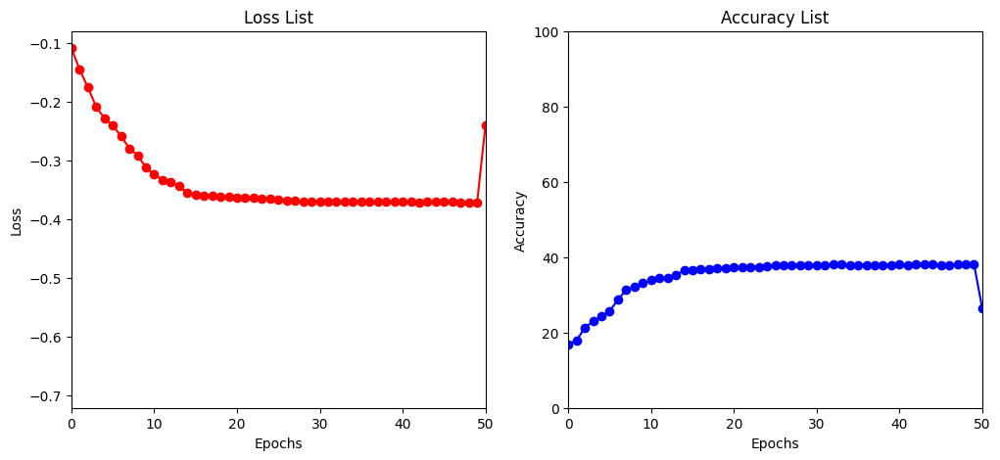

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.998197
Train Epoch: 31 [25900/50000 (52%)]	Loss: 1.972050

Test set: Average loss: -0.4801, Accuracy: 4851/10000 (49%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.996351
Train Epoch: 32 [25900/50000 (52%)]	Loss: 2.019164

Test set: Average loss: -0.4798, Accuracy: 4844/10000 (48%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 2.014008
Train Epoch: 33 [25900/50000 (52%)]	Loss: 2.029390

Test set: Average loss: -0.4803, Accuracy: 4844/10000 (48%)

Train Epoch: 34 [0/50000 (0%)]	Loss: 2.005088
Train Epoch: 34 [25900/50000 (52%)]	Loss: 1.993247

Test set: Average loss: -0.4802, Accuracy: 4842/10000 (48%)

Train Epoch: 35 [0/50000 (0%)]	Loss: 2.010156
Train Epoch: 35 [25900/50000 (52%)]	Loss: 2.019036

Test set: Average loss: -0.4799, Accuracy: 4841/10000 (48%)



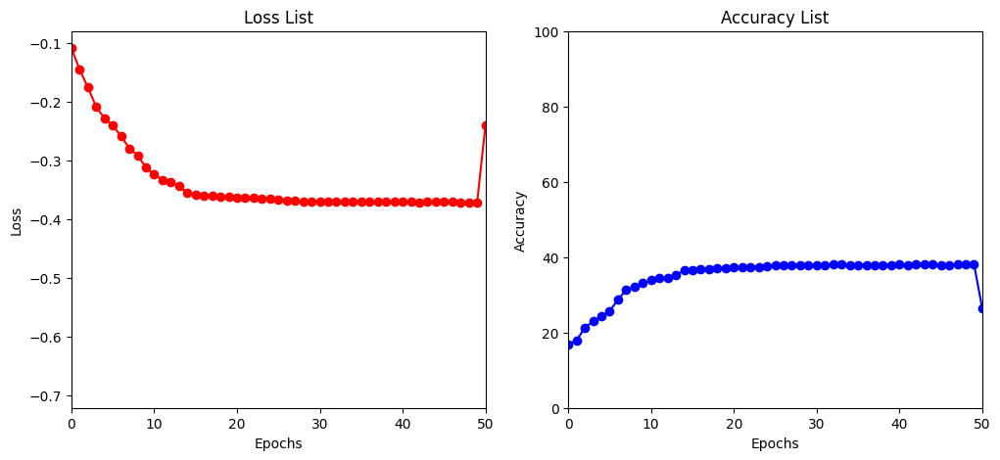

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.991210
Train Epoch: 36 [25900/50000 (52%)]	Loss: 2.003261

Test set: Average loss: -0.4799, Accuracy: 4844/10000 (48%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 2.015937
Train Epoch: 37 [25900/50000 (52%)]	Loss: 1.998828

Test set: Average loss: -0.4799, Accuracy: 4853/10000 (49%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.995483
Train Epoch: 38 [25900/50000 (52%)]	Loss: 1.961595

Test set: Average loss: -0.4805, Accuracy: 4862/10000 (49%)

Train Epoch: 39 [0/50000 (0%)]	Loss: 2.016300
Train Epoch: 39 [25900/50000 (52%)]	Loss: 1.999503

Test set: Average loss: -0.4803, Accuracy: 4852/10000 (49%)

Train Epoch: 40 [0/50000 (0%)]	Loss: 2.037018
Train Epoch: 40 [25900/50000 (52%)]	Loss: 2.000908

Test set: Average loss: -0.4803, Accuracy: 4854/10000 (49%)



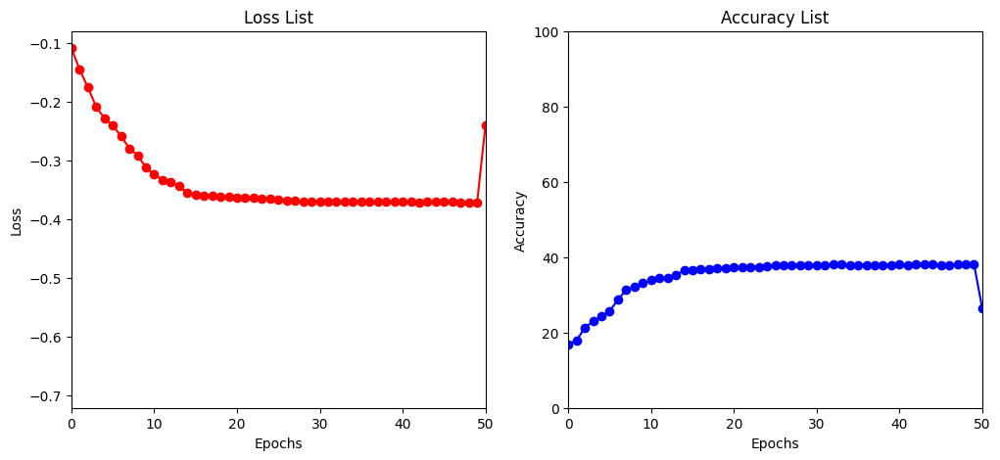

Train Epoch: 41 [0/50000 (0%)]	Loss: 2.026273
Train Epoch: 41 [25900/50000 (52%)]	Loss: 2.007674

Test set: Average loss: -0.4807, Accuracy: 4852/10000 (49%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 2.022072
Train Epoch: 42 [25900/50000 (52%)]	Loss: 2.004095

Test set: Average loss: -0.4803, Accuracy: 4855/10000 (49%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 2.011761
Train Epoch: 43 [25900/50000 (52%)]	Loss: 2.011067

Test set: Average loss: -0.4806, Accuracy: 4856/10000 (49%)

Train Epoch: 44 [0/50000 (0%)]	Loss: 1.967343
Train Epoch: 44 [25900/50000 (52%)]	Loss: 2.005434

Test set: Average loss: -0.4801, Accuracy: 4850/10000 (48%)

Train Epoch: 45 [0/50000 (0%)]	Loss: 1.977289
Train Epoch: 45 [25900/50000 (52%)]	Loss: 2.044787

Test set: Average loss: -0.4801, Accuracy: 4852/10000 (49%)



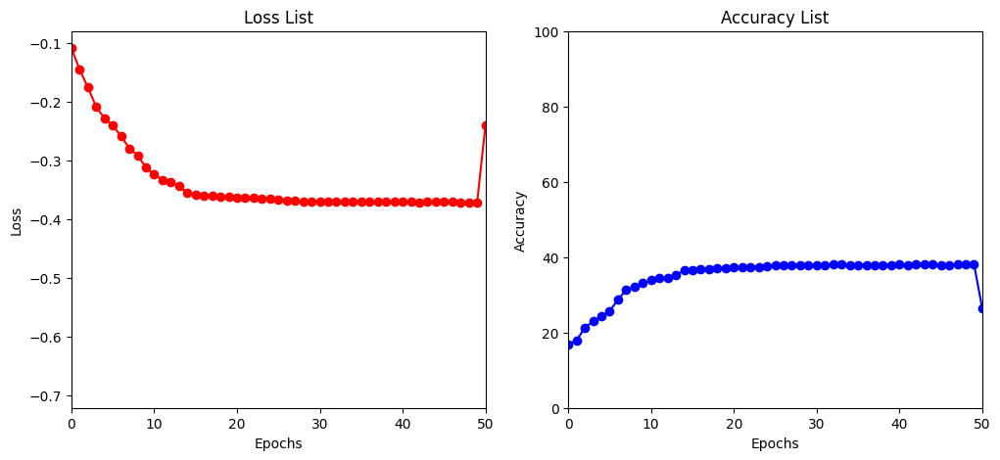

Train Epoch: 46 [0/50000 (0%)]	Loss: 2.031375
Train Epoch: 46 [25900/50000 (52%)]	Loss: 1.971124

Test set: Average loss: -0.4808, Accuracy: 4856/10000 (49%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.995184
Train Epoch: 47 [25900/50000 (52%)]	Loss: 2.048800

Test set: Average loss: -0.4801, Accuracy: 4843/10000 (48%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 2.026336
Train Epoch: 48 [25900/50000 (52%)]	Loss: 2.014960

Test set: Average loss: -0.4802, Accuracy: 4851/10000 (49%)

Train Epoch: 49 [0/50000 (0%)]	Loss: 1.998213
Train Epoch: 49 [25900/50000 (52%)]	Loss: 1.979095

Test set: Average loss: -0.4805, Accuracy: 4850/10000 (48%)

Train Epoch: 50 [0/50000 (0%)]	Loss: 2.010887
Train Epoch: 50 [25900/50000 (52%)]	Loss: 2.014982

Test set: Average loss: -0.4805, Accuracy: 4852/10000 (49%)



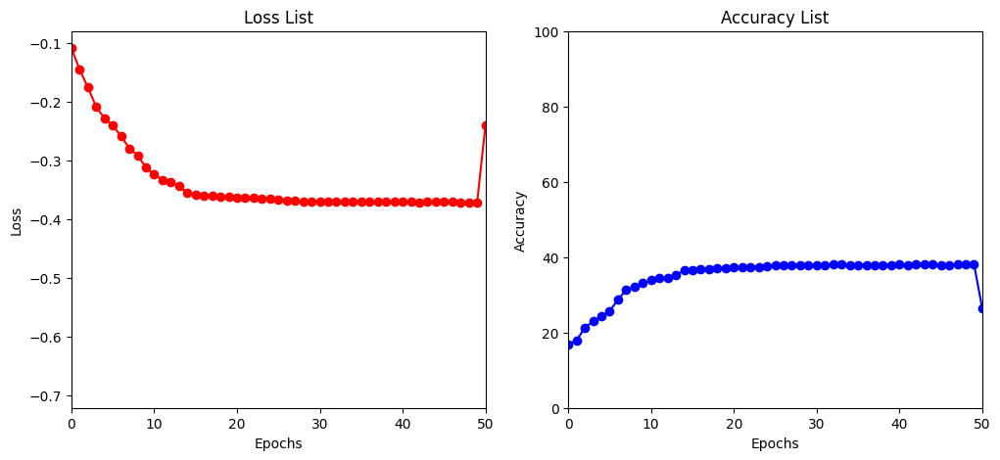

[I 2023-04-15 04:36:25,347] Trial 19 finished with value: -0.4804533187866211 and parameters: {'lr': 5.027918717066718e-05, 'batch_size': 518, 'gamma': 0.08, 'droprate': 0.6}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.247326
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.228859
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.174424
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.219790
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.223763
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.175325
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.150998

Test set: Average loss: -0.3258, Accuracy: 3390/10000 (34%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.104077
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.154478
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.178982
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.078197
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.080639
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.045812
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.107101
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.053573

Test set: Average loss: -0.4129, Accuracy: 4213/10000 (42%)

Train Epoch:

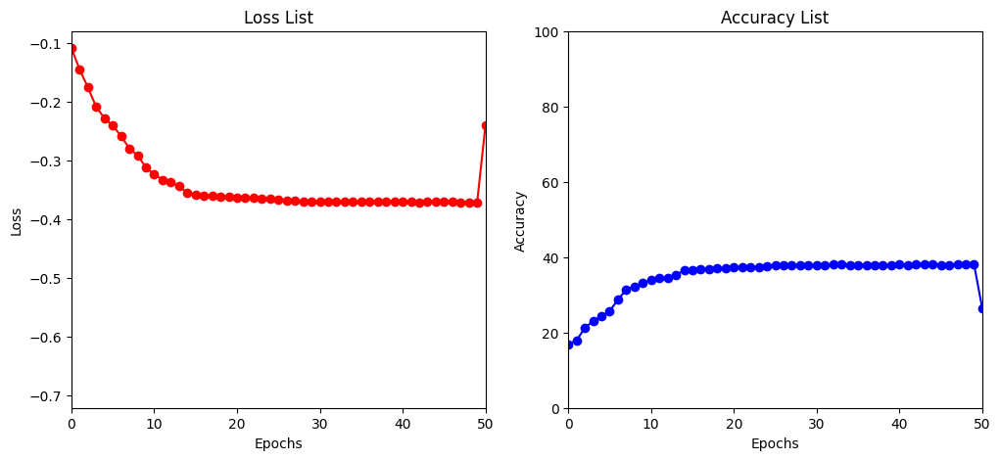

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.877191
Train Epoch: 6 [6400/50000 (13%)]	Loss: 1.993855
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.005727
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.922846
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.006844
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.997662
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.987930
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.894716

Test set: Average loss: -0.5189, Accuracy: 5246/10000 (52%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.045370
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.882674
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.921958
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.026317
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.872396
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.957505
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.973194
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.947976

Test set: Average loss: -0.5328, Accuracy: 5370/10000 (54%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.927575
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.0

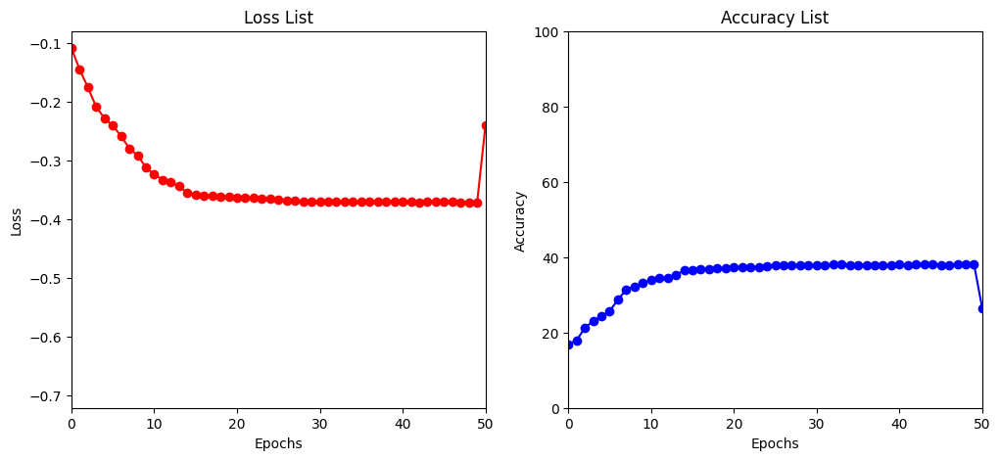

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.883489
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.967418
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.961423
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.948351
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.902921
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.888244
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.860147
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.833455

Test set: Average loss: -0.5857, Accuracy: 5914/10000 (59%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.872580
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.872912
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.915056
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.891454
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.999565
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.897930
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.813240
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.836217

Test set: Average loss: -0.5878, Accuracy: 5938/10000 (59%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.853026
Train Epoch: 13 [6400/5000

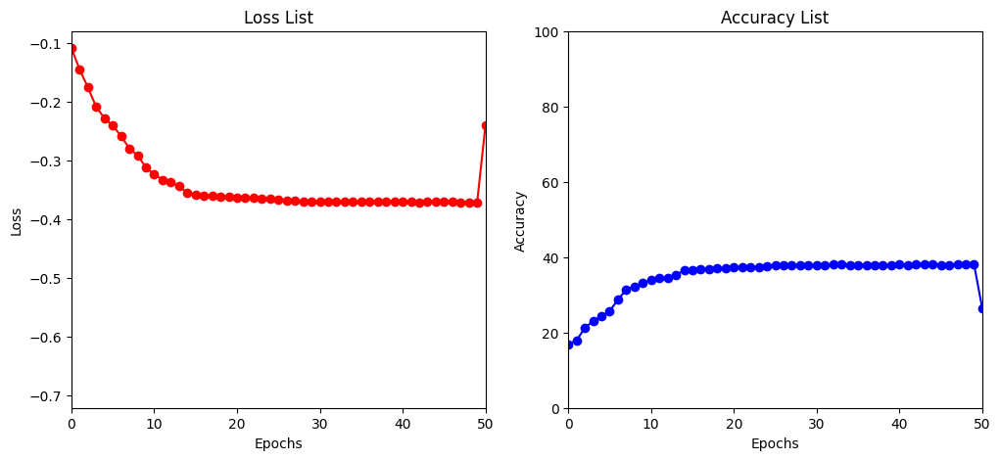

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.903809
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.869050
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.810559
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.828709
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.841900
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.854584
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.847489
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.841116

Test set: Average loss: -0.6471, Accuracy: 6518/10000 (65%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.826893
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.816909
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.873459
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.822381
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.771607
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.805877
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.868951
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.810927

Test set: Average loss: -0.6508, Accuracy: 6569/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.867235
Train Epoch: 18 [6400/5000

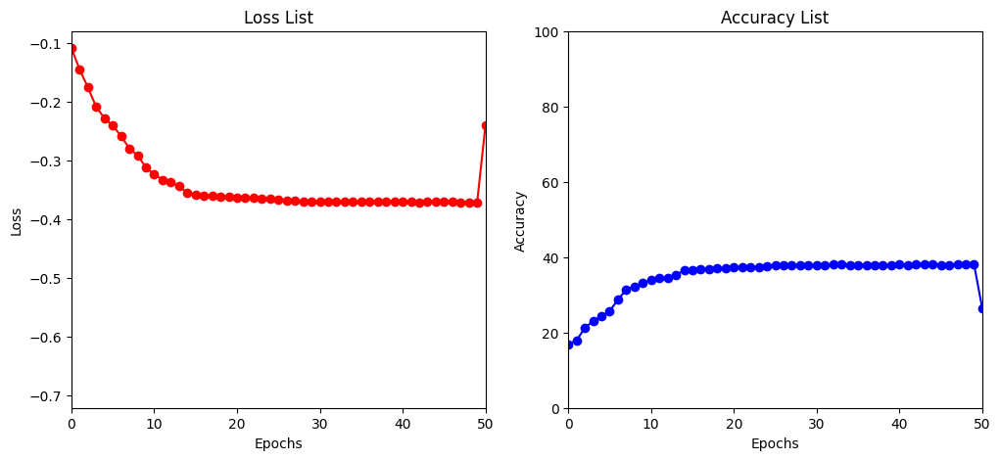

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.808119
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.782508
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.762913
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.846073
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.886933
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.828551
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.796704
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.810438

Test set: Average loss: -0.6623, Accuracy: 6677/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.832723
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.788425
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.806815
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.859707
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.790659
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.739424
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.838325
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.769523

Test set: Average loss: -0.6630, Accuracy: 6695/10000 (67%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.853046
Train Epoch: 23 [6400/5000

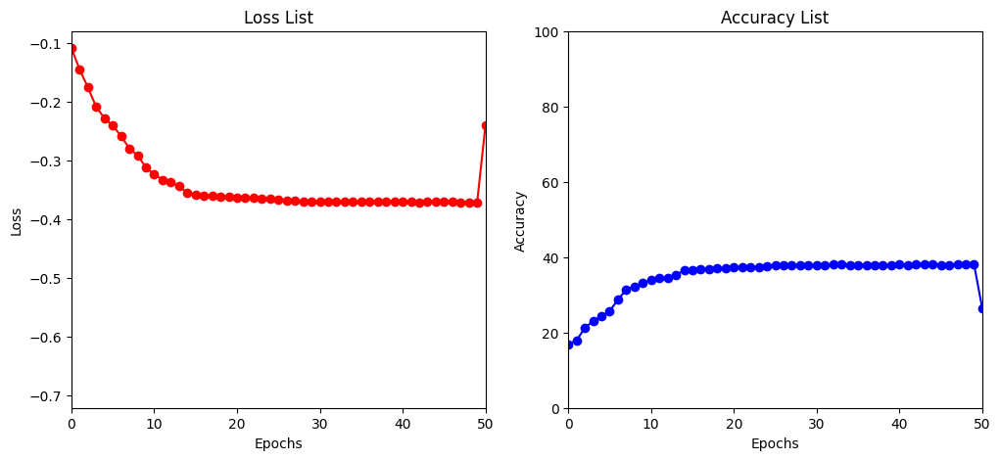

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.761995
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.813650
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.778819
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.854797
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.827335
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.828278
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.814204
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.850865

Test set: Average loss: -0.6693, Accuracy: 6757/10000 (68%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.840512
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.740148
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.789677
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.757969
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.841287
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.853291
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.780314
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.837533

Test set: Average loss: -0.6696, Accuracy: 6728/10000 (67%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.748085
Train Epoch: 28 [6400/5000

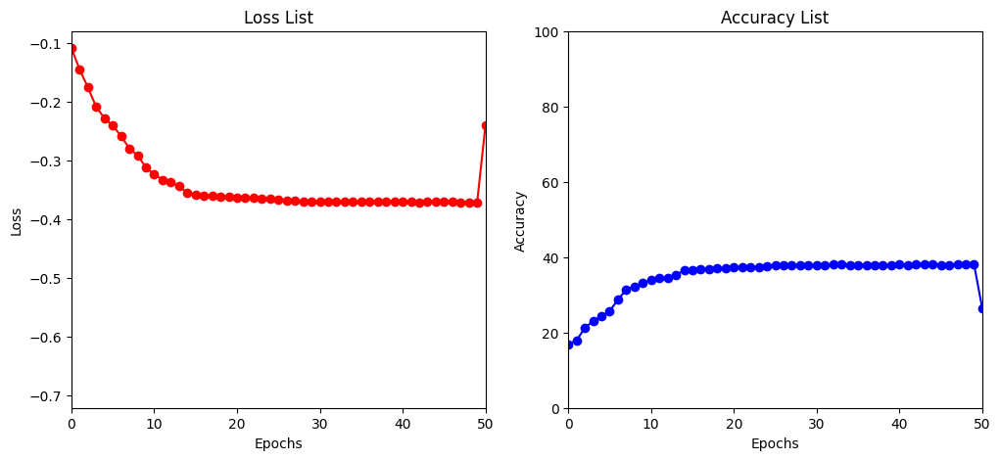

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.839700
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.769723
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.815850
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.814356
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.836087
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.848362
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.764461
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.823236

Test set: Average loss: -0.6751, Accuracy: 6793/10000 (68%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.820783
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.839640
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.730638
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.709806
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.782340
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.770737
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.833453
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.780806

Test set: Average loss: -0.6745, Accuracy: 6806/10000 (68%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.816508
Train Epoch: 33 [6400/5000

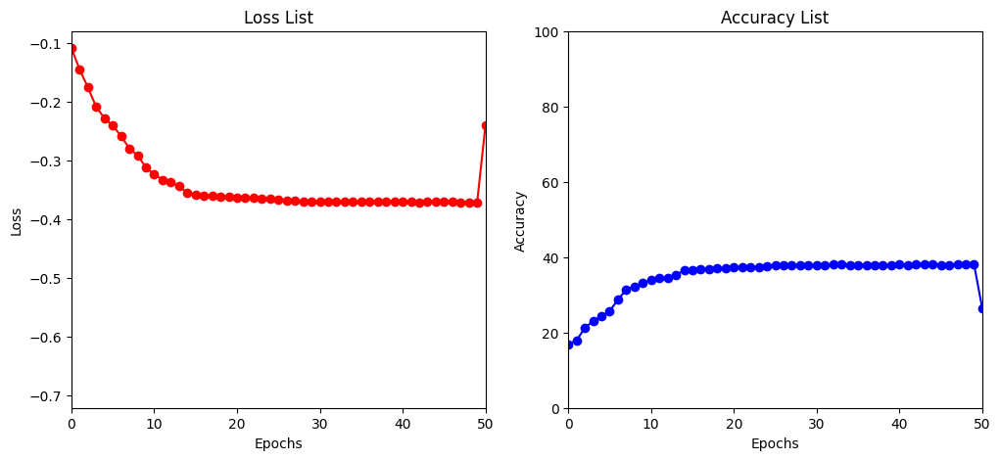

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.803909
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.787147
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.793012
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.760257
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.839382
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.799448
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.855012
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.857449

Test set: Average loss: -0.6768, Accuracy: 6827/10000 (68%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.819793
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.810467
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.756890
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.786669
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.866896
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.750054
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.747266
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.765266

Test set: Average loss: -0.6773, Accuracy: 6834/10000 (68%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.774352
Train Epoch: 38 [6400/5000

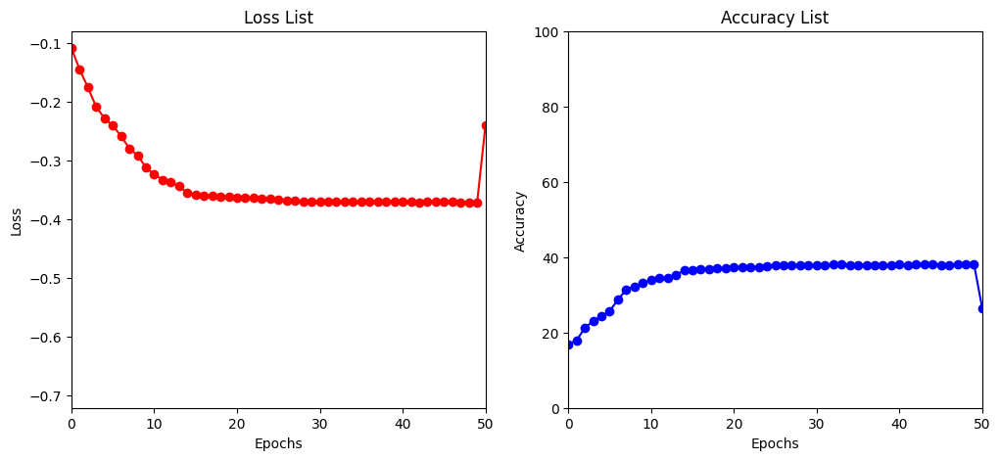

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.805991
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.840112
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.759209
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.773542
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.847765
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.842576
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.802175
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.803766

Test set: Average loss: -0.6788, Accuracy: 6850/10000 (68%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.817084
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.849556
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.765947
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.796245
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.771900
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.744873
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.777717
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.776936

Test set: Average loss: -0.6774, Accuracy: 6828/10000 (68%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.809280
Train Epoch: 43 [6400/5000

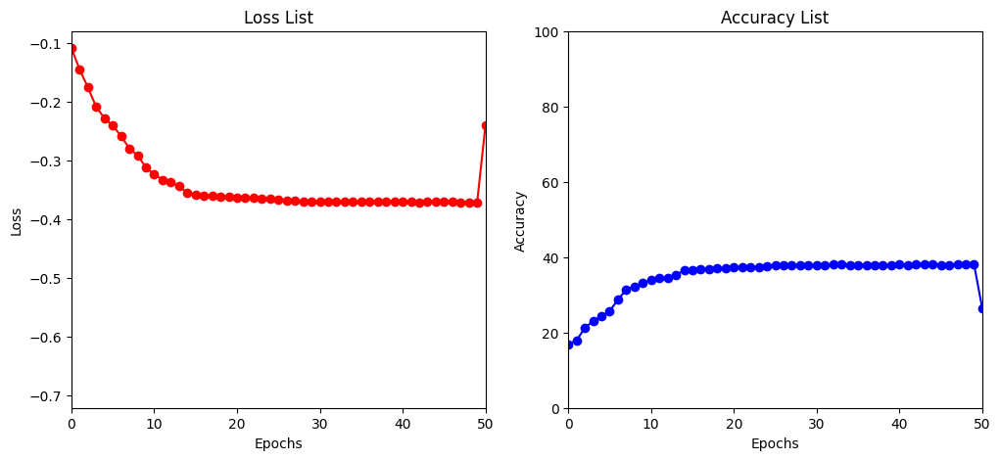

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.808528
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.834143
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.774390
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.823237
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.776026
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.805088
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.780523
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.786469

Test set: Average loss: -0.6802, Accuracy: 6857/10000 (69%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.684314
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.807115
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.811883
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.824998
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.743014
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.781745
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.701447
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.777140

Test set: Average loss: -0.6790, Accuracy: 6847/10000 (68%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.812096
Train Epoch: 48 [6400/5000

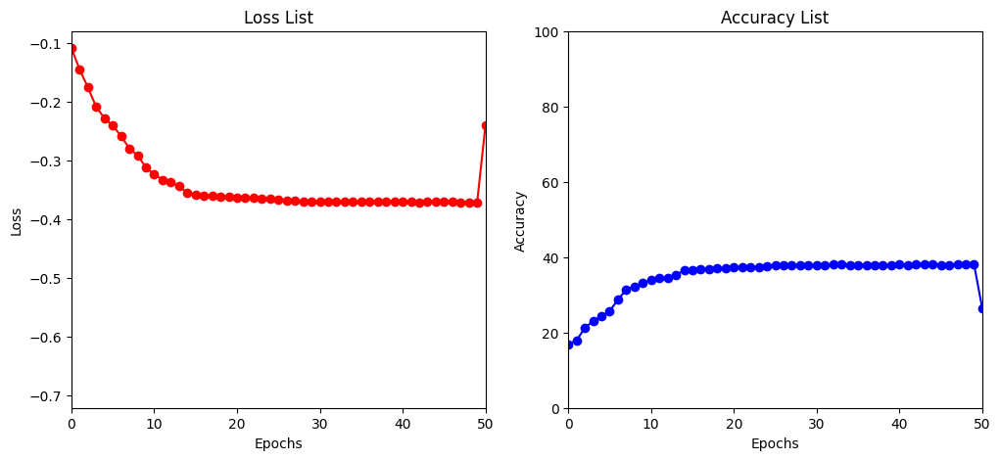

[I 2023-04-15 04:58:26,909] Trial 20 finished with value: -0.6804295245170593 and parameters: {'lr': 0.00015430566668619015, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 6 with value: -0.6914667594909668.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.233950
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.206503
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.177408
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.230004
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.192103
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.182766
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.179111

Test set: Average loss: -0.3143, Accuracy: 3323/10000 (33%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.121204
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.148064
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.174043
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.092979
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.066840
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.073652
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.109965
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.032337

Test set: Average loss: -0.4119, Accuracy: 4172/10000 (42%)

Train Epoch:

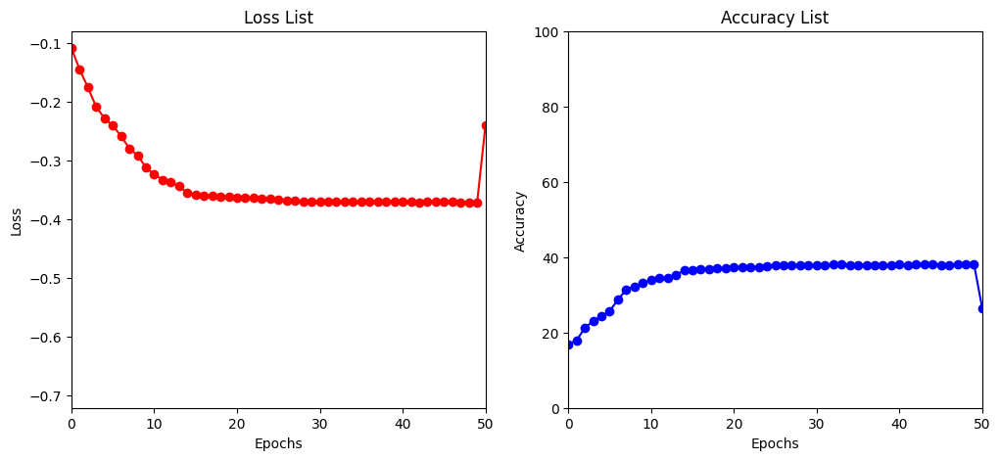

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.951150
Train Epoch: 6 [6400/50000 (13%)]	Loss: 1.986030
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.018928
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.957330
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.038619
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.977707
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.998489
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.895120

Test set: Average loss: -0.5000, Accuracy: 5048/10000 (50%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.001769
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.944547
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.918179
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.018279
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.916845
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.919553
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.961925
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.918160

Test set: Average loss: -0.5171, Accuracy: 5221/10000 (52%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.910117
Train Epoch: 8 [6400/50000 (13%)]	Loss: 1.9

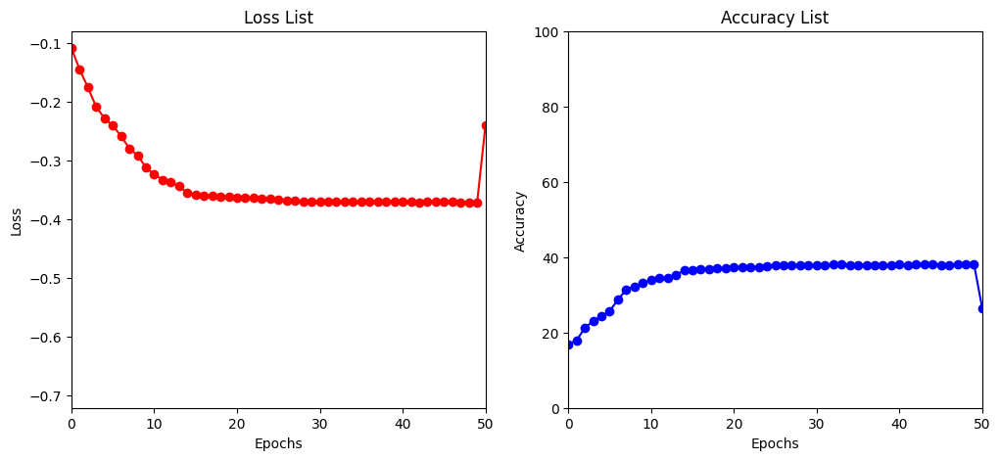

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.877938
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.980955
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.955119
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.884040
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.873020
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.931798
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.847097
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.894307

Test set: Average loss: -0.5994, Accuracy: 6028/10000 (60%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.814639
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.900748
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.916754
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.886105
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.958943
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.878483
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.862419
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.899120

Test set: Average loss: -0.5812, Accuracy: 5864/10000 (59%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.871235
Train Epoch: 13 [6400/5000

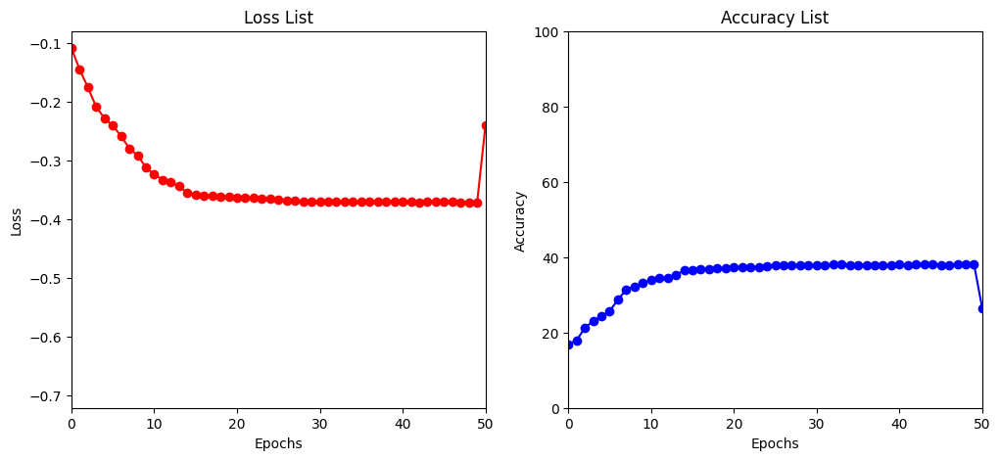

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.915543
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.861847
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.811337
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.823673
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.874348
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.844802
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.814808
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.812085

Test set: Average loss: -0.6569, Accuracy: 6617/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.792120
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.802297
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.855367
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.825984
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.817581
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.833381
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.850555
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.785212

Test set: Average loss: -0.6585, Accuracy: 6617/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.861623
Train Epoch: 18 [6400/5000

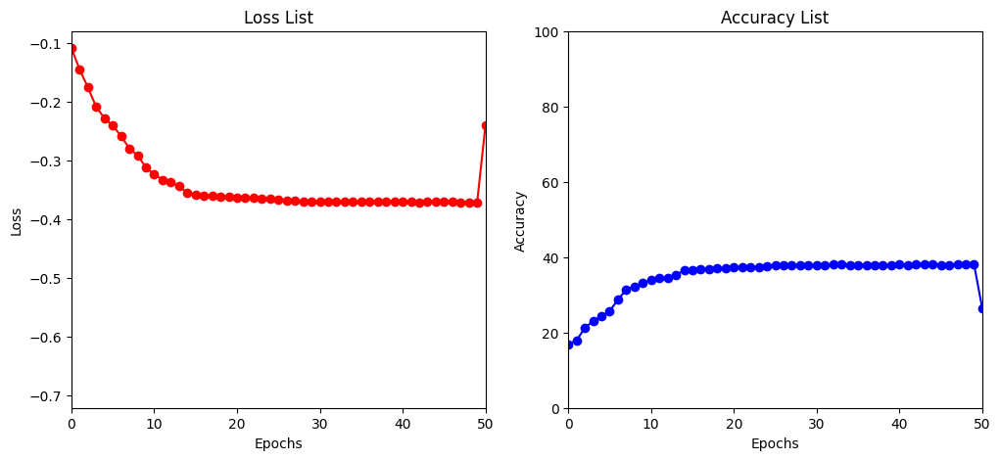

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.794202
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.749314
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.754561
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.829340
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.855917
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.800170
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.770153
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.803092

Test set: Average loss: -0.6712, Accuracy: 6758/10000 (68%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.758750
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.763815
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.782068
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.868032
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.786551
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.736900
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.839722
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.820983

Test set: Average loss: -0.6732, Accuracy: 6789/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.824776
Train Epoch: 23 [6400/5000

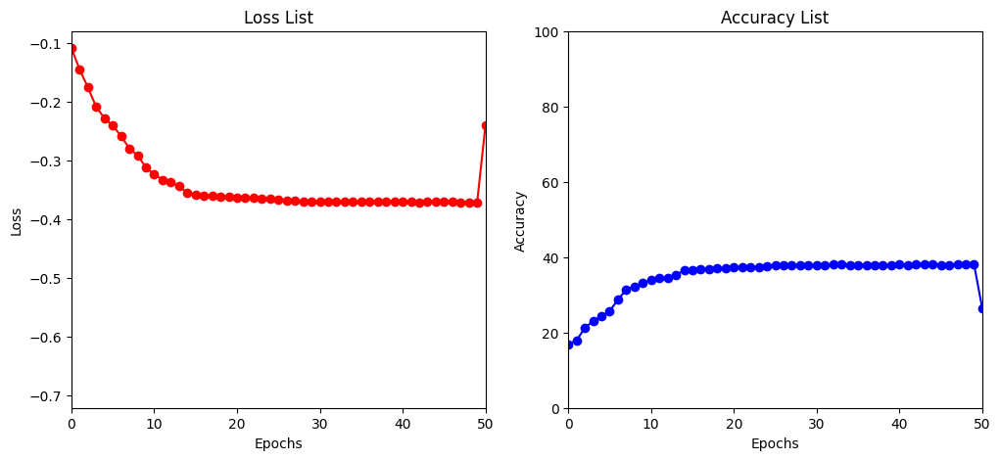

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.797049
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.753033
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.797618
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.824690
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.767068
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.824569
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.790223
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.838534

Test set: Average loss: -0.6828, Accuracy: 6878/10000 (69%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.831543
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.749407
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.768337
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.739283
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.813317
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.815575
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.732122
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.816396

Test set: Average loss: -0.6820, Accuracy: 6875/10000 (69%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.746471
Train Epoch: 28 [6400/5000

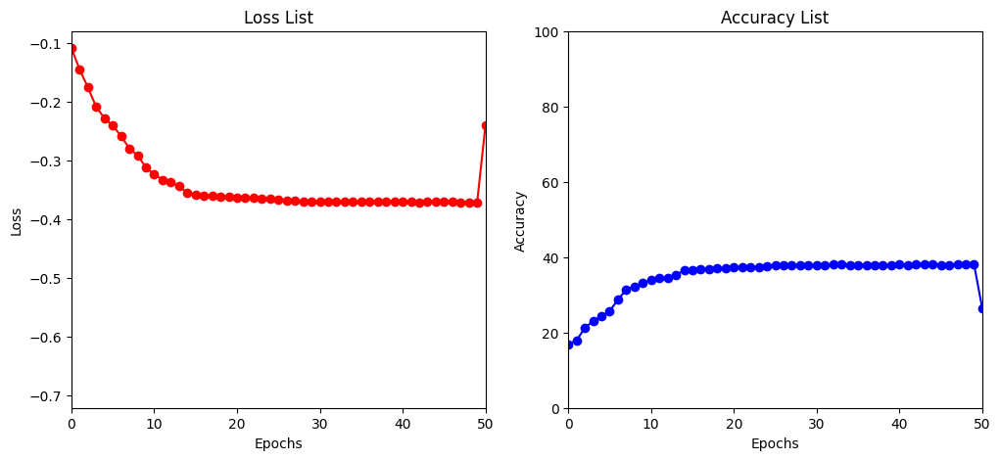

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.803653
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.811614
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.798943
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.761605
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.808807
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.831437
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.759227
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.791437

Test set: Average loss: -0.6907, Accuracy: 6960/10000 (70%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.769193
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.821974
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.711134
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.698706
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.729286
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.736328
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.815942
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.781590

Test set: Average loss: -0.6909, Accuracy: 6966/10000 (70%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.797302
Train Epoch: 33 [6400/5000

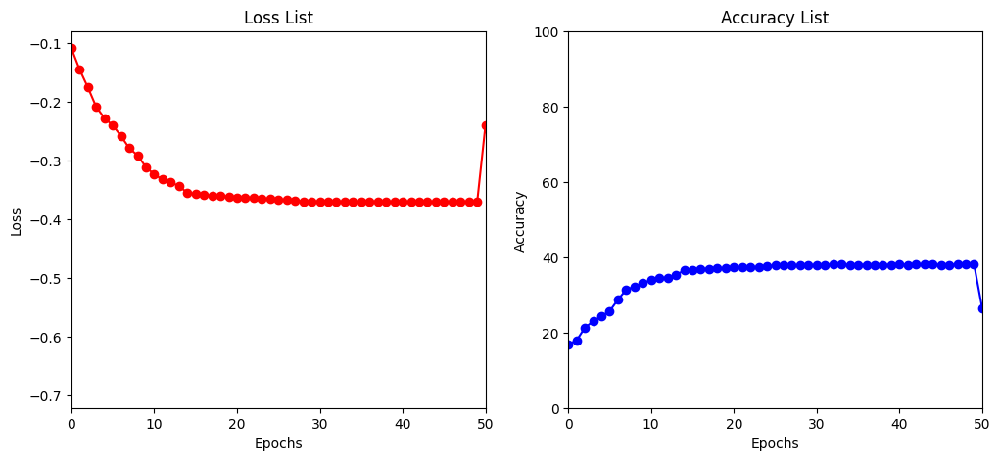

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.752587
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.793849
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.812708
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.765111
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.721227
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.786461
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.798880
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.841379

Test set: Average loss: -0.6925, Accuracy: 6983/10000 (70%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.786003
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.752689
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.745108
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.761574
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.843001
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.781803
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.749120
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.754584

Test set: Average loss: -0.6920, Accuracy: 6969/10000 (70%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.751415
Train Epoch: 38 [6400/5000

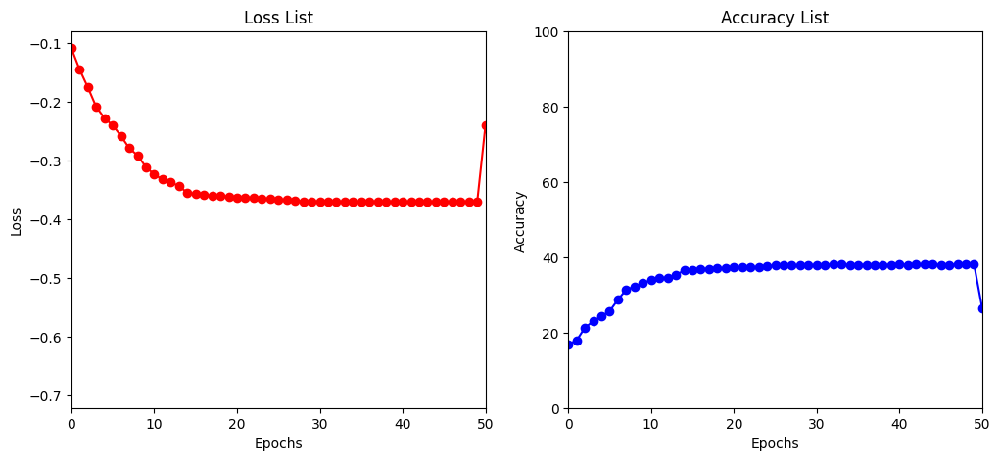

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.796368
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.816210
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.764336
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.732379
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.803853
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.769616
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.799483
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.755666

Test set: Average loss: -0.6924, Accuracy: 6966/10000 (70%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.820593
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.841117
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.766572
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.792109
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.747370
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.712555
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.748841
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.770770

Test set: Average loss: -0.6913, Accuracy: 6963/10000 (70%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.814854
Train Epoch: 43 [6400/5000

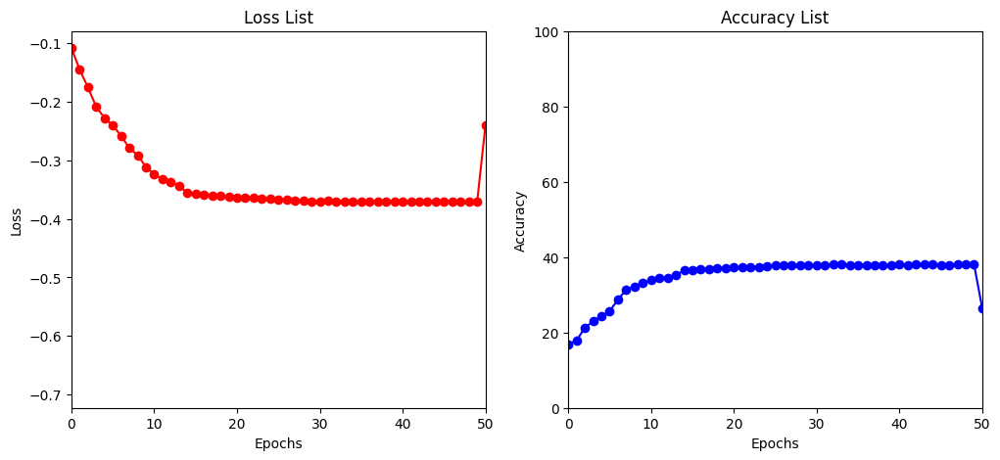

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.776264
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.807702
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.726757
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.726638
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.757654
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.811710
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.750901
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.759483

Test set: Average loss: -0.6943, Accuracy: 6976/10000 (70%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.681558
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.764159
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.776007
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.846497
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.735549
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.732531
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.720249
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.763131

Test set: Average loss: -0.6935, Accuracy: 6977/10000 (70%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.780498
Train Epoch: 48 [6400/5000

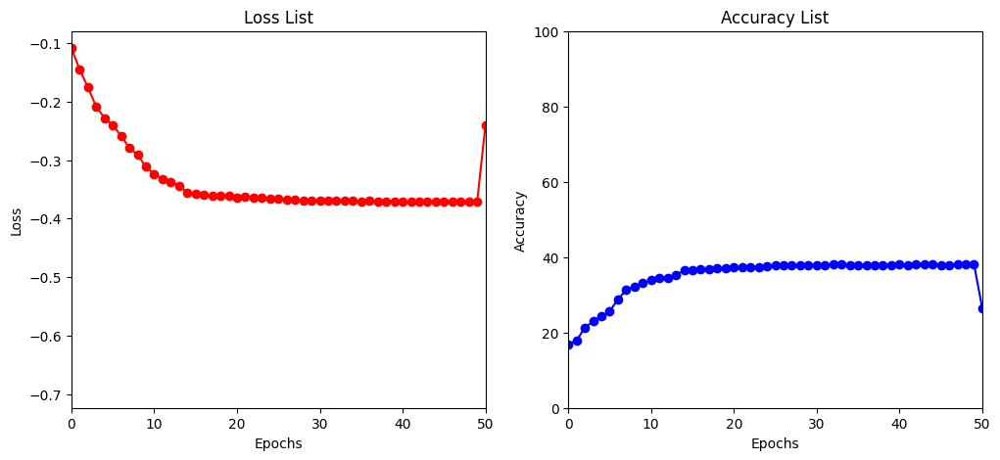

[I 2023-04-15 05:20:31,957] Trial 21 finished with value: -0.693771476316452 and parameters: {'lr': 0.000212940521265243, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 21 with value: -0.693771476316452.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.231435
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.200130
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.171380
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.235123
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.211737
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.199011
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.150789

Test set: Average loss: -0.3254, Accuracy: 3439/10000 (34%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.168359
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.188691
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.151356
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.090798
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.097050
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.061080
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.095075
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.074667

Test set: Average loss: -0.4161, Accuracy: 4280/10000 (43%)

Train Epoch:

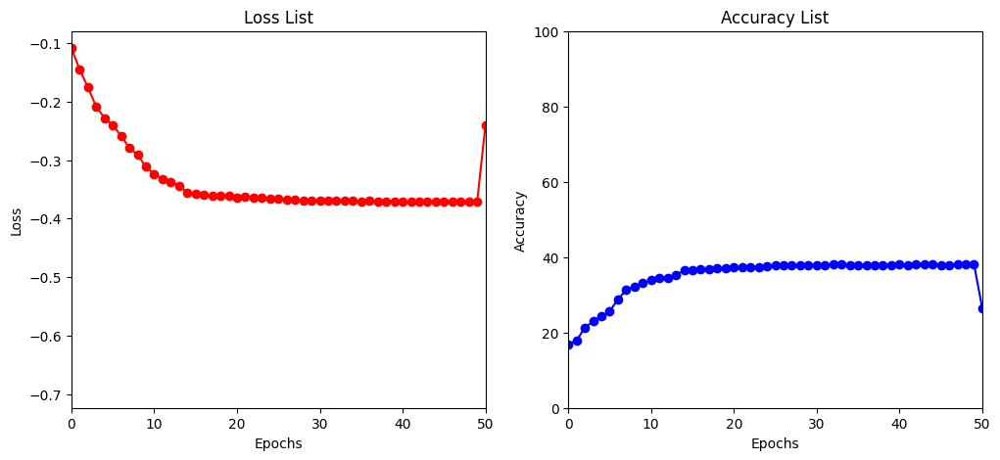

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.912857
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.007112
Train Epoch: 6 [12800/50000 (26%)]	Loss: 1.974349
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.916059
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.046031
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.005629
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.012012
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.895184

Test set: Average loss: -0.5216, Accuracy: 5255/10000 (53%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.002896
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.929946
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.918195
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.024519
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.897099
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.976075
Train Epoch: 7 [38400/50000 (77%)]	Loss: 1.976369
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.980571

Test set: Average loss: -0.5370, Accuracy: 5433/10000 (54%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.938412
Train Epoch: 8 [6400/50000 (13%)]	Loss: 1.9

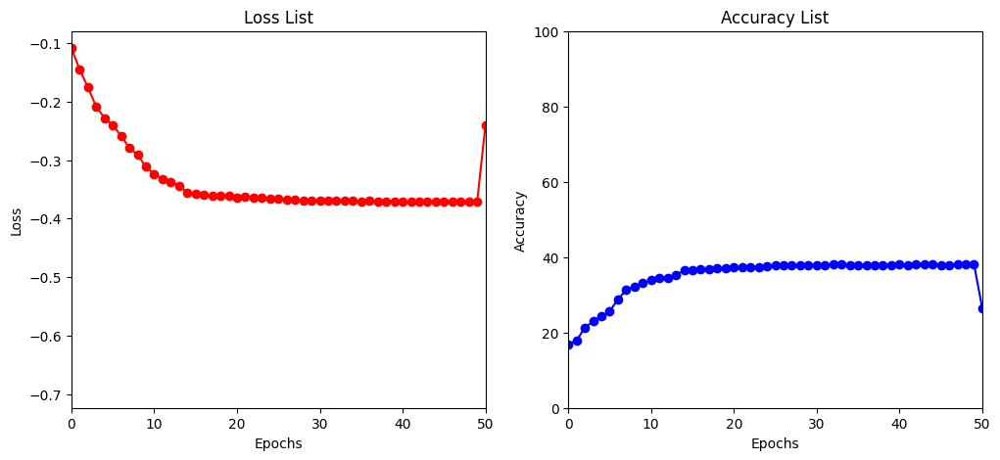

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.856026
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.934030
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.936749
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.899759
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.933704
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.889409
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.911893
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.946032

Test set: Average loss: -0.5719, Accuracy: 5770/10000 (58%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.895295
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.863880
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.964905
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.948785
Train Epoch: 12 [25600/50000 (51%)]	Loss: 1.979741
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.871573
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.859261
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.874390

Test set: Average loss: -0.5911, Accuracy: 5950/10000 (60%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.836605
Train Epoch: 13 [6400/5000

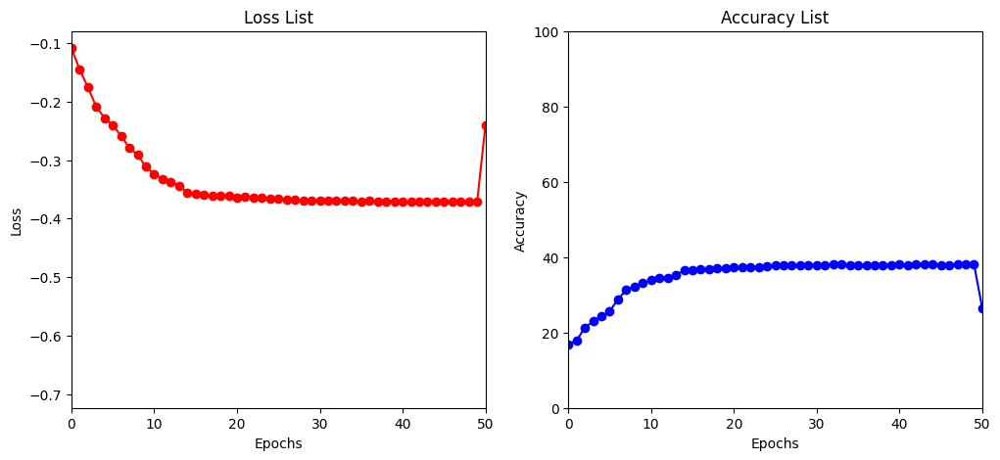

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.898822
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.846209
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.804395
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.814897
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.839635
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.881762
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.850301
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.846577

Test set: Average loss: -0.6528, Accuracy: 6575/10000 (66%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.822053
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.811694
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.861217
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.899064
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.809319
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.827756
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.856745
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.823853

Test set: Average loss: -0.6573, Accuracy: 6641/10000 (66%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.806497
Train Epoch: 18 [6400/5000

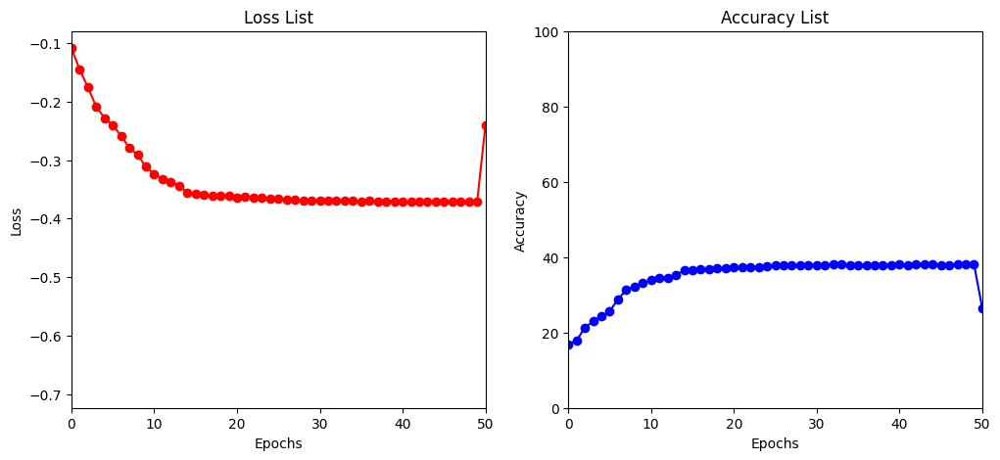

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.825517
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.748547
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.774897
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.839271
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.827953
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.822338
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.783926
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.795470

Test set: Average loss: -0.6719, Accuracy: 6754/10000 (68%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.828937
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.732881
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.751354
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.878072
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.820308
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.750571
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.833969
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.815016

Test set: Average loss: -0.6725, Accuracy: 6758/10000 (68%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.846114
Train Epoch: 23 [6400/5000

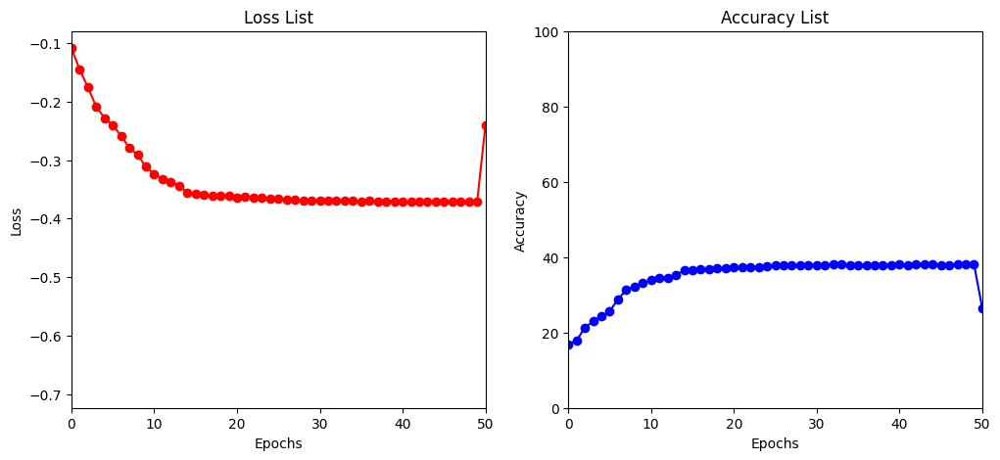

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.806156
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.818766
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.832327
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.872535
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.787108
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.830660
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.817525
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.796800

Test set: Average loss: -0.6814, Accuracy: 6863/10000 (69%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.866307
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.736274
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.763996
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.733888
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.782437
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.817546
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.759501
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.824163

Test set: Average loss: -0.6828, Accuracy: 6885/10000 (69%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.820121
Train Epoch: 28 [6400/5000

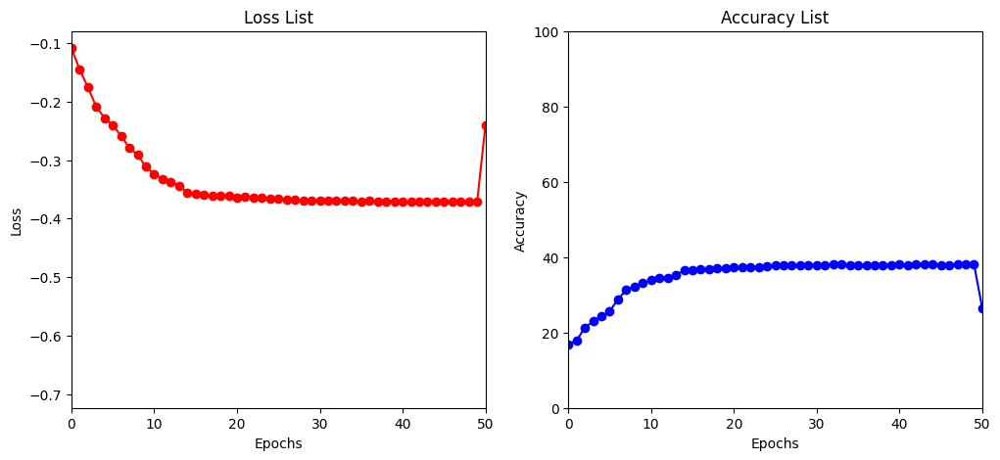

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.811027
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.782987
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.817594
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.771604
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.825627
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.843476
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.787739
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.823234

Test set: Average loss: -0.6900, Accuracy: 6957/10000 (70%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.784663
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.789512
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.758047
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.714141
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.733197
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.759504
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.826435
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.774385

Test set: Average loss: -0.6902, Accuracy: 6958/10000 (70%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.834111
Train Epoch: 33 [6400/5000

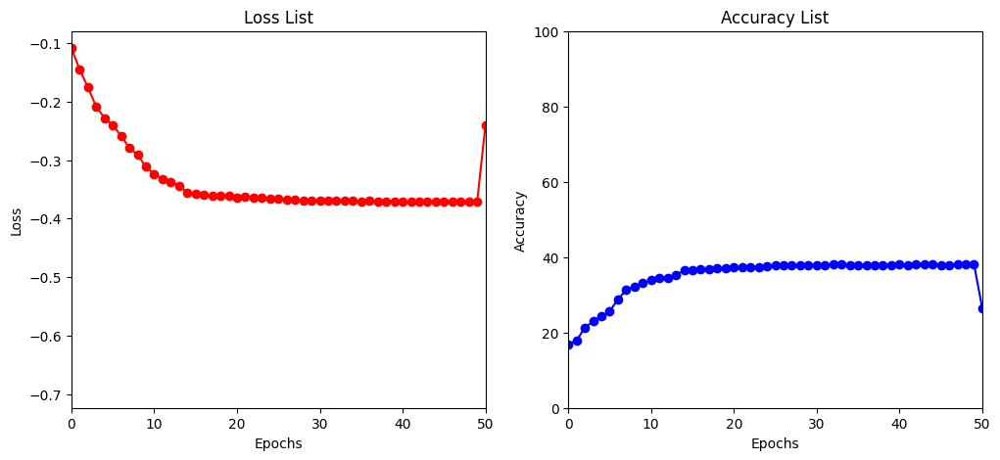

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.759218
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.767524
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.772083
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.784168
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.787897
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.799317
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.803461
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.816559

Test set: Average loss: -0.6929, Accuracy: 6975/10000 (70%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.829675
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.797467
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.726726
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.755277
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.809233
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.778303
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.739095
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.749746

Test set: Average loss: -0.6932, Accuracy: 6984/10000 (70%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.748290
Train Epoch: 38 [6400/5000

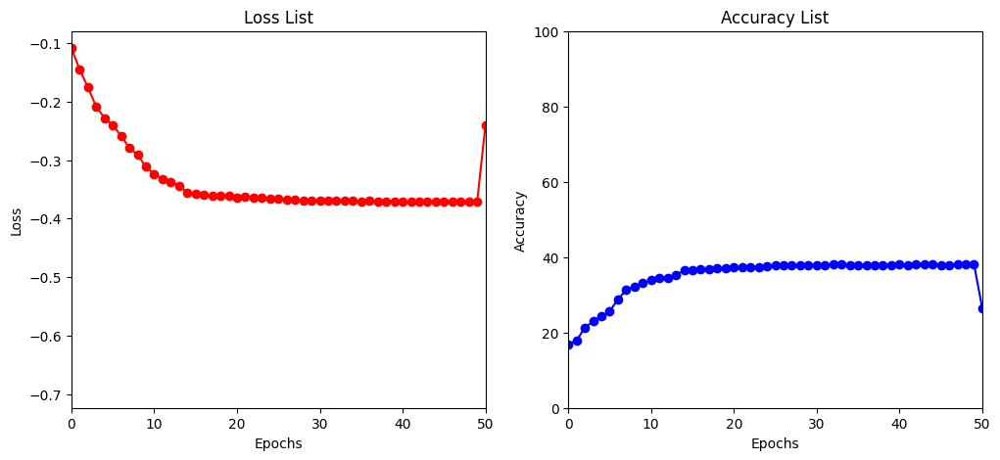

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.780842
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.790736
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.760608
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.751837
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.831115
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.793668
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.827708
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.744347

Test set: Average loss: -0.6935, Accuracy: 6983/10000 (70%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.766564
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.799400
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.745566
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.780136
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.793865
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.742703
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.759309
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.769258

Test set: Average loss: -0.6938, Accuracy: 6998/10000 (70%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.785548
Train Epoch: 43 [6400/5000

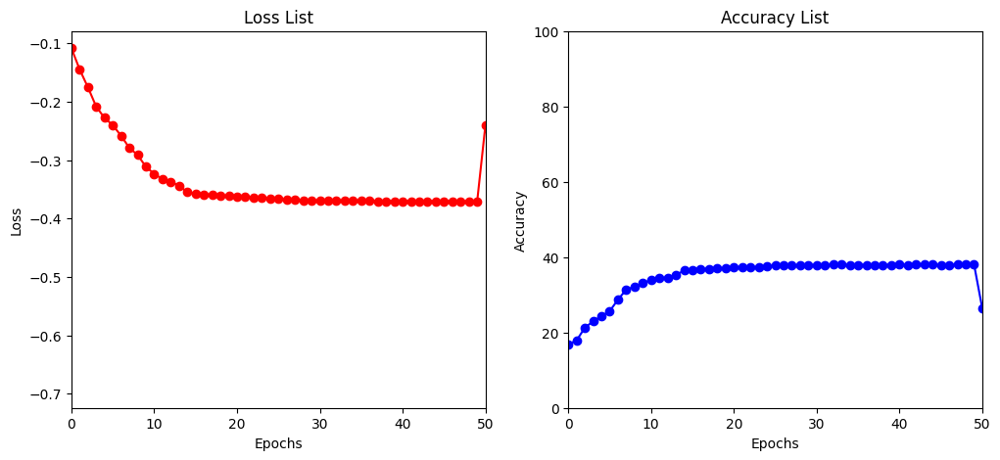

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.810404
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.811322
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.765200
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.751319
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.781622
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.793540
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.743298
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.738071

Test set: Average loss: -0.6945, Accuracy: 6991/10000 (70%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.695870
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.755259
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.786606
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.841932
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.760209
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.756981
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.701937
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.733788

Test set: Average loss: -0.6938, Accuracy: 6982/10000 (70%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.749238
Train Epoch: 48 [6400/5000

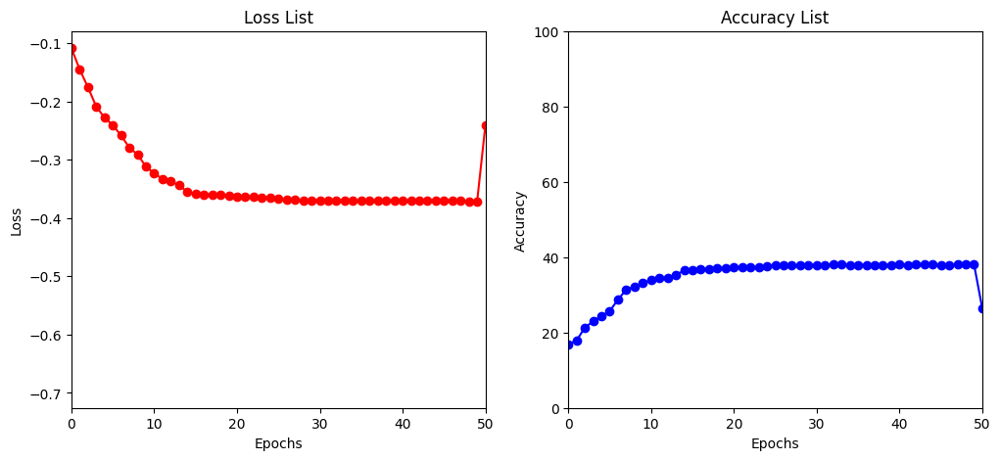

[I 2023-04-15 05:42:34,653] Trial 22 finished with value: -0.6952951594352722 and parameters: {'lr': 0.0002714620429950083, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 22 with value: -0.6952951594352722.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.231030
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.218109
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.167854
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.217720
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.198144
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.191117
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.205720

Test set: Average loss: -0.3326, Accuracy: 3386/10000 (34%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.091094
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.169143
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.150310
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.121435
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.102230
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.086558
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.114484
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.073392

Test set: Average loss: -0.4041, Accuracy: 4140/10000 (41%)

Train Epoch:

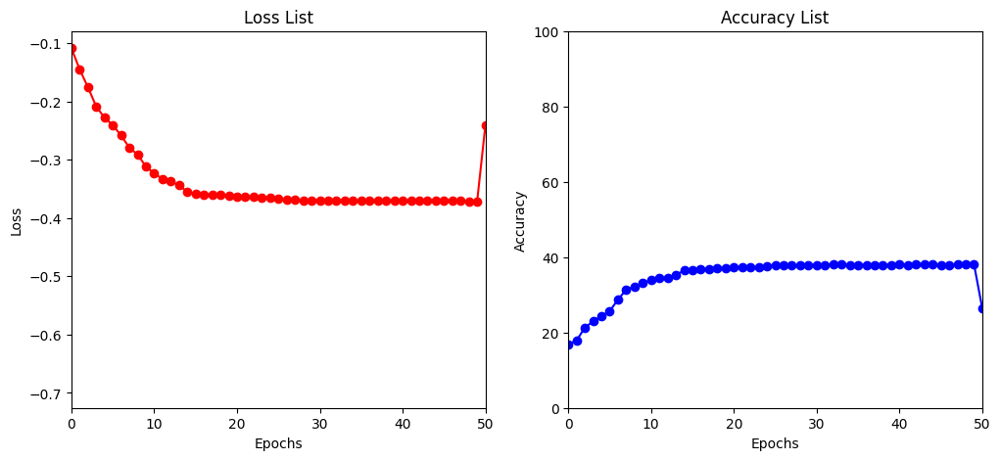

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.936316
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.010514
Train Epoch: 6 [12800/50000 (26%)]	Loss: 1.939782
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.964083
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.038655
Train Epoch: 6 [32000/50000 (64%)]	Loss: 1.993937
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.044098
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.945122

Test set: Average loss: -0.4804, Accuracy: 4827/10000 (48%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.058832
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.965662
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.006254
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.044942
Train Epoch: 7 [25600/50000 (51%)]	Loss: 1.955573
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.948528
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.013749
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.917060

Test set: Average loss: -0.4819, Accuracy: 4839/10000 (48%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.955366
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.0

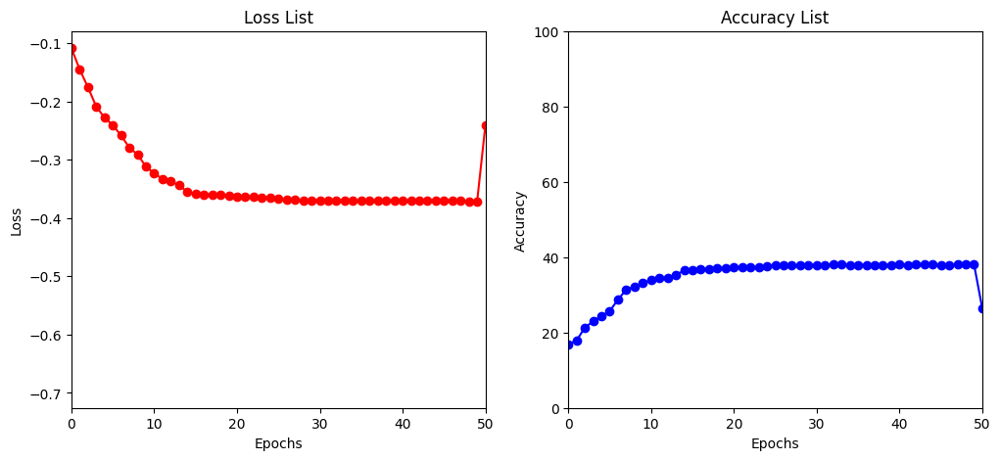

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.865163
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.955716
Train Epoch: 11 [12800/50000 (26%)]	Loss: 1.956058
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.926391
Train Epoch: 11 [25600/50000 (51%)]	Loss: 1.939297
Train Epoch: 11 [32000/50000 (64%)]	Loss: 1.910676
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.881169
Train Epoch: 11 [44800/50000 (90%)]	Loss: 1.908610

Test set: Average loss: -0.5542, Accuracy: 5583/10000 (56%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.899310
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.942106
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.955088
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.907441
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.003257
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.849056
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.861705
Train Epoch: 12 [44800/50000 (90%)]	Loss: 1.915138

Test set: Average loss: -0.5646, Accuracy: 5709/10000 (57%)

Train Epoch: 13 [0/50000 (0%)]	Loss: 1.913870
Train Epoch: 13 [6400/5000

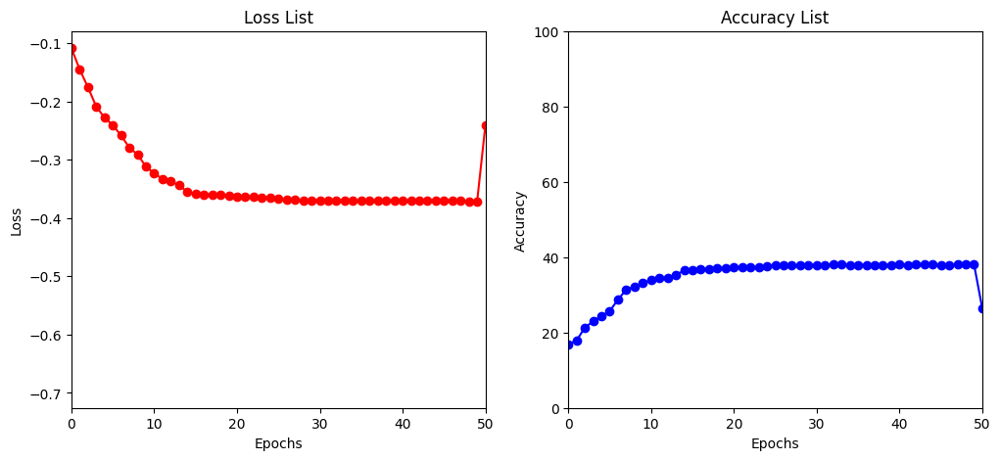

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.962803
Train Epoch: 16 [6400/50000 (13%)]	Loss: 1.868334
Train Epoch: 16 [12800/50000 (26%)]	Loss: 1.851969
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.813394
Train Epoch: 16 [25600/50000 (51%)]	Loss: 1.837162
Train Epoch: 16 [32000/50000 (64%)]	Loss: 1.849428
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.865950
Train Epoch: 16 [44800/50000 (90%)]	Loss: 1.844478

Test set: Average loss: -0.6329, Accuracy: 6368/10000 (64%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.846724
Train Epoch: 17 [6400/50000 (13%)]	Loss: 1.804049
Train Epoch: 17 [12800/50000 (26%)]	Loss: 1.883654
Train Epoch: 17 [19200/50000 (38%)]	Loss: 1.903078
Train Epoch: 17 [25600/50000 (51%)]	Loss: 1.808878
Train Epoch: 17 [32000/50000 (64%)]	Loss: 1.867345
Train Epoch: 17 [38400/50000 (77%)]	Loss: 1.872018
Train Epoch: 17 [44800/50000 (90%)]	Loss: 1.810539

Test set: Average loss: -0.6379, Accuracy: 6407/10000 (64%)

Train Epoch: 18 [0/50000 (0%)]	Loss: 1.855782
Train Epoch: 18 [6400/5000

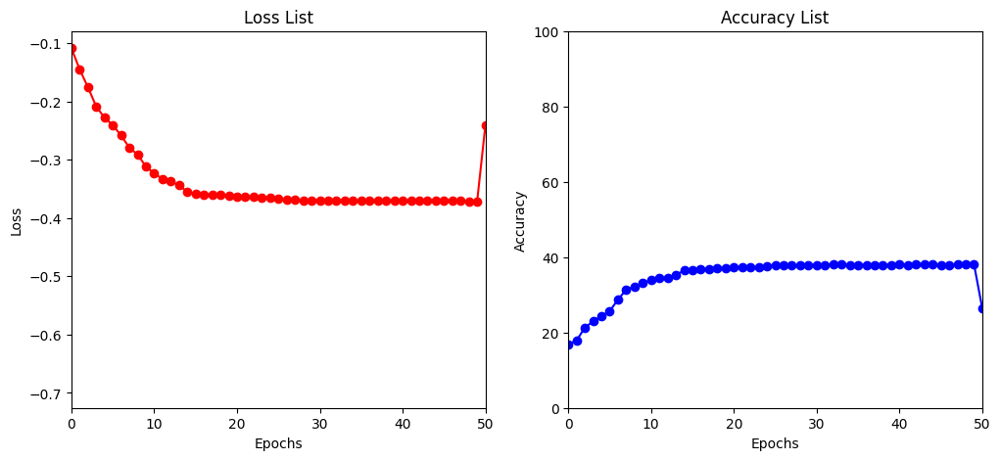

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.838783
Train Epoch: 21 [6400/50000 (13%)]	Loss: 1.775240
Train Epoch: 21 [12800/50000 (26%)]	Loss: 1.785862
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.818953
Train Epoch: 21 [25600/50000 (51%)]	Loss: 1.855819
Train Epoch: 21 [32000/50000 (64%)]	Loss: 1.795638
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.779311
Train Epoch: 21 [44800/50000 (90%)]	Loss: 1.803688

Test set: Average loss: -0.6477, Accuracy: 6518/10000 (65%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.855104
Train Epoch: 22 [6400/50000 (13%)]	Loss: 1.801667
Train Epoch: 22 [12800/50000 (26%)]	Loss: 1.798746
Train Epoch: 22 [19200/50000 (38%)]	Loss: 1.892270
Train Epoch: 22 [25600/50000 (51%)]	Loss: 1.783085
Train Epoch: 22 [32000/50000 (64%)]	Loss: 1.755756
Train Epoch: 22 [38400/50000 (77%)]	Loss: 1.831257
Train Epoch: 22 [44800/50000 (90%)]	Loss: 1.827421

Test set: Average loss: -0.6494, Accuracy: 6520/10000 (65%)

Train Epoch: 23 [0/50000 (0%)]	Loss: 1.839049
Train Epoch: 23 [6400/5000

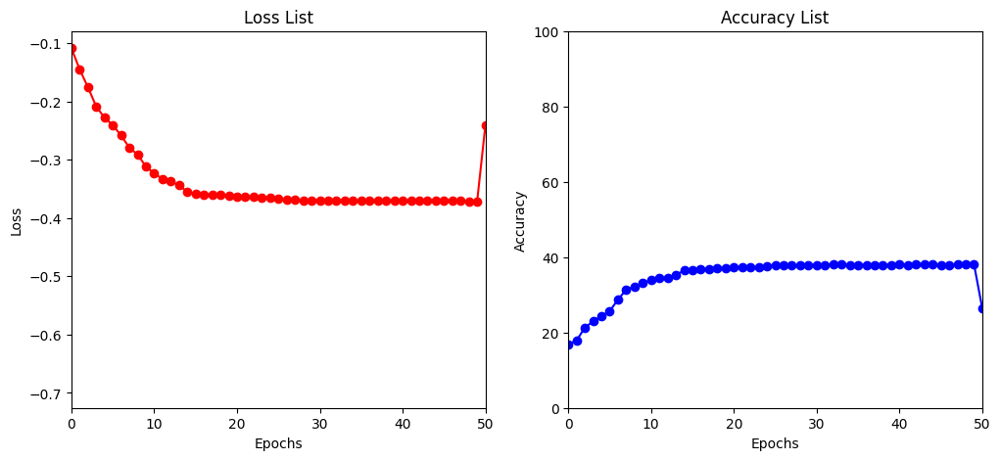

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.768405
Train Epoch: 26 [6400/50000 (13%)]	Loss: 1.848895
Train Epoch: 26 [12800/50000 (26%)]	Loss: 1.830896
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.871513
Train Epoch: 26 [25600/50000 (51%)]	Loss: 1.811214
Train Epoch: 26 [32000/50000 (64%)]	Loss: 1.856465
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.781754
Train Epoch: 26 [44800/50000 (90%)]	Loss: 1.832719

Test set: Average loss: -0.6589, Accuracy: 6631/10000 (66%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.881828
Train Epoch: 27 [6400/50000 (13%)]	Loss: 1.769063
Train Epoch: 27 [12800/50000 (26%)]	Loss: 1.862884
Train Epoch: 27 [19200/50000 (38%)]	Loss: 1.783485
Train Epoch: 27 [25600/50000 (51%)]	Loss: 1.819995
Train Epoch: 27 [32000/50000 (64%)]	Loss: 1.840228
Train Epoch: 27 [38400/50000 (77%)]	Loss: 1.807398
Train Epoch: 27 [44800/50000 (90%)]	Loss: 1.852141

Test set: Average loss: -0.6602, Accuracy: 6642/10000 (66%)

Train Epoch: 28 [0/50000 (0%)]	Loss: 1.774219
Train Epoch: 28 [6400/5000

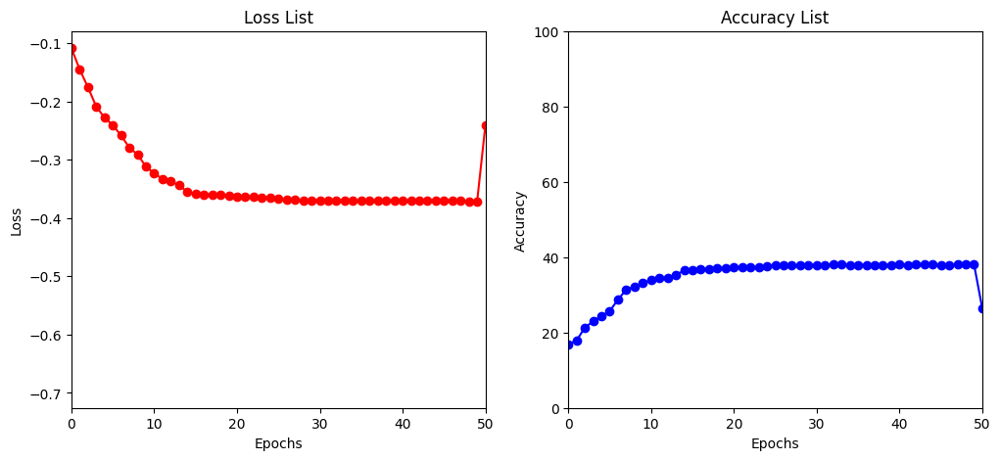

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.791609
Train Epoch: 31 [6400/50000 (13%)]	Loss: 1.787343
Train Epoch: 31 [12800/50000 (26%)]	Loss: 1.824573
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.819062
Train Epoch: 31 [25600/50000 (51%)]	Loss: 1.791099
Train Epoch: 31 [32000/50000 (64%)]	Loss: 1.858531
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.775712
Train Epoch: 31 [44800/50000 (90%)]	Loss: 1.838635

Test set: Average loss: -0.6705, Accuracy: 6741/10000 (67%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.809336
Train Epoch: 32 [6400/50000 (13%)]	Loss: 1.872041
Train Epoch: 32 [12800/50000 (26%)]	Loss: 1.773696
Train Epoch: 32 [19200/50000 (38%)]	Loss: 1.754407
Train Epoch: 32 [25600/50000 (51%)]	Loss: 1.776086
Train Epoch: 32 [32000/50000 (64%)]	Loss: 1.783364
Train Epoch: 32 [38400/50000 (77%)]	Loss: 1.849179
Train Epoch: 32 [44800/50000 (90%)]	Loss: 1.778184

Test set: Average loss: -0.6704, Accuracy: 6748/10000 (67%)

Train Epoch: 33 [0/50000 (0%)]	Loss: 1.782327
Train Epoch: 33 [6400/5000

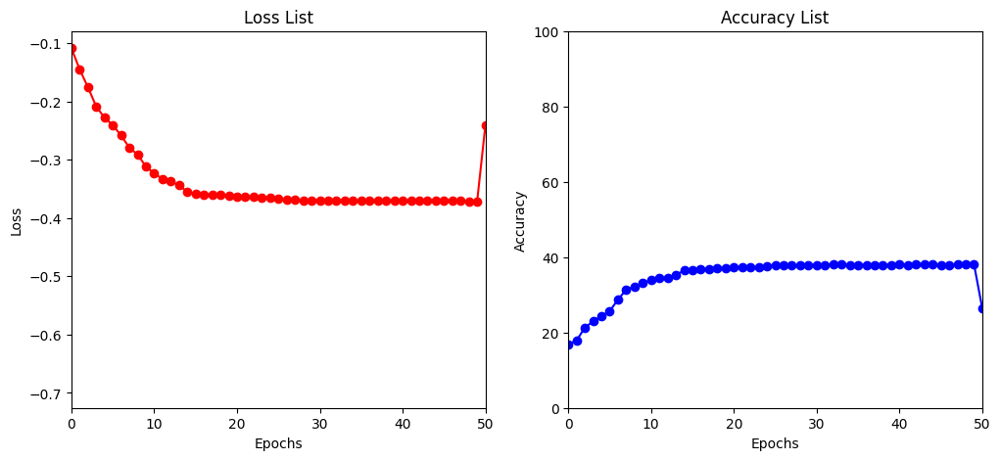

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.801654
Train Epoch: 36 [6400/50000 (13%)]	Loss: 1.796664
Train Epoch: 36 [12800/50000 (26%)]	Loss: 1.781408
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.793879
Train Epoch: 36 [25600/50000 (51%)]	Loss: 1.865070
Train Epoch: 36 [32000/50000 (64%)]	Loss: 1.795030
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.869401
Train Epoch: 36 [44800/50000 (90%)]	Loss: 1.862149

Test set: Average loss: -0.6722, Accuracy: 6760/10000 (68%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.833985
Train Epoch: 37 [6400/50000 (13%)]	Loss: 1.801671
Train Epoch: 37 [12800/50000 (26%)]	Loss: 1.755614
Train Epoch: 37 [19200/50000 (38%)]	Loss: 1.782307
Train Epoch: 37 [25600/50000 (51%)]	Loss: 1.826177
Train Epoch: 37 [32000/50000 (64%)]	Loss: 1.764320
Train Epoch: 37 [38400/50000 (77%)]	Loss: 1.802068
Train Epoch: 37 [44800/50000 (90%)]	Loss: 1.765182

Test set: Average loss: -0.6719, Accuracy: 6756/10000 (68%)

Train Epoch: 38 [0/50000 (0%)]	Loss: 1.780465
Train Epoch: 38 [6400/5000

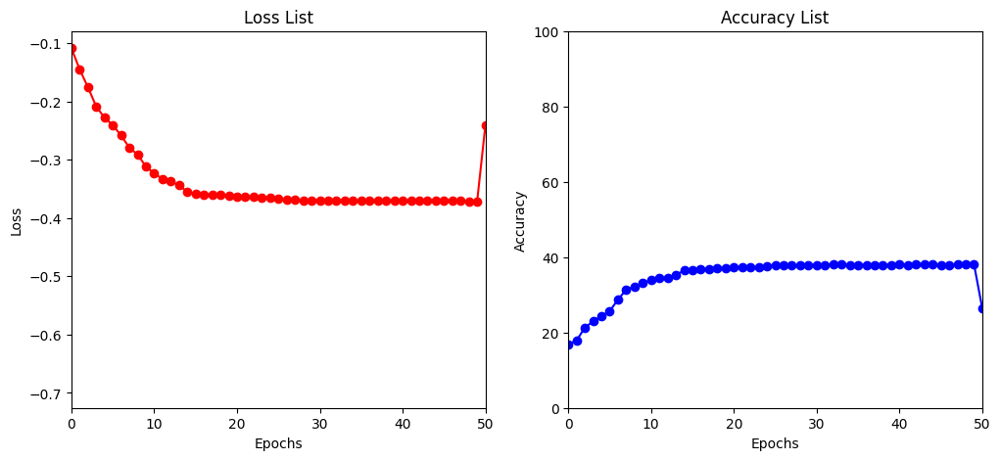

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.807351
Train Epoch: 41 [6400/50000 (13%)]	Loss: 1.830145
Train Epoch: 41 [12800/50000 (26%)]	Loss: 1.794614
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.750001
Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.822555
Train Epoch: 41 [32000/50000 (64%)]	Loss: 1.819907
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.812120
Train Epoch: 41 [44800/50000 (90%)]	Loss: 1.786435

Test set: Average loss: -0.6735, Accuracy: 6778/10000 (68%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.848065
Train Epoch: 42 [6400/50000 (13%)]	Loss: 1.861377
Train Epoch: 42 [12800/50000 (26%)]	Loss: 1.750087
Train Epoch: 42 [19200/50000 (38%)]	Loss: 1.768934
Train Epoch: 42 [25600/50000 (51%)]	Loss: 1.750235
Train Epoch: 42 [32000/50000 (64%)]	Loss: 1.757029
Train Epoch: 42 [38400/50000 (77%)]	Loss: 1.811809
Train Epoch: 42 [44800/50000 (90%)]	Loss: 1.774335

Test set: Average loss: -0.6732, Accuracy: 6766/10000 (68%)

Train Epoch: 43 [0/50000 (0%)]	Loss: 1.814096
Train Epoch: 43 [6400/5000

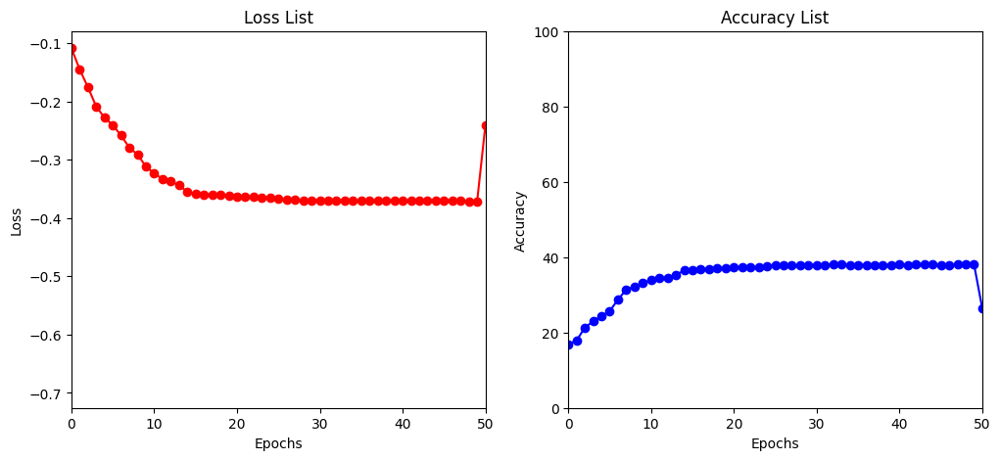

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.802976
Train Epoch: 46 [6400/50000 (13%)]	Loss: 1.825264
Train Epoch: 46 [12800/50000 (26%)]	Loss: 1.821777
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.759600
Train Epoch: 46 [25600/50000 (51%)]	Loss: 1.799943
Train Epoch: 46 [32000/50000 (64%)]	Loss: 1.827782
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.764166
Train Epoch: 46 [44800/50000 (90%)]	Loss: 1.774652

Test set: Average loss: -0.6752, Accuracy: 6781/10000 (68%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.756343
Train Epoch: 47 [6400/50000 (13%)]	Loss: 1.780500
Train Epoch: 47 [12800/50000 (26%)]	Loss: 1.775568
Train Epoch: 47 [19200/50000 (38%)]	Loss: 1.859236
Train Epoch: 47 [25600/50000 (51%)]	Loss: 1.712973
Train Epoch: 47 [32000/50000 (64%)]	Loss: 1.769740
Train Epoch: 47 [38400/50000 (77%)]	Loss: 1.701326
Train Epoch: 47 [44800/50000 (90%)]	Loss: 1.768420

Test set: Average loss: -0.6760, Accuracy: 6789/10000 (68%)

Train Epoch: 48 [0/50000 (0%)]	Loss: 1.799148
Train Epoch: 48 [6400/5000

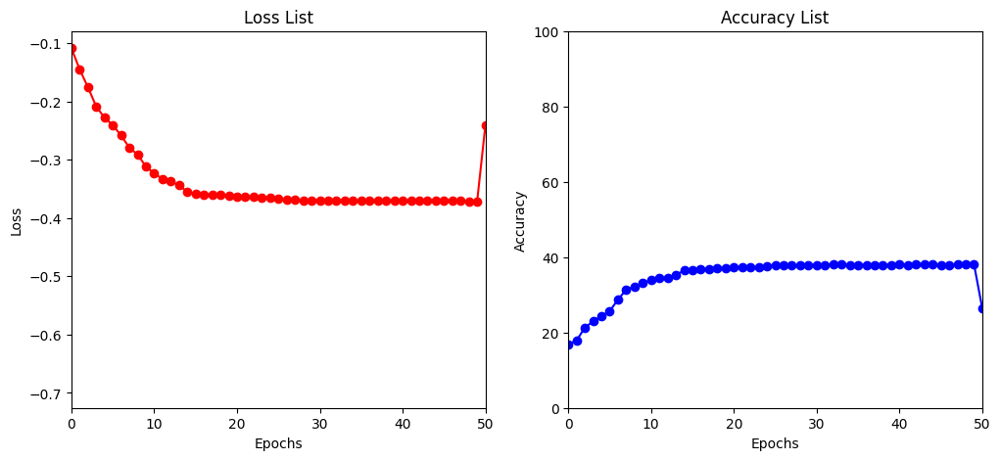

[I 2023-04-15 06:04:31,651] Trial 23 finished with value: -0.6755199178695679 and parameters: {'lr': 0.0003132435876066104, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 22 with value: -0.6952951594352722.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.302523
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.235852
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.227145
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.177904
Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.190592
Train Epoch: 1 [32000/50000 (64%)]	Loss: 2.186638
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.174267
Train Epoch: 1 [44800/50000 (90%)]	Loss: 2.179534

Test set: Average loss: -0.3409, Accuracy: 3498/10000 (35%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.100598
Train Epoch: 2 [6400/50000 (13%)]	Loss: 2.193083
Train Epoch: 2 [12800/50000 (26%)]	Loss: 2.195926
Train Epoch: 2 [19200/50000 (38%)]	Loss: 2.108466
Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.160895
Train Epoch: 2 [32000/50000 (64%)]	Loss: 2.056351
Train Epoch: 2 [38400/50000 (77%)]	Loss: 2.115551
Train Epoch: 2 [44800/50000 (90%)]	Loss: 2.084916

Test set: Average loss: -0.3543, Accuracy: 3578/10000 (36%)

Train Epoch:

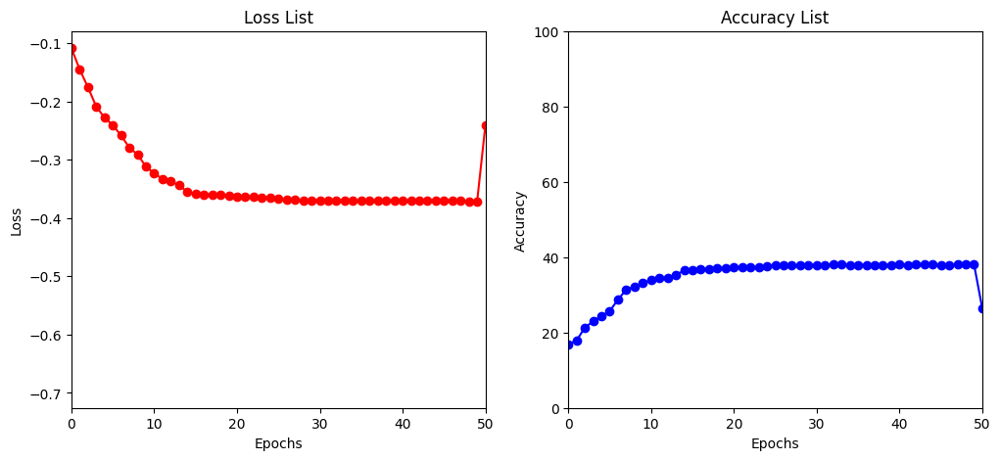

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.980821
Train Epoch: 6 [6400/50000 (13%)]	Loss: 2.067447
Train Epoch: 6 [12800/50000 (26%)]	Loss: 2.040003
Train Epoch: 6 [19200/50000 (38%)]	Loss: 2.022190
Train Epoch: 6 [25600/50000 (51%)]	Loss: 2.062714
Train Epoch: 6 [32000/50000 (64%)]	Loss: 2.118640
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.068441
Train Epoch: 6 [44800/50000 (90%)]	Loss: 1.991328

Test set: Average loss: -0.4296, Accuracy: 4338/10000 (43%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.048152
Train Epoch: 7 [6400/50000 (13%)]	Loss: 2.066763
Train Epoch: 7 [12800/50000 (26%)]	Loss: 2.068701
Train Epoch: 7 [19200/50000 (38%)]	Loss: 2.060324
Train Epoch: 7 [25600/50000 (51%)]	Loss: 2.020040
Train Epoch: 7 [32000/50000 (64%)]	Loss: 1.981412
Train Epoch: 7 [38400/50000 (77%)]	Loss: 2.031790
Train Epoch: 7 [44800/50000 (90%)]	Loss: 1.989125

Test set: Average loss: -0.4352, Accuracy: 4391/10000 (44%)

Train Epoch: 8 [0/50000 (0%)]	Loss: 1.961918
Train Epoch: 8 [6400/50000 (13%)]	Loss: 2.0

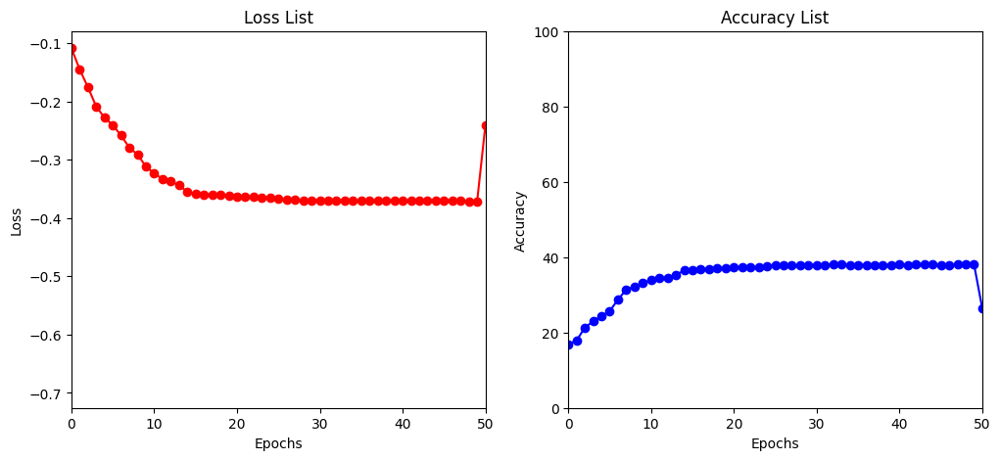

Train Epoch: 11 [0/50000 (0%)]	Loss: 2.032912
Train Epoch: 11 [6400/50000 (13%)]	Loss: 2.050450
Train Epoch: 11 [12800/50000 (26%)]	Loss: 2.001712
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.992859
Train Epoch: 11 [25600/50000 (51%)]	Loss: 2.002680
Train Epoch: 11 [32000/50000 (64%)]	Loss: 2.016517
Train Epoch: 11 [38400/50000 (77%)]	Loss: 2.019812
Train Epoch: 11 [44800/50000 (90%)]	Loss: 2.048336

Test set: Average loss: -0.4641, Accuracy: 4679/10000 (47%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.966959
Train Epoch: 12 [6400/50000 (13%)]	Loss: 1.972050
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.993811
Train Epoch: 12 [19200/50000 (38%)]	Loss: 1.961726
Train Epoch: 12 [25600/50000 (51%)]	Loss: 2.026843
Train Epoch: 12 [32000/50000 (64%)]	Loss: 1.915984
Train Epoch: 12 [38400/50000 (77%)]	Loss: 1.987561


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
loss_list = []
accuracy_list = []


import optuna
def objective(trial):

    # Define Hyperparameters for Testing
    lr = trial.suggest_loguniform("lr", 1e-5, 1e-3)
    batch_size = trial.suggest_categorical("batch_size", [128, 256, 518])
    gamma = trial.suggest_categorical("gamma", [0.08, 0.1, 0.12])
    droprate = trial.suggest_categorical("droprate", [0.4, 0.5, 0.6])

    # Define the class for FinalNet
    class FinalNet(nn.Module):
        def __init__(self):
            super(FinalNet, self).__init__() 

            self.feature_extractor = nn.Sequential(  
                # Conv1        
                nn.Conv2d(in_channels=3, out_channels=8, kernel_size=11, stride=1, padding=5),
                nn.BatchNorm2d(8),
                nn.ReLU(),
                # Conv2          
                nn.Conv2d(in_channels=8, out_channels=16, kernel_size=7, stride=1, padding=3),
                nn.BatchNorm2d(16),
                nn.ReLU(),
                # Conv3        
                nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=2),
                nn.BatchNorm2d(16),
                nn.ReLU(),
                # Conv4       
                nn.Conv2d(in_channels=16, out_channels=32, kernel_size=5, stride=1, padding=2),
                nn.BatchNorm2d(32),
                nn.ReLU(),
                # Conv5      
                nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=0),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                # Max Pooling 1
                nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
                # Conv6
                nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, stride=1, padding=0),
                nn.BatchNorm2d(128),
                nn.ReLU(),
                # Max Pooling 2
                nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
                # Conv7
                nn.Conv2d(in_channels=128, out_channels=160, kernel_size=5, stride=1, padding=0),
                nn.ReLU(),
            )

            self.classifier = nn.Sequential(
                # FC Layer1
                nn.Linear(in_features=160, out_features=160),
                nn.ReLU(),
                nn.Dropout(droprate),
                # FC Layer2
                nn.Linear(in_features=160, out_features=64),
                nn.ReLU(),
                nn.Dropout(droprate),
                # FC Layer3
                nn.Linear(in_features=64, out_features=10),
            )

        def forward(self, x):
            x = self.feature_extractor(x)
            x = torch.flatten(x, 1)
            
            # Pass Data to FC Layer
            logits = self.classifier(x)
            
            # SoftMax Ouput
            out = F.softmax(logits, dim=1)
            return out


    # Define Not Tested Hyperparameters
    epochs = 50
    weight_decay = 5e-4

    # Training Settings
    no_cuda = False
    use_cuda = not no_cuda and torch.cuda.is_available()
    torch.manual_seed(100)
    device = torch.device("cuda" if use_cuda else "cpu")

    # Create Training and Testing Set Loaders
    trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
    train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
    testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
    test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False)

    # Define FinalNet Model
    model = FinalNet().to(device)

    # Initialize the Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    # Define a Learning Rate Scheduler
    scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15, 30], gamma=gamma)

    # Cycle Through Testing and Training for each Epoch
    for epoch in range(1, epochs + 1):
        train(model, device, train_loader, optimizer, epoch)
        test_loss, correct = test(model, device, test_loader)
        scheduler.step()

    return test_loss

def train(model, device, train_loader, optimizer, epoch):
    # Set the Model into Training Mode 
    model.train() 
    count = 0
    
    # Define Loss Function 
    loss_Fn=nn.CrossEntropyLoss()

    # For Each Batch
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        
        # Make Prediction
        Predict=model(data)
        
        # Calculate Loss
        loss=loss_Fn(Predict,target)
        
        # Optimize Parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 50 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


def test( model, device, test_loader):
    # Set the Model into Evaluation Mode 
    model.eval()
    test_loss = 0
    correct = 0

    # Calcuate Accuracy and Loss for Test Set Predictions
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            # Sum Up Batch Loss
            test_loss += F.nll_loss(output, target, reduction='sum').item()
            # Get the Index of the Max Log-Probability
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    # Print Accuracy and Loss for Epoch
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    # Record Accuracy and Loss for Epoch
    loss_list.append(test_loss)
    accuracy_list.append(100. * correct / len(test_loader.dataset))

    if (len(loss_list) % 5 == 0): 
      # Create Figure
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

      # Plot Loss
      ax1.plot(loss_list, 'r-o')
      ax1.set_title('Loss List')
      ax1.set_xlabel('Epochs')
      ax1.set_ylabel('Loss')
      ax1.set_xlim([0, 50])

      # Plot Accuracy
      ax2.plot(accuracy_list, 'b-o')
      ax2.set_title('Accuracy List')
      ax2.set_xlabel('Epochs')
      ax2.set_ylabel('Accuracy')
      ax2.set_xlim([0, 50])
      ax2.set_ylim([0, 100])

      # Display Plots
      plt.show()


    return test_loss, correct


# Start the Optimization Process
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=100)

# Print the Best Trial and Its Hyperparameters
print('-' * 100)
print("Best trial:")
trial = study.best_trial
print('-' * 100)

print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Note: For the output of this section the graphs do not reset meaning that the graphs are not correct. But Trial 22 (best trial) is ran below and has a correct graph.

##Trial 22
Before the program crashed, the best trial, Trial 22, finished with an accuracy of 70% with the following hyperparameter values: 

Best hyperparameters : [I 2023-04-15 05:42:34,653] Trial 22 finished with value: -0.6952951594352722 and parameters: {'lr': 0.0002714620429950083, 'batch_size': 128, 'gamma': 0.12, 'droprate': 0.4}. Best is trial 22 with value: -0.6952951594352722.


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.301196
Train Epoch: 1 [3840/50000 (8%)]	Loss: 2.224563
Train Epoch: 1 [7680/50000 (15%)]	Loss: 2.233512
Train Epoch: 1 [11520/50000 (23%)]	Loss: 2.232774
Train Epoch: 1 [15360/50000 (31%)]	Loss: 2.226675
Train Epoch: 1 [19200/50000 (38%)]	Loss: 2.103394
Train Epoch: 1 [23040/50000 (46%)]	Loss: 2.162167
Train Epoch: 1 [26880/50000 (54%)]	Loss: 2.160561
Train Epoch: 1 [30720/50000 (61%)]	Loss: 2.128845
Train Epoch: 1 [34560/50000 (69%)]	Loss: 2.122725
Train Epoch: 1 [38400/50000 (77%)]	Loss: 2.182791
Train Epoch: 1 [42240/50000 (84%)]	Loss: 2.109104
Train Epoch: 1 [46080/50000 (92%)]	Loss: 2.037649
Train Epoch: 1 [31200/50000 (100%)]	Loss: 2.081656

Test set: Average loss: -0.3933, Accuracy: 4058/10000 (41%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 2.168986
Train Epoch: 2 [3840/50000 (8%)]	Loss: 2.041403
Train Epoch: 2 [7680/50000 (15%)]	Loss: 2.108466
Train Epoch: 2 [11520/50000

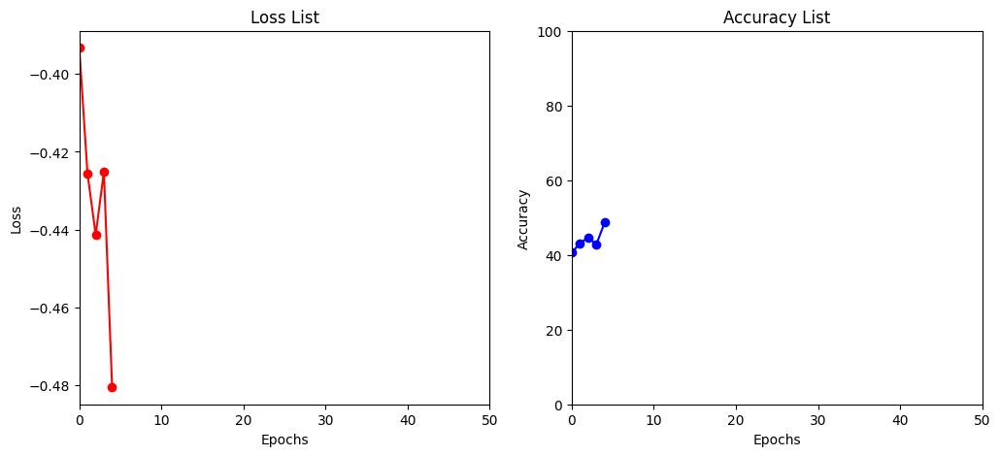

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.949523
Train Epoch: 6 [3840/50000 (8%)]	Loss: 2.034766
Train Epoch: 6 [7680/50000 (15%)]	Loss: 1.969905
Train Epoch: 6 [11520/50000 (23%)]	Loss: 1.952620
Train Epoch: 6 [15360/50000 (31%)]	Loss: 1.987858
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.985231
Train Epoch: 6 [23040/50000 (46%)]	Loss: 1.963136
Train Epoch: 6 [26880/50000 (54%)]	Loss: 1.941019
Train Epoch: 6 [30720/50000 (61%)]	Loss: 1.975693
Train Epoch: 6 [34560/50000 (69%)]	Loss: 2.039554
Train Epoch: 6 [38400/50000 (77%)]	Loss: 2.041526
Train Epoch: 6 [42240/50000 (84%)]	Loss: 2.077879
Train Epoch: 6 [46080/50000 (92%)]	Loss: 2.005048
Train Epoch: 6 [31200/50000 (100%)]	Loss: 1.957408

Test set: Average loss: -0.4870, Accuracy: 4919/10000 (49%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 2.024104
Train Epoch: 7 [3840/50000 (8%)]	Loss: 2.021573
Train Epoch: 7 [7680/50000 (15%)]	Loss: 1.945932
Train Epoch: 7 [11520/50000 (23%)]	Loss: 1.992607
Train Epoch: 7 [15360/50000 (31%)]	Loss: 2.026298
Tra

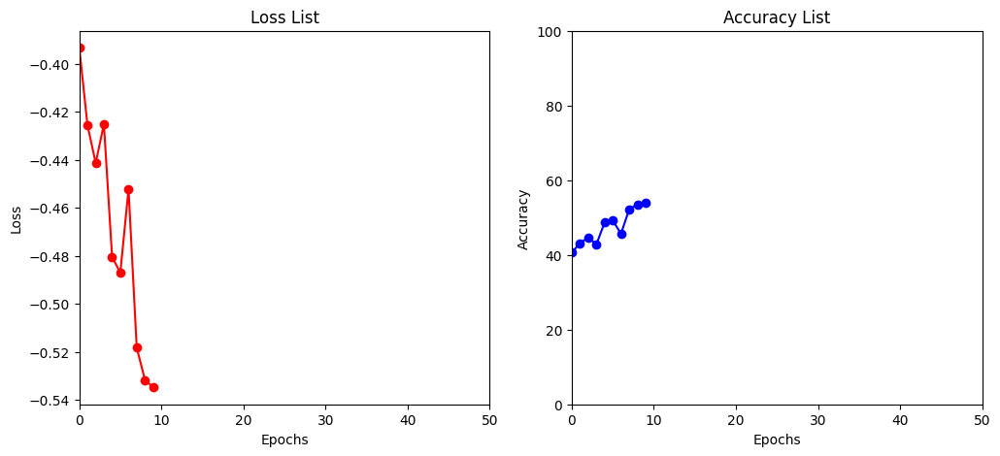

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.949043
Train Epoch: 11 [3840/50000 (8%)]	Loss: 1.875816
Train Epoch: 11 [7680/50000 (15%)]	Loss: 1.910078
Train Epoch: 11 [11520/50000 (23%)]	Loss: 1.867960
Train Epoch: 11 [15360/50000 (31%)]	Loss: 1.881236
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.968176
Train Epoch: 11 [23040/50000 (46%)]	Loss: 1.936019
Train Epoch: 11 [26880/50000 (54%)]	Loss: 1.942866
Train Epoch: 11 [30720/50000 (61%)]	Loss: 1.917029
Train Epoch: 11 [34560/50000 (69%)]	Loss: 1.895841
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.914795
Train Epoch: 11 [42240/50000 (84%)]	Loss: 1.858792
Train Epoch: 11 [46080/50000 (92%)]	Loss: 1.905972
Train Epoch: 11 [31200/50000 (100%)]	Loss: 1.860070

Test set: Average loss: -0.5344, Accuracy: 5382/10000 (54%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.915362
Train Epoch: 12 [3840/50000 (8%)]	Loss: 1.936932
Train Epoch: 12 [7680/50000 (15%)]	Loss: 1.959094
Train Epoch: 12 [11520/50000 (23%)]	Loss: 1.934976
Train Epoch: 12 [15360/50000 (31%)]

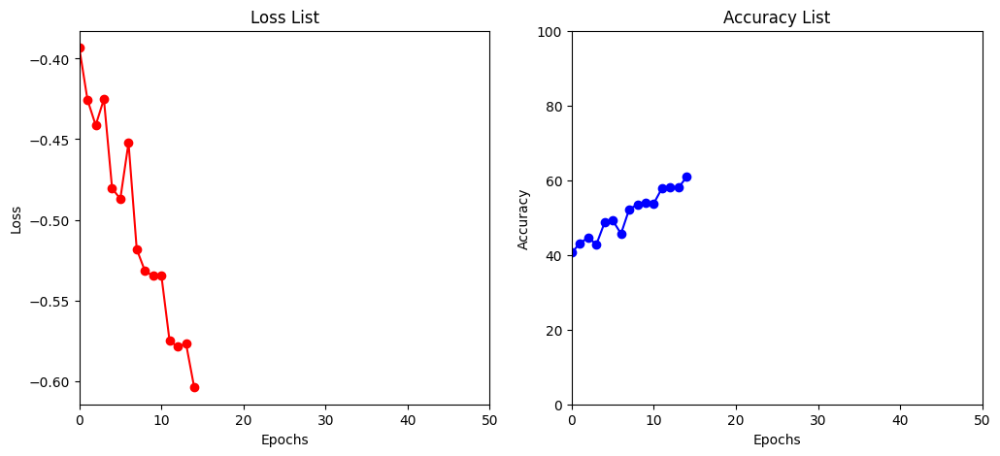

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.816843
Train Epoch: 16 [3840/50000 (8%)]	Loss: 1.792457
Train Epoch: 16 [7680/50000 (15%)]	Loss: 1.934248
Train Epoch: 16 [11520/50000 (23%)]	Loss: 1.827240
Train Epoch: 16 [15360/50000 (31%)]	Loss: 1.848520
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.909197
Train Epoch: 16 [23040/50000 (46%)]	Loss: 1.849323
Train Epoch: 16 [26880/50000 (54%)]	Loss: 1.797197
Train Epoch: 16 [30720/50000 (61%)]	Loss: 1.852197
Train Epoch: 16 [34560/50000 (69%)]	Loss: 1.814053
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.778522
Train Epoch: 16 [42240/50000 (84%)]	Loss: 1.782165
Train Epoch: 16 [46080/50000 (92%)]	Loss: 1.878944
Train Epoch: 16 [31200/50000 (100%)]	Loss: 1.873885

Test set: Average loss: -0.6458, Accuracy: 6479/10000 (65%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.865306
Train Epoch: 17 [3840/50000 (8%)]	Loss: 1.807669
Train Epoch: 17 [7680/50000 (15%)]	Loss: 1.767869
Train Epoch: 17 [11520/50000 (23%)]	Loss: 1.844405
Train Epoch: 17 [15360/50000 (31%)]

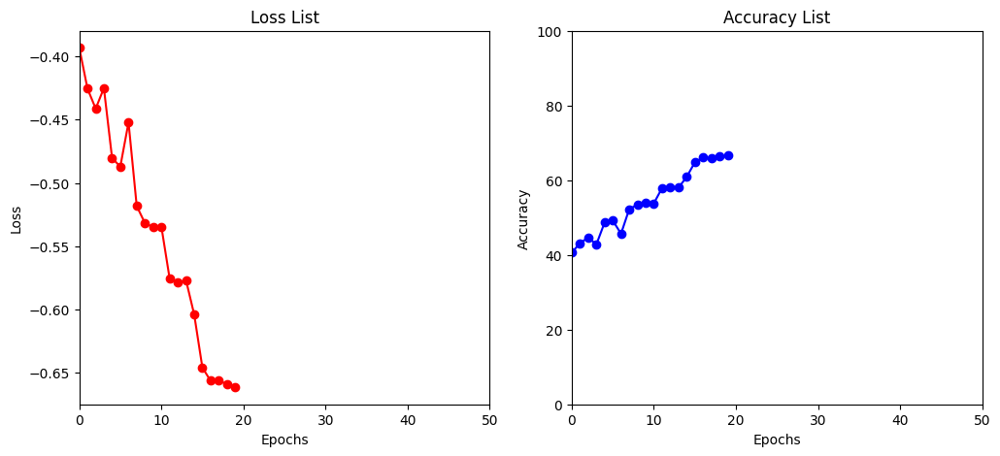

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.766566
Train Epoch: 21 [3840/50000 (8%)]	Loss: 1.842032
Train Epoch: 21 [7680/50000 (15%)]	Loss: 1.792236
Train Epoch: 21 [11520/50000 (23%)]	Loss: 1.882984
Train Epoch: 21 [15360/50000 (31%)]	Loss: 1.831743
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.824761
Train Epoch: 21 [23040/50000 (46%)]	Loss: 1.917609
Train Epoch: 21 [26880/50000 (54%)]	Loss: 1.786675
Train Epoch: 21 [30720/50000 (61%)]	Loss: 1.826031
Train Epoch: 21 [34560/50000 (69%)]	Loss: 1.820586
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.801348
Train Epoch: 21 [42240/50000 (84%)]	Loss: 1.794508
Train Epoch: 21 [46080/50000 (92%)]	Loss: 1.842264
Train Epoch: 21 [31200/50000 (100%)]	Loss: 1.846697

Test set: Average loss: -0.6680, Accuracy: 6712/10000 (67%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.783228
Train Epoch: 22 [3840/50000 (8%)]	Loss: 1.806494
Train Epoch: 22 [7680/50000 (15%)]	Loss: 1.746431
Train Epoch: 22 [11520/50000 (23%)]	Loss: 1.833236
Train Epoch: 22 [15360/50000 (31%)]

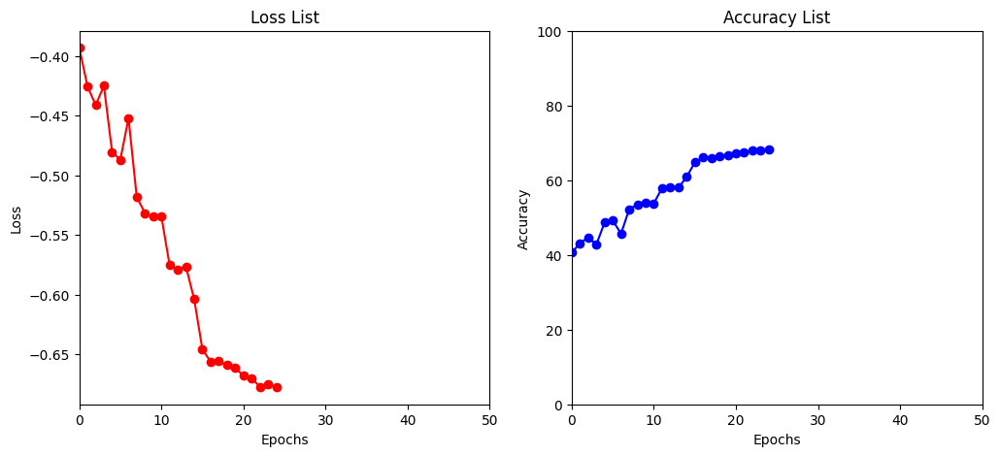

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.850359
Train Epoch: 26 [3840/50000 (8%)]	Loss: 1.768617
Train Epoch: 26 [7680/50000 (15%)]	Loss: 1.755825
Train Epoch: 26 [11520/50000 (23%)]	Loss: 1.794353
Train Epoch: 26 [15360/50000 (31%)]	Loss: 1.807641
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.768303
Train Epoch: 26 [23040/50000 (46%)]	Loss: 1.842415
Train Epoch: 26 [26880/50000 (54%)]	Loss: 1.780155
Train Epoch: 26 [30720/50000 (61%)]	Loss: 1.761241
Train Epoch: 26 [34560/50000 (69%)]	Loss: 1.732154
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.787263
Train Epoch: 26 [42240/50000 (84%)]	Loss: 1.766755
Train Epoch: 26 [46080/50000 (92%)]	Loss: 1.836752
Train Epoch: 26 [31200/50000 (100%)]	Loss: 1.778022

Test set: Average loss: -0.6822, Accuracy: 6886/10000 (69%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.786514
Train Epoch: 27 [3840/50000 (8%)]	Loss: 1.805941
Train Epoch: 27 [7680/50000 (15%)]	Loss: 1.753690
Train Epoch: 27 [11520/50000 (23%)]	Loss: 1.745968
Train Epoch: 27 [15360/50000 (31%)]

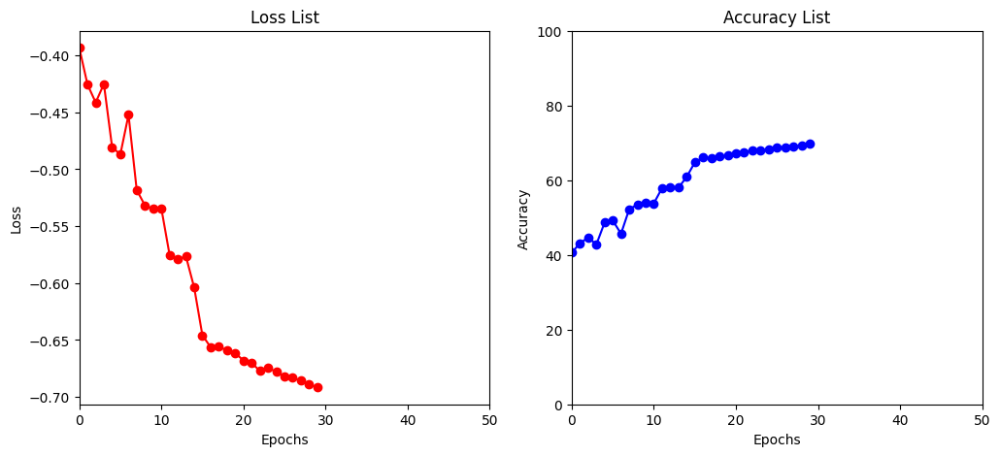

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.778781
Train Epoch: 31 [3840/50000 (8%)]	Loss: 1.774277
Train Epoch: 31 [7680/50000 (15%)]	Loss: 1.758767
Train Epoch: 31 [11520/50000 (23%)]	Loss: 1.691624
Train Epoch: 31 [15360/50000 (31%)]	Loss: 1.718074
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.751164
Train Epoch: 31 [23040/50000 (46%)]	Loss: 1.807875
Train Epoch: 31 [26880/50000 (54%)]	Loss: 1.823412
Train Epoch: 31 [30720/50000 (61%)]	Loss: 1.784857
Train Epoch: 31 [34560/50000 (69%)]	Loss: 1.755562
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.794714
Train Epoch: 31 [42240/50000 (84%)]	Loss: 1.733784
Train Epoch: 31 [46080/50000 (92%)]	Loss: 1.708725
Train Epoch: 31 [31200/50000 (100%)]	Loss: 1.751809

Test set: Average loss: -0.6955, Accuracy: 7001/10000 (70%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.729444
Train Epoch: 32 [3840/50000 (8%)]	Loss: 1.788400
Train Epoch: 32 [7680/50000 (15%)]	Loss: 1.815536
Train Epoch: 32 [11520/50000 (23%)]	Loss: 1.763598
Train Epoch: 32 [15360/50000 (31%)]

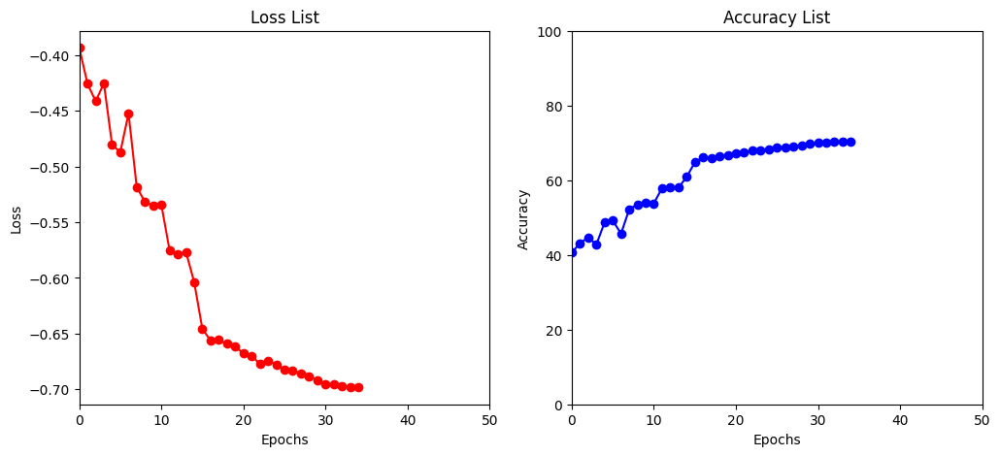

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.767278
Train Epoch: 36 [3840/50000 (8%)]	Loss: 1.730661
Train Epoch: 36 [7680/50000 (15%)]	Loss: 1.797860
Train Epoch: 36 [11520/50000 (23%)]	Loss: 1.779802
Train Epoch: 36 [15360/50000 (31%)]	Loss: 1.784019
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.737259
Train Epoch: 36 [23040/50000 (46%)]	Loss: 1.709207
Train Epoch: 36 [26880/50000 (54%)]	Loss: 1.759615
Train Epoch: 36 [30720/50000 (61%)]	Loss: 1.772808
Train Epoch: 36 [34560/50000 (69%)]	Loss: 1.767610
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.736764
Train Epoch: 36 [42240/50000 (84%)]	Loss: 1.832612
Train Epoch: 36 [46080/50000 (92%)]	Loss: 1.780128
Train Epoch: 36 [31200/50000 (100%)]	Loss: 1.765517

Test set: Average loss: -0.6998, Accuracy: 7047/10000 (70%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.818299
Train Epoch: 37 [3840/50000 (8%)]	Loss: 1.799606
Train Epoch: 37 [7680/50000 (15%)]	Loss: 1.738185
Train Epoch: 37 [11520/50000 (23%)]	Loss: 1.747628
Train Epoch: 37 [15360/50000 (31%)]

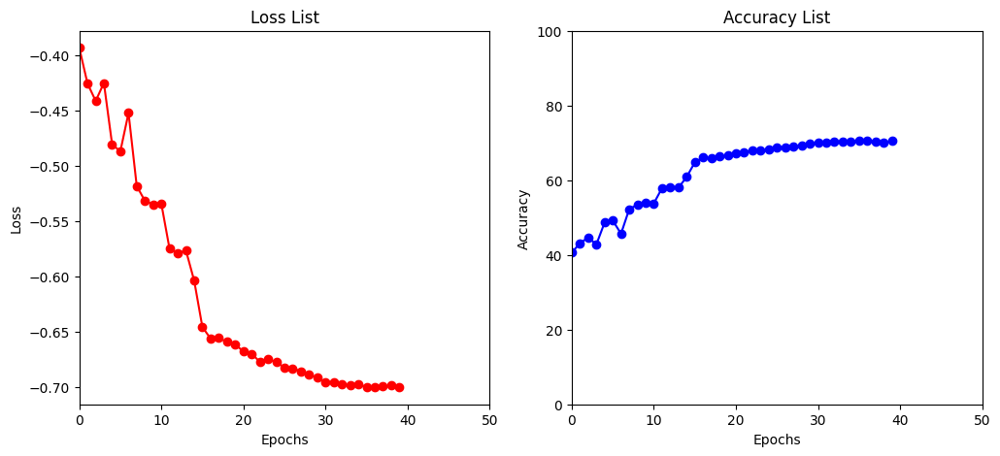

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.779796
Train Epoch: 41 [3840/50000 (8%)]	Loss: 1.763409
Train Epoch: 41 [7680/50000 (15%)]	Loss: 1.750500
Train Epoch: 41 [11520/50000 (23%)]	Loss: 1.715546
Train Epoch: 41 [15360/50000 (31%)]	Loss: 1.764220
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.731879
Train Epoch: 41 [23040/50000 (46%)]	Loss: 1.713185
Train Epoch: 41 [26880/50000 (54%)]	Loss: 1.781344
Train Epoch: 41 [30720/50000 (61%)]	Loss: 1.772016
Train Epoch: 41 [34560/50000 (69%)]	Loss: 1.729468
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.751124
Train Epoch: 41 [42240/50000 (84%)]	Loss: 1.738685
Train Epoch: 41 [46080/50000 (92%)]	Loss: 1.671199
Train Epoch: 41 [31200/50000 (100%)]	Loss: 1.719287

Test set: Average loss: -0.7021, Accuracy: 7067/10000 (71%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.728785
Train Epoch: 42 [3840/50000 (8%)]	Loss: 1.812593
Train Epoch: 42 [7680/50000 (15%)]	Loss: 1.805926
Train Epoch: 42 [11520/50000 (23%)]	Loss: 1.839707
Train Epoch: 42 [15360/50000 (31%)]

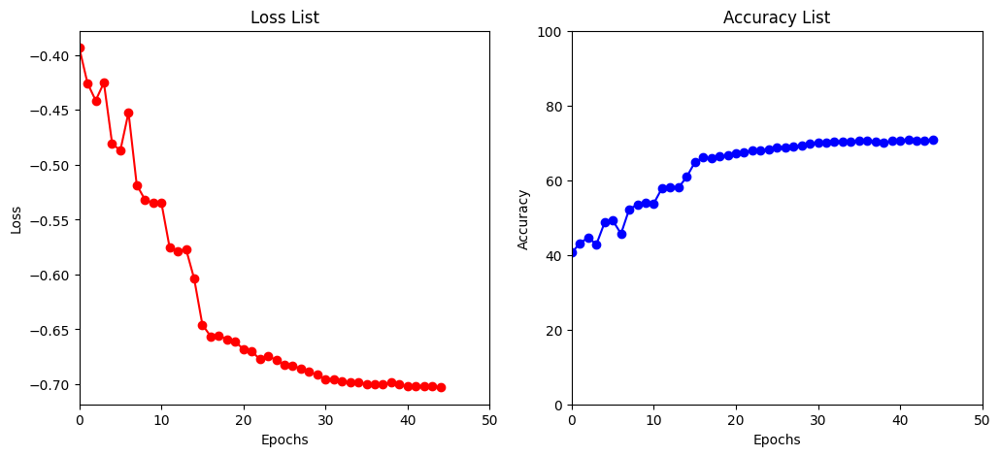

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.786590
Train Epoch: 46 [3840/50000 (8%)]	Loss: 1.725856
Train Epoch: 46 [7680/50000 (15%)]	Loss: 1.766711
Train Epoch: 46 [11520/50000 (23%)]	Loss: 1.726392
Train Epoch: 46 [15360/50000 (31%)]	Loss: 1.790664
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.756327
Train Epoch: 46 [23040/50000 (46%)]	Loss: 1.738657
Train Epoch: 46 [26880/50000 (54%)]	Loss: 1.823348
Train Epoch: 46 [30720/50000 (61%)]	Loss: 1.740708
Train Epoch: 46 [34560/50000 (69%)]	Loss: 1.700031
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.785544
Train Epoch: 46 [42240/50000 (84%)]	Loss: 1.779572
Train Epoch: 46 [46080/50000 (92%)]	Loss: 1.762468
Train Epoch: 46 [31200/50000 (100%)]	Loss: 1.825010

Test set: Average loss: -0.7012, Accuracy: 7054/10000 (71%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.768464
Train Epoch: 47 [3840/50000 (8%)]	Loss: 1.741713
Train Epoch: 47 [7680/50000 (15%)]	Loss: 1.686876
Train Epoch: 47 [11520/50000 (23%)]	Loss: 1.786238
Train Epoch: 47 [15360/50000 (31%)]

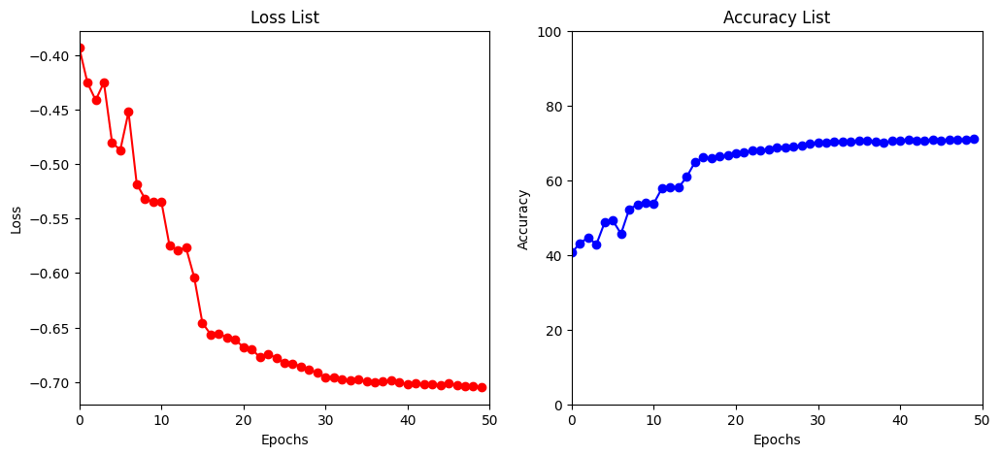

Traning and Testing total excution time is: 1796.352660894394 seconds 


In [ ]:
'''
(FN-22) FinalNet Trial 22 with Optimized Hyperparameters = 71%
'''


# Import and Prepares Plotting Functionality
import matplotlib.pyplot as plt
%matplotlib inline
loss_list = []
accuracy_list = []


# Define the class CNN FinalNet
class FinalNet(nn.Module):
    def __init__(self):
        super(FinalNet, self).__init__() 

        self.feature_extractor = nn.Sequential(  
            # Conv1 - 1        
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=11, stride=1, padding=5),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            # Conv2          
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # Conv3        
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # Conv4        
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # Conv5      
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # Max Pooling 1
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv6
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # Max Pooling 2
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv7
            nn.Conv2d(in_channels=256, out_channels=320, kernel_size=5, stride=1, padding=0),
            nn.ReLU(),
        )

        self.classifier = nn.Sequential(
            # FC Layer1
            nn.Linear(in_features=320, out_features=320),
            nn.ReLU(),
            nn.Dropout(0.4),
            # FC Layer2
            nn.Linear(in_features=320, out_features=128),
            nn.ReLU(),
            nn.Dropout(0.4),
            # FC Layer3
            nn.Linear(in_features=128, out_features=10),
        )
        
    def forward(self, x):  
        x = self.feature_extractor(x)
        x = torch.flatten(x, 1)
      
        # Pass Data to FC Layer
        logits = self.classifier(x)

        # Softmax Output
        out = F.softmax(logits, dim=1)
        return out


def train(model, device, train_loader, optimizer, epoch):
    # Set the Model into Training Mode
    model.train()
    count = 0
    
    # Define Loss Function 
    loss_Fn=nn.CrossEntropyLoss()
    
    # For Each Batch 
    for batch_idx, (data, target) in enumerate(train_loader)
        data, target = data.to(device), target.to(device)
        
        # Make Prediction
        Predict=model(data)

        # Calculate Loss
        loss=loss_Fn(Predict,target)

        # Optimize Parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 30 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
            

def test( model, device, test_loader):
  # Set the Model into Evaluation Mode 
    model.eval()
    test_loss = 0
    correct = 0

    # Calcuate Accuracy and Loss for Test Set Predictions
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            # Sum Up Batch Loss
            test_loss += F.nll_loss(output, target, reduction='sum').item()
            # Get the Index of the Max Log-Probability
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    # Print Accuracy and Loss for Epoch
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    # Record Accuracy and Loss for Epoch
    loss_list.append(test_loss)
    accuracy_list.append(100. * correct / len(test_loader.dataset))

    if (len(loss_list) % 5 == 0): 
      # Create Figure
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

      # Plot Loss
      ax1.plot(loss_list, 'r-o')
      ax1.set_title('Loss List')
      ax1.set_xlabel('Epochs')
      ax1.set_ylabel('Loss')
      ax1.set_xlim([0, 50])

      # Plot Accuracy
      ax2.plot(accuracy_list, 'b-o')
      ax2.set_title('Accuracy List')
      ax2.set_xlabel('Epochs')
      ax2.set_ylabel('Accuracy')
      ax2.set_xlim([0, 50])
      ax2.set_ylim([0, 100])

      # Display Plot
      plt.show()


time0 = time.time()

# Define Hyperparameters
batch_size = 128
epochs = 50
lr = 0.0002714620429950083
gamma = 0.12

# Training Settings
no_cuda = False
save_model = True
use_cuda = not no_cuda and torch.cuda.is_available()
torch.manual_seed(100)
device = torch.device("cuda" if use_cuda else "cpu")

# Create Training and Testing Set Loaders
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False)

# Define FinalNet Model
model = FinalNet().to(device)

# Initialize the Optimizer
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=5e-4)

# Define a Learning Rate Scheduler
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15, 30], gamma=gamma)

# Cycle Through Testing and Training for each Epoch
for epoch in range(1, epochs + 1):
    train( model, device, train_loader, optimizer, epoch)
    test( model, device, test_loader)
    scheduler.step()

# Save Model
if (save_model):
    torch.save(model.state_dict(),"cifar_FinalNet.pt")

# Print Results
time1 = time.time() 
print ('Traning and Testing total excution time is: %s seconds ' % (time1-time0))

This is the performance of FN-22 model. It had an accuracy of 71%. The trial had a learning rate of 0.0021206421108366574 and a batch size of 32. See graph below.

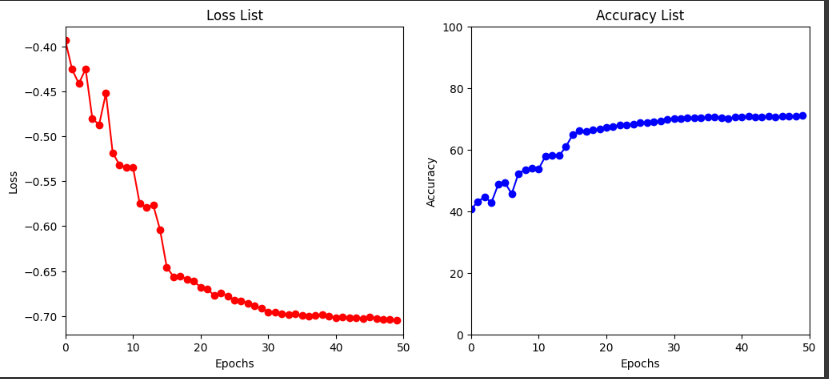

#Step 6 Change the Learning Rate Scheduler


##Change MultiStepLR to CosineAnnealingWarmRestarts

In [ ]:
scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-6)

As seen in Step 5, the model accuracy plateaus after epoch 20. To counter this, the search for different learning rate schedulers began. The result was CosineAnnealingWarmRestarts as the learning rate scheduler (Leonie 2020). It provides a smoother and more cyclic learning rate schedule. The cyclical nature allows for the ability to escape local minima that can impede future learning. Furthermore, the warm restarts allow faster solution space exploration, which may improve model performance. The result is the finalized version of FinalNet. 

#Performance of Model


Files already downloaded and verified
Files already downloaded and verified
Train Epoch: 1 [0/50000 (0%)]	Loss: 1.807716
Train Epoch: 1 [3840/50000 (8%)]	Loss: 1.801741
Train Epoch: 1 [7680/50000 (15%)]	Loss: 1.853859
Train Epoch: 1 [11520/50000 (23%)]	Loss: 1.845344
Train Epoch: 1 [15360/50000 (31%)]	Loss: 1.795407
Train Epoch: 1 [19200/50000 (38%)]	Loss: 1.826134
Train Epoch: 1 [23040/50000 (46%)]	Loss: 1.907008
Train Epoch: 1 [26880/50000 (54%)]	Loss: 1.832048
Train Epoch: 1 [30720/50000 (61%)]	Loss: 1.940094
Train Epoch: 1 [34560/50000 (69%)]	Loss: 1.851269
Train Epoch: 1 [38400/50000 (77%)]	Loss: 1.803684
Train Epoch: 1 [42240/50000 (84%)]	Loss: 1.828909
Train Epoch: 1 [46080/50000 (92%)]	Loss: 1.908402
Train Epoch: 1 [31200/50000 (100%)]	Loss: 1.861539

Test set: Average loss: -0.6070, Accuracy: 6111/10000 (61%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 1.815681
Train Epoch: 2 [3840/50000 (8%)]	Loss: 1.820723
Train Epoch: 2 [7680/50000 (15%)]	Loss: 1.830938
Train Epoch: 2 [11520/50000

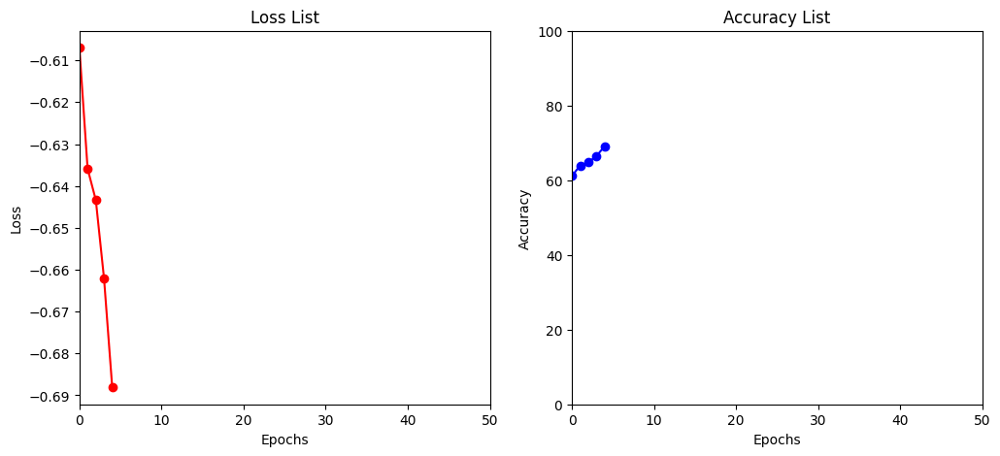

Train Epoch: 6 [0/50000 (0%)]	Loss: 1.793024
Train Epoch: 6 [3840/50000 (8%)]	Loss: 1.806767
Train Epoch: 6 [7680/50000 (15%)]	Loss: 1.755112
Train Epoch: 6 [11520/50000 (23%)]	Loss: 1.751611
Train Epoch: 6 [15360/50000 (31%)]	Loss: 1.681095
Train Epoch: 6 [19200/50000 (38%)]	Loss: 1.773343
Train Epoch: 6 [23040/50000 (46%)]	Loss: 1.801328
Train Epoch: 6 [26880/50000 (54%)]	Loss: 1.809444
Train Epoch: 6 [30720/50000 (61%)]	Loss: 1.723193
Train Epoch: 6 [34560/50000 (69%)]	Loss: 1.775381
Train Epoch: 6 [38400/50000 (77%)]	Loss: 1.752025
Train Epoch: 6 [42240/50000 (84%)]	Loss: 1.761348
Train Epoch: 6 [46080/50000 (92%)]	Loss: 1.765536
Train Epoch: 6 [31200/50000 (100%)]	Loss: 1.822536

Test set: Average loss: -0.7096, Accuracy: 7154/10000 (72%)

Train Epoch: 7 [0/50000 (0%)]	Loss: 1.831165
Train Epoch: 7 [3840/50000 (8%)]	Loss: 1.794437
Train Epoch: 7 [7680/50000 (15%)]	Loss: 1.792177
Train Epoch: 7 [11520/50000 (23%)]	Loss: 1.782688
Train Epoch: 7 [15360/50000 (31%)]	Loss: 1.804490
Tra

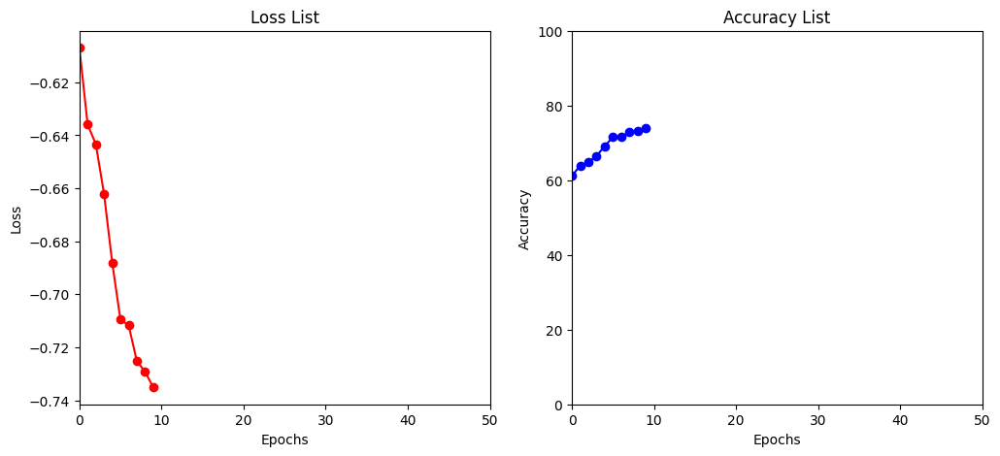

Train Epoch: 11 [0/50000 (0%)]	Loss: 1.703496
Train Epoch: 11 [3840/50000 (8%)]	Loss: 1.749588
Train Epoch: 11 [7680/50000 (15%)]	Loss: 1.768414
Train Epoch: 11 [11520/50000 (23%)]	Loss: 1.786786
Train Epoch: 11 [15360/50000 (31%)]	Loss: 1.757101
Train Epoch: 11 [19200/50000 (38%)]	Loss: 1.768974
Train Epoch: 11 [23040/50000 (46%)]	Loss: 1.832890
Train Epoch: 11 [26880/50000 (54%)]	Loss: 1.841827
Train Epoch: 11 [30720/50000 (61%)]	Loss: 1.775887
Train Epoch: 11 [34560/50000 (69%)]	Loss: 1.806448
Train Epoch: 11 [38400/50000 (77%)]	Loss: 1.766792
Train Epoch: 11 [42240/50000 (84%)]	Loss: 1.697430
Train Epoch: 11 [46080/50000 (92%)]	Loss: 1.757687
Train Epoch: 11 [31200/50000 (100%)]	Loss: 1.854774

Test set: Average loss: -0.6685, Accuracy: 6720/10000 (67%)

Train Epoch: 12 [0/50000 (0%)]	Loss: 1.867005
Train Epoch: 12 [3840/50000 (8%)]	Loss: 1.700401
Train Epoch: 12 [7680/50000 (15%)]	Loss: 1.758759
Train Epoch: 12 [11520/50000 (23%)]	Loss: 1.816285
Train Epoch: 12 [15360/50000 (31%)]

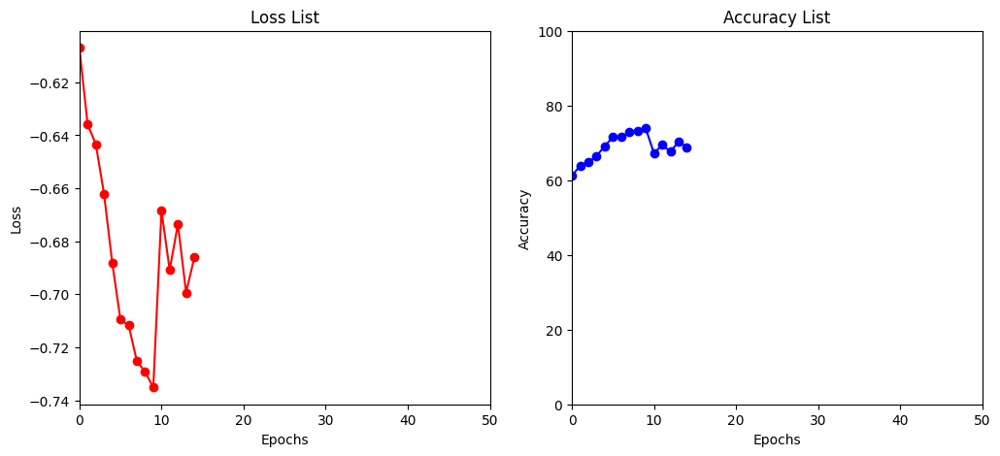

Train Epoch: 16 [0/50000 (0%)]	Loss: 1.797863
Train Epoch: 16 [3840/50000 (8%)]	Loss: 1.721072
Train Epoch: 16 [7680/50000 (15%)]	Loss: 1.785537
Train Epoch: 16 [11520/50000 (23%)]	Loss: 1.761084
Train Epoch: 16 [15360/50000 (31%)]	Loss: 1.748806
Train Epoch: 16 [19200/50000 (38%)]	Loss: 1.781985
Train Epoch: 16 [23040/50000 (46%)]	Loss: 1.699086
Train Epoch: 16 [26880/50000 (54%)]	Loss: 1.712413
Train Epoch: 16 [30720/50000 (61%)]	Loss: 1.759956
Train Epoch: 16 [34560/50000 (69%)]	Loss: 1.742401
Train Epoch: 16 [38400/50000 (77%)]	Loss: 1.746413
Train Epoch: 16 [42240/50000 (84%)]	Loss: 1.688989
Train Epoch: 16 [46080/50000 (92%)]	Loss: 1.829967
Train Epoch: 16 [31200/50000 (100%)]	Loss: 1.834379

Test set: Average loss: -0.6937, Accuracy: 6963/10000 (70%)

Train Epoch: 17 [0/50000 (0%)]	Loss: 1.633282
Train Epoch: 17 [3840/50000 (8%)]	Loss: 1.713702
Train Epoch: 17 [7680/50000 (15%)]	Loss: 1.757302
Train Epoch: 17 [11520/50000 (23%)]	Loss: 1.723159
Train Epoch: 17 [15360/50000 (31%)]

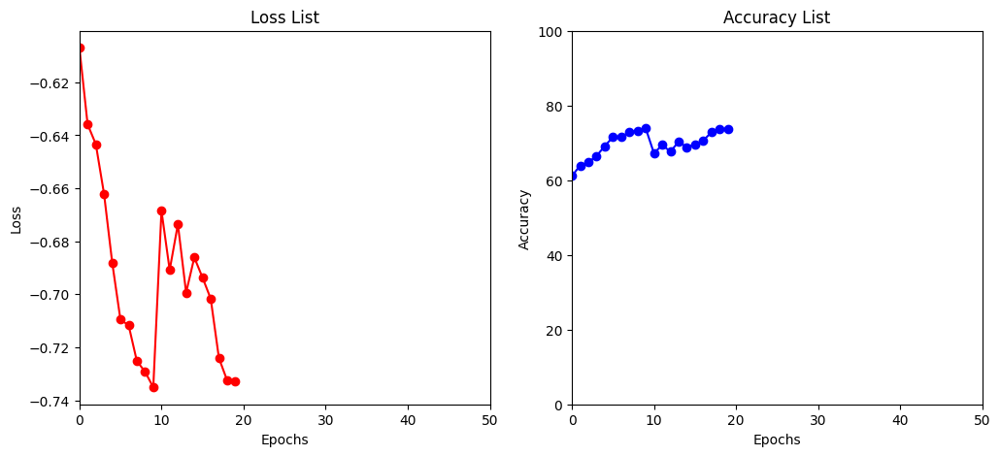

Train Epoch: 21 [0/50000 (0%)]	Loss: 1.666132
Train Epoch: 21 [3840/50000 (8%)]	Loss: 1.679842
Train Epoch: 21 [7680/50000 (15%)]	Loss: 1.740000
Train Epoch: 21 [11520/50000 (23%)]	Loss: 1.672832
Train Epoch: 21 [15360/50000 (31%)]	Loss: 1.683842
Train Epoch: 21 [19200/50000 (38%)]	Loss: 1.741384
Train Epoch: 21 [23040/50000 (46%)]	Loss: 1.654504
Train Epoch: 21 [26880/50000 (54%)]	Loss: 1.739257
Train Epoch: 21 [30720/50000 (61%)]	Loss: 1.691694
Train Epoch: 21 [34560/50000 (69%)]	Loss: 1.709115
Train Epoch: 21 [38400/50000 (77%)]	Loss: 1.683292
Train Epoch: 21 [42240/50000 (84%)]	Loss: 1.740941
Train Epoch: 21 [46080/50000 (92%)]	Loss: 1.707232
Train Epoch: 21 [31200/50000 (100%)]	Loss: 1.757560

Test set: Average loss: -0.7420, Accuracy: 7439/10000 (74%)

Train Epoch: 22 [0/50000 (0%)]	Loss: 1.719109
Train Epoch: 22 [3840/50000 (8%)]	Loss: 1.694475
Train Epoch: 22 [7680/50000 (15%)]	Loss: 1.704481
Train Epoch: 22 [11520/50000 (23%)]	Loss: 1.724379
Train Epoch: 22 [15360/50000 (31%)]

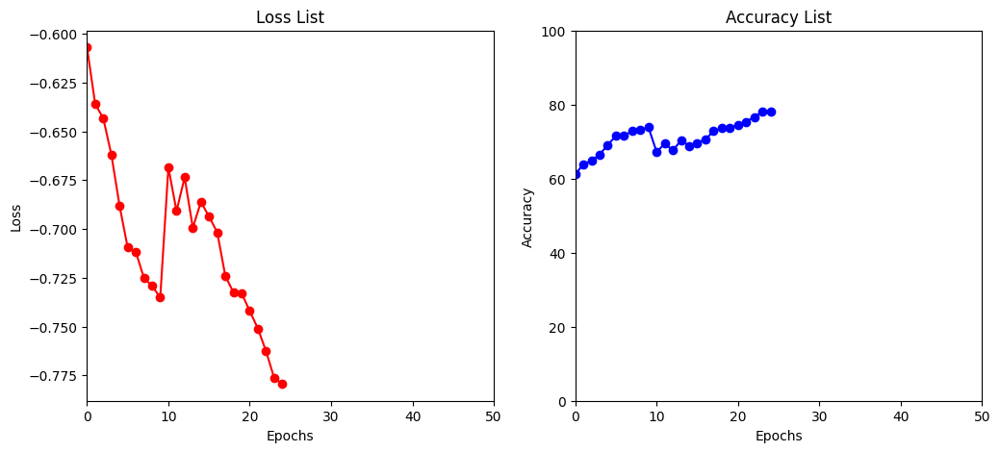

Train Epoch: 26 [0/50000 (0%)]	Loss: 1.702020
Train Epoch: 26 [3840/50000 (8%)]	Loss: 1.730621
Train Epoch: 26 [7680/50000 (15%)]	Loss: 1.703947
Train Epoch: 26 [11520/50000 (23%)]	Loss: 1.671654
Train Epoch: 26 [15360/50000 (31%)]	Loss: 1.703449
Train Epoch: 26 [19200/50000 (38%)]	Loss: 1.703528
Train Epoch: 26 [23040/50000 (46%)]	Loss: 1.730831
Train Epoch: 26 [26880/50000 (54%)]	Loss: 1.775044
Train Epoch: 26 [30720/50000 (61%)]	Loss: 1.735270
Train Epoch: 26 [34560/50000 (69%)]	Loss: 1.642266
Train Epoch: 26 [38400/50000 (77%)]	Loss: 1.645582
Train Epoch: 26 [42240/50000 (84%)]	Loss: 1.642033
Train Epoch: 26 [46080/50000 (92%)]	Loss: 1.658444
Train Epoch: 26 [31200/50000 (100%)]	Loss: 1.731921

Test set: Average loss: -0.7826, Accuracy: 7855/10000 (79%)

Train Epoch: 27 [0/50000 (0%)]	Loss: 1.682819
Train Epoch: 27 [3840/50000 (8%)]	Loss: 1.677018
Train Epoch: 27 [7680/50000 (15%)]	Loss: 1.620743
Train Epoch: 27 [11520/50000 (23%)]	Loss: 1.658028
Train Epoch: 27 [15360/50000 (31%)]

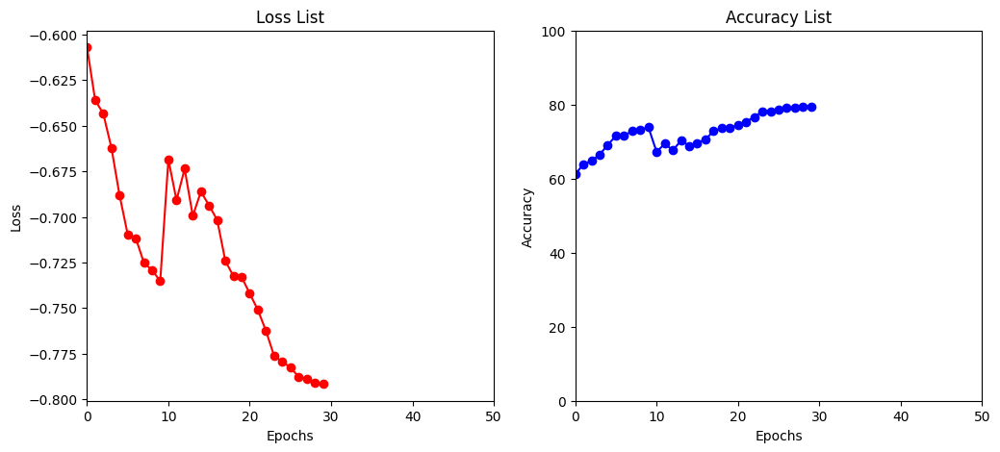

Train Epoch: 31 [0/50000 (0%)]	Loss: 1.728873
Train Epoch: 31 [3840/50000 (8%)]	Loss: 1.720888
Train Epoch: 31 [7680/50000 (15%)]	Loss: 1.675542
Train Epoch: 31 [11520/50000 (23%)]	Loss: 1.666418
Train Epoch: 31 [15360/50000 (31%)]	Loss: 1.718424
Train Epoch: 31 [19200/50000 (38%)]	Loss: 1.853405
Train Epoch: 31 [23040/50000 (46%)]	Loss: 1.767945
Train Epoch: 31 [26880/50000 (54%)]	Loss: 1.727348
Train Epoch: 31 [30720/50000 (61%)]	Loss: 1.679237
Train Epoch: 31 [34560/50000 (69%)]	Loss: 1.763720
Train Epoch: 31 [38400/50000 (77%)]	Loss: 1.780628
Train Epoch: 31 [42240/50000 (84%)]	Loss: 1.734081
Train Epoch: 31 [46080/50000 (92%)]	Loss: 1.673909
Train Epoch: 31 [31200/50000 (100%)]	Loss: 1.759097

Test set: Average loss: -0.7134, Accuracy: 7166/10000 (72%)

Train Epoch: 32 [0/50000 (0%)]	Loss: 1.721719
Train Epoch: 32 [3840/50000 (8%)]	Loss: 1.772082
Train Epoch: 32 [7680/50000 (15%)]	Loss: 1.716025
Train Epoch: 32 [11520/50000 (23%)]	Loss: 1.752605
Train Epoch: 32 [15360/50000 (31%)]

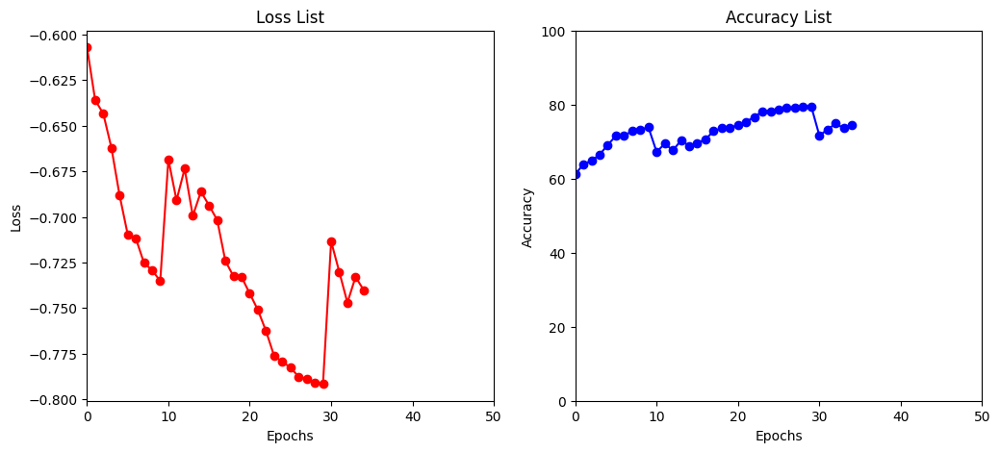

Train Epoch: 36 [0/50000 (0%)]	Loss: 1.712050
Train Epoch: 36 [3840/50000 (8%)]	Loss: 1.696505
Train Epoch: 36 [7680/50000 (15%)]	Loss: 1.805115
Train Epoch: 36 [11520/50000 (23%)]	Loss: 1.695710
Train Epoch: 36 [15360/50000 (31%)]	Loss: 1.754963
Train Epoch: 36 [19200/50000 (38%)]	Loss: 1.728644
Train Epoch: 36 [23040/50000 (46%)]	Loss: 1.681063
Train Epoch: 36 [26880/50000 (54%)]	Loss: 1.683371
Train Epoch: 36 [30720/50000 (61%)]	Loss: 1.752726
Train Epoch: 36 [34560/50000 (69%)]	Loss: 1.730679
Train Epoch: 36 [38400/50000 (77%)]	Loss: 1.673081
Train Epoch: 36 [42240/50000 (84%)]	Loss: 1.719329
Train Epoch: 36 [46080/50000 (92%)]	Loss: 1.709921
Train Epoch: 36 [31200/50000 (100%)]	Loss: 1.697756

Test set: Average loss: -0.7361, Accuracy: 7395/10000 (74%)

Train Epoch: 37 [0/50000 (0%)]	Loss: 1.702797
Train Epoch: 37 [3840/50000 (8%)]	Loss: 1.724066
Train Epoch: 37 [7680/50000 (15%)]	Loss: 1.760590
Train Epoch: 37 [11520/50000 (23%)]	Loss: 1.664849
Train Epoch: 37 [15360/50000 (31%)]

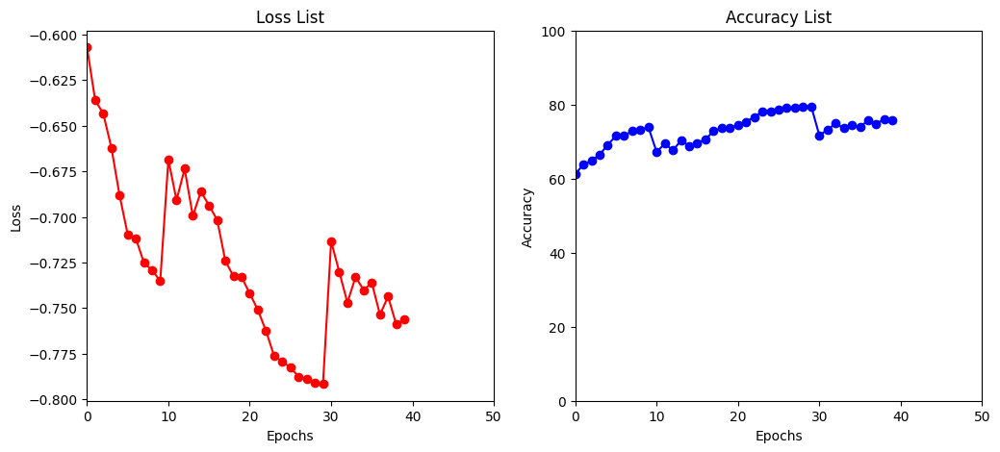

Train Epoch: 41 [0/50000 (0%)]	Loss: 1.718768
Train Epoch: 41 [3840/50000 (8%)]	Loss: 1.685777
Train Epoch: 41 [7680/50000 (15%)]	Loss: 1.690385
Train Epoch: 41 [11520/50000 (23%)]	Loss: 1.661559
Train Epoch: 41 [15360/50000 (31%)]	Loss: 1.709958
Train Epoch: 41 [19200/50000 (38%)]	Loss: 1.691607
Train Epoch: 41 [23040/50000 (46%)]	Loss: 1.701900
Train Epoch: 41 [26880/50000 (54%)]	Loss: 1.694212
Train Epoch: 41 [30720/50000 (61%)]	Loss: 1.746179
Train Epoch: 41 [34560/50000 (69%)]	Loss: 1.683795
Train Epoch: 41 [38400/50000 (77%)]	Loss: 1.702126
Train Epoch: 41 [42240/50000 (84%)]	Loss: 1.679890
Train Epoch: 41 [46080/50000 (92%)]	Loss: 1.731972
Train Epoch: 41 [31200/50000 (100%)]	Loss: 1.662269

Test set: Average loss: -0.7636, Accuracy: 7666/10000 (77%)

Train Epoch: 42 [0/50000 (0%)]	Loss: 1.631970
Train Epoch: 42 [3840/50000 (8%)]	Loss: 1.709874
Train Epoch: 42 [7680/50000 (15%)]	Loss: 1.718163
Train Epoch: 42 [11520/50000 (23%)]	Loss: 1.665841
Train Epoch: 42 [15360/50000 (31%)]

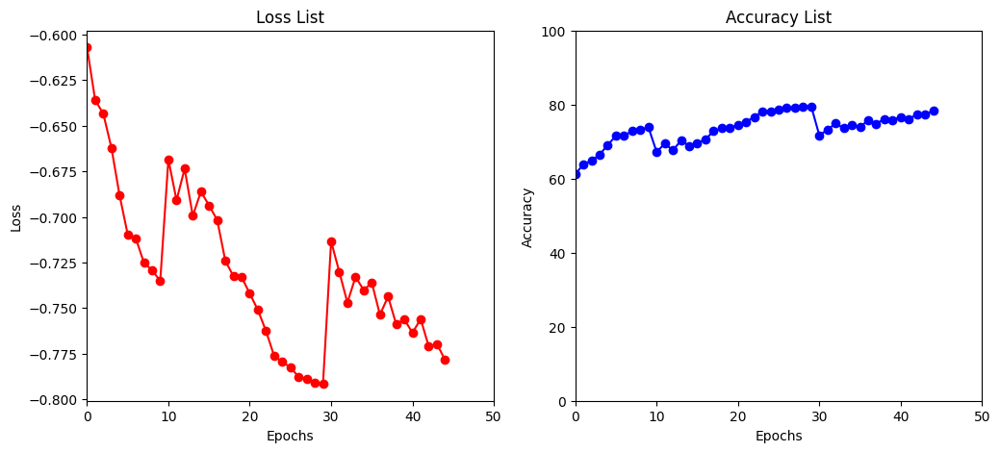

Train Epoch: 46 [0/50000 (0%)]	Loss: 1.638312
Train Epoch: 46 [3840/50000 (8%)]	Loss: 1.672368
Train Epoch: 46 [7680/50000 (15%)]	Loss: 1.656445
Train Epoch: 46 [11520/50000 (23%)]	Loss: 1.704096
Train Epoch: 46 [15360/50000 (31%)]	Loss: 1.743029
Train Epoch: 46 [19200/50000 (38%)]	Loss: 1.655578
Train Epoch: 46 [23040/50000 (46%)]	Loss: 1.645611
Train Epoch: 46 [26880/50000 (54%)]	Loss: 1.633512
Train Epoch: 46 [30720/50000 (61%)]	Loss: 1.698879
Train Epoch: 46 [34560/50000 (69%)]	Loss: 1.712573
Train Epoch: 46 [38400/50000 (77%)]	Loss: 1.660186
Train Epoch: 46 [42240/50000 (84%)]	Loss: 1.670212
Train Epoch: 46 [46080/50000 (92%)]	Loss: 1.674066
Train Epoch: 46 [31200/50000 (100%)]	Loss: 1.650479

Test set: Average loss: -0.7886, Accuracy: 7916/10000 (79%)

Train Epoch: 47 [0/50000 (0%)]	Loss: 1.707362
Train Epoch: 47 [3840/50000 (8%)]	Loss: 1.726488
Train Epoch: 47 [7680/50000 (15%)]	Loss: 1.692904
Train Epoch: 47 [11520/50000 (23%)]	Loss: 1.647376
Train Epoch: 47 [15360/50000 (31%)]

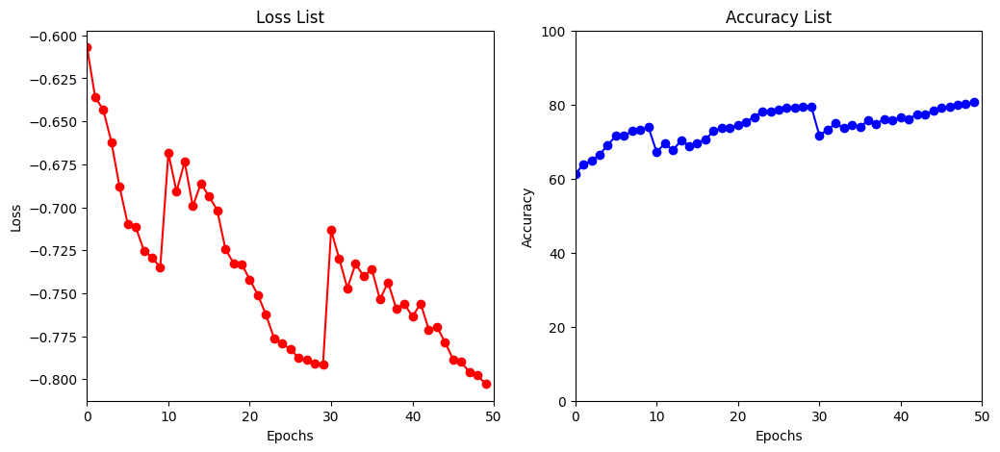

Training and Testing total excution time is: 1782.1694450378418 seconds 


In [ ]:
'''
(FN-Alpha) FinalNet Best Model with New Learning Rate Scheduler => 81%
'''


# Import and Prepares Plotting Functionality
import matplotlib.pyplot as plt
%matplotlib inline
loss_list = []
accuracy_list = []


# Define the class for the CNN FinalNet
class FinalNet(nn.Module):
    def __init__(self):
        super(FinalNet, self).__init__() 

        self.feature_extractor = nn.Sequential(  
            # Conv1       
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=11, stride=1, padding=5),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            # Conv2          
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # Conv3        
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # Conv4        
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # Conv5      
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, stride=1, padding=3),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # Max Pooling 1
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv6
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # Max Pooling 2
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            # Conv7
            nn.Conv2d(in_channels=256, out_channels=320, kernel_size=15, stride=1, padding=0),
            nn.ReLU(),
        )

        self.classifier = nn.Sequential(
            # FC Layer1
            nn.Linear(in_features=320, out_features=320),
            nn.ReLU(),
            nn.Dropout(0.5),
            # FC Layer2
            nn.Linear(in_features=320, out_features=128),
            nn.ReLU(),
            nn.Dropout(0.5),
            # FC Layer3
            nn.Linear(in_features=128, out_features=10),
        )
        
    def forward(self, x):
        x = self.feature_extractor(x)
        x = torch.flatten(x, 1)

        # Pass Data to FC Layer
        logits = self.classifier(x)

        # SoftMax Ouput
        out = F.softmax(logits, dim=1)
        return out


def train(model, device, train_loader, optimizer, epoch):
    # Set the Model into Training Mode 
    model.train()
    count = 0
    
    # Define Loss Function 
    loss_Fn=nn.CrossEntropyLoss()

    # For Each Batch 
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        # Make Prediction
        Predict=model(data)

        # Calculate Loss
        loss=loss_Fn(Predict,target)

        # Optimize Parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 30 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
            

def test( model, device, test_loader):
    # Set the Model into Evaluation Mode 
    model.eval()
    test_loss = 0
    correct = 0

    # Calcuate Accuracy and Loss for Test Set Predictions
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            # Sum Up Batch Loss
            test_loss += F.nll_loss(output, target, reduction='sum').item() 
            # Get the Index of the Max Log-Probability
            pred = output.argmax(dim=1, keepdim=True) 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    # Print Accuracy and Loss for Epoch
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    # Record Accuracy and Loss for Epoch
    loss_list.append(test_loss)
    accuracy_list.append(100. * correct / len(test_loader.dataset))

    if (len(loss_list) % 5 == 0): 
      # Create Figures
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

      # Plot Loss
      ax1.plot(loss_list, 'r-o')
      ax1.set_title('Loss List')
      ax1.set_xlabel('Epochs')
      ax1.set_ylabel('Loss')
      ax1.set_xlim([0, 50])

      # Plot Accuracy
      ax2.plot(accuracy_list, 'b-o')
      ax2.set_title('Accuracy List')
      ax2.set_xlabel('Epochs')
      ax2.set_ylabel('Accuracy')
      ax2.set_xlim([0, 50])
      ax2.set_ylim([0, 100])

      # Display Plots
      plt.show()


time0 = time.time()

# Define Hyperparameters
batch_size = 128
epochs = 50
lr = 0.0002714620429950083
weight_decay = 5e-4

# Training Settings
no_cuda = False
save_model = True
use_cuda = not no_cuda and torch.cuda.is_available()
torch.manual_seed(100)
device = torch.device("cuda" if use_cuda else "cpu")

# Create Training and Testing Set Loaders
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False)

# Define FinalNet Model
model = FinalNet().to(device)

# Initialize the Optimizer
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Define a Learning Rate Scheduler
scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-6)

# Cycle Through Testing and Training for each Epoch
for epoch in range(1, epochs + 1):
    train( model, device, train_loader, optimizer, epoch)
    test( model, device, test_loader)
    scheduler.step()

# Save Model
if (save_model):
    torch.save(model.state_dict(),"cifar_FinalNet.pt")

# Print Results
time1 = time.time() 
print ('Traning and Testing total excution time is: %s seconds ' % (time1-time0))

The Model was very successful seeing a jump in accuracy from 71% -> 81%.

Overall the performance of the model shows a clear improvement on previous models. The FN-Alpha model's cyclical learning rate will make large breakthroughs and slow progress. Also, the warm resets on the learning rate schedule cause the increase in loss and decrease in accuracy seen in epochs 10 and 30. I attribute most of the gains in performance due to the drop layers preventing the overfitting seen in YN-7, and the CosineAnnealingWarmRestarts learning rate scheduler preventing stagnant loss and accuracy due to plateau and local minima seen in FN-22. The initial accuracy after epoch 1 was a surprising 61% this could be attributed to the more extensive architecture and number of parameters seen in FN-22 and FN-Alpha compared to YN-7.


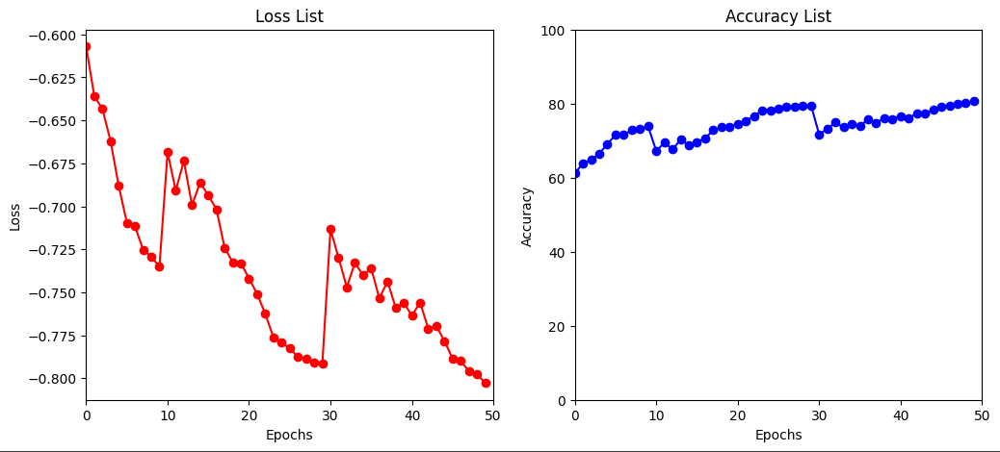

## Model Summary

The developed model is a CNN for image classification on the CIFAR-10 dataset called FinalNet. CIFAR-10 is a dataset that comprises 60,000 32 by 32 color images across ten different classes. The FinalNet architecture consists of a feature extractor and a classifier. The feature extractor contains a series of convolutional, batch normalization, and activation layers along with max-pooling layers. The classifier contains three fully connected layers with ReLU activations and dropout layers.
The code defines functions for the training and testing phases to train the model and initializes hyperparameters of a batch size of 128, epochs of 50, a learning rate of 0.0021206421108366574, and weight decay of 5e-4. The model is trained using the Adam optimizer and a learning rate scheduler of CosineAnnealingWarmRestarts. Finally, the model is trained and tested for each epoch, with the results recorded in lists for loss and accuracy. The model is saved at the end of the training process, and the loss and accuracy values for each epoch are plotted using matplotlib. The final predictive accuracy of the model is (8063/10000) 81%.